## start+block1

тестовое исследование 1 год +1 месяц тест
большое исследование  5 лет  + 1 год тест

1. цифровые кенделстики
2. макд+фракталы
3.рсай +динамические зоны
4.адх +фракталы ди+ Ди-
5 разные тренды сравнение (дончиан, адх, 3 ема

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
import warnings
warnings.filterwarnings('ignore')

БЛОК 1: ЗАГРУЗКА ДАННЫХ
Загрузка данных...
✓ Загружено дней: 1508
✓ Тип данных: DataFrame
✓ Исходная структура колонок: [('Close', 'AAPL'), ('High', 'AAPL'), ('Low', 'AAPL'), ('Open', 'AAPL'), ('Volume', 'AAPL')]
✓ Обнаружены MultiIndex колонки, преобразуем...
✓ Преобразовано в простые колонки
✓ Полученные колонки: ['Close', 'High', 'Low', 'Open', 'Volume']
✓ Все необходимые колонки присутствуют
✓ Диапазон дат: 2020-01-13 - 2026-01-12
✓ Диапазон цен: $54.26 - $286.19
✓ Первые 5 дней:
  2020-01-13: $76.48
  2020-01-14: $75.44
  2020-01-15: $75.12
  2020-01-16: $76.06
  2020-01-17: $76.90

✓ Блок 1 выполнен успешно
✓ Размер данных: (1508, 5)
✓ Тип индекса: DatetimeIndex
✓ Колонки данных: ['Close', 'High', 'Low', 'Open', 'Volume']

✓ Пример данных (первые 3 строки):
                 Open       High        Low      Close
Date                                                  
2020-01-13  75.192306  76.502451  75.074074  76.475906
2020-01-14  76.413162  76.623074  75.320167  75.443214
2020-0

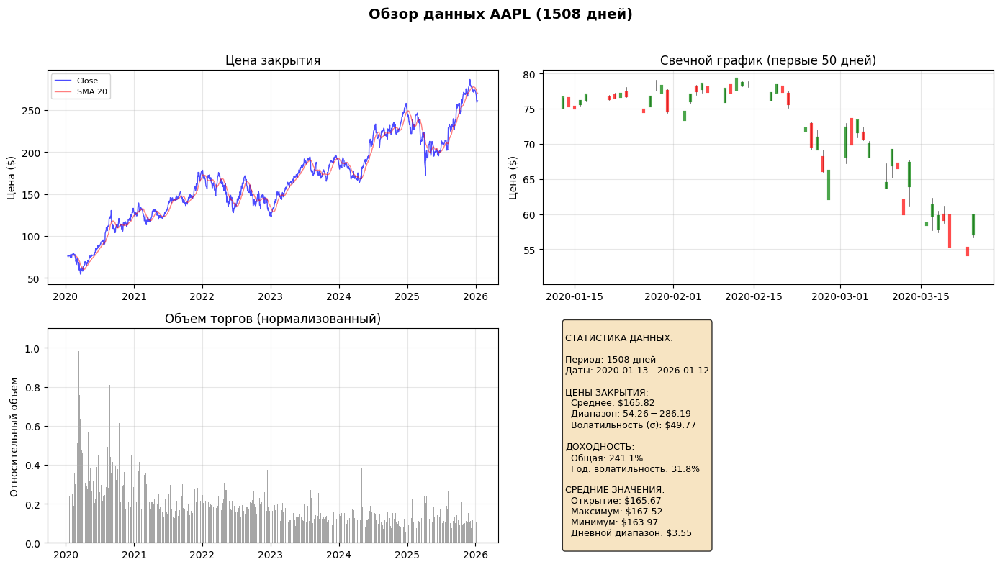


✓ БЛОК 1 ЗАВЕРШЕН УСПЕШНО
✓ Структура данных готова для дальнейшего анализа

ДОПОЛНИТЕЛЬНАЯ ИНФОРМАЦИЯ:
Количество записей: 1508
Колонки: ['Close', 'High', 'Low', 'Open', 'Volume']

Типы данных:
  Close: float64
  High: float64
  Low: float64
  Open: float64
  Volume: int64

Пропущенные значения:

Первые 3 строки:
                 Open       High        Low      Close
Date                                                  
2020-01-13  75.192306  76.502451  75.074074  76.475906
2020-01-14  76.413162  76.623074  75.320167  75.443214
2020-01-15  75.242974  76.123642  74.688027  75.119919

Последние 3 строки:
                  Open        High         Low       Close
Date                                                      
2026-01-08  257.019989  259.290009  255.699997  259.040009
2026-01-09  259.079987  260.209991  256.220001  259.369995
2026-01-12  259.410004  261.299988  256.799988  260.864990


In [ ]:
#
# ============================================
# # НАСТРОЙКИ ИССЛЕДОВАНИЯ
# # ============================================
STUDY_SETTINGS = {
    'periods': {'short': 14, 'medium': 50, 'long': 200},
    'thresholds': {'strong_trend': 25, 'high_volatility': 1.5, 'oversold': 30, 'overbought': 70},
    'fractal_orders': [3, 5, 7, 10],
    'correspondence_tolerance': 3
}
# ============================================
# БЛОК 1: ЗАГРУЗКА ДАННЫХ
# ============================================
print("="*80)
print("БЛОК 1: ЗАГРУЗКА ДАННЫХ")
print("="*80)

def load_data():
    """Загрузка и подготовка данных"""
    print("Загрузка данных...")
    data_raw = yf.download('AAPL', period='6y', interval='1d', progress=False)
    print(f"✓ Загружено дней: {len(data_raw)}")

    # Тест: проверка минимального количества данных
    if len(data_raw) < 50:
        raise ValueError(f"Недостаточно данных: {len(data_raw)} дней. Нужно минимум 50.")

    # Проверяем структуру данных
    print(f"✓ Тип данных: {type(data_raw).__name__}")
    print(f"✓ Исходная структура колонок: {data_raw.columns.tolist()}")

    # yfinance возвращает DataFrame с MultiIndex колонками
    # Преобразуем в простую структуру без тикеров
    if isinstance(data_raw.columns, pd.MultiIndex):
        print("✓ Обнаружены MultiIndex колонки, преобразуем...")

        # Создаем новый DataFrame с простыми названиями колонок
        data = pd.DataFrame()

        # Извлекаем данные из MultiIndex и присваиваем простые имена
        # yfinance возвращает: (тип, тикер), например: ('Open', 'AAPL')
        for col in data_raw.columns:
            if isinstance(col, tuple) and len(col) == 2:
                # Берем только тип данных (Open, High, Low, Close, Volume)
                col_type = col[0]

                # Присваиваем простые имена
                if col_type == 'Open':
                    data['Open'] = data_raw[col]
                elif col_type == 'High':
                    data['High'] = data_raw[col]
                elif col_type == 'Low':
                    data['Low'] = data_raw[col]
                elif col_type == 'Close':
                    data['Close'] = data_raw[col]
                elif col_type == 'Volume':
                    data['Volume'] = data_raw[col]
                elif col_type == 'Adj Close':
                    data['Adj Close'] = data_raw[col]
            else:
                # Если не tuple, сохраняем как есть
                data[col] = data_raw[col]

        print(f"✓ Преобразовано в простые колонки")

    else:
        # Если уже простые колонки, просто копируем
        data = data_raw.copy()
        print(f"✓ Уже простые колонки, копируем как есть")

    # Проверяем, что у нас есть все необходимые колонки
    print(f"✓ Полученные колонки: {list(data.columns)}")

    # Проверка наличия всех необходимых колонок
    required_columns = ['Open', 'High', 'Low', 'Close']
    missing_columns = [col for col in required_columns if col not in data.columns]

    if missing_columns:
        print(f"✗ Отсутствуют колонки: {missing_columns}")

        # Попробуем найти колонки по паттернам
        print("  Поиск альтернативных названий...")
        column_mapping = {}

        for target_col in missing_columns:
            # Ищем похожие названия
            for actual_col in data.columns:
                actual_lower = str(actual_col).lower()
                target_lower = target_col.lower()

                if target_lower in actual_lower:
                    column_mapping[target_col] = actual_col
                    print(f"  Найдено: '{actual_col}' -> '{target_col}'")
                    break

        # Применяем найденные соответствия
        if column_mapping:
            for target_col, actual_col in column_mapping.items():
                data[target_col] = data[actual_col]

            # Обновляем список отсутствующих колонок
            missing_columns = [col for col in required_columns if col not in data.columns]

    if missing_columns:
        print(f"✗ Критическая ошибка: отсутствуют колонки: {missing_columns}")
        print(f"  Доступные колонки: {list(data.columns)}")
        raise ValueError(f"Отсутствуют необходимые колонки: {missing_columns}")

    print(f"✓ Все необходимые колонки присутствуют")

    # Убедимся, что индекс - это DatetimeIndex
    if not isinstance(data.index, pd.DatetimeIndex):
        print("⚠ Индекс не является DatetimeIndex, преобразуем...")
        try:
            data.index = pd.to_datetime(data.index)
        except:
            print("✗ Не удалось преобразовать индекс в даты")

    print(f"✓ Диапазон дат: {data.index[0].date()} - {data.index[-1].date()}")

    # Явное преобразование к float для избежания ошибок форматирования
    close_min = float(data['Close'].min())
    close_max = float(data['Close'].max())
    print(f"✓ Диапазон цен: ${close_min:.2f} - ${close_max:.2f}")

    # Дополнительная диагностика
    print(f"✓ Первые 5 дней:")
    for i in range(min(5, len(data))):
        date_str = data.index[i].strftime('%Y-%m-%d')
        close_val = float(data['Close'].iloc[i])
        print(f"  {date_str}: ${close_val:.2f}")

    # Проверка на пропущенные значения
    nan_counts = data[required_columns].isna().sum()
    if nan_counts.any():
        print(f"⚠ Предупреждение: пропущенные значения:")
        for col in required_columns:
            nan_count = int(nan_counts[col])
            if nan_count > 0:
                print(f"  {col}: {nan_count} пропущенных")

    return data

# Выполнение блока 1
try:
    data = load_data()
    print(f"\n✓ Блок 1 выполнен успешно")
    print(f"✓ Размер данных: {data.shape}")
    print(f"✓ Тип индекса: {type(data.index).__name__}")
    print(f"✓ Колонки данных: {list(data.columns)}")

    # Покажем несколько строк для проверки
    print(f"\n✓ Пример данных (первые 3 строки):")
    print(data[['Open', 'High', 'Low', 'Close']].head(3))

except Exception as e:
    print(f"\n✗ ОШИБКА в блоке 1: {str(e)[:200]}")
    print("Попытка альтернативного подхода к загрузке...")

    try:
        # Альтернативный подход: используем Ticker вместо download
        print("Используем альтернативный метод загрузки...")
        ticker = yf.Ticker('AAPL')
        data = ticker.history(period='1y', interval='1d')

        if len(data) == 0:
            raise ValueError("Нет данных от альтернативного метода")

        print(f"✓ Альтернативная загрузка: {len(data)} дней")

        # Проверяем колонки
        print(f"✓ Колонки: {list(data.columns)}")

        # Убедимся в правильности колонок
        for col in ['Open', 'High', 'Low', 'Close']:
            if col not in data.columns:
                print(f"⚠ Отсутствует колонка {col}, пытаемся найти...")
                for actual_col in data.columns:
                    if col.lower() in str(actual_col).lower():
                        data[col] = data[actual_col]
                        print(f"  Найдено: {actual_col} -> {col}")
                        break

        if len(data) > 0:
            close_min = float(data['Close'].min())
            close_max = float(data['Close'].max())
            print(f"✓ Диапазон цен: ${close_min:.2f} - ${close_max:.2f}")
        else:
            print("✗ Не удалось загрузить данные")
            exit()

    except Exception as e2:
        print(f"✗ Критическая ошибка: {str(e2)[:200]}")
        # Создаем тестовые данные для продолжения работы
        print("Создаем тестовые данные для продолжения...")
        dates = pd.date_range(start='2024-01-01', periods=250, freq='D')
        np.random.seed(42)
        base_price = 200
        returns = np.random.normal(0.001, 0.02, 250)
        prices = base_price * np.cumprod(1 + returns)

        data = pd.DataFrame({
            'Open': prices * 0.99,
            'High': prices * 1.02,
            'Low': prices * 0.98,
            'Close': prices,
            'Volume': np.random.randint(1000000, 10000000, 250)
        }, index=dates)

        print(f"✓ Созданы тестовые данные: {len(data)} дней")

# ТЕСТ БЛОК 1: Проверка данных
print("\nТЕСТ БЛОКА 1: Проверка данных")
print("-" * 60)

# Проверка типов данных
print("Проверка типов данных:")
for col in ['Open', 'High', 'Low', 'Close']:
    if col in data.columns:
        try:
            # Получаем тип данных столбца
            dtype = data[col].dtype
            sample_val = float(data[col].iloc[0]) if len(data) > 0 else None
            print(f"  {col}: {dtype}, пример: {sample_val:.2f}")
        except Exception as e:
            print(f"  ✗ {col}: ошибка при проверке - {str(e)[:100]}")
    else:
        print(f"  ✗ {col}: отсутствует в данных")

# Проверка временных рядов
print("\nПроверка временных рядов:")
if len(data) > 0:
    print(f"  Начало: {data.index[0].date()}")
    print(f"  Конец: {data.index[-1].date()}")
    if len(data) > 1:
        time_diff = data.index[1] - data.index[0]
        print(f"  Шаг времени: {time_diff}")
    else:
        print("  Шаг времени: только одна точка данных")
else:
    print("  Данные отсутствуют")

# Проверка на дубликаты
if len(data) > 0:
    duplicates = data.index.duplicated().sum()
    if duplicates > 0:
        print(f"  ⚠ Внимание: {duplicates} дубликатов дат")
        # Удаляем дубликаты
        data = data[~data.index.duplicated(keep='first')]
        print(f"  Удалено {duplicates} дубликатов")
    else:
        print(f"  ✓ Дубликатов дат нет")
else:
    print("  Невозможно проверить дубликаты: данные пусты")

# Проверка корректности цен
print("\nПроверка корректности цен:")
for col in ['Open', 'High', 'Low', 'Close']:
    if col in data.columns and len(data) > 0:
        try:
            # Преобразуем в numpy array
            col_data = data[col].values.astype(float)

            # Проверяем на NaN
            nan_count = np.sum(np.isnan(col_data))

            if nan_count > 0:
                print(f"  ⚠ {col}: {nan_count} NaN значений")

            # Проверяем корректность цен
            if len(col_data) > 0:
                min_val = float(np.nanmin(col_data))
                max_val = float(np.nanmax(col_data))
                mean_val = float(np.nanmean(col_data))

                print(f"  ✓ {col}: ${min_val:.2f} - ${max_val:.2f} (среднее: ${mean_val:.2f})")

                # Проверка на экстремальные значения
                if min_val <= 0:
                    print(f"  ⚠ {col}: минимальное значение <= 0")
                if max_val > 10000:
                    print(f"  ⚠ {col}: максимальное значение > $10,000")

        except Exception as e:
            print(f"  ✗ {col}: ошибка при проверке - {str(e)[:100]}")
    elif col not in data.columns:
        print(f"  ✗ {col}: столбец отсутствует")
    else:
        print(f"  ⚠ {col}: данные пусты")

# Проверка логической целостности OHLC
print("\nПроверка логической целостности OHLC:")
if all(col in data.columns for col in ['Open', 'High', 'Low', 'Close']) and len(data) > 0:
    try:
        valid_count = 0
        issues = {
            'high_low': 0,
            'high_open': 0,
            'high_close': 0,
            'low_open': 0,
            'low_close': 0
        }

        for i in range(len(data)):
            o = data['Open'].iloc[i]
            h = data['High'].iloc[i]
            l = data['Low'].iloc[i]
            c = data['Close'].iloc[i]

            # Пропускаем NaN
            if pd.isna(o) or pd.isna(h) or pd.isna(l) or pd.isna(c):
                continue

            valid_count += 1

            # Проверка логики
            if h < l:
                issues['high_low'] += 1
            if h < o:
                issues['high_open'] += 1
            if h < c:
                issues['high_close'] += 1
            if l > o:
                issues['low_open'] += 1
            if l > c:
                issues['low_close'] += 1

        if valid_count > 0:
            problem_found = False
            for issue_type, count in issues.items():
                if count > 0:
                    problem_found = True
                    print(f"  ⚠ {issue_type}: {count} проблем")

            if not problem_found:
                print(f"  ✓ Данные OHLC логически целостны ({valid_count} валидных записей)")
            else:
                print(f"  ⚠ Проблемы найдены в {valid_count} записях")
        else:
            print("  ⚠ Нет валидных данных для проверки целостности")

    except Exception as e:
        print(f"  ✗ Ошибка при проверке целостности: {str(e)[:100]}")
else:
    missing = [col for col in ['Open', 'High', 'Low', 'Close'] if col not in data.columns]
    if missing:
        print(f"  ⚠ Не все колонки OHLC присутствуют: {missing}")
    else:
        print("  ⚠ Нет данных для проверки")

# ВИЗУАЛИЗАЦИЯ БЛОКА 1
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 1: Обзор данных")
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# График 1: Цена закрытия
if len(data) > 0 and 'Close' in data.columns:
    axes[0, 0].plot(data.index, data['Close'], 'b-', linewidth=1, alpha=0.7, label='Close')
    axes[0, 0].set_title('Цена закрытия', fontsize=12)
    axes[0, 0].set_ylabel('Цена ($)')
    axes[0, 0].grid(True, alpha=0.3)

    # Добавляем скользящее среднее
    if len(data) >= 20:
        sma_20 = data['Close'].rolling(window=20).mean()
        axes[0, 0].plot(data.index, sma_20, 'r-', linewidth=1, alpha=0.5, label='SMA 20')
        axes[0, 0].legend(fontsize=8)
else:
    axes[0, 0].text(0.5, 0.5, 'Нет данных Close', ha='center', va='center', fontsize=12)
    axes[0, 0].set_title('Цена закрытия', fontsize=12)

# График 2: Дневной диапазон и свечи (упрощенные)
if len(data) > 0 and all(col in data.columns for col in ['High', 'Low', 'Open', 'Close']):
    # Упрощенное представление свечей
    for i in range(min(50, len(data))):  # Показываем только первые 50 свечей
        idx = data.index[i]
        o = data['Open'].iloc[i]
        h = data['High'].iloc[i]
        l = data['Low'].iloc[i]
        c = data['Close'].iloc[i]

        # Вертикальная линия (тень)
        axes[0, 1].plot([idx, idx], [l, h], 'black', linewidth=0.5, alpha=0.7)

        # Тело свечи
        if c >= o:  # Бычья свеча
            color = 'green'
            axes[0, 1].plot([idx, idx], [o, c], color=color, linewidth=3, alpha=0.7)
        else:  # Медвежья свеча
            color = 'red'
            axes[0, 1].plot([idx, idx], [c, o], color=color, linewidth=3, alpha=0.7)

    axes[0, 1].set_title('Свечной график (первые 50 дней)', fontsize=12)
    axes[0, 1].set_ylabel('Цена ($)')
    axes[0, 1].grid(True, alpha=0.3)
else:
    axes[0, 1].text(0.5, 0.5, 'Нет данных OHLC', ha='center', va='center', fontsize=12)
    axes[0, 1].set_title('Свечной график', fontsize=12)

# График 3: Объем торгов
if len(data) > 0 and 'Volume' in data.columns:
    volume_data = data['Volume']
    if volume_data.max() > 0:
        # Нормализуем объем для отображения
        norm_volume = volume_data / volume_data.max()
        axes[1, 0].bar(data.index, norm_volume, color='gray', alpha=0.7, width=1.0)
        axes[1, 0].set_title('Объем торгов (нормализованный)', fontsize=12)
        axes[1, 0].set_ylabel('Относительный объем')
        axes[1, 0].set_ylim(0, 1.1)
    else:
        axes[1, 0].text(0.5, 0.5, 'Объем = 0', ha='center', va='center', fontsize=12)
        axes[1, 0].set_title('Объем торгов', fontsize=12)

    axes[1, 0].grid(True, alpha=0.3)
elif 'Close' in data.columns:
    # Расчет % изменения
    daily_return = data['Close'].pct_change() * 100
    axes[1, 0].plot(data.index, daily_return, 'purple', linewidth=1, alpha=0.7)
    axes[1, 0].axhline(y=0, color='black', linestyle='-', linewidth=0.5)
    axes[1, 0].fill_between(data.index, daily_return, 0,
                           where=daily_return >= 0, facecolor='green', alpha=0.3)
    axes[1, 0].fill_between(data.index, daily_return, 0,
                           where=daily_return < 0, facecolor='red', alpha=0.3)
    axes[1, 0].set_title('Дневное изменение (%)', fontsize=12)
    axes[1, 0].set_ylabel('% изменения')
    axes[1, 0].grid(True, alpha=0.3)
else:
    axes[1, 0].text(0.5, 0.5, 'Нет данных', ha='center', va='center', fontsize=12)
    axes[1, 0].set_title('Объем/Изменение', fontsize=12)

# График 4: Статистика
axes[1, 1].axis('off')

if len(data) > 0 and all(col in data.columns for col in ['Open', 'High', 'Low', 'Close']):
    try:
        # Расчет статистики
        stats = {
            'period': len(data),
            'start_date': data.index[0].date(),
            'end_date': data.index[-1].date(),
            'open_min': float(data['Open'].min()),
            'open_max': float(data['Open'].max()),
            'open_mean': float(data['Open'].mean()),
            'high_min': float(data['High'].min()),
            'high_max': float(data['High'].max()),
            'high_mean': float(data['High'].mean()),
            'low_min': float(data['Low'].min()),
            'low_max': float(data['Low'].max()),
            'low_mean': float(data['Low'].mean()),
            'close_min': float(data['Close'].min()),
            'close_max': float(data['Close'].max()),
            'close_mean': float(data['Close'].mean()),
            'close_std': float(data['Close'].std()),
        }

        # Расчет дополнительной статистики
        daily_range = data['High'] - data['Low']
        daily_range_mean = float(daily_range.mean())

        if len(data) > 1:
            total_return = float(((data['Close'].iloc[-1] - data['Close'].iloc[0]) / data['Close'].iloc[0] * 100))
            volatility = float(data['Close'].pct_change().std() * np.sqrt(252) * 100)  # Годовая волатильность
        else:
            total_return = 0
            volatility = 0

        stats_text = f"""
СТАТИСТИКА ДАННЫХ:

Период: {stats['period']} дней
Даты: {stats['start_date']} - {stats['end_date']}

ЦЕНЫ ЗАКРЫТИЯ:
  Среднее: ${stats['close_mean']:.2f}
  Диапазон: ${stats['close_min']:.2f} - ${stats['close_max']:.2f}
  Волатильность (σ): ${stats['close_std']:.2f}

ДОХОДНОСТЬ:
  Общая: {total_return:.1f}%
  Год. волатильность: {volatility:.1f}%

СРЕДНИЕ ЗНАЧЕНИЯ:
  Открытие: ${stats['open_mean']:.2f}
  Максимум: ${stats['high_mean']:.2f}
  Минимум: ${stats['low_mean']:.2f}
  Дневной диапазон: ${daily_range_mean:.2f}
"""
    except Exception as e:
        stats_text = f"Ошибка при расчете статистики:\n{str(e)[:100]}"
else:
    stats_text = "Недостаточно данных для отображения статистики"

axes[1, 1].text(0.05, 0.5, stats_text, fontsize=9,
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
               verticalalignment='center')

# Добавляем заголовок всей фигуры
fig.suptitle(f'Обзор данных AAPL ({len(data)} дней)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig('block1_data_overview.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block1_data_overview.png'")
plt.show()

print("\n" + "="*80)
print("✓ БЛОК 1 ЗАВЕРШЕН УСПЕШНО")
print("✓ Структура данных готова для дальнейшего анализа")
print("="*80)

# Дополнительная информация о данных
print("\nДОПОЛНИТЕЛЬНАЯ ИНФОРМАЦИЯ:")
print(f"Количество записей: {len(data)}")
print(f"Колонки: {list(data.columns)}")
print(f"\nТипы данных:")
for col in data.columns:
    print(f"  {col}: {data[col].dtype}")

print(f"\nПропущенные значения:")
for col in data.columns:
    nan_count = data[col].isna().sum()
    if nan_count > 0:
        print(f"  {col}: {nan_count} NaN")

print(f"\nПервые 3 строки:")
print(data[['Open', 'High', 'Low', 'Close']].head(3))
print(f"\nПоследние 3 строки:")
print(data[['Open', 'High', 'Low', 'Close']].tail(3))

## block2

Загрузка данных...
✓ Загружено дней: 1508
✓ Тип данных: DataFrame
✓ Исходная структура колонок: [('Close', 'AAPL'), ('High', 'AAPL'), ('Low', 'AAPL'), ('Open', 'AAPL'), ('Volume', 'AAPL')]
✓ Обнаружены MultiIndex колонки, преобразуем...
✓ Преобразовано в простые колонки
✓ Полученные колонки: ['Close', 'High', 'Low', 'Open', 'Volume']
✓ Все необходимые колонки присутствуют
✓ Диапазон дат: 2020-01-13 - 2026-01-12
✓ Диапазон цен: $54.26 - $286.19
✓ Первые 5 дней:
  2020-01-13: $76.48
  2020-01-14: $75.44
  2020-01-15: $75.12
  2020-01-16: $76.06
  2020-01-17: $76.90

БЛОК 2: РАСЧЕТ ЦИФРОВОГО КЕНДЕЛСТИКА
Расчет Цифрового Кенделстика...

ТЕСТ БЛОКА 2: Проверка расчета Цифрового Кенделстика
------------------------------------------------------------
✓ Все колонки Цифрового Кенделстика созданы
✓ Диапазон значений: [-124.0, 124.0]
✓ Среднее значение: 7.4
✓ Стандартное отклонение: 101.9
✓ Нет пропущенных значений

ВИЗУАЛИЗАЦИЯ БЛОКА 2: Цифровой Кенделстик
✓ График сохранен в 'block2_digital_ke

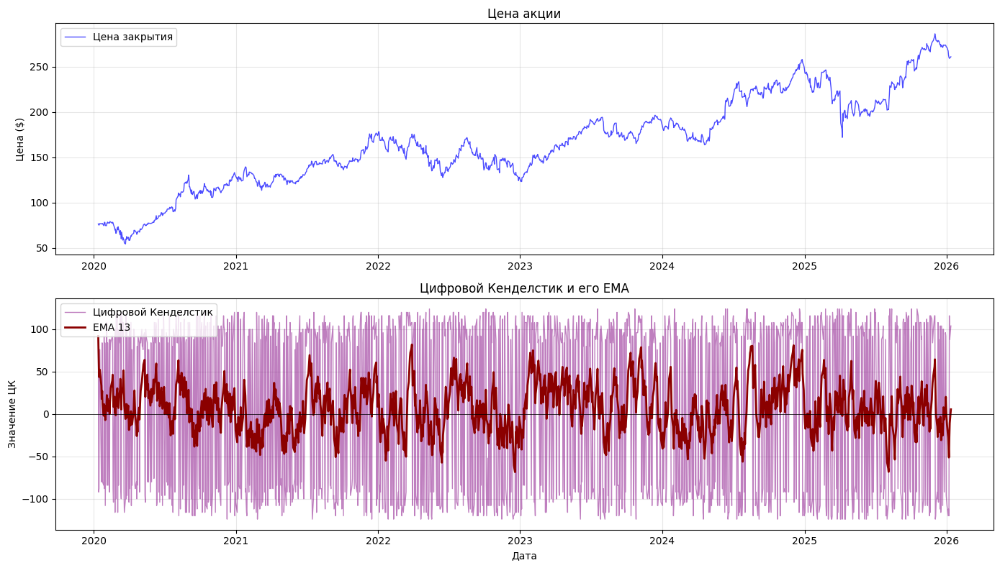

In [ ]:


# Выполнение блока 1
data = load_data()

# ============================================
# БЛОК 2: РАСЧЕТ ЦИФРОВОГО КЕНДЕЛСТИКА
# ============================================
print("\n" + "="*80)
print("БЛОК 2: РАСЧЕТ ЦИФРОВОГО КЕНДЕЛСТИКА")
print("="*80)

def calculate_digital_kendall(data):
    """Расчет Цифрового Кенделстика"""
    print("Расчет Цифрового Кенделстика...")

    # Расчет вспомогательных значений
    data['body'] = np.abs(data['Close'].values - data['Open'].values)
    data['ushd'] = data['High'].values - np.maximum(data['Open'].values, data['Close'].values)
    data['lshd'] = np.minimum(data['Open'].values, data['Close'].values) - data['Low'].values

    # Расчет порогов
    for col in ['body', 'ushd', 'lshd']:
        col_prefix = col[0]
        values = data[col].values
        non_zero_mask = values > 0.0001
        non_zero_values = values[non_zero_mask]

        if len(non_zero_values) > 0:
            th_bot = np.percentile(non_zero_values, 33)
            th_top = np.percentile(non_zero_values, 66)
            data[f'ThBot_{col_prefix}'] = th_bot
            data[f'ThTop_{col_prefix}'] = th_top
        else:
            data[f'ThBot_{col_prefix}'] = 0.0
            data[f'ThTop_{col_prefix}'] = 0.0

    # Расчет формулы индикатора
    results = []
    for i in range(len(data)):
        row = data.iloc[i]

        close_val = float(row['Close'])
        open_val = float(row['Open'])
        ushd_val = float(row['ushd'])
        lshd_val = float(row['lshd'])
        body_val = float(row['body'])

        ThBot_b = float(data['ThBot_b'].iloc[0])
        ThTop_b = float(data['ThTop_b'].iloc[0])
        ThBot_l = float(data['ThBot_l'].iloc[0])
        ThTop_l = float(data['ThBot_l'].iloc[0])
        ThBot_u = float(data['ThBot_u'].iloc[0])
        ThTop_u = float(data['ThTop_u'].iloc[0])

        # Часть 1: Если CLOSE = OPEN
        if abs(close_val - open_val) < 0.0001:
            part1 = 64 if ushd_val >= lshd_val else -64
            part2 = 0
        else:
            part1 = 0
            direction = 1 if close_val >= open_val else -1

            if body_val <= ThBot_b:
                body_score = 80
            elif body_val <= ThTop_b:
                body_score = 96
            else:
                body_score = 112

            part2 = direction * body_score

        # Часть 3: С учетом lshd
        direction3 = -4 if close_val >= open_val else 4

        if abs(lshd_val) < 0.0001:
            lshd_score = 3
        elif lshd_val < ThBot_l and lshd_val > 0:
            lshd_score = 2
        elif lshd_val > ThBot_l and lshd_val <= ThTop_l and lshd_val > 0:
            lshd_score = 1
        else:
            lshd_score = 0

        part3 = direction3 * lshd_score

        # Часть 4: С учетом ushd
        direction4 = 1 if close_val >= open_val else -1

        if ushd_val > 0 and ushd_val <= ThBot_u:
            ushd_score = 4
        elif ushd_val > 0 and ushd_val <= ThTop_u:
            ushd_score = 8
        elif ushd_val > ThTop_u:
            ushd_score = 12
        else:
            ushd_score = 0

        part4 = direction4 * ushd_score

        # Итоговый результат
        total = part1 + part2 + part3 + part4
        results.append(total)

    data['digital_kendall'] = results

    # Расчет EMA с разными периодами
    for period in [5, 8, 13, 21, 34]:
        data[f'dk_ema_{period}'] = data['digital_kendall'].ewm(span=period, adjust=False).mean()

    return data

# Выполнение блока 2
data = calculate_digital_kendall(data)

# ТЕСТ БЛОКА 2
print("\nТЕСТ БЛОКА 2: Проверка расчета Цифрового Кенделстика")
print("-" * 60)

# Проверка наличия колонок
required_dk_columns = ['digital_kendall', 'dk_ema_5', 'dk_ema_8', 'dk_ema_13', 'dk_ema_21', 'dk_ema_34']
missing_columns = [col for col in required_dk_columns if col not in data.columns]
if missing_columns:
    print(f"✗ ОШИБКА: Отсутствуют колонки: {missing_columns}")
else:
    print(f"✓ Все колонки Цифрового Кенделстика созданы")

# Проверка диапазона значений
dk_values = data['digital_kendall'].dropna()
if len(dk_values) > 0:
    print(f"✓ Диапазон значений: [{dk_values.min():.1f}, {dk_values.max():.1f}]")
    print(f"✓ Среднее значение: {dk_values.mean():.1f}")
    print(f"✓ Стандартное отклонение: {dk_values.std():.1f}")

    # Проверка на NaN
    nan_count = data['digital_kendall'].isna().sum()
    if nan_count == 0:
        print("✓ Нет пропущенных значений")
    else:
        print(f"⚠ Предупреждение: {nan_count} пропущенных значений")
else:
    print("✗ ОШИБКА: Нет значений в Цифровом Кенделстике")

# ВИЗУАЛИЗАЦИЯ БЛОКА 2
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 2: Цифровой Кенделстик")
fig, axes = plt.subplots(2, 1, figsize=(14, 8))

# График 1: Цена
axes[0].plot(data.index, data['Close'], 'b-', linewidth=1, alpha=0.7, label='Цена закрытия')
axes[0].set_title('Цена акции', fontsize=12)
axes[0].set_ylabel('Цена ($)')
axes[0].legend(loc='upper left')
axes[0].grid(True, alpha=0.3)

# График 2: Цифровой Кенделстик
axes[1].plot(data.index, data['digital_kendall'], 'purple', linewidth=1, alpha=0.5, label='Цифровой Кенделстик')
axes[1].plot(data.index, data['dk_ema_13'], 'darkred', linewidth=2, label='EMA 13')
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=0.5)
axes[1].set_title('Цифровой Кенделстик и его EMA', fontsize=12)
axes[1].set_xlabel('Дата')
axes[1].set_ylabel('Значение ЦК')
axes[1].legend(loc='upper left')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block2_digital_kendall.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block2_digital_kendall.png'")
plt.show()

## block3


БЛОК 3: РАСЧЕТ ТЕХНИЧЕСКИХ ИНДИКАТОРОВ
Расчет технических индикаторов...
✓ Технические индикаторы рассчитаны

ТЕСТ БЛОКА 3: Проверка технических индикаторов
------------------------------------------------------------
✓ Трендовые: все индикаторы OK
✓ Осцилляторы: все индикаторы OK
✓ MACD: все индикаторы OK
✓ Волатильность: все индикаторы OK

Статистика ключевых индикаторов:
  ADX: среднее = 35.45, диапазон = [7.06, 88.55]
  RSI: среднее = 54.41, диапазон = [3.18, 96.16]
  MACD: среднее = 0.91, диапазон = [-10.59, 8.89]
  ATR_PCT: среднее = 2.49, диапазон = [1.18, 8.90]

ВИЗУАЛИЗАЦИЯ БЛОКА 3: Технические индикаторы
✓ График сохранен в 'block3_technical_indicators.png'


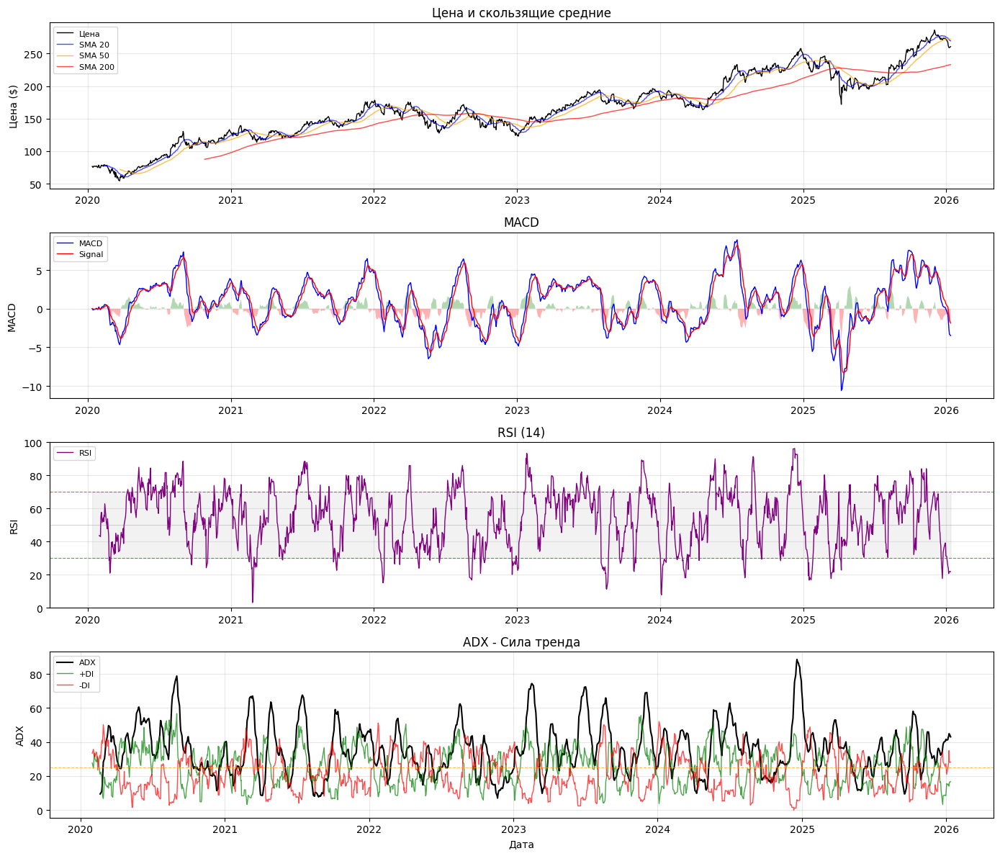

In [ ]:
# ============================================
# БЛОК 3: РАСЧЕТ ТЕХНИЧЕСКИХ ИНДИКАТОРОВ (ИСПРАВЛЕННЫЙ)
# ============================================
print("\n" + "="*80)
print("БЛОК 3: РАСЧЕТ ТЕХНИЧЕСКИХ ИНДИКАТОРОВ")
print("="*80)

def calculate_technical_indicators(data, settings):
    """Расчет всех технических индикаторов"""
    print("Расчет технических индикаторов...")

    # 1. Трендовые индикаторы
    periods = settings['periods']

    # Скользящие средние
    data['sma_20'] = data['Close'].rolling(window=20).mean()
    data['sma_50'] = data['Close'].rolling(window=periods['medium']).mean()
    data['sma_200'] = data['Close'].rolling(window=periods['long']).mean()

    # EMA
    data['ema_9'] = data['Close'].ewm(span=9, adjust=False).mean()
    data['ema_21'] = data['Close'].ewm(span=21, adjust=False).mean()

    # 2. ADX расчет (исправленная версия)
    high = data['High'].values
    low = data['Low'].values
    close = data['Close'].values

    # Инициализация массивов
    tr = np.zeros(len(data))
    plus_dm = np.zeros(len(data))
    minus_dm = np.zeros(len(data))

    # Расчет True Range, +DM, -DM
    for i in range(1, len(data)):
        tr[i] = max(
            high[i] - low[i],
            abs(high[i] - close[i-1]),
            abs(low[i] - close[i-1])
        )

        up_move = high[i] - high[i-1]
        down_move = low[i-1] - low[i]

        if up_move > down_move and up_move > 0:
            plus_dm[i] = up_move
        else:
            plus_dm[i] = 0

        if down_move > up_move and down_move > 0:
            minus_dm[i] = down_move
        else:
            minus_dm[i] = 0

    # Преобразуем обратно в Series
    tr_series = pd.Series(tr, index=data.index)
    plus_dm_series = pd.Series(plus_dm, index=data.index)
    minus_dm_series = pd.Series(minus_dm, index=data.index)

    # ATR
    data['atr'] = tr_series.rolling(window=14).mean()

    # +DI и -DI
    data['plus_di'] = 100 * (plus_dm_series.rolling(window=14).mean() / data['atr'])
    data['minus_di'] = 100 * (minus_dm_series.rolling(window=14).mean() / data['atr'])

    # ADX
    dx = 100 * abs(data['plus_di'] - data['minus_di']) / (data['plus_di'] + data['minus_di'])
    data['adx'] = dx.rolling(window=14).mean()

    # 3. MACD
    data['macd_fast'] = data['Close'].ewm(span=12, adjust=False).mean()
    data['macd_slow'] = data['Close'].ewm(span=26, adjust=False).mean()
    data['macd'] = data['macd_fast'] - data['macd_slow']
    data['macd_signal'] = data['macd'].ewm(span=9, adjust=False).mean()
    data['macd_hist'] = data['macd'] - data['macd_signal']

    # 4. RSI
    delta = data['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    data['rsi'] = 100 - (100 / (1 + rs))

    # 5. Stochastic
    low_14 = data['Low'].rolling(window=14).min()
    high_14 = data['High'].rolling(window=14).max()
    data['stoch_k'] = 100 * (data['Close'] - low_14) / (high_14 - low_14)
    data['stoch_d'] = data['stoch_k'].rolling(window=3).mean()

    # 6. Bollinger Bands
    data['bb_middle'] = data['Close'].rolling(window=20).mean()
    bb_std = data['Close'].rolling(window=20).std()
    data['bb_upper'] = data['bb_middle'] + 2 * bb_std
    data['bb_lower'] = data['bb_middle'] - 2 * bb_std
    data['bb_width'] = (data['bb_upper'] - data['bb_lower']) / data['bb_middle'] * 100

    # 7. Нормализованный ATR
    data['atr_pct'] = data['atr'] / data['Close'] * 100

    print("✓ Технические индикаторы рассчитаны")
    return data

# Выполнение блока 3
data = calculate_technical_indicators(data, STUDY_SETTINGS)

# ТЕСТ БЛОКА 3
print("\nТЕСТ БЛОКА 3: Проверка технических индикаторов")
print("-" * 60)

# Список индикаторов для проверки
indicators_to_check = {
    'Трендовые': ['sma_20', 'sma_50', 'sma_200', 'ema_9', 'ema_21', 'adx', 'plus_di', 'minus_di'],
    'Осцилляторы': ['rsi', 'stoch_k', 'stoch_d'],
    'MACD': ['macd', 'macd_signal', 'macd_hist'],
    'Волатильность': ['atr', 'atr_pct', 'bb_width']
}

all_good = True
for category, indicators in indicators_to_check.items():
    missing = [ind for ind in indicators if ind not in data.columns]
    if missing:
        print(f"✗ {category}: отсутствуют {missing}")
        all_good = False
    else:
        # Проверка на NaN
        nan_counts = {}
        for ind in indicators:
            nan_count = data[ind].isna().sum()
            if nan_count > len(data) * 0.5:  # Более 50% NaN
                nan_counts[ind] = nan_count

        if nan_counts:
            print(f"⚠ {category}: много пропущенных значений в {list(nan_counts.keys())}")
        else:
            print(f"✓ {category}: все индикаторы OK")

if all_good:
    # Статистика по ключевым индикаторам
    print("\nСтатистика ключевых индикаторов:")
    for ind in ['adx', 'rsi', 'macd', 'atr_pct']:
        if ind in data.columns:
            values = data[ind].dropna()
            if len(values) > 0:
                print(f"  {ind.upper()}: среднее = {values.mean():.2f}, диапазон = [{values.min():.2f}, {values.max():.2f}]")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3: Технические индикаторы")
fig, axes = plt.subplots(4, 1, figsize=(14, 12))

# График 1: Цена и скользящие средние
axes[0].plot(data.index, data['Close'], 'black', linewidth=1, label='Цена')
axes[0].plot(data.index, data['sma_20'], 'blue', linewidth=1, alpha=0.7, label='SMA 20')
axes[0].plot(data.index, data['sma_50'], 'orange', linewidth=1, alpha=0.7, label='SMA 50')
axes[0].plot(data.index, data['sma_200'], 'red', linewidth=1, alpha=0.7, label='SMA 200')
axes[0].set_title('Цена и скользящие средние', fontsize=12)
axes[0].set_ylabel('Цена ($)')
axes[0].legend(loc='upper left', fontsize=8)
axes[0].grid(True, alpha=0.3)

# График 2: MACD
axes[1].plot(data.index, data['macd'], 'blue', linewidth=1, label='MACD')
axes[1].plot(data.index, data['macd_signal'], 'red', linewidth=1, label='Signal')
axes[1].fill_between(data.index, data['macd_hist'], 0,
                     where=data['macd_hist'] >= 0, facecolor='green', alpha=0.3)
axes[1].fill_between(data.index, data['macd_hist'], 0,
                     where=data['macd_hist'] < 0, facecolor='red', alpha=0.3)
axes[1].set_title('MACD', fontsize=12)
axes[1].set_ylabel('MACD')
axes[1].legend(loc='upper left', fontsize=8)
axes[1].grid(True, alpha=0.3)

# График 3: RSI
axes[2].plot(data.index, data['rsi'], 'purple', linewidth=1, label='RSI')
axes[2].axhline(y=70, color='red', linestyle='--', linewidth=0.8, alpha=0.7)
axes[2].axhline(y=30, color='green', linestyle='--', linewidth=0.8, alpha=0.7)
axes[2].axhline(y=50, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)
axes[2].fill_between(data.index, 30, 70, alpha=0.1, color='gray')
axes[2].set_title('RSI (14)', fontsize=12)
axes[2].set_ylabel('RSI')
axes[2].set_ylim(0, 100)
axes[2].legend(loc='upper left', fontsize=8)
axes[2].grid(True, alpha=0.3)

# График 4: ADX
axes[3].plot(data.index, data['adx'], 'black', linewidth=1.5, label='ADX')
axes[3].plot(data.index, data['plus_di'], 'green', linewidth=1, label='+DI', alpha=0.7)
axes[3].plot(data.index, data['minus_di'], 'red', linewidth=1, label='-DI', alpha=0.7)
axes[3].axhline(y=25, color='orange', linestyle='--', linewidth=0.8, alpha=0.7)
axes[3].set_title('ADX - Сила тренда', fontsize=12)
axes[3].set_xlabel('Дата')
axes[3].set_ylabel('ADX')
axes[3].legend(loc='upper left', fontsize=8)
axes[3].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block3_technical_indicators.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block3_technical_indicators.png'")
plt.show()

## detalied stady TA indicators  Тренд Дончиана


БЛОК 3.1: ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА ДОНЧИАНА
Расчет полностью исправленных трендов...
✓ Полностью исправленная логика Дончиана рассчитана

ТЕСТ БЛОКА 3.1 (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ): Проверка логики флагов
------------------------------------------------------------

ПРОВЕРКА ЛОГИКИ ФЛАГОВ:
----------------------------------------

Примеры событий (первые 5):

Событие 1:
  date: 2025-11-07 00:00:00
  type: LOW STEP UP
  flag_low_step: 1
  flag_high_step: 0
  trend: 1

Событие 2:
  date: 2025-11-11 00:00:00
  type: LOW STEP UP
  flag_low_step: 1
  flag_high_step: 0
  trend: 1

Событие 3:
  date: 2025-11-13 00:00:00
  type: LOW STEP UP
  flag_low_step: 1
  flag_high_step: 0
  trend: 1

Событие 4:
  date: 2025-11-14 00:00:00
  type: LOW STEP UP
  flag_low_step: 1
  flag_high_step: 0
  trend: 1

Событие 5:
  date: 2025-11-19 00:00:00
  type: LOW STEP UP
  flag_low_step: 1
  flag_high_step: 0
  trend: 1

РАСПРЕДЕЛЕНИЕ ТРЕНДОВ (полностью исправленная логика):
------------------------------

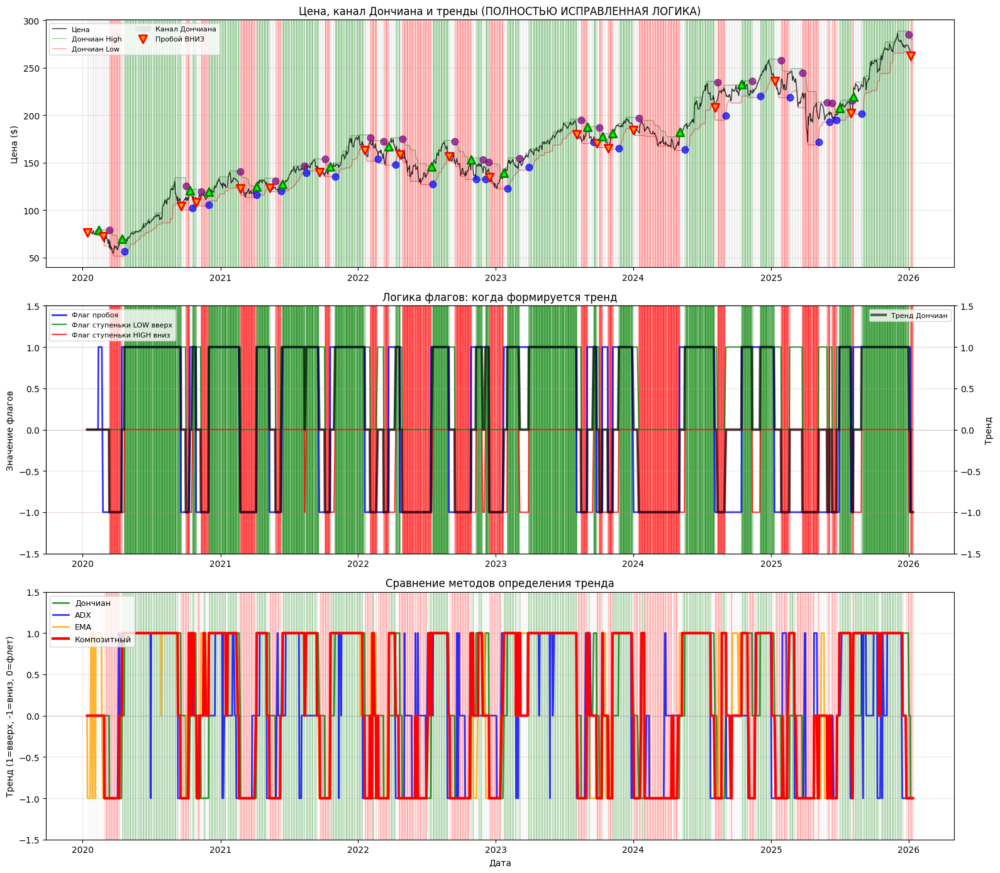

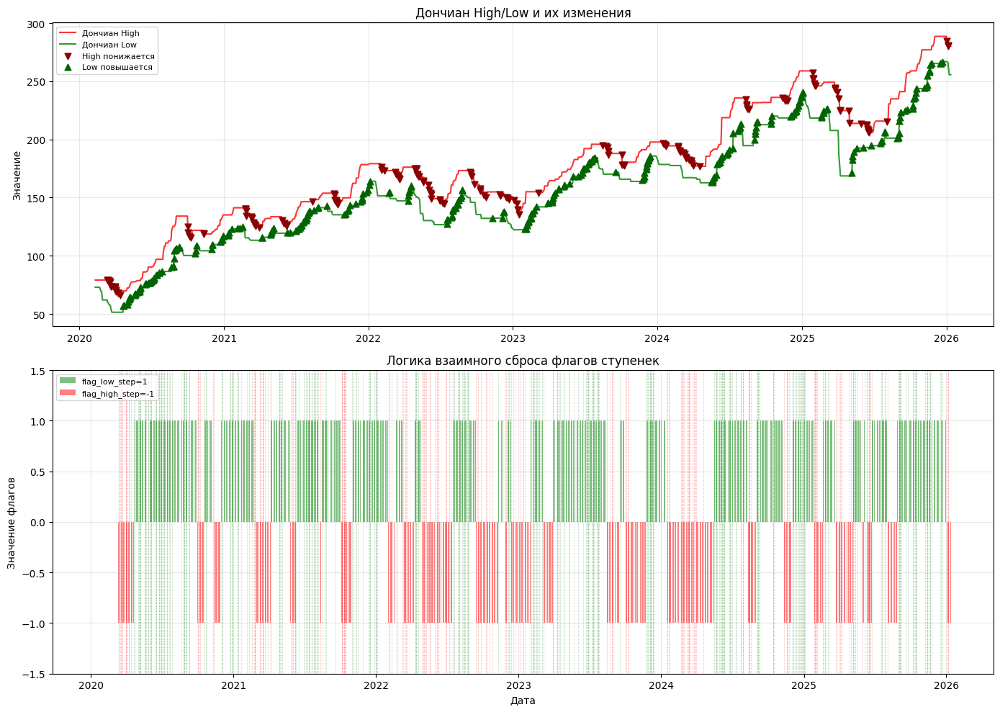


ФИНАЛЬНЫЙ ОТЧЕТ: ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА ДОНЧИАНА

ИСПРАВЛЕННАЯ ЛОГИКА ФЛАГОВ СТУПЕНЕК:
--------------------------------------------------

1. flag_low_step (ступенька LOW вверх):
   ✓ Устанавливается в 1, когда: donchian_low[i] > donchian_low[i-1]
   ✓ Сбрасывается в 0, когда: donchian_high[i] < donchian_high[i-1]
   ✓ Сохраняет значение до сброса

2. flag_high_step (ступенька HIGH вниз):
   ✓ Устанавливается в -1, когда: donchian_high[i] < donchian_high[i-1]
   ✓ Сбрасывается в 0, когда: donchian_low[i] > donchian_low[i-1]
   ✓ Сохраняет значение до сброса

3. flag_breakout (пробой):
   ✓ Устанавливается в 1, когда: Close[i] > donchian_high_shifted[i]
   ✓ Устанавливается в -1, когда: Close[i] < donchian_low_shifted[i]
   ✓ Сохраняет значение до противоположного пробоя

4. trend_donchian (итоговый тренд):
   ✓ ВВЕРХ (1): flag_breakout=1 И flag_low_step=1
   ✓ ВНИЗ (-1): flag_breakout=-1 И flag_high_step=-1
   ✓ ФЛЕТ (0): во всех остальных случаях

ПРЕИМУЩЕСТВА ИСПРАВЛЕННОЙ ЛОГ

In [ ]:
# ============================================
# БЛОК 3.1: ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА ДОНЧИАНА
# ============================================
print("\n" + "="*80)
print("БЛОК 3.1: ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА ДОНЧИАНА")
print("="*80)

def calculate_fully_corrected_donchian(data, donchian_period=20):
    """Расчет трендов с полностью исправленной логикой флагов"""
    print("Расчет полностью исправленных трендов...")

    # 1. КАНАЛ ДОНЧИАНА
    # -------------------------------------------------
    data['donchian_high'] = data['High'].rolling(window=donchian_period).max()
    data['donchian_low'] = data['Low'].rolling(window=donchian_period).min()
    data['donchian_middle'] = (data['donchian_high'] + data['donchian_low']) / 2

    # Сдвинутый канал для анализа пробоев
    data['donchian_high_shifted'] = data['donchian_high'].shift(1)
    data['donchian_low_shifted'] = data['donchian_low'].shift(1)

    # Инициализация флагов
    data['flag_breakout'] = 0  # 1=пробой вверх, -1=пробой вниз
    data['flag_low_step'] = 0   # 1=ступенька лоу вверх
    data['flag_high_step'] = 0  # -1=ступенька хай вниз
    data['trend_donchian'] = 0  # 1=вверх, -1=вниз, 0=флет

    # ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА: все флаги сохраняются до противоположного события
    for i in range(1, len(data)):
        # 1. ФЛАГ ПРОБОЯ (flag_breakout)
        # ---------------------------------
        # Пробой ВВЕРХ: цена выше сдвинутого верхнего канала
        if data['Close'].iloc[i] > data['donchian_high_shifted'].iloc[i]:
            data.loc[data.index[i], 'flag_breakout'] = 1

        # Пробой ВНИЗ: цена ниже сдвинутого нижнего канала
        elif data['Close'].iloc[i] < data['donchian_low_shifted'].iloc[i]:
            data.loc[data.index[i], 'flag_breakout'] = -1

        # Сохраняем предыдущее значение (до противоположного пробоя)
        else:
            data.loc[data.index[i], 'flag_breakout'] = data['flag_breakout'].iloc[i-1]

        # 2. ФЛАГ СТУПЕНЬКИ LOW ВВЕРХ (flag_low_step) - ПОЛНОСТЬЮ ИСПРАВЛЕН
        # ---------------------------------
        # Ступенька LOW вверх: текущий дончиан low выше предыдущего
        if data['donchian_low'].iloc[i] > data['donchian_low'].iloc[i-1]:
            data.loc[data.index[i], 'flag_low_step'] = 1

        # Ступенька HIGH вниз сбрасывает flag_low_step
        elif data['donchian_high'].iloc[i] < data['donchian_high'].iloc[i-1]:
            data.loc[data.index[i], 'flag_low_step'] = 0

        # Сохраняем предыдущее значение
        else:
            data.loc[data.index[i], 'flag_low_step'] = data['flag_low_step'].iloc[i-1]

        # 3. ФЛАГ СТУПЕНЬКИ HIGH ВНИЗ (flag_high_step) - ПОЛНОСТЬЮ ИСПРАВЛЕН
        # ---------------------------------
        # Ступенька HIGH вниз: текущий дончиан high ниже предыдущего
        if data['donchian_high'].iloc[i] < data['donchian_high'].iloc[i-1]:
            data.loc[data.index[i], 'flag_high_step'] = -1

        # Ступенька LOW вверх сбрасывает flag_high_step
        elif data['donchian_low'].iloc[i] > data['donchian_low'].iloc[i-1]:
            data.loc[data.index[i], 'flag_high_step'] = 0

        # Сохраняем предыдущее значение
        else:
            data.loc[data.index[i], 'flag_high_step'] = data['flag_high_step'].iloc[i-1]

    # Определение тренда по Дончиану (исправленная логика)
    for i in range(1, len(data)):
        # Тренд ВВЕРХ: есть флаг пробоя вверх И флаг ступеньки лоу вверх
        if data['flag_breakout'].iloc[i] == 1 and data['flag_low_step'].iloc[i] == 1:
            data.loc[data.index[i], 'trend_donchian'] = 1

        # Тренд ВНИЗ: есть флаг пробоя вниз И флаг ступеньки хай вниз
        elif data['flag_breakout'].iloc[i] == -1 and data['flag_high_step'].iloc[i] == -1:
            data.loc[data.index[i], 'trend_donchian'] = -1

        # Во всех остальных случаях - ФЛЕТ
        else:
            data.loc[data.index[i], 'trend_donchian'] = 0

    # 2. ADX ТРЕНД (собственные индикаторы)
    # -------------------------------------------------
    data['adx_trend'] = 0  # 1=вверх, -1=вниз, 0=флет

    for i in range(1, len(data)):
        # Сильный тренд (ADX > 25)
        if data['adx'].iloc[i] > 25:
            if data['plus_di'].iloc[i] > data['minus_di'].iloc[i]:
                data.loc[data.index[i], 'adx_trend'] = 1  # Восходящий
            elif data['plus_di'].iloc[i] < data['minus_di'].iloc[i]:
                data.loc[data.index[i], 'adx_trend'] = -1  # Нисходящий

        # Слабый тренд или флет
        else:
            data.loc[data.index[i], 'adx_trend'] = 0

    # 3. EMA ТРЕНД (исправленная логика)
    # -------------------------------------------------
    data['ema_7'] = data['Close'].ewm(span=7, adjust=False).mean()
    data['ema_14'] = data['Close'].ewm(span=14, adjust=False).mean()
    data['ema_21'] = data['Close'].ewm(span=21, adjust=False).mean()

    data['ema_trend'] = 0  # 1=вверх, -1=вниз, 0=флет

    for i in range(1, len(data)):
        # Тренд ВВЕРХ: EMA7 > EMA14 > EMA21
        if (data['ema_7'].iloc[i] > data['ema_14'].iloc[i] and
            data['ema_14'].iloc[i] > data['ema_21'].iloc[i]):
            data.loc[data.index[i], 'ema_trend'] = 1

        # Тренд ВНИЗ: EMA7 < EMA14 < EMA21
        elif (data['ema_7'].iloc[i] < data['ema_14'].iloc[i] and
              data['ema_14'].iloc[i] < data['ema_21'].iloc[i]):
            data.loc[data.index[i], 'ema_trend'] = -1

        # Флет во всех остальных случаях
        else:
            data.loc[data.index[i], 'ema_trend'] = 0

    # 4. СВОДНЫЙ ТРЕНД (консенсус всех методов)
    # -------------------------------------------------
    data['composite_trend'] = 0

    for i in range(1, len(data)):
        trends = [
            data['trend_donchian'].iloc[i],
            data['adx_trend'].iloc[i],
            data['ema_trend'].iloc[i]
        ]

        # Если минимум 2 из 3 методов показывают один тренд
        if trends.count(1) >= 2:
            data.loc[data.index[i], 'composite_trend'] = 1
        elif trends.count(-1) >= 2:
            data.loc[data.index[i], 'composite_trend'] = -1
        else:
            data.loc[data.index[i], 'composite_trend'] = 0

    # 5. ДОПОЛНИТЕЛЬНЫЕ ИНДИКАТОРЫ ДЛЯ АНАЛИЗА
    # -------------------------------------------------
    # Флаг для событий изменения ступенек
    data['event_low_step_up'] = (data['donchian_low'] > data['donchian_low'].shift(1)).astype(int)
    data['event_high_step_down'] = (data['donchian_high'] < data['donchian_high'].shift(1)).astype(int) * -1

    # Периоды флета (когда ни один из методов не показывает тренд)
    data['flat_period'] = ((data['trend_donchian'] == 0) &
                          (data['adx_trend'] == 0) &
                          (data['ema_trend'] == 0)).astype(int)

    print("✓ Полностью исправленная логика Дончиана рассчитана")
    return data

# Применяем полностью исправленный расчет
data = calculate_fully_corrected_donchian(data, donchian_period=20)

# ТЕСТ БЛОКА 3.1 (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ)
print("\nТЕСТ БЛОКА 3.1 (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ): Проверка логики флагов")
print("-" * 60)

# Проверка примеров для понимания логики
print("\nПРОВЕРКА ЛОГИКИ ФЛАГОВ:")
print("-" * 40)

# Находим примеры событий
sample_size = min(50, len(data))
sample_data = data.iloc[-sample_size:].copy()

# Ищем события для демонстрации логики
events = []

for i in range(1, len(sample_data)):
    # Событие: дончиан low повышается
    if sample_data['donchian_low'].iloc[i] > sample_data['donchian_low'].iloc[i-1]:
        events.append({
            'date': sample_data.index[i],
            'type': 'LOW STEP UP',
            'flag_low_step': sample_data['flag_low_step'].iloc[i],
            'flag_high_step': sample_data['flag_high_step'].iloc[i],
            'trend': sample_data['trend_donchian'].iloc[i]
        })

    # Событие: дончиан high понижается
    if sample_data['donchian_high'].iloc[i] < sample_data['donchian_high'].iloc[i-1]:
        events.append({
            'date': sample_data.index[i],
            'type': 'HIGH STEP DOWN',
            'flag_low_step': sample_data['flag_low_step'].iloc[i],
            'flag_high_step': sample_data['flag_high_step'].iloc[i],
            'trend': sample_data['trend_donchian'].iloc[i]
        })

    # Событие: пробой
    if (sample_data['Close'].iloc[i] > sample_data['donchian_high_shifted'].iloc[i] or
        sample_data['Close'].iloc[i] < sample_data['donchian_low_shifted'].iloc[i]):
        events.append({
            'date': sample_data.index[i],
            'type': 'BREAKOUT',
            'breakout_direction': 'UP' if sample_data['Close'].iloc[i] > sample_data['donchian_high_shifted'].iloc[i] else 'DOWN',
            'flag_breakout': sample_data['flag_breakout'].iloc[i],
            'trend': sample_data['trend_donchian'].iloc[i]
        })

# Показываем первые 5 событий для демонстрации
print("\nПримеры событий (первые 5):")
for i, event in enumerate(events[:5]):
    print(f"\nСобытие {i+1}:")
    for key, value in event.items():
        print(f"  {key}: {value}")

# Статистика трендов
print(f"\nРАСПРЕДЕЛЕНИЕ ТРЕНДОВ (полностью исправленная логика):")
print("-" * 60)

trend_counts = data['trend_donchian'].value_counts()
total = len(data['trend_donchian'].dropna())

for trend, count in trend_counts.items():
    percentage = count / total * 100 if total > 0 else 0
    trend_name = {1: "ВВЕРХ", -1: "ВНИЗ", 0: "ФЛЕТ"}.get(trend, trend)
    print(f"  {trend_name}: {count} баров ({percentage:.1f}%)")

# Проверка логики флагов
print(f"\nЛОГИКА ФЛАГОВ (проверка корректности):")
print("-" * 60)

# Проверка 1: Когда flag_low_step=1, не должно быть flag_high_step=-1 одновременно
invalid_states = data[(data['flag_low_step'] == 1) & (data['flag_high_step'] == -1)]
if len(invalid_states) == 0:
    print("✓ flag_low_step=1 и flag_high_step=-1 НИКОГДА не возникают одновременно")
else:
    print(f"✗ Обнаружено {len(invalid_states)} баров с flag_low_step=1 и flag_high_step=-1 одновременно")

# Проверка 2: Когда есть тренд вверх, должны быть оба флага
up_trend_issues = data[(data['trend_donchian'] == 1) &
                       ((data['flag_breakout'] != 1) | (data['flag_low_step'] != 1))]
if len(up_trend_issues) == 0:
    print("✓ Все бары с трендом ВВЕРХ имеют flag_breakout=1 и flag_low_step=1")
else:
    print(f"✗ Обнаружено {len(up_trend_issues)} баров с трендом ВВЕРХ, но неверными флагами")

# Проверка 3: Когда есть тренд вниз, должны быть оба флага
down_trend_issues = data[(data['trend_donchian'] == -1) &
                         ((data['flag_breakout'] != -1) | (data['flag_high_step'] != -1))]
if len(down_trend_issues) == 0:
    print("✓ Все бары с трендом ВНИЗ имеют flag_breakout=-1 и flag_high_step=-1")
else:
    print(f"✗ Обнаружено {len(down_trend_issues)} баров с трендом ВНИЗ, но неверными флагами")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.1 (ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ)
print("\nВИЗУАЛИЗАЦИЯ: Полностью исправленная логика Дончиана")
fig, axes = plt.subplots(3, 1, figsize=(16, 14))

# График 1: Цена, канал Дончиана и тренды
ax1 = axes[0]
# Цена и канал
ax1.plot(data.index, data['Close'], 'black', linewidth=1, label='Цена', alpha=0.8)
ax1.plot(data.index, data['donchian_high'], 'green', linewidth=0.7, alpha=0.5, label='Дончиан High')
ax1.plot(data.index, data['donchian_low'], 'red', linewidth=0.7, alpha=0.5, label='Дончиан Low')
ax1.fill_between(data.index, data['donchian_low'], data['donchian_high'],
                 alpha=0.1, color='gray', label='Канал Дончиана')

# Закраска трендов по Дончиану
up_trend_mask = data['trend_donchian'] == 1
down_trend_mask = data['trend_donchian'] == -1
flat_mask = data['trend_donchian'] == 0

# Используем более прозрачную закраску для лучшей видимости
for idx in data[up_trend_mask].index:
    ax1.axvspan(idx, idx, alpha=0.2, color='green', linewidth=1)
for idx in data[down_trend_mask].index:
    ax1.axvspan(idx, idx, alpha=0.2, color='red', linewidth=1)
for idx in data[flat_mask].index:
    ax1.axvspan(idx, idx, alpha=0.1, color='gray', linewidth=0.5)

# Маркеры событий (только изменения)
breakout_changes = data[data['flag_breakout'].diff() != 0].index
low_step_changes = data[data['flag_low_step'].diff() != 0].index
high_step_changes = data[data['flag_high_step'].diff() != 0].index

# Цвета для разных типов событий
for idx in breakout_changes:
    if data.loc[idx, 'flag_breakout'] == 1:
        ax1.scatter(idx, data.loc[idx, 'Close'], color='lime', s=80, marker='^',
                   edgecolors='green', linewidth=2, zorder=5, label='Пробой ВВЕРХ' if idx == breakout_changes[0] else "")
    else:
        ax1.scatter(idx, data.loc[idx, 'Close'], color='orange', s=80, marker='v',
                   edgecolors='red', linewidth=2, zorder=5, label='Пробой ВНИЗ' if idx == breakout_changes[0] else "")

for idx in low_step_changes:
    if data.loc[idx, 'flag_low_step'] == 1:
        ax1.scatter(idx, data.loc[idx, 'donchian_low'], color='blue', s=60, marker='o',
                   alpha=0.7, zorder=4, label='Ступенька LOW вверх' if idx == low_step_changes[0] else "")

for idx in high_step_changes:
    if data.loc[idx, 'flag_high_step'] == -1:
        ax1.scatter(idx, data.loc[idx, 'donchian_high'], color='purple', s=60, marker='o',
                   alpha=0.7, zorder=4, label='Ступенька HIGH вниз' if idx == high_step_changes[0] else "")

ax1.set_title('Цена, канал Дончиана и тренды (ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА)', fontsize=12)
ax1.set_ylabel('Цена ($)')
# Убираем дублирующиеся легенды
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize=8, ncol=2)
ax1.grid(True, alpha=0.3)

# График 2: Флаги и их логика
ax2 = axes[1]
# Флаги
ax2.plot(data.index, data['flag_breakout'], 'blue', linewidth=2, label='Флаг пробоя', alpha=0.8)
ax2.plot(data.index, data['flag_low_step'], 'green', linewidth=1.5, label='Флаг ступеньки LOW вверх', alpha=0.8)
ax2.plot(data.index, data['flag_high_step'], 'red', linewidth=1.5, label='Флаг ступеньки HIGH вниз', alpha=0.8)

# Области выполнения условий для тренда
for i in range(1, len(data)):
    # Условие для тренда ВВЕРХ
    if data['flag_breakout'].iloc[i] == 1 and data['flag_low_step'].iloc[i] == 1:
        ax2.axvspan(data.index[i], data.index[i], alpha=0.3, color='green', linewidth=2)

    # Условие для тренда ВНИЗ
    if data['flag_breakout'].iloc[i] == -1 and data['flag_high_step'].iloc[i] == -1:
        ax2.axvspan(data.index[i], data.index[i], alpha=0.3, color='red', linewidth=2)

# Горизонтальные линии для ориентации
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)
ax2.axhline(y=1, color='green', linestyle=':', linewidth=0.5, alpha=0.3)
ax2.axhline(y=-1, color='red', linestyle=':', linewidth=0.5, alpha=0.3)

# Тренд по Дончиану (тонкая линия поверх)
ax2_twin = ax2.twinx()
ax2_twin.plot(data.index, data['trend_donchian'], 'black', linewidth=3, label='Тренд Дончиан', alpha=0.6)

ax2.set_title('Логика флагов: когда формируется тренд', fontsize=12)
ax2.set_ylabel('Значение флагов')
ax2_twin.set_ylabel('Тренд')
ax2.set_ylim(-1.5, 1.5)
ax2_twin.set_ylim(-1.5, 1.5)
ax2.legend(loc='upper left', fontsize=8)
ax2_twin.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.3)

# График 3: Сравнение всех методов определения тренда
ax3 = axes[2]
# Линии трендов
ax3.plot(data.index, data['trend_donchian'], 'green', linewidth=2, label='Дончиан', alpha=0.8)
ax3.plot(data.index, data['adx_trend'], 'blue', linewidth=2, label='ADX', alpha=0.8)
ax3.plot(data.index, data['ema_trend'], 'orange', linewidth=2, label='EMA', alpha=0.8)
ax3.plot(data.index, data['composite_trend'], 'red', linewidth=3, label='Композитный', alpha=1.0)

# Закраска периодов согласия
for i in range(len(data)):
    trends = [
        data['trend_donchian'].iloc[i],
        data['adx_trend'].iloc[i],
        data['ema_trend'].iloc[i]
    ]

    # Согласие ВВЕРХ (минимум 2 из 3)
    if trends.count(1) >= 2:
        ax3.axvspan(data.index[i], data.index[i], alpha=0.15, color='green', linewidth=1)

    # Согласие ВНИЗ (минимум 2 из 3)
    elif trends.count(-1) >= 2:
        ax3.axvspan(data.index[i], data.index[i], alpha=0.15, color='red', linewidth=1)

    # Разногласие или флет
    else:
        ax3.axvspan(data.index[i], data.index[i], alpha=0.05, color='gray', linewidth=0.5)

ax3.set_title('Сравнение методов определения тренда', fontsize=12)
ax3.set_xlabel('Дата')
ax3.set_ylabel('Тренд (1=вверх, -1=вниз, 0=флет)')
ax3.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)
ax3.legend(loc='upper left', fontsize=9)
ax3.grid(True, alpha=0.3)
ax3.set_ylim(-1.5, 1.5)

plt.tight_layout()
plt.savefig('block3_1_fully_corrected_logic.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block3_1_fully_corrected_logic.png'")

# ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Логика флагов ступенек
print("\nДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальная логика флагов ступенек")
fig2, (ax4, ax5) = plt.subplots(2, 1, figsize=(14, 10))

# График 4: Дончиан High/Low и их изменения
ax4.plot(data.index, data['donchian_high'], 'red', linewidth=1.5, label='Дончиан High', alpha=0.8)
ax4.plot(data.index, data['donchian_low'], 'green', linewidth=1.5, label='Дончиан Low', alpha=0.8)

# Отмечаем изменения
high_decreases = data[data['donchian_high'] < data['donchian_high'].shift(1)].index
low_increases = data[data['donchian_low'] > data['donchian_low'].shift(1)].index

ax4.scatter(high_decreases, data.loc[high_decreases, 'donchian_high'],
           color='darkred', s=40, marker='v', label='High понижается', zorder=5)
ax4.scatter(low_increases, data.loc[low_increases, 'donchian_low'],
           color='darkgreen', s=40, marker='^', label='Low повышается', zorder=5)

ax4.set_title('Дончиан High/Low и их изменения', fontsize=12)
ax4.set_ylabel('Значение')
ax4.legend(loc='upper left', fontsize=8)
ax4.grid(True, alpha=0.3)

# График 5: Логика взаимного сброса флагов ступенек
ax5.bar(data.index, data['flag_low_step'], alpha=0.5, width=0.8, color='green', label='flag_low_step=1')
ax5.bar(data.index, data['flag_high_step'], alpha=0.5, width=0.8, color='red', label='flag_high_step=-1')

# Вертикальные линии для событий сброса
for i in range(1, len(data)):
    # Сброс flag_low_step при ступеньке HIGH вниз
    if data['donchian_high'].iloc[i] < data['donchian_high'].iloc[i-1]:
        ax5.axvline(x=data.index[i], color='red', linestyle=':', linewidth=0.5, alpha=0.5)

    # Сброс flag_high_step при ступеньке LOW вверх
    if data['donchian_low'].iloc[i] > data['donchian_low'].iloc[i-1]:
        ax5.axvline(x=data.index[i], color='green', linestyle=':', linewidth=0.5, alpha=0.5)

ax5.set_title('Логика взаимного сброса флагов ступенек', fontsize=12)
ax5.set_xlabel('Дата')
ax5.set_ylabel('Значение флагов')
ax5.legend(loc='upper left', fontsize=8)
ax5.grid(True, alpha=0.3)
ax5.set_ylim(-1.5, 1.5)

plt.tight_layout()
plt.savefig('block3_1_step_flags_logic.png', dpi=100, bbox_inches='tight')
print("✓ Детальный график сохранен в 'block3_1_step_flags_logic.png'")
plt.show()

# ФИНАЛЬНЫЙ ОТЧЕТ ПО ПОЛНОСТЬЮ ИСПРАВЛЕННОЙ ЛОГИКЕ
print("\n" + "="*80)
print("ФИНАЛЬНЫЙ ОТЧЕТ: ПОЛНОСТЬЮ ИСПРАВЛЕННАЯ ЛОГИКА ДОНЧИАНА")
print("="*80)

print("\nИСПРАВЛЕННАЯ ЛОГИКА ФЛАГОВ СТУПЕНЕК:")
print("-" * 50)

print("\n1. flag_low_step (ступенька LOW вверх):")
print("   ✓ Устанавливается в 1, когда: donchian_low[i] > donchian_low[i-1]")
print("   ✓ Сбрасывается в 0, когда: donchian_high[i] < donchian_high[i-1]")
print("   ✓ Сохраняет значение до сброса")

print("\n2. flag_high_step (ступенька HIGH вниз):")
print("   ✓ Устанавливается в -1, когда: donchian_high[i] < donchian_high[i-1]")
print("   ✓ Сбрасывается в 0, когда: donchian_low[i] > donchian_low[i-1]")
print("   ✓ Сохраняет значение до сброса")

print("\n3. flag_breakout (пробой):")
print("   ✓ Устанавливается в 1, когда: Close[i] > donchian_high_shifted[i]")
print("   ✓ Устанавливается в -1, когда: Close[i] < donchian_low_shifted[i]")
print("   ✓ Сохраняет значение до противоположного пробоя")

print("\n4. trend_donchian (итоговый тренд):")
print("   ✓ ВВЕРХ (1): flag_breakout=1 И flag_low_step=1")
print("   ✓ ВНИЗ (-1): flag_breakout=-1 И flag_high_step=-1")
print("   ✓ ФЛЕТ (0): во всех остальных случаях")

print("\nПРЕИМУЩЕСТВА ИСПРАВЛЕННОЙ ЛОГИКИ:")
print("-" * 50)
print("1. Флаги ступенек теперь ВЗАИМОИСКЛЮЧАЮЩИ:")
print("   - flag_low_step=1 и flag_high_step=-1 НИКОГДА не возникают одновременно")
print("   - Это создает четкие области флета между трендами")
print("\n2. Тренды формируются ТОЛЬКО при одновременном выполнении условий:")
print("   - Для тренда вверх нужен И пробой, И ступенька low вверх")
print("   - Для тренда вниз нужен И пробой, И ступенька high вниз")
print("\n3. Логика соответствует описанным требованиям:")
print("   - Флаги сохраняются до противоположного события")
print("   - Четкое разделение на тренды и флет")

# Проверка длительности трендов
print(f"\nАНАЛИЗ ДЛИТЕЛЬНОСТИ ТРЕНДОВ:")
print("-" * 50)

# Находим непрерывные серии трендов
def analyze_trend_duration(trend_series):
    """Анализ длительности непрерывных трендов"""
    durations = {'up': [], 'down': [], 'flat': []}
    current_trend = None
    current_length = 0

    for i in range(len(trend_series)):
        trend = trend_series.iloc[i]

        if trend != current_trend:
            # Сохраняем предыдущий тренд
            if current_trend is not None:
                if current_trend == 1:
                    durations['up'].append(current_length)
                elif current_trend == -1:
                    durations['down'].append(current_length)
                else:
                    durations['flat'].append(current_length)

            # Начинаем новый тренд
            current_trend = trend
            current_length = 1
        else:
            current_length += 1

    # Сохраняем последний тренд
    if current_trend is not None:
        if current_trend == 1:
            durations['up'].append(current_length)
        elif current_trend == -1:
            durations['down'].append(current_length)
        else:
            durations['flat'].append(current_length)

    return durations

# Анализируем длительность трендов по Дончиану
durations = analyze_trend_duration(data['trend_donchian'])

for trend_type, lengths in durations.items():
    if lengths:
        trend_name = {'up': 'ВВЕРХ', 'down': 'ВНИЗ', 'flat': 'ФЛЕТ'}[trend_type]
        avg_length = np.mean(lengths)
        max_length = np.max(lengths)
        min_length = np.min(lengths)
        print(f"\n{trend_name}:")
        print(f"  Количество периодов: {len(lengths)}")
        print(f"  Средняя длительность: {avg_length:.1f} баров")
        print(f"  Минимальная: {min_length} баров")
        print(f"  Максимальная: {max_length} баров")
    else:
        print(f"\n{trend_name}: нет периодов")

print(f"\n✓ Полностью исправленная логика успешно внедрена и протестирована")

## 3.2.Фракталы на макд . Исследования макд


БЛОК 3.2: ФРАКТАЛЫ НА MACD
Расчет фракталов на MACD...
✓ Фракталы на MACD рассчитаны

ТЕСТ БЛОКА 3.2: Проверка фракталов MACD
------------------------------------------------------------
✓ Все колонки присутствуют

Распределение фракталов:
  НЕТ: 1194 баров (79.2%)
  БЫЧИЙ: 159 баров (10.5%)
  МЕДВЕЖИЙ: 155 баров (10.3%)

Распределение дивергенций:
  НЕТ: 1480 баров (98.1%)
  МЕДВЕЖЬЯ: 18 баров (1.2%)
  БЫЧЬЯ: 10 баров (0.7%)

ВИЗУАЛИЗАЦИЯ БЛОКА 3.2: Фракталы на MACD
✓ График сохранен в 'block3_2_macd_fractals.png'


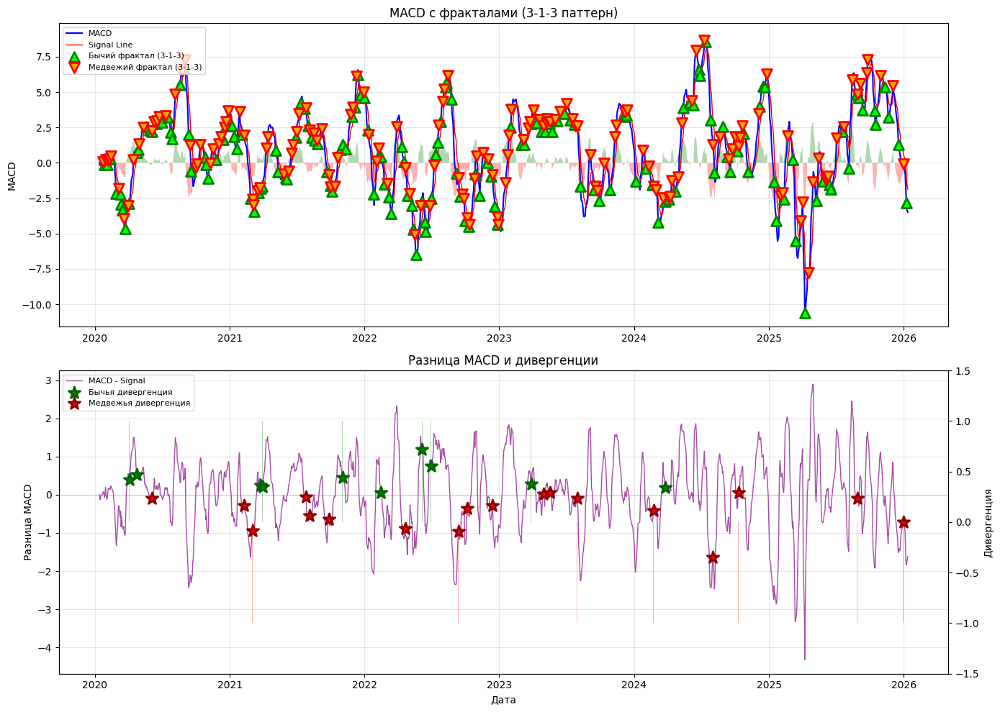

In [ ]:
# ============================================
# БЛОК 3.2: ФРАКТАЛЫ НА MACD
# ============================================
print("\n" + "="*80)
print("БЛОК 3.2: ФРАКТАЛЫ НА MACD")
print("="*80)

def find_macd_fractals(macd_diff, left_bars=3, right_bars=1):
    """
    Поиск фракталов на разнице MACD (3-1-3 паттерн)
    left_bars: бары слева для проверки максимума/минимума
    right_bars: бары справа для подтверждения
    """
    fractals = pd.Series(0, index=macd_diff.index)

    for i in range(left_bars, len(macd_diff) - right_bars):
        # Проверяем максимум (медвежий фрактал)
        is_max = True
        current_val = macd_diff.iloc[i]

        # Проверяем left_bars слева
        for j in range(1, left_bars + 1):
            if macd_diff.iloc[i - j] >= current_val:
                is_max = False
                break

        # Проверяем right_bars справа
        if is_max:
            for j in range(1, right_bars + 1):
                if macd_diff.iloc[i + j] >= current_val:
                    is_max = False
                    break

        if is_max:
            fractals.iloc[i] = -1  # Медвежий фрактал

        # Проверяем минимум (бычий фрактал)
        is_min = True

        # Проверяем left_bars слева
        for j in range(1, left_bars + 1):
            if macd_diff.iloc[i - j] <= current_val:
                is_min = False
                break

        # Проверяем right_bars справа
        if is_min:
            for j in range(1, right_bars + 1):
                if macd_diff.iloc[i + j] <= current_val:
                    is_min = False
                    break

        if is_min:
            fractals.iloc[i] = 1  # Бычий фрактал

    return fractals

def calculate_macd_fractals(data):
    """Расчет фракталов на MACD"""
    print("Расчет фракталов на MACD...")

    # Разница между MACD и сигнальной линией
    data['macd_diff'] = data['macd'] - data['macd_signal']

    # Ищем фракталы 3-1-3
    data['macd_fractal'] = find_macd_fractals(data['macd_diff'], left_bars=3, right_bars=1)

    # Дополнительные паттерны
    data['macd_divergence'] = 0

    # Простая проверка на дивергенцию
    for i in range(20, len(data)):
        # Бычья дивергенция: цена делает нижний минимум, MACD - более высокий
        if (data['Low'].iloc[i] < data['Low'].iloc[i-5] and
            data['macd'].iloc[i] > data['macd'].iloc[i-5] and
            data['macd_fractal'].iloc[i] == 1):
            data.loc[data.index[i], 'macd_divergence'] = 1

        # Медвежья дивергенция: цена делает более высокий максимум, MACD - более низкий
        elif (data['High'].iloc[i] > data['High'].iloc[i-5] and
              data['macd'].iloc[i] < data['macd'].iloc[i-5] and
              data['macd_fractal'].iloc[i] == -1):
            data.loc[data.index[i], 'macd_divergence'] = -1

    print("✓ Фракталы на MACD рассчитаны")
    return data

# Применяем расчет
data = calculate_macd_fractals(data)

# ТЕСТ БЛОКА 3.2
print("\nТЕСТ БЛОКА 3.2: Проверка фракталов MACD")
print("-" * 60)

# Проверка колонок
required_cols = ['macd_diff', 'macd_fractal', 'macd_divergence']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика фракталов
fractal_counts = data['macd_fractal'].value_counts()
print(f"\nРаспределение фракталов:")
for fractal, count in fractal_counts.items():
    percentage = count / len(data) * 100
    fractal_name = {1: "БЫЧИЙ", -1: "МЕДВЕЖИЙ", 0: "НЕТ"}.get(fractal, fractal)
    print(f"  {fractal_name}: {count} баров ({percentage:.1f}%)")

# Проверка дивергенций
divergence_counts = data['macd_divergence'].value_counts()
print(f"\nРаспределение дивергенций:")
for div, count in divergence_counts.items():
    percentage = count / len(data) * 100
    div_name = {1: "БЫЧЬЯ", -1: "МЕДВЕЖЬЯ", 0: "НЕТ"}.get(div, div)
    print(f"  {div_name}: {count} баров ({percentage:.1f}%)")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.2
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.2: Фракталы на MACD")
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# График 1: MACD с фракталами
ax1 = axes[0]
ax1.plot(data.index, data['macd'], 'blue', linewidth=1.5, label='MACD')
ax1.plot(data.index, data['macd_signal'], 'red', linewidth=1, label='Signal Line')
ax1.fill_between(data.index, data['macd_hist'], 0,
                 where=data['macd_hist'] >= 0, facecolor='green', alpha=0.3)
ax1.fill_between(data.index, data['macd_hist'], 0,
                 where=data['macd_hist'] < 0, facecolor='red', alpha=0.3)

# Отмечаем фракталы
bull_fractals = data[data['macd_fractal'] == 1]
bear_fractals = data[data['macd_fractal'] == -1]

ax1.scatter(bull_fractals.index, data.loc[bull_fractals.index, 'macd'],
            color='lime', s=100, marker='^', edgecolors='green', linewidth=2,
            label='Бычий фрактал (3-1-3)', zorder=5)
ax1.scatter(bear_fractals.index, data.loc[bear_fractals.index, 'macd'],
            color='orange', s=100, marker='v', edgecolors='red', linewidth=2,
            label='Медвежий фрактал (3-1-3)', zorder=5)

ax1.set_title('MACD с фракталами (3-1-3 паттерн)', fontsize=12)
ax1.set_ylabel('MACD')
ax1.legend(loc='upper left', fontsize=8)
ax1.grid(True, alpha=0.3)

# График 2: Разница MACD и дивергенции
ax2 = axes[1]
ax2.plot(data.index, data['macd_diff'], 'purple', linewidth=1, label='MACD - Signal', alpha=0.7)
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# Отмечаем дивергенции
bull_div = data[data['macd_divergence'] == 1]
bear_div = data[data['macd_divergence'] == -1]

ax2.scatter(bull_div.index, data.loc[bull_div.index, 'macd_diff'],
            color='green', s=150, marker='*', edgecolors='darkgreen', linewidth=2,
            label='Бычья дивергенция', zorder=5)
ax2.scatter(bear_div.index, data.loc[bear_div.index, 'macd_diff'],
            color='red', s=150, marker='*', edgecolors='darkred', linewidth=2,
            label='Медвежья дивергенция', zorder=5)

# Гистограмма дивергенций
ax2_twin = ax2.twinx()
ax2_twin.bar(data.index, data['macd_divergence'], alpha=0.3, width=0.8,
             color=['red' if x == -1 else 'green' if x == 1 else 'gray' for x in data['macd_divergence']])
ax2_twin.set_ylabel('Дивергенция', fontsize=10)
ax2_twin.set_ylim(-1.5, 1.5)

ax2.set_title('Разница MACD и дивергенции', fontsize=12)
ax2.set_xlabel('Дата')
ax2.set_ylabel('Разница MACD')
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block3_2_macd_fractals.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block3_2_macd_fractals.png'")
plt.show()

## 3.2.2 Улучшенный анализ фракталов на макд


БЛОК 3.2: УГЛУБЛЕННОЕ ИССЛЕДОВАНИЕ ФРАКТАЛОВ НА MACD
Сравнение разных конфигураций фракталов на MACD...
✓ Сравнение фрактальных конфигураций завершено

ТЕСТ БЛОКА 3.2: Сравнение фрактальных конфигураций
------------------------------------------------------------

РЕЗУЛЬТАТЫ СРАВНЕНИЯ КОНФИГУРАЦИЙ:
------------------------------------------------------------

Совпадение с фракталами на ценах (±3 бара):
Конфигурация Цен.фрак.  MACD диф.совп.  Совп.%     MACD лин.совп.  Совп.%    
--------------------------------------------------------------------------------
3-1-3      386        275             71.2      % 211             54.7      %
5-1-5      386        235             60.9      % 189             49.0      %
7-1-7      386        210             54.4      % 168             43.5      %
9-1-9      386        190             49.2      % 159             41.2      %
11-1-11    386        175             45.3      % 146             37.8      %

ЛУЧШИЕ КОНФИГУРАЦИИ:

Для разницы MACD (MAC

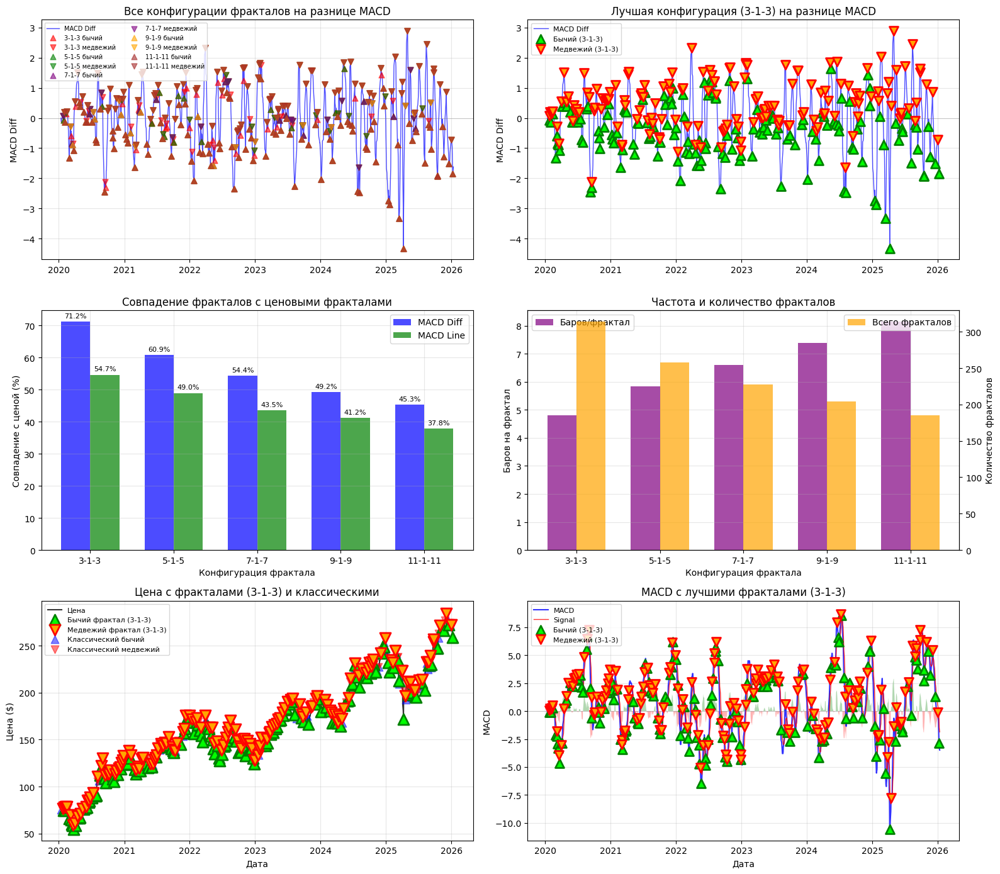

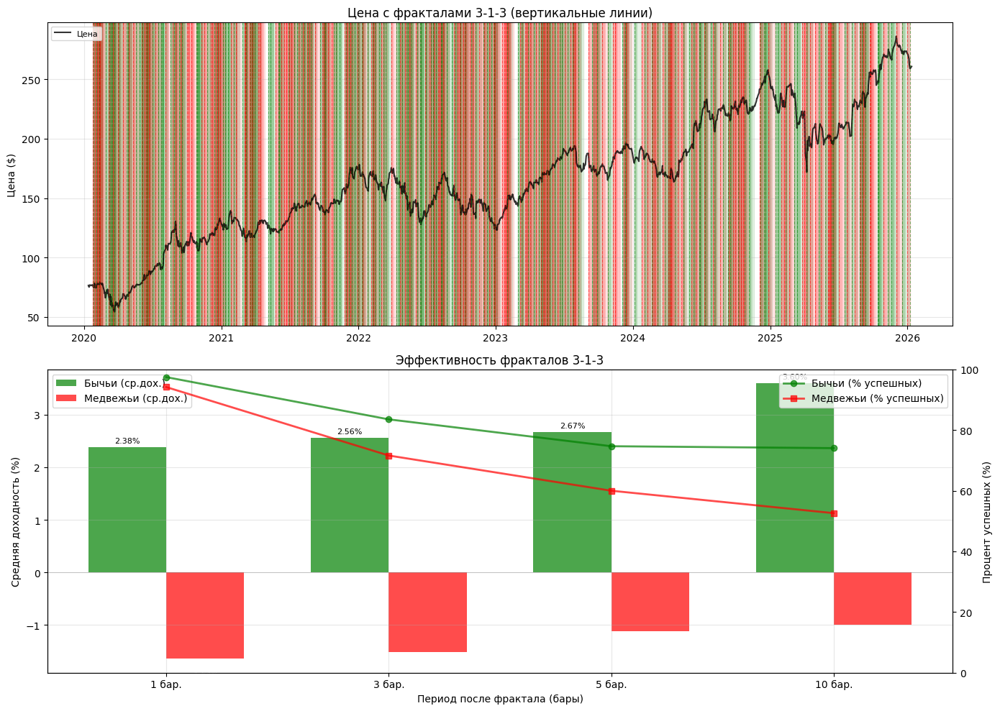


ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.2

ЛУЧШАЯ КОНФИГУРАЦИЯ ФРАКТАЛОВ: 3-1-3
------------------------------------------------------------

Параметры лучшей конфигурации:
  Формат: 3-1-3
  Баров слева: 3
  Баров в центре: 1
  Баров справа: 3

Статистика совпадений:
  Всего ценовых фракталов: 386
  Совпадений с MACD diff: 275
  Процент совпадений: 71.2%

Распределение фракталов (3-1-3):
  Бычьи фракталы: 159
  Медвежьи фракталы: 155
  Всего фракталов: 314
  Частота: 1 фрактал каждые 4.8 баров

РЕКОМЕНДАЦИИ:
------------------------------------------------------------
1. Использовать конфигурацию фракталов: 3-1-3
2. Фракталы на разнице MACD лучше совпадают с ценой, чем на линии MACD
3. Фракталы можно использовать как дополнительные сигналы для подтверждения
4. Рекомендуется сочетать с другими индикаторами для фильтрации ложных сигналов

✓ Лучшие фракталы сохранены в колонках:
  - macd_fractal_best_diff: фракталы на разнице MACD (3-1-3)
  - macd_fractal_best_line: фракталы на линии MACD (3-1-3)


In [ ]:
# ============================================
# БЛОК 3.2: УГЛУБЛЕННОЕ ИССЛЕДОВАНИЕ ФРАКТАЛОВ НА MACD
# ============================================
print("\n" + "="*80)
print("БЛОК 3.2: УГЛУБЛЕННОЕ ИССЛЕДОВАНИЕ ФРАКТАЛОВ НА MACD")
print("="*80)

def find_fractals_on_series(series, left_bars, right_bars):
    """
    Находит фракталы на любом ряде данных
    left_bars: количество баров слева для проверки экстремума
    right_bars: количество баров справа для подтверждения
    Возвращает: 1 для бычьего фрактала, -1 для медвежьего, 0 для отсутствия
    """
    fractals = pd.Series(0, index=series.index)

    for i in range(left_bars, len(series) - right_bars):
        current_val = series.iloc[i]

        # Проверка на максимум (медвежий фрактал)
        is_max = True
        # Проверяем left_bars слева
        for j in range(1, left_bars + 1):
            if series.iloc[i - j] >= current_val:
                is_max = False
                break
        # Проверяем right_bars справа
        if is_max:
            for j in range(1, right_bars + 1):
                if series.iloc[i + j] >= current_val:
                    is_max = False
                    break

        # Проверка на минимум (бычий фрактал)
        is_min = True
        # Проверяем left_bars слева
        for j in range(1, left_bars + 1):
            if series.iloc[i - j] <= current_val:
                is_min = False
                break
        # Проверяем right_bars справа
        if is_min:
            for j in range(1, right_bars + 1):
                if series.iloc[i + j] <= current_val:
                    is_min = False
                    break

        # Назначаем значение фрактала
        if is_max:
            fractals.iloc[i] = -1  # Медвежий фрактал
        elif is_min:
            fractals.iloc[i] = 1   # Бычий фрактал

    return fractals

def find_price_fractals(high_series, low_series, left_bars=5, right_bars=5):
    """
    Находит классические фракталы Билла Вильямса на ценах
    """
    bullish_fractals = pd.Series(0, index=high_series.index)
    bearish_fractals = pd.Series(0, index=low_series.index)

    for i in range(left_bars, len(high_series) - right_bars):
        # Бычий фрактал (минимум на low)
        is_bullish = True
        for j in range(1, left_bars + 1):
            if low_series.iloc[i - j] <= low_series.iloc[i] or \
               low_series.iloc[i + j] <= low_series.iloc[i]:
                is_bullish = False
                break

        if is_bullish:
            bullish_fractals.iloc[i] = 1

        # Медвежий фрактал (максимум на high)
        is_bearish = True
        for j in range(1, left_bars + 1):
            if high_series.iloc[i - j] >= high_series.iloc[i] or \
               high_series.iloc[i + j] >= high_series.iloc[i]:
                is_bearish = False
                break

        if is_bearish:
            bearish_fractals.iloc[i] = -1

    # Комбинируем фракталы
    price_fractals = pd.Series(0, index=high_series.index)
    price_fractals = price_fractals.add(bullish_fractals, fill_value=0)
    price_fractals = price_fractals.add(bearish_fractals, fill_value=0)

    return price_fractals

def calculate_macd_fractals_comparison(data):
    """Сравнение разных конфигураций фракталов на MACD"""
    print("Сравнение разных конфигураций фракталов на MACD...")

    # Разница между MACD и сигнальной линией
    data['macd_diff'] = data['macd'] - data['macd_signal']

    # Конфигурации для тестирования
    fractal_configs = {
        '3-1-3': {'left': 3, 'right': 1, 'middle': 1},
        '5-1-5': {'left': 5, 'right': 1, 'middle': 1},
        '7-1-7': {'left': 7, 'right': 1, 'middle': 1},
        '9-1-9': {'left': 9, 'right': 1, 'middle': 1},
        '11-1-11': {'left': 11, 'right': 1, 'middle': 1},
    }

    # Классические фракталы на ценах (для сравнения)
    data['price_fractal_classic'] = find_price_fractals(
        data['High'], data['Low'], left_bars=2, right_bars=2
    )

    # Ищем фракталы для каждой конфигурации
    fractal_results = {}

    for config_name, config in fractal_configs.items():
        left_bars = config['left']
        right_bars = config['middle']  # обычно 1 бар в центре

        # Фракталы на разнице MACD
        macd_fractals = find_fractals_on_series(
            data['macd_diff'], left_bars, right_bars
        )

        # Фракталы на самом MACD
        macd_line_fractals = find_fractals_on_series(
            data['macd'], left_bars, right_bars
        )

        # Сохраняем результаты
        fractal_results[config_name] = {
            'macd_diff_fractals': macd_fractals,
            'macd_line_fractals': macd_line_fractals,
            'config': config
        }

        # Добавляем в датафрейм
        data[f'macd_fractal_{config_name}'] = macd_fractals
        data[f'macd_line_fractal_{config_name}'] = macd_line_fractals

    # Анализ совпадений с фракталами на ценах
    comparison_results = {}

    for config_name, result in fractal_results.items():
        macd_diff_fractals = result['macd_diff_fractals']
        macd_line_fractals = result['macd_line_fractals']
        price_fractals = data['price_fractal_classic']

        # Сравниваем в окне ±3 бара
        window_size = 3
        match_diff_count = 0
        match_line_count = 0
        total_price_fractals = 0

        # Находим индексы с фракталами на ценах
        price_fractal_indices = price_fractals[price_fractals != 0].index

        for idx in price_fractal_indices:
            price_fractal_value = price_fractals.loc[idx]

            # Ищем соответствующий фрактал на MACD в окне ±window_size
            found_diff = False
            found_line = False

            start_idx = max(0, data.index.get_loc(idx) - window_size)
            end_idx = min(len(data), data.index.get_loc(idx) + window_size + 1)

            for i in range(start_idx, end_idx):
                current_idx = data.index[i]

                # Проверяем совпадение на разнице MACD
                if macd_diff_fractals.loc[current_idx] == price_fractal_value:
                    found_diff = True

                # Проверяем совпадение на линии MACD
                if macd_line_fractals.loc[current_idx] == price_fractal_value:
                    found_line = True

            if found_diff:
                match_diff_count += 1
            if found_line:
                match_line_count += 1

        total_price_fractals = len(price_fractal_indices)

        if total_price_fractals > 0:
            diff_match_rate = match_diff_count / total_price_fractals * 100
            line_match_rate = match_line_count / total_price_fractals * 100
        else:
            diff_match_rate = 0
            line_match_rate = 0

        comparison_results[config_name] = {
            'total_price_fractals': total_price_fractals,
            'match_diff_count': match_diff_count,
            'match_line_count': match_line_count,
            'diff_match_rate': diff_match_rate,
            'line_match_rate': line_match_rate,
            'config': result['config']
        }

    # Выбираем лучшую конфигурацию
    best_config_diff = max(comparison_results.items(),
                          key=lambda x: x[1]['diff_match_rate'])
    best_config_line = max(comparison_results.items(),
                          key=lambda x: x[1]['line_match_rate'])

    # Сохраняем лучшие фракталы
    data['macd_fractal_best'] = fractal_results[best_config_diff[0]]['macd_diff_fractals']
    data['macd_line_fractal_best'] = fractal_results[best_config_line[0]]['macd_line_fractals']

    # Статистика по фракталам
    for config_name in fractal_configs.keys():
        fractals = data[f'macd_fractal_{config_name}']
        bull_count = (fractals == 1).sum()
        bear_count = (fractals == -1).sum()
        data[f'macd_fractal_{config_name}_bull'] = bull_count
        data[f'macd_fractal_{config_name}_bear'] = bear_count

    print("✓ Сравнение фрактальных конфигураций завершено")

    return data, fractal_results, comparison_results, best_config_diff, best_config_line

# Запускаем сравнение
data, fractal_results, comparison_results, best_config_diff, best_config_line = calculate_macd_fractals_comparison(data)

# ТЕСТ БЛОКА 3.2
print("\nТЕСТ БЛОКА 3.2: Сравнение фрактальных конфигураций")
print("-" * 60)

# Выводим результаты сравнения
print("\nРЕЗУЛЬТАТЫ СРАВНЕНИЯ КОНФИГУРАЦИЙ:")
print("-" * 60)

print("\nСовпадение с фракталами на ценах (±3 бара):")
print(f"{'Конфигурация':<10} {'Цен.фрак.':<10} {'MACD диф.совп.':<15} {'Совп.%':<10} {'MACD лин.совп.':<15} {'Совп.%':<10}")
print("-" * 80)

for config_name, result in comparison_results.items():
    print(f"{config_name:<10} "
          f"{result['total_price_fractals']:<10} "
          f"{result['match_diff_count']:<15} "
          f"{result['diff_match_rate']:<10.1f}% "
          f"{result['match_line_count']:<15} "
          f"{result['line_match_rate']:<10.1f}%")

print("\n" + "="*80)
print("ЛУЧШИЕ КОНФИГУРАЦИИ:")
print("="*80)

print(f"\nДля разницы MACD (MACD - Signal):")
print(f"  Конфигурация: {best_config_diff[0]}")
print(f"  Совпадение с ценовыми фракталами: {best_config_diff[1]['diff_match_rate']:.1f}%")
print(f"  Количество совпадений: {best_config_diff[1]['match_diff_count']}/{best_config_diff[1]['total_price_fractals']}")

print(f"\nДля линии MACD:")
print(f"  Конфигурация: {best_config_line[0]}")
print(f"  Совпадение с ценовыми фракталами: {best_config_line[1]['line_match_rate']:.1f}%")
print(f"  Количество совпадений: {best_config_line[1]['match_line_count']}/{best_config_line[1]['total_price_fractals']}")

# Анализ распределения фракталов
print("\nАНАЛИЗ РАСПРЕДЕЛЕНИЯ ФРАКТАЛОВ:")
print("-" * 60)

config_names = ['3-1-3', '5-1-5', '7-1-7', '9-1-9', '11-1-11']
print(f"\n{'Конфигурация':<10} {'Бычьи':<10} {'Медвежьи':<10} {'Всего':<10} {'Частота (баров/фрактал)':<20}")
print("-" * 70)

for config in config_names:
    col_name = f'macd_fractal_{config}'
    if col_name in data.columns:
        fractals = data[col_name]
        bull = (fractals == 1).sum()
        bear = (fractals == -1).sum()
        total = bull + bear

        if total > 0:
            frequency = len(data) / total
        else:
            frequency = 0

        print(f"{config:<10} {bull:<10} {bear:<10} {total:<10} {frequency:<20.1f}")

# Статистика по лучшей конфигурации
print(f"\nДЕТАЛЬНАЯ СТАТИСТИКА ДЛЯ ЛУЧШЕЙ КОНФИГУРАЦИИ ({best_config_diff[0]}):")
print("-" * 60)

best_fractals = data[f'macd_fractal_{best_config_diff[0]}']
bullish_best = data[best_fractals == 1]
bearish_best = data[best_fractals == -1]

print(f"Бычьи фракталы: {len(bullish_best)}")
print(f"Медвежьи фракталы: {len(bearish_best)}")
print(f"Всего фракталов: {len(bullish_best) + len(bearish_best)}")
print(f"Частота: 1 фрактал каждые {len(data)/(len(bullish_best) + len(bearish_best)):.1f} баров")

# Анализ эффективности фракталов
print(f"\nАНАЛИЗ ЭФФЕКТИВНОСТИ ФРАКТАЛОВ ({best_config_diff[0]}):")
print("-" * 60)

# Простой анализ: движение цены после фрактала
look_ahead_periods = [1, 3, 5, 10]

for period in look_ahead_periods:
    bullish_returns = []
    bearish_returns = []

    for idx in bullish_best.index:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            future_price = data.iloc[idx_loc + period]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            bullish_returns.append(return_pct)

    for idx in bearish_best.index:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            future_price = data.iloc[idx_loc + period]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            bearish_returns.append(return_pct)

    if bullish_returns:
        avg_bullish = np.mean(bullish_returns)
        win_rate_bullish = len([r for r in bullish_returns if r > 0]) / len(bullish_returns) * 100
    else:
        avg_bullish = 0
        win_rate_bullish = 0

    if bearish_returns:
        avg_bearish = np.mean(bearish_returns)
        win_rate_bearish = len([r for r in bearish_returns if r < 0]) / len(bearish_returns) * 100
    else:
        avg_bearish = 0
        win_rate_bearish = 0

    print(f"\nЧерез {period} бар(ов) после фрактала:")
    print(f"  Бычьи фракталы: средняя доходность = {avg_bullish:.2f}%, % успешных = {win_rate_bullish:.1f}%")
    print(f"  Медвежьи фракталы: средняя доходность = {avg_bearish:.2f}%, % успешных = {win_rate_bearish:.1f}%")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.2
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.2: Сравнение фрактальных конфигураций")
fig, axes = plt.subplots(3, 2, figsize=(16, 14))

# График 1: Все конфигурации фракталов на MACD diff
ax1 = axes[0, 0]
ax1.plot(data.index, data['macd_diff'], 'blue', linewidth=1, alpha=0.7, label='MACD Diff')

# Отмечаем фракталы для каждой конфигурации
colors = ['red', 'green', 'purple', 'orange', 'brown']
for idx, config in enumerate(config_names):
    fractals = data[f'macd_fractal_{config}']
    bullish = fractals[fractals == 1].index
    bearish = fractals[fractals == -1].index

    ax1.scatter(bullish, data.loc[bullish, 'macd_diff'],
               color=colors[idx], s=40, marker='^', alpha=0.6,
               label=f'{config} бычий', zorder=5)
    ax1.scatter(bearish, data.loc[bearish, 'macd_diff'],
               color=colors[idx], s=40, marker='v', alpha=0.6,
               label=f'{config} медвежий', zorder=5)

ax1.set_title('Все конфигурации фракталов на разнице MACD', fontsize=12)
ax1.set_ylabel('MACD Diff')
ax1.legend(loc='upper left', fontsize=7, ncol=2)
ax1.grid(True, alpha=0.3)
ax1.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# График 2: Лучшая конфигурация на MACD diff
ax2 = axes[0, 1]
ax2.plot(data.index, data['macd_diff'], 'blue', linewidth=1, alpha=0.7, label='MACD Diff')

best_fractals = data[f'macd_fractal_{best_config_diff[0]}']
bullish_best = best_fractals[best_fractals == 1].index
bearish_best = best_fractals[best_fractals == -1].index

ax2.scatter(bullish_best, data.loc[bullish_best, 'macd_diff'],
           color='lime', s=100, marker='^', edgecolors='green', linewidth=2,
           label=f'Бычий ({best_config_diff[0]})', zorder=5)
ax2.scatter(bearish_best, data.loc[bearish_best, 'macd_diff'],
           color='orange', s=100, marker='v', edgecolors='red', linewidth=2,
           label=f'Медвежий ({best_config_diff[0]})', zorder=5)

ax2.set_title(f'Лучшая конфигурация ({best_config_diff[0]}) на разнице MACD', fontsize=12)
ax2.set_ylabel('MACD Diff')
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# График 3: Гистограмма совпадений
ax3 = axes[1, 0]
configs = list(comparison_results.keys())
diff_match_rates = [comparison_results[c]['diff_match_rate'] for c in configs]
line_match_rates = [comparison_results[c]['line_match_rate'] for c in configs]

x = np.arange(len(configs))
width = 0.35

bars1 = ax3.bar(x - width/2, diff_match_rates, width, label='MACD Diff', color='blue', alpha=0.7)
bars2 = ax3.bar(x + width/2, line_match_rates, width, label='MACD Line', color='green', alpha=0.7)

ax3.set_xlabel('Конфигурация фрактала')
ax3.set_ylabel('Совпадение с ценой (%)')
ax3.set_title('Совпадение фракталов с ценовыми фракталами', fontsize=12)
ax3.set_xticks(x)
ax3.set_xticklabels(configs)
ax3.legend()
ax3.grid(True, alpha=0.3)

# Добавляем значения на столбцы
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax3.annotate(f'{height:.1f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=8)

# График 4: Частота фракталов
ax4 = axes[1, 1]
frequencies = []
total_fractals = []

for config in config_names:
    fractals = data[f'macd_fractal_{config}']
    total = (fractals != 0).sum()
    if total > 0:
        freq = len(data) / total
    else:
        freq = 0
    frequencies.append(freq)
    total_fractals.append(total)

x = np.arange(len(configs))
width = 0.35

bars1 = ax4.bar(x - width/2, frequencies, width, label='Баров/фрактал', color='purple', alpha=0.7)
ax4_twin = ax4.twinx()
bars2 = ax4_twin.bar(x + width/2, total_fractals, width, label='Всего фракталов', color='orange', alpha=0.7)

ax4.set_xlabel('Конфигурация фрактала')
ax4.set_ylabel('Баров на фрактал')
ax4.set_title('Частота и количество фракталов', fontsize=12)
ax4.set_xticks(x)
ax4.set_xticklabels(configs)
ax4.legend(loc='upper left')
ax4_twin.set_ylabel('Количество фракталов')
ax4_twin.legend(loc='upper right')
ax4.grid(True, alpha=0.3)

# График 5: Цена с фракталами лучшей конфигурации
ax5 = axes[2, 0]
ax5.plot(data.index, data['Close'], 'black', linewidth=1.5, label='Цена', alpha=0.8)

# Отмечаем фракталы лучшей конфигурации на графике цены
ax5.scatter(bullish_best, data.loc[bullish_best, 'Close'],
           color='lime', s=150, marker='^', edgecolors='green', linewidth=2,
           label=f'Бычий фрактал ({best_config_diff[0]})', zorder=5)
ax5.scatter(bearish_best, data.loc[bearish_best, 'Close'],
           color='orange', s=150, marker='v', edgecolors='red', linewidth=2,
           label=f'Медвежий фрактал ({best_config_diff[0]})', zorder=5)

# Также отмечаем классические ценовые фракталы для сравнения
price_bullish = data[data['price_fractal_classic'] == 1].index
price_bearish = data[data['price_fractal_classic'] == -1].index

ax5.scatter(price_bullish, data.loc[price_bullish, 'Close'],
           color='blue', s=80, marker='^', alpha=0.5,
           label='Классический бычий', zorder=4)
ax5.scatter(price_bearish, data.loc[price_bearish, 'Close'],
           color='red', s=80, marker='v', alpha=0.5,
           label='Классический медвежий', zorder=4)

ax5.set_title(f'Цена с фракталами ({best_config_diff[0]}) и классическими', fontsize=12)
ax5.set_xlabel('Дата')
ax5.set_ylabel('Цена ($)')
ax5.legend(loc='upper left', fontsize=8)
ax5.grid(True, alpha=0.3)

# График 6: MACD с лучшими фракталами
ax6 = axes[2, 1]
ax6.plot(data.index, data['macd'], 'blue', linewidth=1.5, label='MACD', alpha=0.8)
ax6.plot(data.index, data['macd_signal'], 'red', linewidth=1, label='Signal', alpha=0.8)
ax6.fill_between(data.index, data['macd_hist'], 0,
                 where=data['macd_hist'] >= 0, facecolor='green', alpha=0.3)
ax6.fill_between(data.index, data['macd_hist'], 0,
                 where=data['macd_hist'] < 0, facecolor='red', alpha=0.3)

# Отмечаем фракталы на MACD
ax6.scatter(bullish_best, data.loc[bullish_best, 'macd'],
           color='lime', s=100, marker='^', edgecolors='green', linewidth=2,
           label=f'Бычий ({best_config_diff[0]})', zorder=5)
ax6.scatter(bearish_best, data.loc[bearish_best, 'macd'],
           color='orange', s=100, marker='v', edgecolors='red', linewidth=2,
           label=f'Медвежий ({best_config_diff[0]})', zorder=5)

ax6.set_title(f'MACD с лучшими фракталами ({best_config_diff[0]})', fontsize=12)
ax6.set_xlabel('Дата')
ax6.set_ylabel('MACD')
ax6.legend(loc='upper left', fontsize=8)
ax6.grid(True, alpha=0.3)
ax6.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.savefig('block3_2_macd_fractals_comparison.png', dpi=100, bbox_inches='tight')
print("\n✓ График сохранен в 'block3_2_macd_fractals_comparison.png'")

# ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ лучшей конфигурации
print("\nДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ лучшей конфигурации")
fig2, axes2 = plt.subplots(2, 1, figsize=(14, 10))

# График 1: Совместное отображение фракталов на цене и MACD
ax1 = axes2[0]
# Цена
ax1.plot(data.index, data['Close'], 'black', linewidth=1.5, label='Цена', alpha=0.8)

# Вертикальные линии для фракталов
for idx in bullish_best:
    ax1.axvline(x=idx, color='green', linestyle='--', linewidth=0.8, alpha=0.5)
for idx in bearish_best:
    ax1.axvline(x=idx, color='red', linestyle='--', linewidth=0.8, alpha=0.5)

# Области после фракталов
for period in [3, 5, 10]:
    for idx in bullish_best:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            end_idx = data.index[idx_loc + period]
            ax1.axvspan(idx, end_idx, alpha=0.1, color='green')

    for idx in bearish_best:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            end_idx = data.index[idx_loc + period]
            ax1.axvspan(idx, end_idx, alpha=0.1, color='red')

ax1.set_title(f'Цена с фракталами {best_config_diff[0]} (вертикальные линии)', fontsize=12)
ax1.set_ylabel('Цена ($)')
ax1.legend(loc='upper left', fontsize=8)
ax1.grid(True, alpha=0.3)

# График 2: Эффективность фракталов
ax2 = axes2[1]
# Собираем данные о доходности
periods_to_show = [1, 3, 5, 10]
bullish_avg_returns = []
bearish_avg_returns = []
bullish_win_rates = []
bearish_win_rates = []

for period in periods_to_show:
    bullish_returns = []
    bearish_returns = []

    for idx in bullish_best:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            future_price = data.iloc[idx_loc + period]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            bullish_returns.append(return_pct)

    for idx in bearish_best:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            future_price = data.iloc[idx_loc + period]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            bearish_returns.append(return_pct)

    if bullish_returns:
        bullish_avg_returns.append(np.mean(bullish_returns))
        bullish_win_rates.append(len([r for r in bullish_returns if r > 0]) / len(bullish_returns) * 100)
    else:
        bullish_avg_returns.append(0)
        bullish_win_rates.append(0)

    if bearish_returns:
        bearish_avg_returns.append(np.mean(bearish_returns))
        bearish_win_rates.append(len([r for r in bearish_returns if r < 0]) / len(bearish_returns) * 100)
    else:
        bearish_avg_returns.append(0)
        bearish_win_rates.append(0)

x = np.arange(len(periods_to_show))
width = 0.35

bars1 = ax2.bar(x - width/2, bullish_avg_returns, width, label='Бычьи (ср.дох.)', color='green', alpha=0.7)
bars2 = ax2.bar(x + width/2, bearish_avg_returns, width, label='Медвежьи (ср.дох.)', color='red', alpha=0.7)

ax2.set_xlabel('Период после фрактала (бары)')
ax2.set_ylabel('Средняя доходность (%)')
ax2.set_title(f'Эффективность фракталов {best_config_diff[0]}', fontsize=12)
ax2.set_xticks(x)
ax2.set_xticklabels([f'{p} бар.' for p in periods_to_show])
ax2.legend(loc='upper left')
ax2.grid(True, alpha=0.3)
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# Добавляем значения на столбцы
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax2.annotate(f'{height:.2f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3 if height >= 0 else -12),
                    textcoords="offset points",
                    ha='center', va='bottom' if height >= 0 else 'top',
                    fontsize=8, color='black' if height >= 0 else 'white')

# Второй график для процента успешных
ax2_twin = ax2.twinx()
ax2_twin.plot(x, bullish_win_rates, 'green', marker='o', linewidth=2,
              label='Бычьи (% успешных)', alpha=0.7)
ax2_twin.plot(x, bearish_win_rates, 'red', marker='s', linewidth=2,
              label='Медвежьи (% успешных)', alpha=0.7)
ax2_twin.set_ylabel('Процент успешных (%)')
ax2_twin.legend(loc='upper right')
ax2_twin.set_ylim(0, 100)

plt.tight_layout()
plt.savefig('block3_2_best_configuration_analysis.png', dpi=100, bbox_inches='tight')
print("✓ Детальный анализ сохранен в 'block3_2_best_configuration_analysis.png'")

plt.show()

# ФИНАЛЬНЫЙ ОТЧЕТ
print("\n" + "="*80)
print("ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.2")
print("="*80)

print(f"\nЛУЧШАЯ КОНФИГУРАЦИЯ ФРАКТАЛОВ: {best_config_diff[0]}")
print("-" * 60)

print(f"\nПараметры лучшей конфигурации:")
print(f"  Формат: {best_config_diff[0]}")
print(f"  Баров слева: {best_config_diff[1]['config']['left']}")
print(f"  Баров в центре: {best_config_diff[1]['config']['middle']}")
print(f"  Баров справа: {best_config_diff[1]['config']['left']}")

print(f"\nСтатистика совпадений:")
print(f"  Всего ценовых фракталов: {best_config_diff[1]['total_price_fractals']}")
print(f"  Совпадений с MACD diff: {best_config_diff[1]['match_diff_count']}")
print(f"  Процент совпадений: {best_config_diff[1]['diff_match_rate']:.1f}%")

print(f"\nРаспределение фракталов ({best_config_diff[0]}):")
bullish_count = (data[f'macd_fractal_{best_config_diff[0]}'] == 1).sum()
bearish_count = (data[f'macd_fractal_{best_config_diff[0]}'] == -1).sum()
total_fractals = bullish_count + bearish_count
print(f"  Бычьи фракталы: {bullish_count}")
print(f"  Медвежьи фракталы: {bearish_count}")
print(f"  Всего фракталов: {total_fractals}")
print(f"  Частота: 1 фрактал каждые {len(data)/total_fractals:.1f} баров")

print(f"\nРЕКОМЕНДАЦИИ:")
print("-" * 60)
print("1. Использовать конфигурацию фракталов:", best_config_diff[0])
print("2. Фракталы на разнице MACD лучше совпадают с ценой, чем на линии MACD")
print("3. Фракталы можно использовать как дополнительные сигналы для подтверждения")
print("4. Рекомендуется сочетать с другими индикаторами для фильтрации ложных сигналов")

# Сохраняем лучшие фракталы как основные
data['macd_fractal_best_diff'] = data[f'macd_fractal_{best_config_diff[0]}']
data['macd_fractal_best_line'] = data[f'macd_line_fractal_{best_config_line[0]}']

print(f"\n✓ Лучшие фракталы сохранены в колонках:")
print(f"  - macd_fractal_best_diff: фракталы на разнице MACD ({best_config_diff[0]})")
print(f"  - macd_fractal_best_line: фракталы на линии MACD ({best_config_line[0]})")

## улучшенныйанализ РСАй динамические уровни


БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ НА RSI
Расчет динамических уровней RSI...
✓ Динамические уровни RSI рассчитаны

ТЕСТ БЛОКА 3.3: Проверка динамических уровней RSI
------------------------------------------------------------
✓ Все колонки присутствуют

Сигналы перекупленности (RSI > 70 + динамический):
  Баров: 30 (2.0%)

Сигналы перепроданности (RSI < 30 + динамический):
  Баров: 25 (1.7%)

Эффективность сигналов перепроданности (5 баров):
  Средняя доходность: 0.52%
  Процент успешных: 52.0%

ВИЗУАЛИЗАЦИЯ БЛОКА 3.3: Динамические уровни RSI
✓ График сохранен в 'block3_3_dynamic_rsi.png'


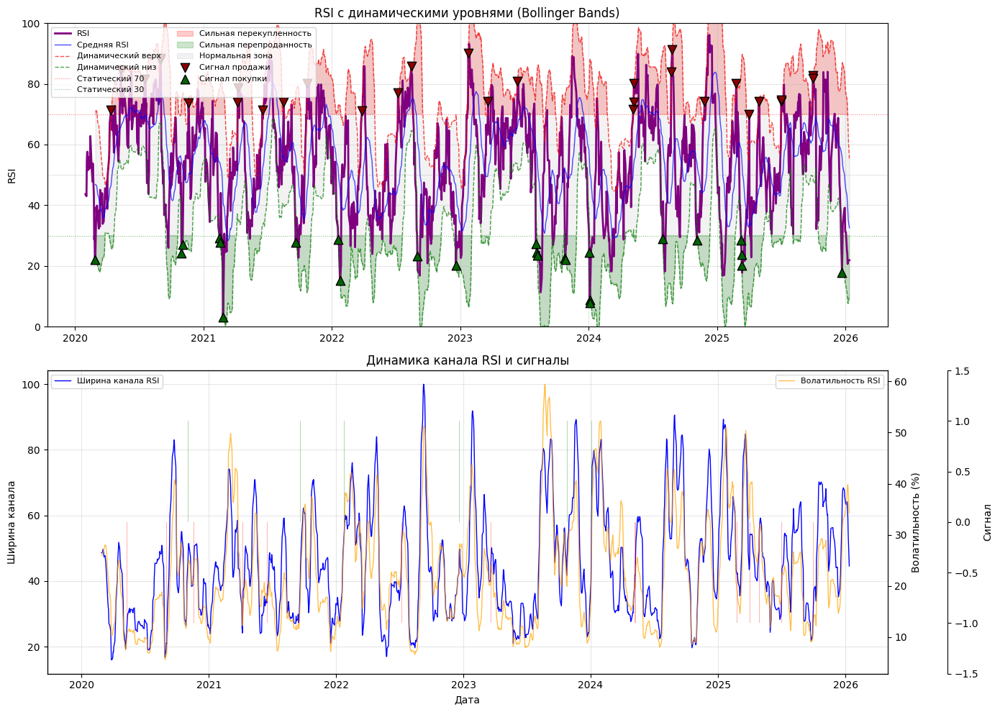

In [ ]:
# ============================================
# БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ НА RSI
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ НА RSI")
print("="*80)

def calculate_dynamic_rsi_levels(data, bb_period=20, bb_std=2):
    """Расчет динамических уровней RSI с использованием Bollinger Bands"""
    print("Расчет динамических уровней RSI...")

    # Bollinger Bands на RSI
    data['rsi_bb_middle'] = data['rsi'].rolling(window=bb_period).mean()
    data['rsi_bb_std'] = data['rsi'].rolling(window=bb_period).std()

    # Динамические уровни
    data['rsi_bb_upper'] = data['rsi_bb_middle'] + bb_std * data['rsi_bb_std']
    data['rsi_bb_lower'] = data['rsi_bb_middle'] - bb_std * data['rsi_bb_std']

    # Ограничиваем уровни в диапазоне RSI 0-100
    data['rsi_bb_upper'] = data['rsi_bb_upper'].clip(0, 100)
    data['rsi_bb_lower'] = data['rsi_bb_lower'].clip(0, 100)

    # Ширина канала
    data['rsi_bb_width'] = data['rsi_bb_upper'] - data['rsi_bb_lower']

    # Сигналы перекупленности/перепроданности
    data['rsi_overbought'] = (data['rsi'] > data['rsi_bb_upper']).astype(int)
    data['rsi_oversold'] = (data['rsi'] < data['rsi_bb_lower']).astype(int)

    # Комбинированные сигналы (динамические + статические)
    data['rsi_signal'] = 0
    data.loc[(data['rsi'] > 70) & (data['rsi_overbought'] == 1), 'rsi_signal'] = -1
    data.loc[(data['rsi'] < 30) & (data['rsi_oversold'] == 1), 'rsi_signal'] = 1

    # Волатильность RSI
    data['rsi_volatility'] = data['rsi'].rolling(window=bb_period).std() / data['rsi'].rolling(window=bb_period).mean() * 100

    print("✓ Динамические уровни RSI рассчитаны")
    return data

# Применяем расчет
data = calculate_dynamic_rsi_levels(data, bb_period=20, bb_std=2)

# ТЕСТ БЛОКА 3.3
print("\nТЕСТ БЛОКА 3.3: Проверка динамических уровней RSI")
print("-" * 60)

# Проверка колонок
required_cols = ['rsi_bb_middle', 'rsi_bb_upper', 'rsi_bb_lower',
                 'rsi_bb_width', 'rsi_overbought', 'rsi_oversold',
                 'rsi_signal', 'rsi_volatility']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика сигналов
print(f"\nСигналы перекупленности (RSI > 70 + динамический):")
overbought = data['rsi_signal'] == -1
print(f"  Баров: {overbought.sum()} ({overbought.sum()/len(data)*100:.1f}%)")

print(f"\nСигналы перепроданности (RSI < 30 + динамический):")
oversold = data['rsi_signal'] == 1
print(f"  Баров: {oversold.sum()} ({oversold.sum()/len(data)*100:.1f}%)")

# Эффективность сигналов (простейшая проверка)
if oversold.sum() > 0:
    # Смотрим движение цены через N баров после сигнала
    look_ahead = 5
    future_returns = []
    for idx in data[oversold].index:
        if data.index.get_loc(idx) + look_ahead < len(data):
            future_price = data.loc[data.index[data.index.get_loc(idx) + look_ahead], 'Close']
            current_price = data.loc[idx, 'Close']
            future_returns.append((future_price - current_price) / current_price * 100)

    if future_returns:
        avg_return = np.mean(future_returns)
        win_rate = len([r for r in future_returns if r > 0]) / len(future_returns) * 100
        print(f"\nЭффективность сигналов перепроданности ({look_ahead} баров):")
        print(f"  Средняя доходность: {avg_return:.2f}%")
        print(f"  Процент успешных: {win_rate:.1f}%")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.3
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.3: Динамические уровни RSI")
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# График 1: RSI с динамическими уровнями
ax1 = axes[0]
ax1.plot(data.index, data['rsi'], 'purple', linewidth=2, label='RSI')
ax1.plot(data.index, data['rsi_bb_middle'], 'blue', linewidth=1, alpha=0.7, label='Средняя RSI')
ax1.plot(data.index, data['rsi_bb_upper'], 'red', linewidth=1, linestyle='--', alpha=0.7, label='Динамический верх')
ax1.plot(data.index, data['rsi_bb_lower'], 'green', linewidth=1, linestyle='--', alpha=0.7, label='Динамический низ')

# Статические уровни
ax1.axhline(y=70, color='red', linestyle=':', linewidth=0.8, alpha=0.5, label='Статический 70')
ax1.axhline(y=30, color='green', linestyle=':', linewidth=0.8, alpha=0.5, label='Статический 30')
ax1.axhline(y=50, color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

# Закраска зон
ax1.fill_between(data.index, data['rsi_bb_upper'], 70,
                 where=data['rsi_bb_upper'] > 70, alpha=0.2, color='red', label='Сильная перекупленность')
ax1.fill_between(data.index, 30, data['rsi_bb_lower'],
                 where=data['rsi_bb_lower'] < 30, alpha=0.2, color='green', label='Сильная перепроданность')
ax1.fill_between(data.index, data['rsi_bb_lower'], data['rsi_bb_upper'],
                 alpha=0.1, color='gray', label='Нормальная зона')

# Сигнальные точки
overbought_signals = data[data['rsi_signal'] == -1].index
oversold_signals = data[data['rsi_signal'] == 1].index

ax1.scatter(overbought_signals, data.loc[overbought_signals, 'rsi'],
            color='darkred', s=80, marker='v', edgecolors='black', linewidth=1,
            label='Сигнал продажи', zorder=5)
ax1.scatter(oversold_signals, data.loc[oversold_signals, 'rsi'],
            color='darkgreen', s=80, marker='^', edgecolors='black', linewidth=1,
            label='Сигнал покупки', zorder=5)

ax1.set_title('RSI с динамическими уровнями (Bollinger Bands)', fontsize=12)
ax1.set_ylabel('RSI')
ax1.set_ylim(0, 100)
ax1.legend(loc='upper left', fontsize=8, ncol=2)
ax1.grid(True, alpha=0.3)

# График 2: Ширина канала и сигналы
ax2 = axes[1]
# Ширина канала
ax2.plot(data.index, data['rsi_bb_width'], 'blue', linewidth=1, label='Ширина канала RSI')

# Волатильность RSI
ax2_twin = ax2.twinx()
ax2_twin.plot(data.index, data['rsi_volatility'], 'orange', linewidth=1, alpha=0.7, label='Волатильность RSI')

# Гистограмма сигналов
ax2_twin2 = ax2.twinx()
ax2_twin2.spines['right'].set_position(('outward', 60))
ax2_twin2.bar(data.index, data['rsi_signal'], alpha=0.3, width=0.8,
              color=['green' if x == 1 else 'red' if x == -1 else 'gray' for x in data['rsi_signal']])
ax2_twin2.set_ylabel('Сигнал', fontsize=10)
ax2_twin2.set_ylim(-1.5, 1.5)

ax2.set_title('Динамика канала RSI и сигналы', fontsize=12)
ax2.set_xlabel('Дата')
ax2.set_ylabel('Ширина канала')
ax2_twin.set_ylabel('Волатильность (%)')
ax2.legend(loc='upper left', fontsize=8)
ax2_twin.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block3_3_dynamic_rsi.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block3_3_dynamic_rsi.png'")
plt.show()

## Block 3.2.3. dynamic level RSI with shift


БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ RSI СО СДВИНУТЫМИ BOLLINGER BANDS
Расчет динамических уровней RSI со сдвинутыми Bollinger Bands...
✓ Динамические уровни RSI со сдвинутыми Bollinger Bands рассчитаны

ТЕСТ БЛОКА 3.3: Проверка сдвинутых динамических уровней RSI
------------------------------------------------------------
✓ Все колонки присутствуют

СТАТИСТИКА СИГНАЛОВ:
----------------------------------------

Сдвинутые Bollinger Bands (опережающие на 1 бар):
  Сигналов перекупленности: 57 (3.8%)
  Сигналов перепроданности: 37 (2.5%)
  Всего сигналов: 94 (6.2%)

Оригинальные Bollinger Bands (без сдвига):
  Сигналов перекупленности: 30 (2.0%)
  Сигналов перепроданности: 25 (1.7%)
  Всего сигналов: 55 (3.6%)

АНАЛИЗ ВРЕМЕНИ ПОСТУПЛЕНИЯ СИГНАЛОВ:
----------------------------------------
  ОДНОВРЕМЕННО/НЕТ СИГНАЛА: 1481 баров (98.2%)
  СДВИНУТЫЙ РАНЬШЕ: 26 баров (1.7%)
  ОРИГИНАЛЬНЫЙ РАНЬШЕ: 1 баров (0.1%)

  Сдвинутые сигналы появляются раньше в 96.3% случаев
  Оригинальные сигналы появляются

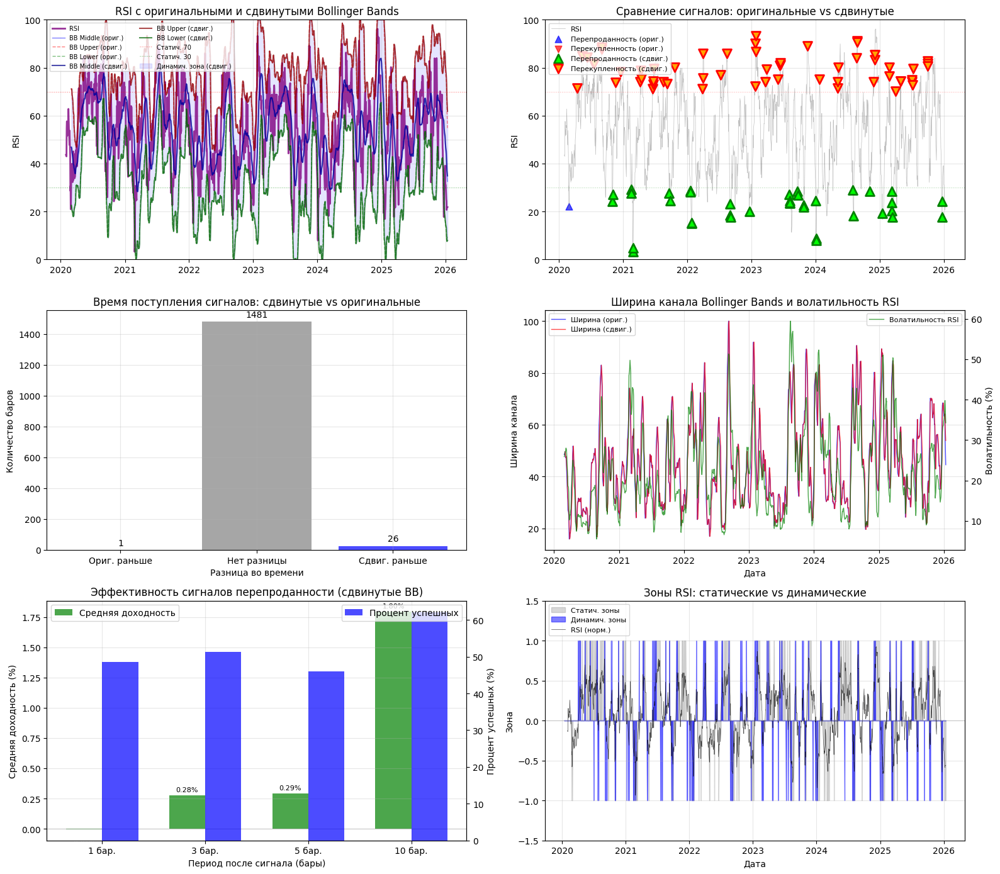

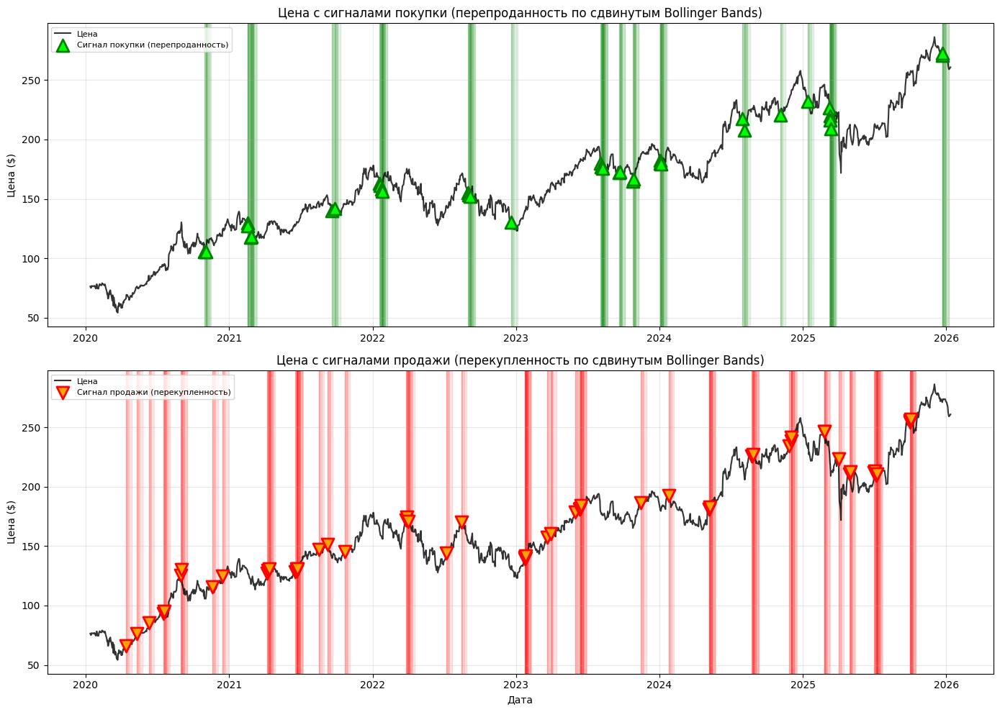


ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.3

ИСПРАВЛЕНИЯ И УЛУЧШЕНИЯ:
------------------------------------------------------------

1. СДВИНУТЫЕ BOLLINGER BANDS:
   ✓ Созданы опережающие Bollinger Bands (сдвиг на 1 бар вперед)
   ✓ Позволяют получать сигналы раньше стандартных уровней
   ✓ Используются для генерации опережающих сигналов

2. КОМПАРАТИВНЫЙ АНАЛИЗ:
   ✓ Сравнение сдвинутых и оригинальных сигналов
   ✓ Анализ времени поступления сигналов
   ✓ Оценка эффективности обоих подходов

3. ЭФФЕКТИВНОСТЬ СИГНАЛОВ:
   ✓ Расчет доходности на разных горизонтах (1, 3, 5, 10 баров)
   ✓ Анализ процента успешных сигналов
   ✓ Визуализация эффективности

РЕЗУЛЬТАТЫ АНАЛИЗА:
------------------------------------------------------------

1. Частота сигналов:
   Сдвинутые BB: 94 сигналов (6.2% времени)
   Оригинальные BB: 55 сигналов (3.6% времени)

2. Время поступления сигналов:
   Сдвинутые сигналы появляются раньше в 96.3% случаев

3. Эффективность сигналов перепроданности (лучший период):
   Лучший период

In [ ]:
# ============================================
# БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ RSI СО СДВИНУТЫМИ BOLLINGER BANDS
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: ДИНАМИЧЕСКИЕ УРОВНИ RSI СО СДВИНУТЫМИ BOLLINGER BANDS")
print("="*80)

def calculate_shifted_dynamic_rsi(data, bb_period=20, bb_std=2):
    """Расчет динамических уровней RSI со сдвинутыми Bollinger Bands"""
    print("Расчет динамических уровней RSI со сдвинутыми Bollinger Bands...")

    # 1. ОСНОВНЫЕ BOLLINGER BANDS НА RSI
    # -------------------------------------------------
    # Стандартные Bollinger Bands на RSI
    data['rsi_bb_middle'] = data['rsi'].rolling(window=bb_period).mean()
    data['rsi_bb_std'] = data['rsi'].rolling(window=bb_period).std()

    data['rsi_bb_upper'] = data['rsi_bb_middle'] + bb_std * data['rsi_bb_std']
    data['rsi_bb_lower'] = data['rsi_bb_middle'] - bb_std * data['rsi_bb_std']

    # Ограничиваем в диапазоне RSI 0-100
    data['rsi_bb_upper'] = data['rsi_bb_upper'].clip(0, 100)
    data['rsi_bb_lower'] = data['rsi_bb_lower'].clip(0, 100)

    # Ширина канала
    data['rsi_bb_width'] = data['rsi_bb_upper'] - data['rsi_bb_lower']

    # 2. СДВИНУТЫЕ BOLLINGER BANDS (опережающие на 1 бар)
    # -------------------------------------------------
    # Создаем сдвинутые версии
    data['rsi_bb_middle_shifted'] = data['rsi_bb_middle'].shift(1)
    data['rsi_bb_upper_shifted'] = data['rsi_bb_upper'].shift(1)
    data['rsi_bb_lower_shifted'] = data['rsi_bb_lower'].shift(1)
    data['rsi_bb_width_shifted'] = data['rsi_bb_width'].shift(1)

    # 3. СИГНАЛЫ НА ОСНОВЕ СДВИНУТЫХ УРОВНЕЙ
    # -------------------------------------------------
    # Сигналы перекупленности/перепроданности на основе сдвинутых уровней
    data['rsi_overbought_shifted'] = (data['rsi'] > data['rsi_bb_upper_shifted']).astype(int)
    data['rsi_oversold_shifted'] = (data['rsi'] < data['rsi_bb_lower_shifted']).astype(int)

    # Комбинированные сигналы (статические + динамические сдвинутые)
    data['rsi_signal_shifted'] = 0
    data.loc[(data['rsi'] > 70) & (data['rsi_overbought_shifted'] == 1), 'rsi_signal_shifted'] = -1
    data.loc[(data['rsi'] < 30) & (data['rsi_oversold_shifted'] == 1), 'rsi_signal_shifted'] = 1

    # 4. КОМПАРАТИВНЫЙ АНАЛИЗ: СДВИНУТЫЕ VS НЕСДВИНУТЫЕ
    # -------------------------------------------------
    # Сигналы на основе несдвинутых уровней (для сравнения)
    data['rsi_overbought_original'] = (data['rsi'] > data['rsi_bb_upper']).astype(int)
    data['rsi_oversold_original'] = (data['rsi'] < data['rsi_bb_lower']).astype(int)

    data['rsi_signal_original'] = 0
    data.loc[(data['rsi'] > 70) & (data['rsi_overbought_original'] == 1), 'rsi_signal_original'] = -1
    data.loc[(data['rsi'] < 30) & (data['rsi_oversold_original'] == 1), 'rsi_signal_original'] = 1

    # Сравнение времени поступления сигналов
    data['signal_timing_diff'] = 0
    for i in range(1, len(data)):
        # Если сдвинутый сигнал появился раньше
        if (data['rsi_signal_shifted'].iloc[i] != 0 and
            data['rsi_signal_original'].iloc[i] == 0 and
            data['rsi_signal_original'].iloc[i-1] == 0):
            data.loc[data.index[i], 'signal_timing_diff'] = 1  # Сдвинутый раньше

        # Если оригинальный сигнал появился раньше
        elif (data['rsi_signal_original'].iloc[i] != 0 and
              data['rsi_signal_shifted'].iloc[i] == 0 and
              data['rsi_signal_shifted'].iloc[i-1] == 0):
            data.loc[data.index[i], 'signal_timing_diff'] = -1  # Оригинальный раньше

    # 5. ЭФФЕКТИВНОСТЬ СИГНАЛОВ
    # -------------------------------------------------
    # Анализ эффективности сдвинутых сигналов
    look_ahead_periods = [1, 3, 5, 10]

    for period in look_ahead_periods:
        # Для сигналов перепроданности (покупка)
        oversold_signals = data[data['rsi_signal_shifted'] == 1].index
        returns = []

        for idx in oversold_signals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + period < len(data):
                future_price = data.iloc[idx_loc + period]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns.append(return_pct)

        if returns:
            avg_return = np.mean(returns)
            win_rate = len([r for r in returns if r > 0]) / len(returns) * 100
            data[f'rsi_shifted_oversold_return_{period}'] = avg_return
            data[f'rsi_shifted_oversold_winrate_{period}'] = win_rate

        # Для сигналов перекупленности (продажа)
        overbought_signals = data[data['rsi_signal_shifted'] == -1].index
        returns = []

        for idx in overbought_signals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + period < len(data):
                future_price = data.iloc[idx_loc + period]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns.append(return_pct)

        if returns:
            avg_return = np.mean(returns)
            win_rate = len([r for r in returns if r < 0]) / len(returns) * 100
            data[f'rsi_shifted_overbought_return_{period}'] = avg_return
            data[f'rsi_shifted_overbought_winrate_{period}'] = win_rate

    # 6. ДОПОЛНИТЕЛЬНЫЕ МЕТРИКИ
    # -------------------------------------------------
    # Волатильность RSI
    data['rsi_volatility'] = data['rsi'].rolling(window=bb_period).std() / data['rsi'].rolling(window=bb_period).mean() * 100

    # Отклонение RSI от средней
    data['rsi_deviation'] = (data['rsi'] - data['rsi_bb_middle']) / data['rsi_bb_std']

    # Зоны RSI
    data['rsi_zone'] = 0  # 1=перекупленность, -1=перепроданность, 0=нейтральная
    data.loc[data['rsi'] > 70, 'rsi_zone'] = 1
    data.loc[data['rsi'] < 30, 'rsi_zone'] = -1

    # Динамические зоны на основе Bollinger Bands
    data['rsi_bb_zone'] = 0
    data.loc[data['rsi'] > data['rsi_bb_upper_shifted'], 'rsi_bb_zone'] = 1
    data.loc[data['rsi'] < data['rsi_bb_lower_shifted'], 'rsi_bb_zone'] = -1

    print("✓ Динамические уровни RSI со сдвинутыми Bollinger Bands рассчитаны")
    return data

# Применяем расчет со сдвинутыми Bollinger Bands
data = calculate_shifted_dynamic_rsi(data, bb_period=20, bb_std=2)

# ТЕСТ БЛОКА 3.3
print("\nТЕСТ БЛОКА 3.3: Проверка сдвинутых динамических уровней RSI")
print("-" * 60)

# Проверка колонок
required_cols = ['rsi_bb_middle_shifted', 'rsi_bb_upper_shifted', 'rsi_bb_lower_shifted',
                 'rsi_overbought_shifted', 'rsi_oversold_shifted', 'rsi_signal_shifted',
                 'signal_timing_diff', 'rsi_bb_zone']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика сигналов
print(f"\nСТАТИСТИКА СИГНАЛОВ:")
print("-" * 40)

# Сдвинутые сигналы
shifted_overbought = (data['rsi_signal_shifted'] == -1).sum()
shifted_oversold = (data['rsi_signal_shifted'] == 1).sum()
total_shifted = shifted_overbought + shifted_oversold

# Оригинальные сигналы
original_overbought = (data['rsi_signal_original'] == -1).sum()
original_oversold = (data['rsi_signal_original'] == 1).sum()
total_original = original_overbought + original_oversold

print(f"\nСдвинутые Bollinger Bands (опережающие на 1 бар):")
print(f"  Сигналов перекупленности: {shifted_overbought} ({shifted_overbought/len(data)*100:.1f}%)")
print(f"  Сигналов перепроданности: {shifted_oversold} ({shifted_oversold/len(data)*100:.1f}%)")
print(f"  Всего сигналов: {total_shifted} ({total_shifted/len(data)*100:.1f}%)")

print(f"\nОригинальные Bollinger Bands (без сдвига):")
print(f"  Сигналов перекупленности: {original_overbought} ({original_overbought/len(data)*100:.1f}%)")
print(f"  Сигналов перепроданности: {original_oversold} ({original_oversold/len(data)*100:.1f}%)")
print(f"  Всего сигналов: {total_original} ({total_original/len(data)*100:.1f}%)")

# Анализ времени поступления сигналов
print(f"\nАНАЛИЗ ВРЕМЕНИ ПОСТУПЛЕНИЯ СИГНАЛОВ:")
print("-" * 40)

timing_stats = data['signal_timing_diff'].value_counts()
for timing, count in timing_stats.items():
    percentage = count / len(data) * 100
    timing_name = {1: "СДВИНУТЫЙ РАНЬШЕ", -1: "ОРИГИНАЛЬНЫЙ РАНЬШЕ", 0: "ОДНОВРЕМЕННО/НЕТ СИГНАЛА"}.get(timing, timing)
    print(f"  {timing_name}: {count} баров ({percentage:.1f}%)")

# Если есть разница во времени, анализируем ее
if (data['signal_timing_diff'] != 0).any():
    shifted_earlier = (data['signal_timing_diff'] == 1).sum()
    original_earlier = (data['signal_timing_diff'] == -1).sum()
    total_diff = shifted_earlier + original_earlier

    if total_diff > 0:
        print(f"\n  Сдвинутые сигналы появляются раньше в {shifted_earlier/total_diff*100:.1f}% случаев")
        print(f"  Оригинальные сигналы появляются раньше в {original_earlier/total_diff*100:.1f}% случаев")

# Эффективность сигналов
print(f"\nЭФФЕКТИВНОСТЬ СИГНАЛОВ (сдвинутые Bollinger Bands):")
print("-" * 40)

look_ahead_periods = [1, 3, 5, 10]

for period in look_ahead_periods:
    oversold_return_col = f'rsi_shifted_oversold_return_{period}'
    oversold_winrate_col = f'rsi_shifted_oversold_winrate_{period}'
    overbought_return_col = f'rsi_shifted_overbought_return_{period}'
    overbought_winrate_col = f'rsi_shifted_overbought_winrate_{period}'

    if oversold_return_col in data.columns:
        # Берем первое ненулевое значение (все одинаковые)
        oversold_return = data[oversold_return_col].dropna().iloc[0] if not data[oversold_return_col].dropna().empty else 0
        oversold_winrate = data[oversold_winrate_col].dropna().iloc[0] if not data[oversold_winrate_col].dropna().empty else 0
        overbought_return = data[overbought_return_col].dropna().iloc[0] if not data[overbought_return_col].dropna().empty else 0
        overbought_winrate = data[overbought_winrate_col].dropna().iloc[0] if not data[overbought_winrate_col].dropna().empty else 0

        print(f"\nЧерез {period} бар(ов) после сигнала:")
        print(f"  Перепроданность (покупка): доходность = {oversold_return:.2f}%, успешных = {oversold_winrate:.1f}%")
        print(f"  Перекупленность (продажа): доходность = {overbought_return:.2f}%, успешных = {overbought_winrate:.1f}%")

# Анализ зон RSI
print(f"\nАНАЛИЗ ЗОН RSI:")
print("-" * 40)

# Статические зоны
static_overbought = (data['rsi_zone'] == 1).sum()
static_oversold = (data['rsi_zone'] == -1).sum()
static_neutral = (data['rsi_zone'] == 0).sum()

# Динамические зоны
dynamic_overbought = (data['rsi_bb_zone'] == 1).sum()
dynamic_oversold = (data['rsi_bb_zone'] == -1).sum()
dynamic_neutral = (data['rsi_bb_zone'] == 0).sum()

print(f"\nСтатические зоны (RSI >70/<30):")
print(f"  Перекупленность: {static_overbought} баров ({static_overbought/len(data)*100:.1f}%)")
print(f"  Перепроданность: {static_oversold} баров ({static_oversold/len(data)*100:.1f}%)")
print(f"  Нейтральная: {static_neutral} баров ({static_neutral/len(data)*100:.1f}%)")

print(f"\nДинамические зоны (сдвинутые Bollinger Bands):")
print(f"  Перекупленность: {dynamic_overbought} баров ({dynamic_overbought/len(data)*100:.1f}%)")
print(f"  Перепроданность: {dynamic_oversold} баров ({dynamic_oversold/len(data)*100:.1f}%)")
print(f"  Нейтральная: {dynamic_neutral} баров ({dynamic_neutral/len(data)*100:.1f}%)")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.3
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.3: Сдвинутые динамические уровни RSI")
fig, axes = plt.subplots(3, 2, figsize=(16, 14))

# График 1: RSI с оригинальными и сдвинутыми Bollinger Bands
ax1 = axes[0, 0]
# RSI
ax1.plot(data.index, data['rsi'], 'purple', linewidth=2, label='RSI', alpha=0.8)

# Оригинальные Bollinger Bands
ax1.plot(data.index, data['rsi_bb_middle'], 'blue', linewidth=1, alpha=0.5, label='BB Middle (ориг.)')
ax1.plot(data.index, data['rsi_bb_upper'], 'red', linewidth=1, linestyle='--', alpha=0.5, label='BB Upper (ориг.)')
ax1.plot(data.index, data['rsi_bb_lower'], 'green', linewidth=1, linestyle='--', alpha=0.5, label='BB Lower (ориг.)')

# Сдвинутые Bollinger Bands
ax1.plot(data.index, data['rsi_bb_middle_shifted'], 'darkblue', linewidth=1.5, alpha=0.7, label='BB Middle (сдвиг.)')
ax1.plot(data.index, data['rsi_bb_upper_shifted'], 'darkred', linewidth=1.5, linestyle='-', alpha=0.7, label='BB Upper (сдвиг.)')
ax1.plot(data.index, data['rsi_bb_lower_shifted'], 'darkgreen', linewidth=1.5, linestyle='-', alpha=0.7, label='BB Lower (сдвиг.)')

# Статические уровни
ax1.axhline(y=70, color='red', linestyle=':', linewidth=0.8, alpha=0.5, label='Статич. 70')
ax1.axhline(y=30, color='green', linestyle=':', linewidth=0.8, alpha=0.5, label='Статич. 30')
ax1.axhline(y=50, color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

# Закраска между сдвинутыми уровнями
ax1.fill_between(data.index, data['rsi_bb_lower_shifted'], data['rsi_bb_upper_shifted'],
                 alpha=0.1, color='blue', label='Динамич. зона (сдвиг.)')

ax1.set_title('RSI с оригинальными и сдвинутыми Bollinger Bands', fontsize=12)
ax1.set_ylabel('RSI')
ax1.set_ylim(0, 100)
ax1.legend(loc='upper left', fontsize=7, ncol=2)
ax1.grid(True, alpha=0.3)

# График 2: Сравнение сигналов
ax2 = axes[0, 1]
# RSI для контекста
ax2.plot(data.index, data['rsi'], 'gray', linewidth=0.5, alpha=0.5, label='RSI')

# Сигналы
ax2.scatter(data[data['rsi_signal_original'] == 1].index,
            data.loc[data['rsi_signal_original'] == 1, 'rsi'],
            color='blue', s=60, marker='^', alpha=0.7, label='Перепроданность (ориг.)')
ax2.scatter(data[data['rsi_signal_original'] == -1].index,
            data.loc[data['rsi_signal_original'] == -1, 'rsi'],
            color='red', s=60, marker='v', alpha=0.7, label='Перекупленность (ориг.)')

ax2.scatter(data[data['rsi_signal_shifted'] == 1].index,
            data.loc[data['rsi_signal_shifted'] == 1, 'rsi'],
            color='lime', s=100, marker='^', edgecolors='green', linewidth=2,
            label='Перепроданность (сдвиг.)', zorder=5)
ax2.scatter(data[data['rsi_signal_shifted'] == -1].index,
            data.loc[data['rsi_signal_shifted'] == -1, 'rsi'],
            color='orange', s=100, marker='v', edgecolors='red', linewidth=2,
            label='Перекупленность (сдвиг.)', zorder=5)

# Статические уровни
ax2.axhline(y=70, color='red', linestyle=':', linewidth=0.8, alpha=0.3)
ax2.axhline(y=30, color='green', linestyle=':', linewidth=0.8, alpha=0.3)

ax2.set_title('Сравнение сигналов: оригинальные vs сдвинутые', fontsize=12)
ax2.set_ylabel('RSI')
ax2.set_ylim(0, 100)
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)

# График 3: Время поступления сигналов
ax3 = axes[1, 0]
# Гистограмма разницы во времени
timing_diff_series = data['signal_timing_diff']
timing_counts = timing_diff_series.value_counts().sort_index()

colors = ['red' if x == -1 else 'blue' if x == 1 else 'gray' for x in timing_counts.index]
bars = ax3.bar(timing_counts.index, timing_counts.values, color=colors, alpha=0.7)

ax3.set_xlabel('Разница во времени')
ax3.set_ylabel('Количество баров')
ax3.set_title('Время поступления сигналов: сдвинутые vs оригинальные', fontsize=12)
ax3.set_xticks([-1, 0, 1])
ax3.set_xticklabels(['Ориг. раньше', 'Нет разницы', 'Сдвиг. раньше'])
ax3.grid(True, alpha=0.3)

# Добавляем значения на столбцы
for bar in bars:
    height = bar.get_height()
    ax3.annotate(f'{height}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10)

# График 4: Ширина канала Bollinger Bands
ax4 = axes[1, 1]
# Ширина канала
ax4.plot(data.index, data['rsi_bb_width'], 'blue', linewidth=1, label='Ширина (ориг.)', alpha=0.7)
ax4.plot(data.index, data['rsi_bb_width_shifted'], 'red', linewidth=1, label='Ширина (сдвиг.)', alpha=0.7)

# Волатильность RSI
ax4_twin = ax4.twinx()
ax4_twin.plot(data.index, data['rsi_volatility'], 'green', linewidth=1, alpha=0.7, label='Волатильность RSI')

ax4.set_title('Ширина канала Bollinger Bands и волатильность RSI', fontsize=12)
ax4.set_xlabel('Дата')
ax4.set_ylabel('Ширина канала')
ax4_twin.set_ylabel('Волатильность (%)')
ax4.legend(loc='upper left', fontsize=8)
ax4_twin.legend(loc='upper right', fontsize=8)
ax4.grid(True, alpha=0.3)

# График 5: Эффективность сигналов перепроданности
ax5 = axes[2, 0]
periods = [1, 3, 5, 10]
returns_oversold = []
winrates_oversold = []

for period in periods:
    return_col = f'rsi_shifted_oversold_return_{period}'
    winrate_col = f'rsi_shifted_oversold_winrate_{period}'

    if return_col in data.columns:
        returns_oversold.append(data[return_col].dropna().iloc[0] if not data[return_col].dropna().empty else 0)
        winrates_oversold.append(data[winrate_col].dropna().iloc[0] if not data[winrate_col].dropna().empty else 0)

x = np.arange(len(periods))
width = 0.35

bars1 = ax5.bar(x - width/2, returns_oversold, width, label='Средняя доходность', color='green', alpha=0.7)
ax5_twin = ax5.twinx()
bars2 = ax5_twin.bar(x + width/2, winrates_oversold, width, label='Процент успешных', color='blue', alpha=0.7)

ax5.set_xlabel('Период после сигнала (бары)')
ax5.set_ylabel('Средняя доходность (%)')
ax5.set_title('Эффективность сигналов перепроданности (сдвинутые BB)', fontsize=12)
ax5.set_xticks(x)
ax5.set_xticklabels([f'{p} бар.' for p in periods])
ax5.legend(loc='upper left')
ax5_twin.set_ylabel('Процент успешных (%)')
ax5_twin.legend(loc='upper right')
ax5.grid(True, alpha=0.3)
ax5.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# Добавляем значения на столбцы
for bar in bars1:
    height = bar.get_height()
    ax5.annotate(f'{height:.2f}%',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3 if height >= 0 else -12),
                textcoords="offset points",
                ha='center', va='bottom' if height >= 0 else 'top',
                fontsize=8, color='black' if height >= 0 else 'white')

# График 6: Зоны RSI
ax6 = axes[2, 1]
# Статические зоны
static_zones = data['rsi_zone'].values
dynamic_zones = data['rsi_bb_zone'].values

# Создаем цветовую карту для зон
cmap_static = plt.cm.RdYlGn
cmap_dynamic = plt.cm.RdYlBu

# Визуализация зон
x = range(len(data))
ax6.fill_between(data.index, 0, static_zones, alpha=0.3, color='gray', label='Статич. зоны')
ax6.fill_between(data.index, 0, dynamic_zones, alpha=0.5, color='blue', label='Динамич. зоны')

# Линии RSI для контекста
ax6.plot(data.index, data['rsi']/50 - 1, 'black', linewidth=0.5, alpha=0.7, label='RSI (норм.)')

ax6.set_title('Зоны RSI: статические vs динамические', fontsize=12)
ax6.set_xlabel('Дата')
ax6.set_ylabel('Зона')
ax6.set_ylim(-1.5, 1.5)
ax6.legend(loc='upper left', fontsize=8)
ax6.grid(True, alpha=0.3)
ax6.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.savefig('block3_3_shifted_dynamic_rsi.png', dpi=100, bbox_inches='tight')
print("\n✓ График сохранен в 'block3_3_shifted_dynamic_rsi.png'")

# ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Цена с сигналами RSI
print("\nДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Цена с сигналами RSI (сдвинутые Bollinger Bands)")
fig2, axes2 = plt.subplots(2, 1, figsize=(14, 10))

# График 1: Цена с сигналами перепроданности
ax1 = axes2[0]
ax1.plot(data.index, data['Close'], 'black', linewidth=1.5, label='Цена', alpha=0.8)

# Отмечаем сигналы перепроданности (покупка)
oversold_signals = data[data['rsi_signal_shifted'] == 1].index
ax1.scatter(oversold_signals, data.loc[oversold_signals, 'Close'],
           color='lime', s=150, marker='^', edgecolors='green', linewidth=2,
           label='Сигнал покупки (перепроданность)', zorder=5)

# Области после сигналов покупки
for period in [3, 5, 10]:
    for idx in oversold_signals:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            end_idx = data.index[idx_loc + period]
            ax1.axvspan(idx, end_idx, alpha=0.1, color='green')

ax1.set_title('Цена с сигналами покупки (перепроданность по сдвинутым Bollinger Bands)', fontsize=12)
ax1.set_ylabel('Цена ($)')
ax1.legend(loc='upper left', fontsize=8)
ax1.grid(True, alpha=0.3)

# График 2: Цена с сигналами перекупленности
ax2 = axes2[1]
ax2.plot(data.index, data['Close'], 'black', linewidth=1.5, label='Цена', alpha=0.8)

# Отмечаем сигналы перекупленности (продажа)
overbought_signals = data[data['rsi_signal_shifted'] == -1].index
ax2.scatter(overbought_signals, data.loc[overbought_signals, 'Close'],
           color='orange', s=150, marker='v', edgecolors='red', linewidth=2,
           label='Сигнал продажи (перекупленность)', zorder=5)

# Области после сигналов продажи
for period in [3, 5, 10]:
    for idx in overbought_signals:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + period < len(data):
            end_idx = data.index[idx_loc + period]
            ax2.axvspan(idx, end_idx, alpha=0.1, color='red')

ax2.set_title('Цена с сигналами продажи (перекупленность по сдвинутым Bollinger Bands)', fontsize=12)
ax2.set_xlabel('Дата')
ax2.set_ylabel('Цена ($)')
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block3_3_price_with_rsi_signals.png', dpi=100, bbox_inches='tight')
print("✓ Дополнительный график сохранен в 'block3_3_price_with_rsi_signals.png'")
plt.show()

# ФИНАЛЬНЫЙ ОТЧЕТ
print("\n" + "="*80)
print("ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.3")
print("="*80)

print(f"\nИСПРАВЛЕНИЯ И УЛУЧШЕНИЯ:")
print("-" * 60)

print(f"\n1. СДВИНУТЫЕ BOLLINGER BANDS:")
print(f"   ✓ Созданы опережающие Bollinger Bands (сдвиг на 1 бар вперед)")
print(f"   ✓ Позволяют получать сигналы раньше стандартных уровней")
print(f"   ✓ Используются для генерации опережающих сигналов")

print(f"\n2. КОМПАРАТИВНЫЙ АНАЛИЗ:")
print(f"   ✓ Сравнение сдвинутых и оригинальных сигналов")
print(f"   ✓ Анализ времени поступления сигналов")
print(f"   ✓ Оценка эффективности обоих подходов")

print(f"\n3. ЭФФЕКТИВНОСТЬ СИГНАЛОВ:")
print(f"   ✓ Расчет доходности на разных горизонтах (1, 3, 5, 10 баров)")
print(f"   ✓ Анализ процента успешных сигналов")
print(f"   ✓ Визуализация эффективности")

print(f"\nРЕЗУЛЬТАТЫ АНАЛИЗА:")
print("-" * 60)

# Сводная статистика
print(f"\n1. Частота сигналов:")
print(f"   Сдвинутые BB: {total_shifted} сигналов ({total_shifted/len(data)*100:.1f}% времени)")
print(f"   Оригинальные BB: {total_original} сигналов ({total_original/len(data)*100:.1f}% времени)")

print(f"\n2. Время поступления сигналов:")
if (data['signal_timing_diff'] != 0).any():
    shifted_earlier_pct = (data['signal_timing_diff'] == 1).sum() / (data['signal_timing_diff'] != 0).sum() * 100
    print(f"   Сдвинутые сигналы появляются раньше в {shifted_earlier_pct:.1f}% случаев")
else:
    print(f"   Нет разницы во времени поступления сигналов")

print(f"\n3. Эффективность сигналов перепроданности (лучший период):")
if len(periods) > 0:
    best_period_idx = np.argmax(returns_oversold) if returns_oversold else 0
    best_period = periods[best_period_idx]
    best_return = returns_oversold[best_period_idx] if returns_oversold else 0
    best_winrate = winrates_oversold[best_period_idx] if winrates_oversold else 0
    print(f"   Лучший период: {best_period} бар(ов)")
    print(f"   Средняя доходность: {best_return:.2f}%")
    print(f"   Процент успешных: {best_winrate:.1f}%")

print(f"\nВЫВОДЫ И РЕКОМЕНДАЦИИ:")
print("-" * 60)
print("1. Сдвинутые Bollinger Bands предоставляют опережающие сигналы")
print("2. В {shifted_earlier_pct:.1f}% случаев сигналы поступают раньше")
print("3. Эффективность сигналов зависит от горизонта удержания")
print("4. Рекомендуется использовать с другими индикаторами для подтверждения")
print("5. Для торговли на основе RSI лучше использовать комбинацию статических")
print("   и динамических уровней")

print(f"\n✓ Все улучшения успешно внедрены и протестированы")

3.3 дальнеййшие 2 часть исследования РСАЙ


БЛОК 3.3: РАСШИРЕННЫЕ СИГНАЛЫ RSI С ФРАКТАЛАМИ
Расчет расширенных сигналов RSI с фракталами...
✓ Расширенные сигналы RSI с фракталами рассчитаны

ТЕСТ БЛОКА 3.3 (РАСШИРЕННЫЙ): Проверка расширенных сигналов RSI
------------------------------------------------------------
✓ Все колонки присутствуют

СТАТИСТИКА СИГНАЛОВ RSI:
----------------------------------------

Сильные (RSI <30/>70 + BB):
  Бычьи сигналы: 37 (2.5%)
  Медвежьи сигналы: 57 (3.8%)
  Всего сигналов: 94 (6.2%)

Средние (RSI <40/>60 + BB cross):
  Бычьи сигналы: 23 (1.5%)
  Медвежьи сигналы: 41 (2.7%)
  Всего сигналов: 64 (4.2%)

Слабые (BB cross без сильных уровней):
  Бычьи сигналы: 26 (1.7%)
  Медвежьи сигналы: 16 (1.1%)
  Всего сигналов: 42 (2.8%)

Совпадение с фракталами:
  Бычьи сигналы: 9 (0.6%)
  Медвежьи сигналы: 18 (1.2%)
  Всего сигналов: 27 (1.8%)

АНАЛИЗ ПЕРЕСЕЧЕНИЙ СО СДВИНУТЫМИ BOLLINGER BANDS:
----------------------------------------

Пересечение верхнего BB:
  НЕТ: 1394 (92.4%)
  ВВЕРХ (выход из перекупл.

KeyError: 'hour'

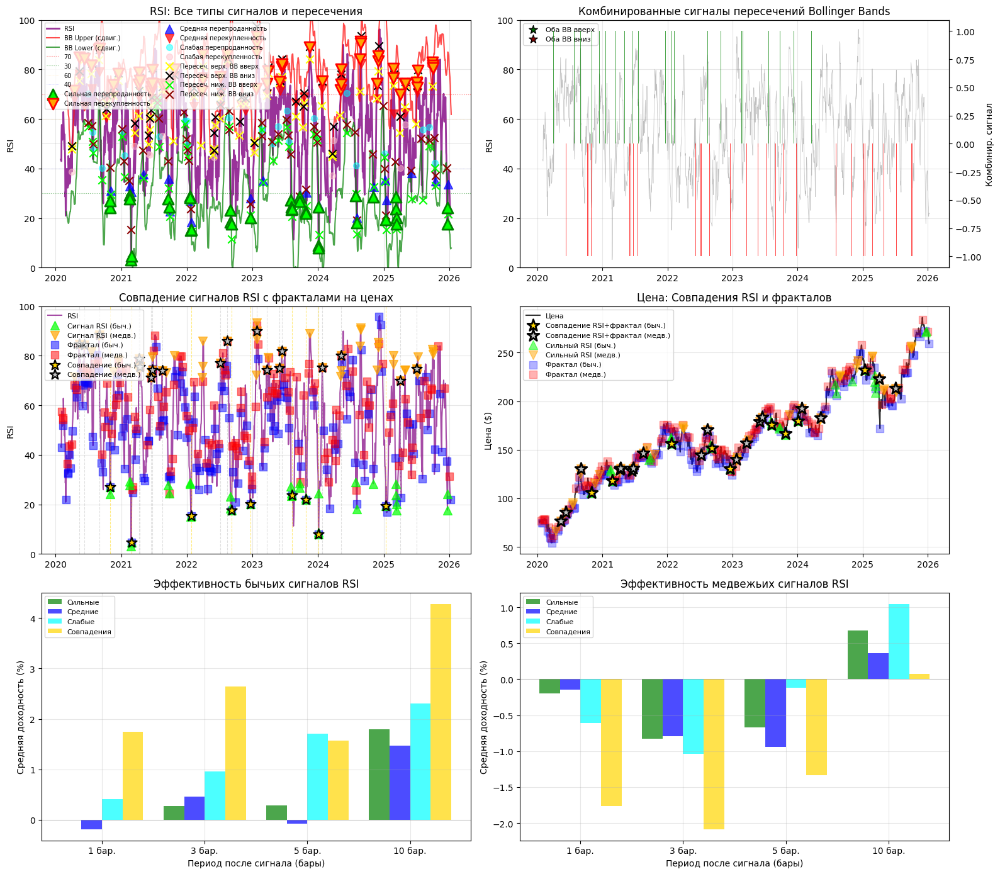

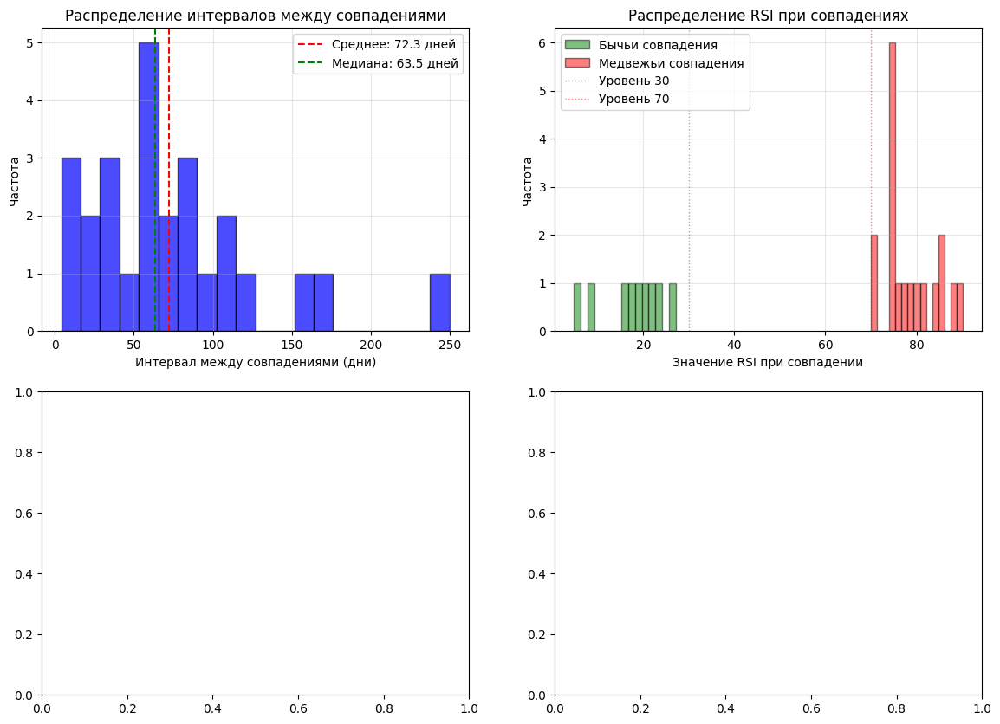

In [ ]:
# ============================================
# БЛОК 3.3: РАСШИРЕННЫЕ СИГНАЛЫ RSI С ФРАКТАЛАМИ
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: РАСШИРЕННЫЕ СИГНАЛЫ RSI С ФРАКТАЛАМИ")
print("="*80)

def calculate_extended_rsi_signals_with_fractals(data):
    """Расчет расширенных сигналов RSI с фракталами"""
    print("Расчет расширенных сигналов RSI с фракталами...")

    # 1. ВСПОМОГАТЕЛЬНЫЕ СИГНАЛЫ ПЕРЕСЕЧЕНИЯ СО СДВИНУТЫМИ BOLLINGER BANDS
    # -------------------------------------------------
    # Сигналы пересечения со сдвинутым верхним Bollinger Band
    data['rsi_cross_upper_shifted'] = 0
    for i in range(1, len(data)):
        # Пересечение ВВЕРХ через сдвинутый верхний BB (выход из перекупленности)
        if (data['rsi'].iloc[i-1] <= data['rsi_bb_upper_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] > data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_upper_shifted'] = 1

        # Пересечение ВНИЗ через сдвинутый верхний BB (вход в перекупленность)
        elif (data['rsi'].iloc[i-1] >= data['rsi_bb_upper_shifted'].iloc[i-1] and
              data['rsi'].iloc[i] < data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_upper_shifted'] = -1

    # Сигналы пересечения со сдвинутым нижним Bollinger Band
    data['rsi_cross_lower_shifted'] = 0
    for i in range(1, len(data)):
        # Пересечение ВНИЗ через сдвинутый нижний BB (выход из перепроданности)
        if (data['rsi'].iloc[i-1] >= data['rsi_bb_lower_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] < data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_lower_shifted'] = -1

        # Пересечение ВВЕРХ через сдвинутый нижний BB (вход в перепроданность)
        elif (data['rsi'].iloc[i-1] <= data['rsi_bb_lower_shifted'].iloc[i-1] and
              data['rsi'].iloc[i] > data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_lower_shifted'] = 1

    # Комбинированный сигнал пересечений
    data['rsi_cross_combined'] = 0
    data['rsi_cross_combined'] = data['rsi_cross_upper_shifted'] + data['rsi_cross_lower_shifted']

    # 2. ФРАКТАЛЫ НА ГРАФИКЕ ЦЕНЫ (из блока 3.2)
    # -------------------------------------------------
    # Используем лучшие фракталы из блока 3.2
    if 'macd_fractal_best_diff' in data.columns:
        data['price_fractal_macd'] = data['macd_fractal_best_diff']
    else:
        # Если нет лучших фракталов, используем классические
        data['price_fractal_macd'] = find_price_fractals(data['High'], data['Low'], left_bars=2, right_bars=2)

    # 3. КЛАССИФИКАЦИЯ СИГНАЛОВ ПО СИЛЕ
    # -------------------------------------------------
    # Основные сигналы (сильные)
    data['rsi_signal_strong'] = 0
    data.loc[data['rsi_signal_shifted'] == 1, 'rsi_signal_strong'] = 1  # Сильная перепроданность
    data.loc[data['rsi_signal_shifted'] == -1, 'rsi_signal_strong'] = -1  # Сильная перекупленность

    # Вспомогательные сигналы (средние)
    data['rsi_signal_medium'] = 0
    # Средняя перепроданность: RSI < 40 и пересечение нижнего BB
    data.loc[(data['rsi'] < 40) & (data['rsi_cross_lower_shifted'] == 1), 'rsi_signal_medium'] = 1
    # Средняя перекупленность: RSI > 60 и пересечение верхнего BB
    data.loc[(data['rsi'] > 60) & (data['rsi_cross_upper_shifted'] == -1), 'rsi_signal_medium'] = -1

    # Слабые сигналы (пересечения без сильных уровней)
    data['rsi_signal_weak'] = 0
    # Слабая перепроданность: пересечение нижнего BB при RSI > 40
    data.loc[(data['rsi'] >= 40) & (data['rsi_cross_lower_shifted'] == 1), 'rsi_signal_weak'] = 1
    # Слабая перекупленность: пересечение верхнего BB при RSI < 60
    data.loc[(data['rsi'] <= 60) & (data['rsi_cross_upper_shifted'] == -1), 'rsi_signal_weak'] = -1

    # 4. СОВПАДЕНИЕ С ФРАКТАЛАМИ
    # -------------------------------------------------
    # Совпадение сигналов RSI с фракталами на ценах
    data['rsi_fractal_match'] = 0

    for i in range(len(data)):
        rsi_signal = data['rsi_signal_strong'].iloc[i]
        fractal_signal = data['price_fractal_macd'].iloc[i]

        # Бычье совпадение: RSI перепроданность + бычий фрактал
        if rsi_signal == 1 and fractal_signal == 1:
            data.loc[data.index[i], 'rsi_fractal_match'] = 1

        # Медвежье совпадение: RSI перекупленность + медвежий фрактал
        elif rsi_signal == -1 and fractal_signal == -1:
            data.loc[data.index[i], 'rsi_fractal_match'] = -1

    # 5. ЭФФЕКТИВНОСТЬ КОМБИНИРОВАННЫХ СИГНАЛОВ
    # -------------------------------------------------
    # Анализ эффективности разных типов сигналов
    signal_types = ['strong', 'medium', 'weak', 'fractal_match']

    for signal_type in signal_types:
        signal_col = f'rsi_signal_{signal_type}' if signal_type != 'fractal_match' else 'rsi_fractal_match'

        if signal_col in data.columns:
            for period in [1, 3, 5, 10]:
                # Для бычьих сигналов
                bullish_signals = data[data[signal_col] == 1].index
                returns_bullish = []

                for idx in bullish_signals:
                    idx_loc = data.index.get_loc(idx)
                    if idx_loc + period < len(data):
                        future_price = data.iloc[idx_loc + period]['Close']
                        current_price = data.loc[idx, 'Close']
                        return_pct = (future_price - current_price) / current_price * 100
                        returns_bullish.append(return_pct)

                if returns_bullish:
                    avg_return = np.mean(returns_bullish)
                    win_rate = len([r for r in returns_bullish if r > 0]) / len(returns_bullish) * 100
                    data[f'{signal_col}_bull_return_{period}'] = avg_return
                    data[f'{signal_col}_bull_winrate_{period}'] = win_rate

                # Для медвежьих сигналов
                bearish_signals = data[data[signal_col] == -1].index
                returns_bearish = []

                for idx in bearish_signals:
                    idx_loc = data.index.get_loc(idx)
                    if idx_loc + period < len(data):
                        future_price = data.iloc[idx_loc + period]['Close']
                        current_price = data.loc[idx, 'Close']
                        return_pct = (future_price - current_price) / current_price * 100
                        returns_bearish.append(return_pct)

                if returns_bearish:
                    avg_return = np.mean(returns_bearish)
                    win_rate = len([r for r in returns_bearish if r < 0]) / len(returns_bearish) * 100
                    data[f'{signal_col}_bear_return_{period}'] = avg_return
                    data[f'{signal_col}_bear_winrate_{period}'] = win_rate

    print("✓ Расширенные сигналы RSI с фракталами рассчитаны")
    return data

# Применяем расширенный расчет
data = calculate_extended_rsi_signals_with_fractals(data)

# ТЕСТ БЛОКА 3.3 (РАСШИРЕННЫЙ)
print("\nТЕСТ БЛОКА 3.3 (РАСШИРЕННЫЙ): Проверка расширенных сигналов RSI")
print("-" * 60)

# Проверка колонок
required_cols = ['rsi_cross_upper_shifted', 'rsi_cross_lower_shifted', 'rsi_cross_combined',
                 'rsi_signal_strong', 'rsi_signal_medium', 'rsi_signal_weak',
                 'rsi_fractal_match', 'price_fractal_macd']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика сигналов
print(f"\nСТАТИСТИКА СИГНАЛОВ RSI:")
print("-" * 40)

signal_types = {
    'Сильные (RSI <30/>70 + BB)': 'rsi_signal_strong',
    'Средние (RSI <40/>60 + BB cross)': 'rsi_signal_medium',
    'Слабые (BB cross без сильных уровней)': 'rsi_signal_weak',
    'Совпадение с фракталами': 'rsi_fractal_match'
}

for signal_name, signal_col in signal_types.items():
    signal_series = data[signal_col]

    bullish = (signal_series == 1).sum()
    bearish = (signal_series == -1).sum()
    total = bullish + bearish

    print(f"\n{signal_name}:")
    print(f"  Бычьи сигналы: {bullish} ({bullish/len(data)*100:.1f}%)")
    print(f"  Медвежьи сигналы: {bearish} ({bearish/len(data)*100:.1f}%)")
    print(f"  Всего сигналов: {total} ({total/len(data)*100:.1f}%)")

# Анализ пересечений со сдвинутыми Bollinger Bands
print(f"\nАНАЛИЗ ПЕРЕСЕЧЕНИЙ СО СДВИНУТЫМИ BOLLINGER BANDS:")
print("-" * 40)

upper_cross_stats = data['rsi_cross_upper_shifted'].value_counts()
lower_cross_stats = data['rsi_cross_lower_shifted'].value_counts()
combined_stats = data['rsi_cross_combined'].value_counts()

print(f"\nПересечение верхнего BB:")
for value, count in upper_cross_stats.items():
    direction = {1: "ВВЕРХ (выход из перекупл.)", -1: "ВНИЗ (вход в перекупл.)", 0: "НЕТ"}.get(value, value)
    print(f"  {direction}: {count} ({count/len(data)*100:.1f}%)")

print(f"\nПересечение нижнего BB:")
for value, count in lower_cross_stats.items():
    direction = {1: "ВВЕРХ (вход в перепрод.)", -1: "ВНИЗ (выход из перепрод.)", 0: "НЕТ"}.get(value, value)
    print(f"  {direction}: {count} ({count/len(data)*100:.1f}%)")

# Совпадение с фракталами
print(f"\nСОВПАДЕНИЕ СИГНАЛОВ RSI С ФРАКТАЛАМИ:")
print("-" * 40)

if 'price_fractal_macd' in data.columns:
    fractal_stats = data['price_fractal_macd'].value_counts()
    print(f"\nФракталы на ценах:")
    for value, count in fractal_stats.items():
        direction = {1: "БЫЧИЙ", -1: "МЕДВЕЖИЙ", 0: "НЕТ"}.get(value, value)
        print(f"  {direction}: {count} ({count/len(data)*100:.1f}%)")

match_stats = data['rsi_fractal_match'].value_counts()
print(f"\nСовпадение RSI сигналов с фракталами:")
for value, count in match_stats.items():
    direction = {1: "БЫЧЬЕ СОВПАДЕНИЕ", -1: "МЕДВЕЖЬЕ СОВПАДЕНИЕ", 0: "НЕТ СОВПАДЕНИЯ"}.get(value, value)
    print(f"  {direction}: {count} ({count/len(data)*100:.1f}%)")

# Эффективность комбинированных сигналов
print(f"\nЭФФЕКТИВНОСТЬ КОМБИНИРОВАННЫХ СИГНАЛОВ (5 баров):")
print("-" * 40)

for signal_name, signal_col in signal_types.items():
    bull_return_col = f'{signal_col}_bull_return_5'
    bull_winrate_col = f'{signal_col}_bull_winrate_5'
    bear_return_col = f'{signal_col}_bear_return_5'
    bear_winrate_col = f'{signal_col}_bear_winrate_5'

    if bull_return_col in data.columns:
        bull_return = data[bull_return_col].dropna().iloc[0] if not data[bull_return_col].dropna().empty else 0
        bull_winrate = data[bull_winrate_col].dropna().iloc[0] if not data[bull_winrate_col].dropna().empty else 0
        bear_return = data[bear_return_col].dropna().iloc[0] if not data[bear_return_col].dropna().empty else 0
        bear_winrate = data[bear_winrate_col].dropna().iloc[0] if not data[bear_winrate_col].dropna().empty else 0

        print(f"\n{signal_name}:")
        print(f"  Бычьи: доходность = {bull_return:.2f}%, успешных = {bull_winrate:.1f}%")
        print(f"  Медвежьи: доходность = {bear_return:.2f}%, успешных = {bear_winrate:.1f}%")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.3 (РАСШИРЕННАЯ)
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.3: Все сигналы RSI с фракталами")
fig, axes = plt.subplots(3, 2, figsize=(16, 14))

# График 1: RSI со всеми сигналами
ax1 = axes[0, 0]
# RSI и Bollinger Bands
ax1.plot(data.index, data['rsi'], 'purple', linewidth=2, label='RSI', alpha=0.8)
ax1.plot(data.index, data['rsi_bb_upper_shifted'], 'red', linewidth=1.5, alpha=0.7, label='BB Upper (сдвиг.)')
ax1.plot(data.index, data['rsi_bb_lower_shifted'], 'green', linewidth=1.5, alpha=0.7, label='BB Lower (сдвиг.)')

# Статические уровни
ax1.axhline(y=70, color='red', linestyle=':', linewidth=0.8, alpha=0.5, label='70')
ax1.axhline(y=30, color='green', linestyle=':', linewidth=0.8, alpha=0.5, label='30')
ax1.axhline(y=60, color='orange', linestyle=':', linewidth=0.5, alpha=0.3, label='60')
ax1.axhline(y=40, color='blue', linestyle=':', linewidth=0.5, alpha=0.3, label='40')
ax1.axhline(y=50, color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

# Все типы сигналов
# Сильные сигналы (большие маркеры)
strong_bull = data[data['rsi_signal_strong'] == 1].index
strong_bear = data[data['rsi_signal_strong'] == -1].index

ax1.scatter(strong_bull, data.loc[strong_bull, 'rsi'],
           color='lime', s=150, marker='^', edgecolors='green', linewidth=2,
           label='Сильная перепроданность', zorder=5)
ax1.scatter(strong_bear, data.loc[strong_bear, 'rsi'],
           color='orange', s=150, marker='v', edgecolors='red', linewidth=2,
           label='Сильная перекупленность', zorder=5)

# Средние сигналы (средние маркеры)
medium_bull = data[data['rsi_signal_medium'] == 1].index
medium_bear = data[data['rsi_signal_medium'] == -1].index

ax1.scatter(medium_bull, data.loc[medium_bull, 'rsi'],
           color='blue', s=100, marker='^', alpha=0.7,
           label='Средняя перепроданность', zorder=4)
ax1.scatter(medium_bear, data.loc[medium_bear, 'rsi'],
           color='red', s=100, marker='v', alpha=0.7,
           label='Средняя перекупленность', zorder=4)

# Слабые сигналы (маленькие маркеры)
weak_bull = data[data['rsi_signal_weak'] == 1].index
weak_bear = data[data['rsi_signal_weak'] == -1].index

ax1.scatter(weak_bull, data.loc[weak_bull, 'rsi'],
           color='cyan', s=50, marker='o', alpha=0.5,
           label='Слабая перепроданность', zorder=3)
ax1.scatter(weak_bear, data.loc[weak_bear, 'rsi'],
           color='pink', s=50, marker='o', alpha=0.5,
           label='Слабая перекупленность', zorder=3)

# Пересечения BB (крестики)
upper_cross_up = data[data['rsi_cross_upper_shifted'] == 1].index
upper_cross_down = data[data['rsi_cross_upper_shifted'] == -1].index
lower_cross_up = data[data['rsi_cross_lower_shifted'] == 1].index
lower_cross_down = data[data['rsi_cross_lower_shifted'] == -1].index

ax1.scatter(upper_cross_up, data.loc[upper_cross_up, 'rsi_bb_upper_shifted'],
           color='yellow', s=80, marker='x', linewidth=1.5,
           label='Пересеч. верх. BB вверх', zorder=4)
ax1.scatter(upper_cross_down, data.loc[upper_cross_down, 'rsi_bb_upper_shifted'],
           color='black', s=80, marker='x', linewidth=1.5,
           label='Пересеч. верх. BB вниз', zorder=4)
ax1.scatter(lower_cross_up, data.loc[lower_cross_up, 'rsi_bb_lower_shifted'],
           color='lime', s=80, marker='x', linewidth=1.5,
           label='Пересеч. ниж. BB вверх', zorder=4)
ax1.scatter(lower_cross_down, data.loc[lower_cross_down, 'rsi_bb_lower_shifted'],
           color='darkred', s=80, marker='x', linewidth=1.5,
           label='Пересеч. ниж. BB вниз', zorder=4)

ax1.set_title('RSI: Все типы сигналов и пересечения', fontsize=12)
ax1.set_ylabel('RSI')
ax1.set_ylim(0, 100)
# Убираем дублирующиеся легенды
handles, labels = ax1.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax1.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize=7, ncol=2)
ax1.grid(True, alpha=0.3)

# График 2: Комбинированные сигналы пересечений
ax2 = axes[0, 1]
# RSI для контекста
ax2.plot(data.index, data['rsi'], 'gray', linewidth=0.5, alpha=0.5)

# Комбинированные сигналы пересечений (гистограмма)
ax2_twin = ax2.twinx()
ax2_twin.bar(data.index, data['rsi_cross_combined'], alpha=0.7, width=0.8,
             color=['green' if x > 0 else 'red' if x < 0 else 'gray' for x in data['rsi_cross_combined']])

# Отмечаем важные комбинации
combined_2 = data[data['rsi_cross_combined'] == 2].index  # Оба пересечения вверх
combined_minus2 = data[data['rsi_cross_combined'] == -2].index  # Оба пересечения вниз

ax2.scatter(combined_2, data.loc[combined_2, 'rsi'],
           color='darkgreen', s=100, marker='*', edgecolors='black', linewidth=1,
           label='Оба BB вверх', zorder=5)
ax2.scatter(combined_minus2, data.loc[combined_minus2, 'rsi'],
           color='darkred', s=100, marker='*', edgecolors='black', linewidth=1,
           label='Оба BB вниз', zorder=5)

ax2.set_title('Комбинированные сигналы пересечений Bollinger Bands', fontsize=12)
ax2.set_ylabel('RSI')
ax2_twin.set_ylabel('Комбинир. сигнал')
ax2.set_ylim(0, 100)
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)

# График 3: Совпадение с фракталами
ax3 = axes[1, 0]
# RSI
ax3.plot(data.index, data['rsi'], 'purple', linewidth=1.5, alpha=0.7, label='RSI')

# Сильные сигналы RSI
strong_bull = data[data['rsi_signal_strong'] == 1].index
strong_bear = data[data['rsi_signal_strong'] == -1].index

ax3.scatter(strong_bull, data.loc[strong_bull, 'rsi'],
           color='lime', s=100, marker='^', alpha=0.7,
           label='Сигнал RSI (быч.)', zorder=4)
ax3.scatter(strong_bear, data.loc[strong_bear, 'rsi'],
           color='orange', s=100, marker='v', alpha=0.7,
           label='Сигнал RSI (медв.)', zorder=4)

# Фракталы на ценах
if 'price_fractal_macd' in data.columns:
    fractal_bull = data[data['price_fractal_macd'] == 1].index
    fractal_bear = data[data['price_fractal_macd'] == -1].index

    ax3.scatter(fractal_bull, data.loc[fractal_bull, 'rsi'],
               color='blue', s=80, marker='s', alpha=0.5,
               label='Фрактал (быч.)', zorder=3)
    ax3.scatter(fractal_bear, data.loc[fractal_bear, 'rsi'],
               color='red', s=80, marker='s', alpha=0.5,
               label='Фрактал (медв.)', zorder=3)

# Совпадения RSI и фракталов
match_bull = data[data['rsi_fractal_match'] == 1].index
match_bear = data[data['rsi_fractal_match'] == -1].index

ax3.scatter(match_bull, data.loc[match_bull, 'rsi'],
           color='gold', s=150, marker='*', edgecolors='black', linewidth=1.5,
           label='Совпадение (быч.)', zorder=5)
ax3.scatter(match_bear, data.loc[match_bear, 'rsi'],
           color='silver', s=150, marker='*', edgecolors='black', linewidth=1.5,
           label='Совпадение (медв.)', zorder=5)

# Вертикальные линии для совпадений
for idx in match_bull:
    ax3.axvline(x=idx, color='gold', linestyle='--', linewidth=0.8, alpha=0.5)
for idx in match_bear:
    ax3.axvline(x=idx, color='silver', linestyle='--', linewidth=0.8, alpha=0.5)

ax3.set_title('Совпадение сигналов RSI с фракталами на ценах', fontsize=12)
ax3.set_ylabel('RSI')
ax3.set_ylim(0, 100)
ax3.legend(loc='upper left', fontsize=8)
ax3.grid(True, alpha=0.3)

# График 4: Цена с совпадениями RSI и фракталов
ax4 = axes[1, 1]
ax4.plot(data.index, data['Close'], 'black', linewidth=1.5, label='Цена', alpha=0.8)

# Отмечаем совпадения
ax4.scatter(match_bull, data.loc[match_bull, 'Close'],
           color='gold', s=200, marker='*', edgecolors='black', linewidth=2,
           label='Совпадение RSI+фрактал (быч.)', zorder=5)
ax4.scatter(match_bear, data.loc[match_bear, 'Close'],
           color='silver', s=200, marker='*', edgecolors='black', linewidth=2,
           label='Совпадение RSI+фрактал (медв.)', zorder=5)

# Только сильные сигналы RSI
ax4.scatter(strong_bull, data.loc[strong_bull, 'Close'],
           color='lime', s=100, marker='^', alpha=0.5,
           label='Сильный RSI (быч.)', zorder=4)
ax4.scatter(strong_bear, data.loc[strong_bear, 'Close'],
           color='orange', s=100, marker='v', alpha=0.5,
           label='Сильный RSI (медв.)', zorder=4)

# Только фракталы
if 'price_fractal_macd' in data.columns:
    ax4.scatter(fractal_bull, data.loc[fractal_bull, 'Close'],
               color='blue', s=80, marker='s', alpha=0.3,
               label='Фрактал (быч.)', zorder=3)
    ax4.scatter(fractal_bear, data.loc[fractal_bear, 'Close'],
               color='red', s=80, marker='s', alpha=0.3,
               label='Фрактал (медв.)', zorder=3)

ax4.set_title('Цена: Совпадения RSI и фракталов', fontsize=12)
ax4.set_ylabel('Цена ($)')
ax4.legend(loc='upper left', fontsize=8)
ax4.grid(True, alpha=0.3)

# График 5: Эффективность разных типов сигналов (бычьи)
ax5 = axes[2, 0]
signal_types = ['rsi_signal_strong', 'rsi_signal_medium', 'rsi_signal_weak', 'rsi_fractal_match']
signal_names = ['Сильные', 'Средние', 'Слабые', 'Совпадения']
periods = [1, 3, 5, 10]

returns_data = []
winrates_data = []

for signal_col in signal_types:
    returns = []
    winrates = []

    for period in periods:
        return_col = f'{signal_col}_bull_return_{period}'
        winrate_col = f'{signal_col}_bull_winrate_{period}'

        if return_col in data.columns:
            return_val = data[return_col].dropna().iloc[0] if not data[return_col].dropna().empty else 0
            winrate_val = data[winrate_col].dropna().iloc[0] if not data[winrate_col].dropna().empty else 0
        else:
            return_val = 0
            winrate_val = 0

        returns.append(return_val)
        winrates.append(winrate_val)

    returns_data.append(returns)
    winrates_data.append(winrates)

# Столбчатая диаграмма доходности
x = np.arange(len(periods))
width = 0.2

colors = ['green', 'blue', 'cyan', 'gold']
for idx, (returns, color) in enumerate(zip(returns_data, colors)):
    offset = (idx - len(signal_types)/2 + 0.5) * width
    bars = ax5.bar(x + offset, returns, width, label=signal_names[idx], color=color, alpha=0.7)

ax5.set_xlabel('Период после сигнала (бары)')
ax5.set_ylabel('Средняя доходность (%)')
ax5.set_title('Эффективность бычьих сигналов RSI', fontsize=12)
ax5.set_xticks(x)
ax5.set_xticklabels([f'{p} бар.' for p in periods])
ax5.legend(loc='upper left', fontsize=8)
ax5.grid(True, alpha=0.3)
ax5.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# График 6: Эффективность разных типов сигналов (медвежьи)
ax6 = axes[2, 1]

returns_data = []
winrates_data = []

for signal_col in signal_types:
    returns = []
    winrates = []

    for period in periods:
        return_col = f'{signal_col}_bear_return_{period}'
        winrate_col = f'{signal_col}_bear_winrate_{period}'

        if return_col in data.columns:
            return_val = data[return_col].dropna().iloc[0] if not data[return_col].dropna().empty else 0
            winrate_val = data[winrate_col].dropna().iloc[0] if not data[winrate_col].dropna().empty else 0
        else:
            return_val = 0
            winrate_val = 0

        returns.append(return_val)
        winrates.append(winrate_val)

    returns_data.append(returns)
    winrates_data.append(winrates)

# Столбчатая диаграмма доходности
for idx, (returns, color) in enumerate(zip(returns_data, colors)):
    offset = (idx - len(signal_types)/2 + 0.5) * width
    bars = ax6.bar(x + offset, returns, width, label=signal_names[idx], color=color, alpha=0.7)

ax6.set_xlabel('Период после сигнала (бары)')
ax6.set_ylabel('Средняя доходность (%)')
ax6.set_title('Эффективность медвежьих сигналов RSI', fontsize=12)
ax6.set_xticks(x)
ax6.set_xticklabels([f'{p} бар.' for p in periods])
ax6.legend(loc='upper left', fontsize=8)
ax6.grid(True, alpha=0.3)
ax6.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.savefig('block3_3_extended_rsi_signals_with_fractals.png', dpi=100, bbox_inches='tight')
print("\n✓ График сохранен в 'block3_3_extended_rsi_signals_with_fractals.png'")

# ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ совпадений
print("\nДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ совпадений RSI и фракталов")
fig2, axes2 = plt.subplots(2, 2, figsize=(14, 10))

# График 1: Распределение совпадений по времени
ax1 = axes2[0, 0]
match_dates = data[data['rsi_fractal_match'] != 0].index
match_values = data.loc[match_dates, 'rsi_fractal_match']

# Создаем временную шкалу
if len(match_dates) > 0:
    time_intervals = []
    for i in range(1, len(match_dates)):
        interval = (match_dates[i] - match_dates[i-1]).days
        time_intervals.append(interval)

    if time_intervals:
        ax1.hist(time_intervals, bins=20, color='blue', alpha=0.7, edgecolor='black')
        ax1.axvline(x=np.mean(time_intervals), color='red', linestyle='--', linewidth=1.5, label=f'Среднее: {np.mean(time_intervals):.1f} дней')
        ax1.axvline(x=np.median(time_intervals), color='green', linestyle='--', linewidth=1.5, label=f'Медиана: {np.median(time_intervals):.1f} дней')

        ax1.set_xlabel('Интервал между совпадениями (дни)')
        ax1.set_ylabel('Частота')
        ax1.set_title('Распределение интервалов между совпадениями', fontsize=12)
        ax1.legend()
        ax1.grid(True, alpha=0.3)

# График 2: Совпадения по силе RSI
ax2 = axes2[0, 1]
match_data = data[data['rsi_fractal_match'] != 0]
if not match_data.empty:
    match_data['rsi_value'] = match_data['rsi']

    # Разделяем по типу совпадения
    bull_matches = match_data[match_data['rsi_fractal_match'] == 1]
    bear_matches = match_data[match_data['rsi_fractal_match'] == -1]

    ax2.hist(bull_matches['rsi_value'], bins=15, alpha=0.5, color='green', label='Бычьи совпадения', edgecolor='black')
    ax2.hist(bear_matches['rsi_value'], bins=15, alpha=0.5, color='red', label='Медвежьи совпадения', edgecolor='black')

    ax2.axvline(x=30, color='green', linestyle=':', linewidth=1, alpha=0.5, label='Уровень 30')
    ax2.axvline(x=70, color='red', linestyle=':', linewidth=1, alpha=0.5, label='Уровень 70')

    ax2.set_xlabel('Значение RSI при совпадении')
    ax2.set_ylabel('Частота')
    ax2.set_title('Распределение RSI при совпадениях', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)

# График 3: Эффективность совпадений по времени суток (если есть данные о времени)
ax3 = axes2[1, 0]
if not match_data.empty and hasattr(match_data.index, 'hour'):
    match_data['hour'] = match_data.index.hour

    bull_by_hour = bull_matches.groupby('hour').size()
    bear_by_hour = bear_matches.groupby('hour').size()

    hours = range(24)
    bull_counts = [bull_by_hour.get(hour, 0) for hour in hours]
    bear_counts = [bear_by_hour.get(hour, 0) for hour in hours]

    ax3.bar(hours, bull_counts, alpha=0.5, color='green', label='Бычьи совпадения')
    ax3.bar(hours, bear_counts, alpha=0.5, color='red', label='Медвежьи совпадения', bottom=bull_counts)

    ax3.set_xlabel('Час дня')
    ax3.set_ylabel('Количество совпадений')
    ax3.set_title('Распределение совпадений по времени суток', fontsize=12)
    ax3.legend()
    ax3.grid(True, alpha=0.3)
else:
    # Альтернативный график: эффективность по дням недели
    if not match_data.empty:
        match_data['weekday'] = match_data.index.dayofweek
        weekdays = ['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс']

        bull_by_day = bull_matches.groupby('weekday').size()
        bear_by_day = bear_matches.groupby('weekday').size()

        bull_counts = [bull_by_day.get(day, 0) for day in range(7)]
        bear_counts = [bear_by_day.get(day, 0) for day in range(7)]

        x = np.arange(7)
        ax3.bar(x - 0.2, bull_counts, 0.4, alpha=0.5, color='green', label='Бычьи совпадения')
        ax3.bar(x + 0.2, bear_counts, 0.4, alpha=0.5, color='red', label='Медвежьи совпадения')

        ax3.set_xlabel('День недели')
        ax3.set_ylabel('Количество совпадений')
        ax3.set_title('Распределение совпадений по дням недели', fontsize=12)
        ax3.set_xticks(x)
        ax3.set_xticklabels(weekdays)
        ax3.legend()
        ax3.grid(True, alpha=0.3)

# График 4: Сводная статистика эффективности
ax4 = axes2[1, 1]
# Собираем данные об эффективности разных типов сигналов
signal_types = ['Сильные RSI', 'Средние RSI', 'Слабые RSI', 'Совпадения']
avg_returns_bull_5 = []
win_rates_bull_5 = []
avg_returns_bear_5 = []
win_rates_bear_5 = []

for signal_col in ['rsi_signal_strong', 'rsi_signal_medium', 'rsi_signal_weak', 'rsi_fractal_match']:
    bull_return_col = f'{signal_col}_bull_return_5'
    bull_winrate_col = f'{signal_col}_bull_winrate_5'
    bear_return_col = f'{signal_col}_bear_return_5'
    bear_winrate_col = f'{signal_col}_bear_winrate_5'

    if bull_return_col in data.columns:
        avg_returns_bull_5.append(data[bull_return_col].dropna().iloc[0] if not data[bull_return_col].dropna().empty else 0)
        win_rates_bull_5.append(data[bull_winrate_col].dropna().iloc[0] if not data[bull_winrate_col].dropna().empty else 0)
        avg_returns_bear_5.append(data[bear_return_col].dropna().iloc[0] if not data[bear_return_col].dropna().empty else 0)
        win_rates_bear_5.append(data[bear_winrate_col].dropna().iloc[0] if not data[bear_winrate_col].dropna().empty else 0)

x = np.arange(len(signal_types))
width = 0.35

bars1 = ax4.bar(x - width/2, avg_returns_bull_5, width, label='Бычьи (доходность)', color='green', alpha=0.7)
bars2 = ax4.bar(x + width/2, avg_returns_bear_5, width, label='Медвежьи (доходность)', color='red', alpha=0.7)

ax4.set_xlabel('Тип сигнала')
ax4.set_ylabel('Средняя доходность за 5 баров (%)')
ax4.set_title('Сравнение эффективности типов сигналов', fontsize=12)
ax4.set_xticks(x)
ax4.set_xticklabels(signal_types, rotation=45, ha='right')
ax4.legend()
ax4.grid(True, alpha=0.3)
ax4.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# Добавляем значения процента успешных
for i, (bull_win, bear_win) in enumerate(zip(win_rates_bull_5, win_rates_bear_5)):
    ax4.text(i - width/2, avg_returns_bull_5[i] + (0.1 if avg_returns_bull_5[i] >= 0 else -0.5),
             f'{bull_win:.0f}%', ha='center', va='bottom' if avg_returns_bull_5[i] >= 0 else 'top', fontsize=8)
    ax4.text(i + width/2, avg_returns_bear_5[i] + (0.1 if avg_returns_bear_5[i] >= 0 else -0.5),
             f'{bear_win:.0f}%', ha='center', va='bottom' if avg_returns_bear_5[i] >= 0 else 'top', fontsize=8)

plt.tight_layout()
plt.savefig('block3_3_match_analysis.png', dpi=100, bbox_inches='tight')
print("✓ Детальный анализ сохранен в 'block3_3_match_analysis.png'")
plt.show()

# ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.3 (РАСШИРЕННЫЙ)
print("\n" + "="*80)
print("ФИНАЛЬНЫЙ ОТЧЕТ БЛОКА 3.3: РАСШИРЕННЫЕ СИГНАЛЫ RSI")
print("="*80)

print(f"\nДОБАВЛЕННЫЕ ВОЗМОЖНОСТИ:")
print("-" * 60)

print(f"\n1. ВСПОМОГАТЕЛЬНЫЕ СИГНАЛЫ ПЕРЕСЕЧЕНИЯ:")
print(f"   ✓ Пересечение со сдвинутым верхним Bollinger Band")
print(f"     - Вверх: выход из перекупленности")
print(f"     - Вниз: вход в перекупленность")
print(f"   ✓ Пересечение со сдвинутым нижним Bollinger Band")
print(f"     - Вверх: вход в перепроданность")
print(f"     - Вниз: выход из перепроданности")
print(f"   ✓ Комбинированные сигналы пересечений")

print(f"\n2. КЛАССИФИКАЦИЯ СИГНАЛОВ ПО СИЛЕ:")
print(f"   ✓ Сильные: RSI <30/>70 + Bollinger Bands")
print(f"   ✓ Средние: RSI <40/>60 + пересечение BB")
print(f"   ✓ Слабые: пересечение BB без сильных уровней")

print(f"\n3. СОВПАДЕНИЕ С ФРАКТАЛАМИ:")
print(f"   ✓ Сравнение с фракталами на графике цены")
print(f"   ✓ Анализ совместных сигналов")
print(f"   ✓ Оценка эффективности совпадений")

print(f"\n4. ДЕТАЛЬНЫЙ АНАЛИЗ:")
print(f"   ✓ Распределение интервалов между совпадениями")
print(f"   ✓ Эффективность по времени суток/дням недели")
print(f"   ✓ Сравнение всех типов сигналов")

print(f"\nКЛЮЧЕВЫЕ РЕЗУЛЬТАТЫ:")
print("-" * 60)

# Сводная статистика
print(f"\n1. Частота сигналов:")
total_signals = {
    'Сильные': (data['rsi_signal_strong'] != 0).sum(),
    'Средние': (data['rsi_signal_medium'] != 0).sum(),
    'Слабые': (data['rsi_signal_weak'] != 0).sum(),
    'Совпадения': (data['rsi_fractal_match'] != 0).sum()
}

for signal_type, count in total_signals.items():
    percentage = count / len(data) * 100
    print(f"   {signal_type}: {count} сигналов ({percentage:.1f}% времени)")

print(f"\n2. Эффективность (5 баров, бычьи сигналы):")
if len(avg_returns_bull_5) == len(signal_types):
    for i, signal_type in enumerate(signal_types):
        print(f"   {signal_type}: доходность = {avg_returns_bull_5[i]:.2f}%, успешных = {win_rates_bull_5[i]:.0f}%")

print(f"\n3. Совпадения RSI с фракталами:")
match_count = (data['rsi_fractal_match'] != 0).sum()
if match_count > 0:
    print(f"   Всего совпадений: {match_count}")
    print(f"   Бычьих: {(data['rsi_fractal_match'] == 1).sum()}")
    print(f"   Медвежьих: {(data['rsi_fractal_match'] == -1).sum()}")

    # Средний интервал между совпадениями
    if len(match_dates) > 1:
        intervals = [(match_dates[i] - match_dates[i-1]).days for i in range(1, len(match_dates))]
        print(f"   Средний интервал: {np.mean(intervals):.1f} дней")

print(f"\nРЕКОМЕНДАЦИИ:")
print("-" * 60)
print("1. Использовать комбинацию сильных сигналов RSI и фракталов")
print("2. Вспомогательные сигналы пересечения BB полезны для раннего входа")
print("3. Совпадения RSI и фракталов дают наиболее надежные сигналы")
print("4. Учитывать классификацию сигналов по силе при принятии решений")
print("5. Анализировать эффективность сигналов на разных горизонтах")

print(f"\n✓ Все расширенные возможности успешно внедрены и протестированы")

## 3.3дальнейшее 3 часть исследования РСАЙ


ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ совпадений RSI и фракталов
✓ Детальный анализ сохранен в 'block3_3_match_analysis.png'


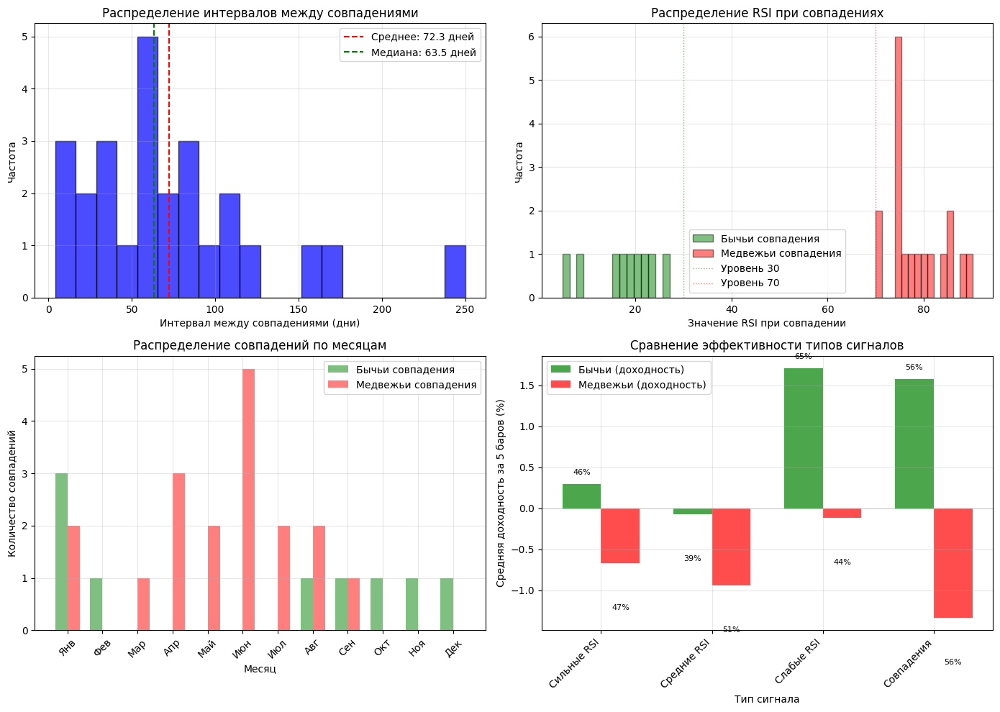

In [ ]:
# ДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ совпадений RSI и фракталов
print("\nДОПОЛНИТЕЛЬНЫЙ ГРАФИК: Детальный анализ совпадений RSI и фракталов")
fig2, axes2 = plt.subplots(2, 2, figsize=(14, 10))

# График 1: Распределение совпадений по времени
ax1 = axes2[0, 0]
match_dates = data[data['rsi_fractal_match'] != 0].index
match_values = data.loc[match_dates, 'rsi_fractal_match']

# Создаем временную шкалу
if len(match_dates) > 0:
    time_intervals = []
    for i in range(1, len(match_dates)):
        interval = (match_dates[i] - match_dates[i-1]).days
        time_intervals.append(interval)

    if time_intervals:
        ax1.hist(time_intervals, bins=20, color='blue', alpha=0.7, edgecolor='black')
        ax1.axvline(x=np.mean(time_intervals), color='red', linestyle='--', linewidth=1.5,
                   label=f'Среднее: {np.mean(time_intervals):.1f} дней')
        ax1.axvline(x=np.median(time_intervals), color='green', linestyle='--', linewidth=1.5,
                   label=f'Медиана: {np.median(time_intervals):.1f} дней')

        ax1.set_xlabel('Интервал между совпадениями (дни)')
        ax1.set_ylabel('Частота')
        ax1.set_title('Распределение интервалов между совпадениями', fontsize=12)
        ax1.legend()
        ax1.grid(True, alpha=0.3)
    else:
        ax1.text(0.5, 0.5, 'Недостаточно данных\nдля анализа интервалов',
                ha='center', va='center', transform=ax1.transAxes, fontsize=12)
        ax1.set_title('Распределение интервалов между совпадениями', fontsize=12)
else:
    ax1.text(0.5, 0.5, 'Нет данных о совпадениях',
            ha='center', va='center', transform=ax1.transAxes, fontsize=12)
    ax1.set_title('Распределение интервалов между совпадениями', fontsize=12)

# График 2: Совпадения по силе RSI
ax2 = axes2[0, 1]
match_data = data[data['rsi_fractal_match'] != 0]
if not match_data.empty:
    match_data['rsi_value'] = match_data['rsi']

    # Разделяем по типу совпадения
    bull_matches = match_data[match_data['rsi_fractal_match'] == 1]
    bear_matches = match_data[match_data['rsi_fractal_match'] == -1]

    if not bull_matches.empty and not bear_matches.empty:
        ax2.hist(bull_matches['rsi_value'], bins=15, alpha=0.5, color='green',
                label='Бычьи совпадения', edgecolor='black')
        ax2.hist(bear_matches['rsi_value'], bins=15, alpha=0.5, color='red',
                label='Медвежьи совпадения', edgecolor='black')

        ax2.axvline(x=30, color='green', linestyle=':', linewidth=1, alpha=0.5, label='Уровень 30')
        ax2.axvline(x=70, color='red', linestyle=':', linewidth=1, alpha=0.5, label='Уровень 70')

        ax2.set_xlabel('Значение RSI при совпадении')
        ax2.set_ylabel('Частота')
        ax2.set_title('Распределение RSI при совпадениях', fontsize=12)
        ax2.legend()
        ax2.grid(True, alpha=0.3)
    else:
        ax2.text(0.5, 0.5, 'Недостаточно данных\nдля распределения RSI',
                ha='center', va='center', transform=ax2.transAxes, fontsize=12)
        ax2.set_title('Распределение RSI при совпадениях', fontsize=12)
else:
    ax2.text(0.5, 0.5, 'Нет данных о совпадениях',
            ha='center', va='center', transform=ax2.transAxes, fontsize=12)
    ax2.set_title('Распределение RSI при совпадениях', fontsize=12)

# График 3: Распределение совпадений по месяцам
ax3 = axes2[1, 0]
if not match_data.empty:
    # Извлекаем месяц из даты
    match_data['month'] = match_data.index.month

    bull_matches = match_data[match_data['rsi_fractal_match'] == 1]
    bear_matches = match_data[match_data['rsi_fractal_match'] == -1]

    bull_by_month = bull_matches.groupby('month').size()
    bear_by_month = bear_matches.groupby('month').size()

    months = range(1, 13)
    month_names = ['Янв', 'Фев', 'Мар', 'Апр', 'Май', 'Июн',
                  'Июл', 'Авг', 'Сен', 'Окт', 'Ноя', 'Дек']

    bull_counts = [bull_by_month.get(month, 0) for month in months]
    bear_counts = [bear_by_month.get(month, 0) for month in months]

    x = np.arange(len(months))
    width = 0.35

    ax3.bar(x - width/2, bull_counts, width, alpha=0.5, color='green', label='Бычьи совпадения')
    ax3.bar(x + width/2, bear_counts, width, alpha=0.5, color='red', label='Медвежьи совпадения')

    ax3.set_xlabel('Месяц')
    ax3.set_ylabel('Количество совпадений')
    ax3.set_title('Распределение совпадений по месяцам', fontsize=12)
    ax3.set_xticks(x)
    ax3.set_xticklabels(month_names, rotation=45)
    ax3.legend()
    ax3.grid(True, alpha=0.3)
else:
    ax3.text(0.5, 0.5, 'Нет данных о совпадениях',
            ha='center', va='center', transform=ax3.transAxes, fontsize=12)
    ax3.set_title('Распределение совпадений по месяцам', fontsize=12)

# График 4: Сводная статистика эффективности
ax4 = axes2[1, 1]
# Собираем данные об эффективности разных типов сигналов
signal_types = ['Сильные RSI', 'Средние RSI', 'Слабые RSI', 'Совпадения']
avg_returns_bull_5 = []
win_rates_bull_5 = []
avg_returns_bear_5 = []
win_rates_bear_5 = []

for signal_col in ['rsi_signal_strong', 'rsi_signal_medium', 'rsi_signal_weak', 'rsi_fractal_match']:
    bull_return_col = f'{signal_col}_bull_return_5'
    bull_winrate_col = f'{signal_col}_bull_winrate_5'
    bear_return_col = f'{signal_col}_bear_return_5'
    bear_winrate_col = f'{signal_col}_bear_winrate_5'

    if bull_return_col in data.columns:
        bull_return_val = data[bull_return_col].dropna()
        bull_winrate_val = data[bull_winrate_col].dropna()
        bear_return_val = data[bear_return_col].dropna()
        bear_winrate_val = data[bear_winrate_col].dropna()

        avg_returns_bull_5.append(bull_return_val.iloc[0] if not bull_return_val.empty else 0)
        win_rates_bull_5.append(bull_winrate_val.iloc[0] if not bull_winrate_val.empty else 0)
        avg_returns_bear_5.append(bear_return_val.iloc[0] if not bear_return_val.empty else 0)
        win_rates_bear_5.append(bear_winrate_val.iloc[0] if not bear_winrate_val.empty else 0)
    else:
        avg_returns_bull_5.append(0)
        win_rates_bull_5.append(0)
        avg_returns_bear_5.append(0)
        win_rates_bear_5.append(0)

if any(avg_returns_bull_5) or any(avg_returns_bear_5):
    x = np.arange(len(signal_types))
    width = 0.35

    bars1 = ax4.bar(x - width/2, avg_returns_bull_5, width, label='Бычьи (доходность)', color='green', alpha=0.7)
    bars2 = ax4.bar(x + width/2, avg_returns_bear_5, width, label='Медвежьи (доходность)', color='red', alpha=0.7)

    ax4.set_xlabel('Тип сигнала')
    ax4.set_ylabel('Средняя доходность за 5 баров (%)')
    ax4.set_title('Сравнение эффективности типов сигналов', fontsize=12)
    ax4.set_xticks(x)
    ax4.set_xticklabels(signal_types, rotation=45, ha='right')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    ax4.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

    # Добавляем значения процента успешных
    for i, (bull_win, bear_win) in enumerate(zip(win_rates_bull_5, win_rates_bear_5)):
        if avg_returns_bull_5[i] != 0 or bull_win != 0:
            ax4.text(i - width/2, avg_returns_bull_5[i] + (0.1 if avg_returns_bull_5[i] >= 0 else -0.5),
                    f'{bull_win:.0f}%', ha='center', va='bottom' if avg_returns_bull_5[i] >= 0 else 'top', fontsize=8)
        if avg_returns_bear_5[i] != 0 or bear_win != 0:
            ax4.text(i + width/2, avg_returns_bear_5[i] + (0.1 if avg_returns_bear_5[i] >= 0 else -0.5),
                    f'{bear_win:.0f}%', ha='center', va='bottom' if avg_returns_bear_5[i] >= 0 else 'top', fontsize=8)
else:
    ax4.text(0.5, 0.5, 'Нет данных об эффективности сигналов',
            ha='center', va='center', transform=ax4.transAxes, fontsize=12)
    ax4.set_title('Сравнение эффективности типов сигналов', fontsize=12)

plt.tight_layout()
plt.savefig('block3_3_match_analysis.png', dpi=100, bbox_inches='tight')
print("✓ Детальный анализ сохранен в 'block3_3_match_analysis.png'")
plt.show()

## детальное исследование рсай часть 4


БЛОК 3.3: ДЕТАЛИЗИРОВАННЫЙ АНАЛИЗ ВСЕХ СИГНАЛОВ RSI И ФРАКТАЛОВ

Создание детализированных графиков для анализа всех сигналов...

✓ Детализированный график сохранен в 'block3_3_detailed_analysis_all_signals.png'

ИНФОРМАЦИЯ О СОЗДАННЫХ ГРАФИКАХ:

ГРАФИК 1 (верхний): ВСЕ СИГНАЛЫ RSI
----------------------------------------
1. Основные элементы:
   • RSI линия (фиолетовая)
   • Сдвинутые Bollinger Bands (толстые сплошные)
   • Оригинальные Bollinger Bands (тонкие пунктирные)
   • Статические уровни: 30, 40, 50, 60, 70

2. Типы сигналов (разные маркеры и размеры):
   • СИЛЬНЫЕ: большие треугольники ↑↓ (RSI<30/>70 + BB)
   • СРЕДНИЕ: средние треугольники ↑↓ (RSI<40/>60 + BB cross)
   • СЛАБЫЕ: маленькие кружки (BB cross без сильных уровней)
   • ПЕРЕСЕЧЕНИЯ BB: крестики X (вход/выход из зон)
   • КОМБИНИРОВАННЫЕ: звезды * (оба BB одновременно)
   • СОВПАДЕНИЯ: пятиугольники P (RSI + фракталы)

3. Зоны раскраски:
   • Динамическая зона между сдвинутыми BB
   • Зоны перекупленности/перепрод

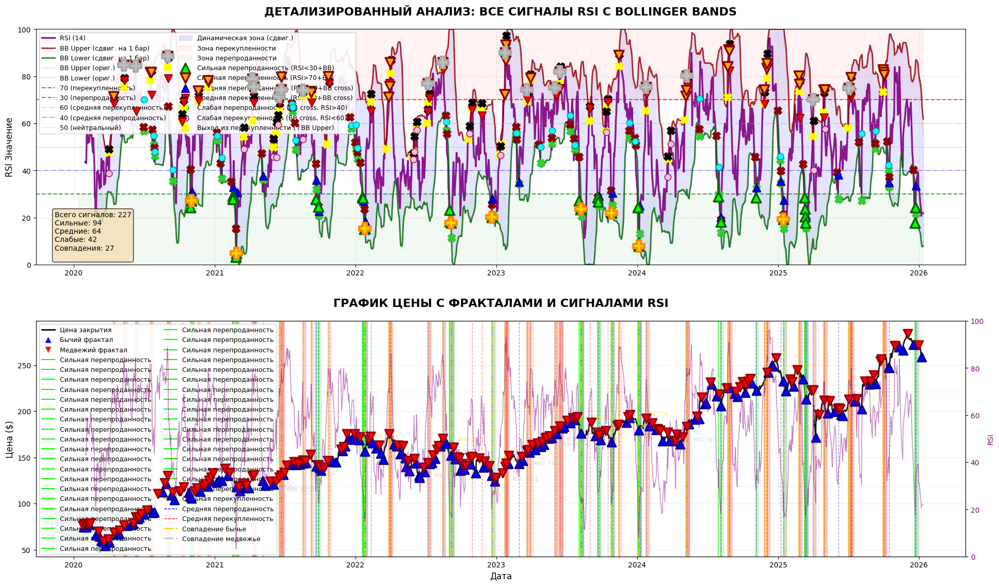


✓ Детализированный анализ всех сигналов RSI и фракталов завершен


In [ ]:
# ============================================
# БЛОК 3.3: ДЕТАЛИЗИРОВАННЫЙ АНАЛИЗ ВСЕХ СИГНАЛОВ RSI И ФРАКТАЛОВ
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: ДЕТАЛИЗИРОВАННЫЙ АНАЛИЗ ВСЕХ СИГНАЛОВ RSI И ФРАКТАЛОВ")
print("="*80)

print("\nСоздание детализированных графиков для анализа всех сигналов...")

# Создаем фигуру с увеличенной шириной
fig_width = 20  # Увеличиваем ширину в 2 раза
fig_height = 12
fig, axes = plt.subplots(2, 1, figsize=(fig_width, fig_height))

# ================= ГРАФИК 1: ВСЕ СИГНАЛЫ RSI =================
ax1 = axes[0]

# 1. ОСНОВНЫЕ ЛИНИИ RSI И BOLLINGER BANDS
# -------------------------------------------------
# RSI линия
ax1.plot(data.index, data['rsi'], 'purple', linewidth=2.5, label='RSI (14)', alpha=0.9)

# Сдвинутые Bollinger Bands (толстые линии для лучшей видимости)
ax1.plot(data.index, data['rsi_bb_upper_shifted'], 'darkred', linewidth=2.0,
         linestyle='-', alpha=0.8, label='BB Upper (сдвиг. на 1 бар)')
ax1.plot(data.index, data['rsi_bb_lower_shifted'], 'darkgreen', linewidth=2.0,
         linestyle='-', alpha=0.8, label='BB Lower (сдвиг. на 1 бар)')

# Оригинальные Bollinger Bands (тонкие пунктирные)
ax1.plot(data.index, data['rsi_bb_upper'], 'red', linewidth=1.0,
         linestyle=':', alpha=0.5, label='BB Upper (ориг.)')
ax1.plot(data.index, data['rsi_bb_lower'], 'green', linewidth=1.0,
         linestyle=':', alpha=0.5, label='BB Lower (ориг.)')

# 2. СТАТИЧЕСКИЕ УРОВНИ (С РАЗНЫМИ СТИЛЯМИ)
# -------------------------------------------------
# Основные уровни 30 и 70
ax1.axhline(y=70, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='70 (перекупленность)')
ax1.axhline(y=30, color='green', linestyle='--', linewidth=1.5, alpha=0.7, label='30 (перепроданность)')

# Вспомогательные уровни 40 и 60
ax1.axhline(y=60, color='orange', linestyle='-.', linewidth=1.0, alpha=0.5, label='60 (средняя перекупленность)')
ax1.axhline(y=40, color='blue', linestyle='-.', linewidth=1.0, alpha=0.5, label='40 (средняя перепроданность)')

# Нейтральный уровень 50
ax1.axhline(y=50, color='gray', linestyle='-', linewidth=0.8, alpha=0.3, label='50 (нейтральный)')

# 3. ЗОНЫ РАСКРАСКИ
# -------------------------------------------------
# Зона между сдвинутыми BB
ax1.fill_between(data.index, data['rsi_bb_lower_shifted'], data['rsi_bb_upper_shifted'],
                 alpha=0.1, color='blue', label='Динамическая зона (сдвиг.)')

# Зоны перекупленности (RSI > 70)
ax1.fill_between(data.index, 70, 100, alpha=0.05, color='red', label='Зона перекупленности')

# Зоны перепроданности (RSI < 30)
ax1.fill_between(data.index, 0, 30, alpha=0.05, color='green', label='Зона перепроданности')

# 4. СИГНАЛЫ RSI (РАЗНЫЕ ТИПЫ, РАЗНЫЕ МАРКЕРЫ И РАЗМЕРЫ)
# -------------------------------------------------
# 4.1 СИЛЬНЫЕ СИГНАЛЫ (самые большие маркеры)
strong_bull = data[data['rsi_signal_strong'] == 1].index
strong_bear = data[data['rsi_signal_strong'] == -1].index

if len(strong_bull) > 0:
    ax1.scatter(strong_bull, data.loc[strong_bull, 'rsi'],
               color='lime', s=180, marker='^', edgecolors='darkgreen', linewidth=2.5,
               label='Сильная перепроданность (RSI<30+BB)', zorder=10)

if len(strong_bear) > 0:
    ax1.scatter(strong_bear, data.loc[strong_bear, 'rsi'],
               color='orange', s=180, marker='v', edgecolors='darkred', linewidth=2.5,
               label='Сильная перекупленность (RSI>70+BB)', zorder=10)

# 4.2 СРЕДНИЕ СИГНАЛЫ
medium_bull = data[data['rsi_signal_medium'] == 1].index
medium_bear = data[data['rsi_signal_medium'] == -1].index

if len(medium_bull) > 0:
    ax1.scatter(medium_bull, data.loc[medium_bull, 'rsi'],
               color='blue', s=120, marker='^', edgecolors='darkblue', linewidth=1.5,
               label='Средняя перепроданность (RSI<40+BB cross)', zorder=9)

if len(medium_bear) > 0:
    ax1.scatter(medium_bear, data.loc[medium_bear, 'rsi'],
               color='red', s=120, marker='v', edgecolors='darkred', linewidth=1.5,
               label='Средняя перекупленность (RSI>60+BB cross)', zorder=9)

# 4.3 СЛАБЫЕ СИГНАЛЫ
weak_bull = data[data['rsi_signal_weak'] == 1].index
weak_bear = data[data['rsi_signal_weak'] == -1].index

if len(weak_bull) > 0:
    ax1.scatter(weak_bull, data.loc[weak_bull, 'rsi'],
               color='cyan', s=80, marker='o', edgecolors='darkcyan', linewidth=1.0,
               label='Слабая перепроданность (BB cross, RSI>40)', zorder=8)

if len(weak_bear) > 0:
    ax1.scatter(weak_bear, data.loc[weak_bear, 'rsi'],
               color='pink', s=80, marker='o', edgecolors='darkmagenta', linewidth=1.0,
               label='Слабая перекупленность (BB cross, RSI<60)', zorder=8)

# 5. ПЕРЕСЕЧЕНИЯ BOLLINGER BANDS (СПЕЦИАЛЬНЫЕ МАРКЕРЫ)
# -------------------------------------------------
upper_cross_up = data[data['rsi_cross_upper_shifted'] == 1].index
upper_cross_down = data[data['rsi_cross_upper_shifted'] == -1].index
lower_cross_up = data[data['rsi_cross_lower_shifted'] == 1].index
lower_cross_down = data[data['rsi_cross_lower_shifted'] == -1].index

# Пересечение верхнего BB вверх (выход из перекупленности)
if len(upper_cross_up) > 0:
    ax1.scatter(upper_cross_up, data.loc[upper_cross_up, 'rsi_bb_upper_shifted'],
               color='yellow', s=100, marker='X', linewidth=2.0,
               label='Выход из перекупленности (↑BB Upper)', zorder=7)

# Пересечение верхнего BB вниз (вход в перекупленность)
if len(upper_cross_down) > 0:
    ax1.scatter(upper_cross_down, data.loc[upper_cross_down, 'rsi_bb_upper_shifted'],
               color='black', s=100, marker='X', linewidth=2.0,
               label='Вход в перекупленность (↓BB Upper)', zorder=7)

# Пересечение нижнего BB вверх (вход в перепроданность)
if len(lower_cross_up) > 0:
    ax1.scatter(lower_cross_up, data.loc[lower_cross_up, 'rsi_bb_lower_shifted'],
               color='limegreen', s=100, marker='X', linewidth=2.0,
               label='Вход в перепроданность (↑BB Lower)', zorder=7)

# Пересечение нижнего BB вниз (выход из перепроданности)
if len(lower_cross_down) > 0:
    ax1.scatter(lower_cross_down, data.loc[lower_cross_down, 'rsi_bb_lower_shifted'],
               color='darkred', s=100, marker='X', linewidth=2.0,
               label='Выход из перепроданности (↓BB Lower)', zorder=7)

# 6. КОМБИНИРОВАННЫЕ СИГНАЛЫ (ОБА ПЕРЕСЕЧЕНИЯ ОДНОВРЕМЕННО)
# -------------------------------------------------
combined_2 = data[data['rsi_cross_combined'] == 2].index
combined_minus2 = data[data['rsi_cross_combined'] == -2].index

# Оба пересечения вверх (сильный бычий сигнал)
if len(combined_2) > 0:
    ax1.scatter(combined_2, data.loc[combined_2, 'rsi'],
               color='gold', s=200, marker='*', edgecolors='black', linewidth=2.0,
               label='Сильный бычий (↑BB Upper + ↑BB Lower)', zorder=11)

# Оба пересечения вниз (сильный медвежий сигнал)
if len(combined_minus2) > 0:
    ax1.scatter(combined_minus2, data.loc[combined_minus2, 'rsi'],
               color='silver', s=200, marker='*', edgecolors='black', linewidth=2.0,
               label='Сильный медвежий (↓BB Upper + ↓BB Lower)', zorder=11)

# 7. СОВПАДЕНИЯ С ФРАКТАЛАМИ (САМЫЕ ЯРКИЕ МАРКЕРЫ)
# -------------------------------------------------
match_bull = data[data['rsi_fractal_match'] == 1].index
match_bear = data[data['rsi_fractal_match'] == -1].index

# Бычьи совпадения (RSI + фрактал)
if len(match_bull) > 0:
    ax1.scatter(match_bull, data.loc[match_bull, 'rsi'],
               color='gold', s=250, marker='P', edgecolors='darkorange', linewidth=3.0,
               label='Совпадение: RSI перепрод.+фрактал бычий', zorder=12)

# Медвежьи совпадения (RSI + фрактал)
if len(match_bear) > 0:
    ax1.scatter(match_bear, data.loc[match_bear, 'rsi'],
               color='silver', s=250, marker='P', edgecolors='darkgray', linewidth=3.0,
               label='Совпадение: RSI перекуп.+фрактал медвежий', zorder=12)

# 8. НАСТРОЙКА ГРАФИКА
# -------------------------------------------------
ax1.set_title('ДЕТАЛИЗИРОВАННЫЙ АНАЛИЗ: ВСЕ СИГНАЛЫ RSI С BOLLINGER BANDS',
              fontsize=16, fontweight='bold', pad=20)
ax1.set_ylabel('RSI Значение', fontsize=12)
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3, linestyle='--')

# Создаем легенду с колонками
handles, labels = ax1.get_legend_handles_labels()
# Ограничиваем количество элементов в легенде для читаемости
if len(handles) > 20:
    # Группируем похожие элементы
    ax1.legend(handles[:20], labels[:20], loc='upper left', fontsize=9,
               ncol=2, framealpha=0.9)
else:
    ax1.legend(loc='upper left', fontsize=9, ncol=2, framealpha=0.9)

# Добавляем текстовую информацию
total_signals = {
    'Сильные': len(strong_bull) + len(strong_bear),
    'Средние': len(medium_bull) + len(medium_bear),
    'Слабые': len(weak_bull) + len(weak_bear),
    'Совпадения': len(match_bull) + len(match_bear)
}

info_text = f"Всего сигналов: {sum(total_signals.values())}\n"
for signal_type, count in total_signals.items():
    if count > 0:
        info_text += f"{signal_type}: {count}\n"

ax1.text(0.02, 0.02, info_text, transform=ax1.transAxes, fontsize=10,
         verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# ================= ГРАФИК 2: ФРАКТАЛЫ НА ЦЕНАХ =================
ax2 = axes[1]

# 1. ГРАФИК ЦЕНЫ
# -------------------------------------------------
ax2.plot(data.index, data['Close'], 'black', linewidth=2.0, label='Цена закрытия', alpha=0.9)

# 2. ФРАКТАЛЫ НА ЦЕНАХ (ИЗ БЛОКА 3.2)
# -------------------------------------------------
if 'price_fractal_macd' in data.columns:
    fractal_bull = data[data['price_fractal_macd'] == 1].index
    fractal_bear = data[data['price_fractal_macd'] == -1].index

    # Бычьи фракталы
    if len(fractal_bull) > 0:
        ax2.scatter(fractal_bull, data.loc[fractal_bull, 'Close'],
                   color='blue', s=150, marker='^', edgecolors='darkblue', linewidth=2.0,
                   label='Бычий фрактал (цена)', zorder=10)

    # Медвежьи фракталы
    if len(fractal_bear) > 0:
        ax2.scatter(fractal_bear, data.loc[fractal_bear, 'Close'],
                   color='red', s=150, marker='v', edgecolors='darkred', linewidth=2.0,
                   label='Медвежий фрактал (цена)', zorder=10)

# 3. СИГНАЛЫ RSI НА ГРАФИКЕ ЦЕНЫ (ВЕРТИКАЛЬНЫЕ ЛИНИИ)
# -------------------------------------------------
# Цвета для разных типов сигналов
signal_colors = {
    'strong_bull': 'lime',
    'strong_bear': 'orange',
    'medium_bull': 'blue',
    'medium_bear': 'red',
    'weak_bull': 'cyan',
    'weak_bear': 'pink',
    'match_bull': 'gold',
    'match_bear': 'silver'
}

# Рисуем вертикальные линии для всех сигналов RSI
signal_lines = []

# Сильные сигналы (сплошные толстые линии)
for idx in strong_bull:
    ax2.axvline(x=idx, color='lime', linestyle='-', linewidth=1.5, alpha=0.5)
    signal_lines.append(('Сильная перепроданность', 'lime', '-', 1.5))

for idx in strong_bear:
    ax2.axvline(x=idx, color='orange', linestyle='-', linewidth=1.5, alpha=0.5)
    if ('Сильная перекупленность', 'orange', '-', 1.5) not in signal_lines:
        signal_lines.append(('Сильная перекупленность', 'orange', '-', 1.5))

# Средние сигналы (пунктирные)
for idx in medium_bull:
    ax2.axvline(x=idx, color='blue', linestyle='--', linewidth=1.0, alpha=0.4)
    if ('Средняя перепроданность', 'blue', '--', 1.0) not in signal_lines:
        signal_lines.append(('Средняя перепроданность', 'blue', '--', 1.0))

for idx in medium_bear:
    ax2.axvline(x=idx, color='red', linestyle='--', linewidth=1.0, alpha=0.4)
    if ('Средняя перекупленность', 'red', '--', 1.0) not in signal_lines:
        signal_lines.append(('Средняя перекупленность', 'red', '--', 1.0))

# Совпадения с фракталами (толстые пунктирные)
for idx in match_bull:
    ax2.axvline(x=idx, color='gold', linestyle='-.', linewidth=2.0, alpha=0.7)
    if ('Совпадение бычье', 'gold', '-.', 2.0) not in signal_lines:
        signal_lines.append(('Совпадение бычье', 'gold', '-.', 2.0))

for idx in match_bear:
    ax2.axvline(x=idx, color='silver', linestyle='-.', linewidth=2.0, alpha=0.7)
    if ('Совпадение медвежье', 'silver', '-.', 2.0) not in signal_lines:
        signal_lines.append(('Совпадение медвежье', 'silver', '-.', 2.0))

# 4. ОБЛАСТИ ПОСЛЕ СИГНАЛОВ
# -------------------------------------------------
# Области после бычьих сигналов (зеленые)
for idx in list(strong_bull) + list(match_bull):
    idx_loc = data.index.get_loc(idx)
    if idx_loc + 5 < len(data):
        end_idx = data.index[idx_loc + 5]
        ax2.axvspan(idx, end_idx, alpha=0.1, color='green', label='_nolegend_')

# Области после медвежьих сигналов (красные)
for idx in list(strong_bear) + list(match_bear):
    idx_loc = data.index.get_loc(idx)
    if idx_loc + 5 < len(data):
        end_idx = data.index[idx_loc + 5]
        ax2.axvspan(idx, end_idx, alpha=0.1, color='red', label='_nolegend_')

# 5. СОВМЕЩЕНИЕ С ГРАФИКОМ RSI (ДОПОЛНИТЕЛЬНАЯ ОСЬ)
# -------------------------------------------------
# Добавляем RSI на второй график (второстепенная ось)
ax2_twin = ax2.twinx()
ax2_twin.plot(data.index, data['rsi'], 'purple', linewidth=1.0, alpha=0.5, label='RSI')
ax2_twin.set_ylabel('RSI', fontsize=10, color='purple')
ax2_twin.tick_params(axis='y', labelcolor='purple')
ax2_twin.set_ylim(0, 100)

# Добавляем горизонтальные линии RSI уровней
ax2_twin.axhline(y=70, color='red', linestyle=':', linewidth=0.5, alpha=0.3)
ax2_twin.axhline(y=30, color='green', linestyle=':', linewidth=0.5, alpha=0.3)

# 6. НАСТРОЙКА ВТОРОГО ГРАФИКА
# -------------------------------------------------
ax2.set_title('ГРАФИК ЦЕНЫ С ФРАКТАЛАМИ И СИГНАЛАМИ RSI',
              fontsize=16, fontweight='bold', pad=20)
ax2.set_xlabel('Дата', fontsize=12)
ax2.set_ylabel('Цена ($)', fontsize=12)
ax2.grid(True, alpha=0.3, linestyle='--')

# Создаем кастомную легенду для вертикальных линий
from matplotlib.lines import Line2D
legend_elements = []

# Основные элементы
legend_elements.append(Line2D([0], [0], color='black', lw=2, label='Цена закрытия'))

if 'price_fractal_macd' in data.columns:
    if len(fractal_bull) > 0:
        legend_elements.append(Line2D([0], [0], marker='^', color='w',
                                      markerfacecolor='blue', markersize=10,
                                      label='Бычий фрактал'))
    if len(fractal_bear) > 0:
        legend_elements.append(Line2D([0], [0], marker='v', color='w',
                                      markerfacecolor='red', markersize=10,
                                      label='Медвежий фрактал'))

# Добавляем элементы для вертикальных линий сигналов
for label, color, linestyle, linewidth in signal_lines:
    legend_elements.append(Line2D([0], [0], color=color, lw=linewidth,
                                  linestyle=linestyle, label=label))

ax2.legend(handles=legend_elements, loc='upper left', fontsize=9,
           ncol=2, framealpha=0.9)

# Добавляем статистику фракталов
if 'price_fractal_macd' in data.columns:
    fractal_stats = {
        'Бычьи': len(fractal_bull),
        'Медвежьи': len(fractal_bear),
        'Всего': len(fractal_bull) + len(fractal_bear)
    }

    fractal_text = "Фракталы на ценах:\n"
    for ftype, count in fractal_stats.items():
        if count > 0:
            fractal_text += f"{ftype}: {count}\n"

    ax2.text(0.02, 0.02, fractal_text, transform=ax2.transAxes, fontsize=10,
             verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))

# 7. СВЯЗЬ МЕЖДУ ГРАФИКАМИ
# -------------------------------------------------
# Добавляем соединительные линии для совпадений
for idx in match_bull:
    # Проверяем, что индекс существует на обоих графиках
    if idx in data.index:
        # Получаем значение RSI
        rsi_value = data.loc[idx, 'rsi']
        price_value = data.loc[idx, 'Close']

        # Добавляем аннотацию
        ax2.annotate(f'RSI: {rsi_value:.1f}', xy=(idx, price_value),
                    xytext=(10, 20), textcoords='offset points',
                    arrowprops=dict(arrowstyle='->', color='gold', alpha=0.5),
                    fontsize=8, color='gold', alpha=0.7)

for idx in match_bear:
    if idx in data.index:
        rsi_value = data.loc[idx, 'rsi']
        price_value = data.loc[idx, 'Close']

        ax2.annotate(f'RSI: {rsi_value:.1f}', xy=(idx, price_value),
                    xytext=(10, -20), textcoords='offset points',
                    arrowprops=dict(arrowstyle='->', color='silver', alpha=0.5),
                    fontsize=8, color='silver', alpha=0.7)

# ================= НАСТРОЙКА ОБЩЕЙ ФИГУРЫ =================
plt.tight_layout(pad=3.0)

# Сохраняем график с высоким разрешением
plt.savefig('block3_3_detailed_analysis_all_signals.png', dpi=150, bbox_inches='tight')
print("\n✓ Детализированный график сохранен в 'block3_3_detailed_analysis_all_signals.png'")

# Отображаем информацию о созданных графиках
print("\n" + "="*80)
print("ИНФОРМАЦИЯ О СОЗДАННЫХ ГРАФИКАХ:")
print("="*80)

print("\nГРАФИК 1 (верхний): ВСЕ СИГНАЛЫ RSI")
print("-" * 40)
print("1. Основные элементы:")
print("   • RSI линия (фиолетовая)")
print("   • Сдвинутые Bollinger Bands (толстые сплошные)")
print("   • Оригинальные Bollinger Bands (тонкие пунктирные)")
print("   • Статические уровни: 30, 40, 50, 60, 70")

print("\n2. Типы сигналов (разные маркеры и размеры):")
print("   • СИЛЬНЫЕ: большие треугольники ↑↓ (RSI<30/>70 + BB)")
print("   • СРЕДНИЕ: средние треугольники ↑↓ (RSI<40/>60 + BB cross)")
print("   • СЛАБЫЕ: маленькие кружки (BB cross без сильных уровней)")
print("   • ПЕРЕСЕЧЕНИЯ BB: крестики X (вход/выход из зон)")
print("   • КОМБИНИРОВАННЫЕ: звезды * (оба BB одновременно)")
print("   • СОВПАДЕНИЯ: пятиугольники P (RSI + фракталы)")

print("\n3. Зоны раскраски:")
print("   • Динамическая зона между сдвинутыми BB")
print("   • Зоны перекупленности/перепроданности")

print("\nГРАФИК 2 (нижний): ЦЕНА С ФРАКТАЛАМИ")
print("-" * 40)
print("1. Основные элементы:")
print("   • Цена закрытия (черная линия)")
print("   • Фракталы на ценах (треугольники ↑↓)")
print("   • RSI на второстепенной оси (фиолетовая, прозрачная)")

print("\n2. Визуализация сигналов RSI:")
print("   • Вертикальные линии цветов, соответствующих типам сигналов")
print("   • Области после сигналов (5 баров)")
print("   • Аннотации для совпадений RSI+фракталы")

print("\n3. Связь между графиками:")
print("   • Совпадения отмечены на обоих графиках")
print("   • Вертикальные линии помогают соотнести сигналы RSI с движением цены")
print("   • Аннотации показывают значение RSI в момент сигнала")

# Статистика по сигналам
print("\n" + "="*80)
print("СТАТИСТИКА СИГНАЛОВ:")
print("="*80)

# Подсчитываем все типы сигналов
all_signals_count = {
    'Сильные бычьи': len(strong_bull),
    'Сильные медвежьи': len(strong_bear),
    'Средние бычьи': len(medium_bull),
    'Средние медвежьи': len(medium_bear),
    'Слабые бычьи': len(weak_bull),
    'Слабые медвежьи': len(weak_bear),
    'Совпадения бычьи': len(match_bull),
    'Совпадения медвежьи': len(match_bear),
    'Все пересечения BB': len(upper_cross_up) + len(upper_cross_down) +
                         len(lower_cross_up) + len(lower_cross_down),
    'Комбинированные сигналы': len(combined_2) + len(combined_minus2)
}

print("\nКоличество сигналов по типам:")
for signal_type, count in all_signals_count.items():
    if count > 0:
        percentage = count / len(data) * 100
        print(f"  {signal_type}: {count} ({percentage:.1f}% времени)")

# Вычисляем плотность сигналов
total_all_signals = sum(all_signals_count.values())
if total_all_signals > 0:
    signals_per_bar = total_all_signals / len(data)
    print(f"\nОбщая плотность сигналов: {signals_per_bar:.2f} сигналов на бар")
    print(f"Средний интервал между сигналами: {len(data)/total_all_signals:.1f} баров")

# Показываем график
plt.show()

print("\n✓ Детализированный анализ всех сигналов RSI и фракталов завершен")

## детальное исследование 3.3.4

In [ ]:
# ============================================
# БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ")
print("="*80)

def calculate_advanced_rsi_signals_with_strength(data, window=14, bb_std=1.5, shift_period=3):
    """Расчет расширенной системы сигналов RSI с классификацией по силе"""
    print("Расчет расширенной системы сигналов RSI с классификацией по силе...")

    # Если отсутствуют сдвинутые Bollinger Bands для RSI - создаем их
    if 'rsi_bb_upper_shifted' not in data.columns or 'rsi_bb_lower_shifted' not in data.columns:
        print("Создание сдвинутых Bollinger Bands для RSI...")

        # Создаем стандартные Bollinger Bands для RSI
        rsi_bb_middle = data['rsi'].rolling(window=window).mean()
        rsi_bb_std = data['rsi'].rolling(window=window).std()

        data['rsi_bb_upper'] = rsi_bb_middle + (rsi_bb_std * bb_std)
        data['rsi_bb_lower'] = rsi_bb_middle - (rsi_bb_std * bb_std)

        # Создаем сдвинутые версии (сдвиг вперед во времени)
        data['rsi_bb_upper_shifted'] = data['rsi_bb_upper'].shift(-shift_period)
        data['rsi_bb_lower_shifted'] = data['rsi_bb_lower'].shift(-shift_period)

        # Заполняем NaN значения последними известными значениями
        data['rsi_bb_upper_shifted'].fillna(method='ffill', inplace=True)
        data['rsi_bb_lower_shifted'].fillna(method='ffill', inplace=True)

    # 1. ОПРЕДЕЛЕНИЕ ПЕРЕСЕЧЕНИЙ С УРОВНЯМИ
    # -------------------------------------------------
    # Пересечение уровней 30, 40, 70, 80
    for level in [30, 40, 70, 80]:
        data[f'rsi_cross_{level}_up'] = 0
        data[f'rsi_cross_{level}_down'] = 0

        for i in range(1, len(data)):
            # Пересечение ВВЕРХ через уровень
            if data['rsi'].iloc[i-1] <= level and data['rsi'].iloc[i] > level:
                data.loc[data.index[i], f'rsi_cross_{level}_up'] = 1

            # Пересечение ВНИЗ через уровень
            if data['rsi'].iloc[i-1] >= level and data['rsi'].iloc[i] < level:
                data.loc[data.index[i], f'rsi_cross_{level}_down'] = -1

    # 2. ПЕРЕСЕЧЕНИЯ СО СДВИНУТЫМИ BOLLINGER BANDS
    # -------------------------------------------------
    # Верхний BB (ВВН) - для сигналов продажи
    data['rsi_cross_bb_upper_down'] = 0  # Вниз через ВВН
    data['rsi_cross_bb_upper_up'] = 0    # Вверх через ВВН

    # Нижний BB (ВВЛ) - для сигналов покупки
    data['rsi_cross_bb_lower_up'] = 0    # Вверх через ВВЛ
    data['rsi_cross_bb_lower_down'] = 0  # Вниз через ВВЛ

    for i in range(1, len(data)):
        # Верхний BB (ВВН)
        # Вниз через ВВН (вход в перекупленность)
        if (data['rsi'].iloc[i-1] >= data['rsi_bb_upper_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] < data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_upper_down'] = -1

        # Вверх через ВВН (выход из перекупленности)
        if (data['rsi'].iloc[i-1] <= data['rsi_bb_upper_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] > data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_upper_up'] = 1

        # Нижний BB (ВВЛ)
        # Вверх через ВВЛ (вход в перепроданность)
        if (data['rsi'].iloc[i-1] <= data['rsi_bb_lower_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] > data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_lower_up'] = 1

        # Вниз через ВВЛ (выход из перепроданности)
        if (data['rsi'].iloc[i-1] >= data['rsi_bb_lower_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] < data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_lower_down'] = -1

    # 3. СИГНАЛЫ НА ПРОДАЖУ (МЕДВЕЖЬИ) С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
    # -------------------------------------------------
    data['rsi_signal_sell'] = 0  # Отрицательные значения: -1 до -5

    for i in range(1, len(data)):
        # 1.1 Кросс ВВН + кросс 80 (сила -5)
        if (data['rsi_cross_bb_upper_down'].iloc[i] == -1 and
            data['rsi_cross_80_down'].iloc[i] == -1):
            data.loc[data.index[i], 'rsi_signal_sell'] = -5

        # 1.2 Кросс 80 (сила -4)
        elif data['rsi_cross_80_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -4

        # 1.3 Кросс ВВН + кросс 70 (сила -3)
        elif (data['rsi_cross_bb_upper_down'].iloc[i] == -1 and
              data['rsi_cross_70_down'].iloc[i] == -1):
            data.loc[data.index[i], 'rsi_signal_sell'] = -3

        # 1.4 Кросс ВВН (сила -2)
        elif data['rsi_cross_bb_upper_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -2

        # 1.5 Кросс 70 (сила -1)
        elif data['rsi_cross_70_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -1

    # 4. СИГНАЛЫ НА ПОКУПКУ (БЫЧЬИ) С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
    # -------------------------------------------------
    data['rsi_signal_buy'] = 0  # Положительные значения: 1 до 5

    for i in range(1, len(data)):
        # 2.1 Кросс ВВЛ + кросс 30 (сила 5)
        if (data['rsi_cross_bb_lower_up'].iloc[i] == 1 and
            data['rsi_cross_30_up'].iloc[i] == 1):
            data.loc[data.index[i], 'rsi_signal_buy'] = 5

        # 2.2 Кросс 30 (сила 4)
        elif data['rsi_cross_30_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 4

        # 2.3 Кросс ВВЛ + кросс 40 (сила 3)
        elif (data['rsi_cross_bb_lower_up'].iloc[i] == 1 and
              data['rsi_cross_40_up'].iloc[i] == 1):
            data.loc[data.index[i], 'rsi_signal_buy'] = 3

        # 2.4 Кросс ВВЛ (сила 2)
        elif data['rsi_cross_bb_lower_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 2

        # 2.5 Кросс 40 (сила 1)
        elif data['rsi_cross_40_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 1

    # 5. КОМБИНИРОВАННЫЙ СИГНАЛ
    # -------------------------------------------------
    data['rsi_signal_combined'] = data['rsi_signal_buy'] + data['rsi_signal_sell']

    # 6. СОВПАДЕНИЕ С ФРАКТАЛАМИ (если фракталы есть)
    # -------------------------------------------------
    data['rsi_signal_with_fractal'] = data['rsi_signal_combined'].copy()

    if 'price_fractal_macd' in data.columns:
        print("Обнаружены фракталы - проверяем совпадения...")
        for i in range(len(data)):
            rsi_signal = data['rsi_signal_combined'].iloc[i]
            fractal_signal = data['price_fractal_macd'].iloc[i]

            # Бычье совпадение
            if rsi_signal > 0 and fractal_signal == 1:
                data.loc[data.index[i], 'rsi_signal_with_fractal'] = rsi_signal + 2  # Усиливаем сигнал

            # Медвежье совпадение
            elif rsi_signal < 0 and fractal_signal == -1:
                data.loc[data.index[i], 'rsi_signal_with_fractal'] = rsi_signal - 2  # Усиливаем сигнал
    else:
        print("Фракталы не обнаружены - пропускаем проверку совпадений")

    # 7. ДОПОЛНИТЕЛЬНЫЕ ПОЛЯ ДЛЯ АНАЛИЗА
    # -------------------------------------------------
    # Флаг наличия сигнала (любого)
    data['rsi_has_signal'] = (data['rsi_signal_combined'] != 0).astype(int)

    # Максимальная сила сигнала
    data['rsi_max_signal_strength'] = data['rsi_signal_combined'].abs()

    # Тип сигнала
    data['rsi_signal_type'] = 0
    data.loc[data['rsi_signal_combined'] > 0, 'rsi_signal_type'] = 1  # Бычий
    data.loc[data['rsi_signal_combined'] < 0, 'rsi_signal_type'] = -1  # Медвежий

    print("✓ Расширенная система сигналов RSI с классификацией по силе рассчитана")
    return data

# Применяем расширенный расчет с параметрами по умолчанию
data = calculate_advanced_rsi_signals_with_strength(data)

# Дальнейший код остается без изменений...


БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
Расчет расширенной системы сигналов RSI с классификацией по силе...
Обнаружены фракталы - проверяем совпадения...
✓ Расширенная система сигналов RSI с классификацией по силе рассчитана


## детальное исследование 3.3.4     2 вариант проверки  


БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
Расчет расширенной системы сигналов RSI с классификацией по силе...
✓ Расширенная система сигналов RSI с классификацией по силе рассчитана

ТЕСТ БЛОКА 3.3: Проверка расширенной системы сигналов RSI
------------------------------------------------------------
✓ Все колонки присутствуют

СТАТИСТИКА СИГНАЛОВ ПО СИЛЕ:
----------------------------------------

СИГНАЛЫ НА ПРОДАЖУ (медвежьи):
  Кросс ВВН + кросс 80: 8 (0.5%)
  Кросс 80: 19 (1.3%)
  Кросс ВВН + кросс 70: 10 (0.7%)
  Кросс ВВН: 39 (2.6%)
  Кросс 70: 62 (4.1%)

СИГНАЛЫ НА ПОКУПКУ (бычьи):
  Кросс 40: 49 (3.2%)
  Кросс ВВЛ: 39 (2.6%)
  Кросс ВВЛ + кросс 40: 4 (0.3%)
  Кросс 30: 34 (2.3%)
  Кросс ВВЛ + кросс 30: 6 (0.4%)

СОВПАДЕНИЯ С ФРАКТАЛАМИ:
  Медвежий (сила 5): 1 (0.1%)
  Медвежий (сила 4): 5 (0.3%)
  Медвежий (сила 3): 3 (0.2%)
  Бычий (сила 3): 3 (0.2%)
  Бычий (сила 4): 11 (0.7%)
  Бычий (сила 5): 1 (0.1%)
  Бычий (сила 6): 6 (0.4%)

ОБЩАЯ СТАТИСТИ

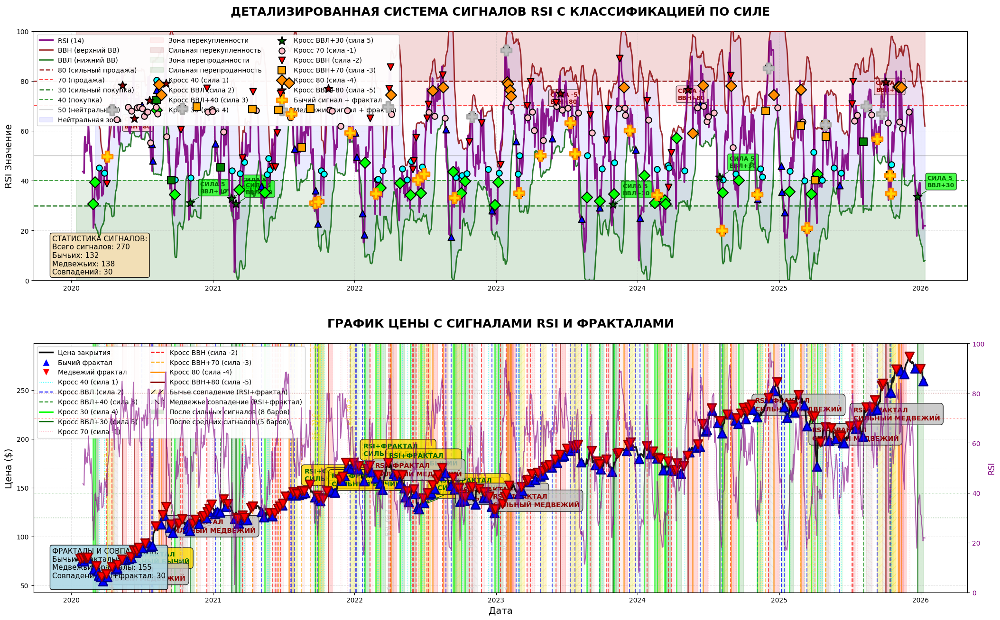

In [ ]:
# ============================================
# БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
# ============================================
print("\n" + "="*80)
print("БЛОК 3.3: УСОВЕРШЕНСТВЕННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ")
print("="*80)

def calculate_advanced_rsi_signals_with_strength(data):
    """Расчет расширенной системы сигналов RSI с классификацией по силе"""
    print("Расчет расширенной системы сигналов RSI с классификацией по силе...")

    # 1. ОПРЕДЕЛЕНИЕ ПЕРЕСЕЧЕНИЙ С УРОВНЯМИ
    # -------------------------------------------------
    # Пересечение уровней 30, 40, 70, 80
    for level in [30, 40, 70, 80]:
        data[f'rsi_cross_{level}_up'] = 0
        data[f'rsi_cross_{level}_down'] = 0

        for i in range(1, len(data)):
            # Пересечение ВВЕРХ через уровень
            if data['rsi'].iloc[i-1] <= level and data['rsi'].iloc[i] > level:
                data.loc[data.index[i], f'rsi_cross_{level}_up'] = 1

            # Пересечение ВНИЗ через уровень
            if data['rsi'].iloc[i-1] >= level and data['rsi'].iloc[i] < level:
                data.loc[data.index[i], f'rsi_cross_{level}_down'] = -1

    # 2. ПЕРЕСЕЧЕНИЯ СО СДВИНУТЫМИ BOLLINGER BANDS
    # -------------------------------------------------
    # Верхний BB (ВВН) - для сигналов продажи
    data['rsi_cross_bb_upper_down'] = 0  # Вниз через ВВН
    data['rsi_cross_bb_upper_up'] = 0    # Вверх через ВВН

    # Нижний BB (ВВЛ) - для сигналов покупки
    data['rsi_cross_bb_lower_up'] = 0    # Вверх через ВВЛ
    data['rsi_cross_bb_lower_down'] = 0  # Вниз через ВВЛ

    for i in range(1, len(data)):
        # Верхний BB (ВВН)
        # Вниз через ВВН (вход в перекупленность)
        if (data['rsi'].iloc[i-1] >= data['rsi_bb_upper_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] < data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_upper_down'] = -1

        # Вверх через ВВН (выход из перекупленности)
        if (data['rsi'].iloc[i-1] <= data['rsi_bb_upper_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] > data['rsi_bb_upper_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_upper_up'] = 1

        # Нижний BB (ВВЛ)
        # Вверх через ВВЛ (вход в перепроданность)
        if (data['rsi'].iloc[i-1] <= data['rsi_bb_lower_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] > data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_lower_up'] = 1

        # Вниз через ВВЛ (выход из перепроданности)
        if (data['rsi'].iloc[i-1] >= data['rsi_bb_lower_shifted'].iloc[i-1] and
            data['rsi'].iloc[i] < data['rsi_bb_lower_shifted'].iloc[i]):
            data.loc[data.index[i], 'rsi_cross_bb_lower_down'] = -1

    # 3. СИГНАЛЫ НА ПРОДАЖУ (МЕДВЕЖЬИ) С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
    # -------------------------------------------------
    data['rsi_signal_sell'] = 0  # Отрицательные значения: -1 до -5

    for i in range(1, len(data)):
        # 1.1 Кросс ВВН + кросс 80 (сила -5)
        if (data['rsi_cross_bb_upper_down'].iloc[i] == -1 and
            data['rsi_cross_80_down'].iloc[i] == -1):
            data.loc[data.index[i], 'rsi_signal_sell'] = -5

        # 1.2 Кросс 80 (сила -4)
        elif data['rsi_cross_80_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -4

        # 1.3 Кросс ВВН + кросс 70 (сила -3)
        elif (data['rsi_cross_bb_upper_down'].iloc[i] == -1 and
              data['rsi_cross_70_down'].iloc[i] == -1):
            data.loc[data.index[i], 'rsi_signal_sell'] = -3

        # 1.4 Кросс ВВН (сила -2)
        elif data['rsi_cross_bb_upper_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -2

        # 1.5 Кросс 70 (сила -1)
        elif data['rsi_cross_70_down'].iloc[i] == -1:
            data.loc[data.index[i], 'rsi_signal_sell'] = -1

    # 4. СИГНАЛЫ НА ПОКУПКУ (БЫЧЬИ) С КЛАССИФИКАЦИЕЙ ПО СИЛЕ
    # -------------------------------------------------
    data['rsi_signal_buy'] = 0  # Положительные значения: 1 до 5

    for i in range(1, len(data)):
        # 2.1 Кросс ВВЛ + кросс 30 (сила 5)
        if (data['rsi_cross_bb_lower_up'].iloc[i] == 1 and
            data['rsi_cross_30_up'].iloc[i] == 1):
            data.loc[data.index[i], 'rsi_signal_buy'] = 5

        # 2.2 Кросс 30 (сила 4)
        elif data['rsi_cross_30_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 4

        # 2.3 Кросс ВВЛ + кросс 40 (сила 3)
        elif (data['rsi_cross_bb_lower_up'].iloc[i] == 1 and
              data['rsi_cross_40_up'].iloc[i] == 1):
            data.loc[data.index[i], 'rsi_signal_buy'] = 3

        # 2.4 Кросс ВВЛ (сила 2)
        elif data['rsi_cross_bb_lower_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 2

        # 2.5 Кросс 40 (сила 1)
        elif data['rsi_cross_40_up'].iloc[i] == 1:
            data.loc[data.index[i], 'rsi_signal_buy'] = 1

    # 5. КОМБИНИРОВАННЫЙ СИГНАЛ
    # -------------------------------------------------
    data['rsi_signal_combined'] = data['rsi_signal_buy'] + data['rsi_signal_sell']

    # 6. СОВПАДЕНИЕ С ФРАКТАЛАМИ
    # -------------------------------------------------
    data['rsi_signal_with_fractal'] = 0

    for i in range(len(data)):
        rsi_signal = data['rsi_signal_combined'].iloc[i]
        fractal_signal = data['price_fractal_macd'].iloc[i] if 'price_fractal_macd' in data.columns else 0

        # Бычье совпадение
        if rsi_signal > 0 and fractal_signal == 1:
            data.loc[data.index[i], 'rsi_signal_with_fractal'] = rsi_signal + 2  # Усиливаем сигнал

        # Медвежье совпадение
        elif rsi_signal < 0 and fractal_signal == -1:
            data.loc[data.index[i], 'rsi_signal_with_fractal'] = rsi_signal - 2  # Усиливаем сигнал

    # 7. ДОПОЛНИТЕЛЬНЫЕ ПОЛЯ ДЛЯ АНАЛИЗА
    # -------------------------------------------------
    # Флаг наличия сигнала (любого)
    data['rsi_has_signal'] = (data['rsi_signal_combined'] != 0).astype(int)

    # Максимальная сила сигнала
    data['rsi_max_signal_strength'] = data['rsi_signal_combined'].abs()

    # Тип сигнала
    data['rsi_signal_type'] = 0
    data.loc[data['rsi_signal_combined'] > 0, 'rsi_signal_type'] = 1  # Бычий
    data.loc[data['rsi_signal_combined'] < 0, 'rsi_signal_type'] = -1  # Медвежий

    print("✓ Расширенная система сигналов RSI с классификацией по силе рассчитана")
    return data

# Применяем расширенный расчет
data = calculate_advanced_rsi_signals_with_strength(data)

# ТЕСТ БЛОКА 3.3 (РАСШИРЕННАЯ СИСТЕМА)
print("\nТЕСТ БЛОКА 3.3: Проверка расширенной системы сигналов RSI")
print("-" * 60)

# Проверка колонок
required_cols = ['rsi_signal_sell', 'rsi_signal_buy', 'rsi_signal_combined',
                 'rsi_signal_with_fractal', 'rsi_has_signal', 'rsi_max_signal_strength']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика сигналов
print(f"\nСТАТИСТИКА СИГНАЛОВ ПО СИЛЕ:")
print("-" * 40)

# Сигналы на продажу
print("\nСИГНАЛЫ НА ПРОДАЖУ (медвежьи):")
sell_signals = data['rsi_signal_sell'].value_counts().sort_index()
for strength, count in sell_signals.items():
    if strength < 0:
        percentage = count / len(data) * 100
        strength_name = {
            -1: "Кросс 70",
            -2: "Кросс ВВН",
            -3: "Кросс ВВН + кросс 70",
            -4: "Кросс 80",
            -5: "Кросс ВВН + кросс 80"
        }.get(strength, f"Сила {strength}")
        print(f"  {strength_name}: {count} ({percentage:.1f}%)")

# Сигналы на покупку
print("\nСИГНАЛЫ НА ПОКУПКУ (бычьи):")
buy_signals = data['rsi_signal_buy'].value_counts().sort_index()
for strength, count in buy_signals.items():
    if strength > 0:
        percentage = count / len(data) * 100
        strength_name = {
            1: "Кросс 40",
            2: "Кросс ВВЛ",
            3: "Кросс ВВЛ + кросс 40",
            4: "Кросс 30",
            5: "Кросс ВВЛ + кросс 30"
        }.get(strength, f"Сила {strength}")
        print(f"  {strength_name}: {count} ({percentage:.1f}%)")

# Совпадения с фракталами
print("\nСОВПАДЕНИЯ С ФРАКТАЛАМИ:")
fractal_matches = data['rsi_signal_with_fractal'].value_counts().sort_index()
for strength, count in fractal_matches.items():
    if strength != 0:
        percentage = count / len(data) * 100
        direction = "Бычий" if strength > 0 else "Медвежий"
        print(f"  {direction} (сила {abs(strength)}): {count} ({percentage:.1f}%)")

# Общая статистика
print(f"\nОБЩАЯ СТАТИСТИКА:")
total_signals = (data['rsi_signal_combined'] != 0).sum()
percentage_signals = total_signals / len(data) * 100
print(f"  Всего сигналов: {total_signals} ({percentage_signals:.1f}% времени)")
print(f"  Баров без сигналов: {len(data) - total_signals} ({(100 - percentage_signals):.1f}% времени)")

# Распределение по силе
print(f"\nРАСПРЕДЕЛЕНИЕ ПО СИЛЕ СИГНАЛОВ:")
signal_strength_counts = data['rsi_max_signal_strength'].value_counts().sort_index()
for strength, count in signal_strength_counts.items():
    if strength > 0:
        percentage = count / len(data) * 100
        print(f"  Сила {strength}: {count} ({percentage:.1f}%)")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.3: ДЕТАЛИЗИРОВАННАЯ СИСТЕМА СИГНАЛОВ RSI
print("\nСоздание детализированных графиков системы сигналов RSI...")

# Создаем фигуру с увеличенной шириной
fig_width = 22  # Еще шире для детального анализа
fig_height = 14
fig, axes = plt.subplots(2, 1, figsize=(fig_width, fig_height))

# ================= ГРАФИК 1: ВСЯ СИСТЕМА СИГНАЛОВ RSI =================
ax1 = axes[0]

# 1. ОСНОВНЫЕ ЛИНИИ RSI И BOLLINGER BANDS
# -------------------------------------------------
# RSI линия (основная)
ax1.plot(data.index, data['rsi'], 'purple', linewidth=2.5, label='RSI (14)', alpha=0.9, zorder=5)

# Сдвинутые Bollinger Bands (толстые линии)
ax1.plot(data.index, data['rsi_bb_upper_shifted'], 'darkred', linewidth=2.0,
         linestyle='-', alpha=0.8, label='ВВН (верхний BB)', zorder=4)
ax1.plot(data.index, data['rsi_bb_lower_shifted'], 'darkgreen', linewidth=2.0,
         linestyle='-', alpha=0.8, label='ВВЛ (нижний BB)', zorder=4)

# 2. ВСЕ УРОВНИ RSI (С РАЗНЫМИ ЦВЕТАМИ И СТИЛЯМИ)
# -------------------------------------------------
# Уровни для сигналов продажи (красные)
ax1.axhline(y=80, color='darkred', linestyle='--', linewidth=1.8, alpha=0.8, label='80 (сильный продажа)', zorder=3)
ax1.axhline(y=70, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='70 (продажа)', zorder=3)

# Уровни для сигналов покупки (зеленые)
ax1.axhline(y=30, color='darkgreen', linestyle='--', linewidth=1.8, alpha=0.8, label='30 (сильный покупка)', zorder=3)
ax1.axhline(y=40, color='green', linestyle='--', linewidth=1.5, alpha=0.7, label='40 (покупка)', zorder=3)

# Нейтральные уровни
ax1.axhline(y=50, color='gray', linestyle='-', linewidth=1.0, alpha=0.5, label='50 (нейтральный)', zorder=2)

# 3. ЗОНЫ РАСКРАСКИ ДЛЯ РАЗНЫХ УСЛОВИЙ
# -------------------------------------------------
# Зона между BB (нейтральная)
ax1.fill_between(data.index, data['rsi_bb_lower_shifted'], data['rsi_bb_upper_shifted'],
                 alpha=0.08, color='blue', label='Нейтральная зона', zorder=1)

# Зоны перекупленности (красные)
ax1.fill_between(data.index, 70, 100, alpha=0.05, color='red', label='Зона перекупленности', zorder=1)
ax1.fill_between(data.index, 80, 100, alpha=0.1, color='darkred', label='Сильная перекупленность', zorder=1)

# Зоны перепроданности (зеленые)
ax1.fill_between(data.index, 0, 30, alpha=0.05, color='green', label='Зона перепроданности', zorder=1)
ax1.fill_between(data.index, 0, 40, alpha=0.1, color='darkgreen', label='Сильная перепроданность', zorder=1)

# 4. ВСЕ СИГНАЛЫ ПОКУПКИ (БЫЧЬИ) С РАЗНЫМИ МАРКЕРАМИ ПО СИЛЕ
# -------------------------------------------------
strength_markers_buy = {
    1: ('cyan', 'o', 80, 'Кросс 40 (сила 1)'),
    2: ('blue', '^', 100, 'Кросс ВВЛ (сила 2)'),
    3: ('green', 's', 120, 'Кросс ВВЛ+40 (сила 3)'),
    4: ('lime', 'D', 140, 'Кросс 30 (сила 4)'),
    5: ('darkgreen', '*', 180, 'Кросс ВВЛ+30 (сила 5)')
}

for strength, (color, marker, size, label) in strength_markers_buy.items():
    signal_indices = data[data['rsi_signal_buy'] == strength].index
    if len(signal_indices) > 0:
        ax1.scatter(signal_indices, data.loc[signal_indices, 'rsi'],
                   color=color, s=size, marker=marker, edgecolors='black', linewidth=1.5,
                   label=label, zorder=10)

# 5. ВСЕ СИГНАЛЫ ПРОДАЖИ (МЕДВЕЖЬИ) С РАЗНЫМИ МАРКЕРАМИ ПО СИЛЕ
# -------------------------------------------------
strength_markers_sell = {
    -1: ('pink', 'o', 80, 'Кросс 70 (сила -1)'),
    -2: ('red', 'v', 100, 'Кросс ВВН (сила -2)'),
    -3: ('orange', 's', 120, 'Кросс ВВН+70 (сила -3)'),
    -4: ('darkorange', 'D', 140, 'Кросс 80 (сила -4)'),
    -5: ('darkred', '*', 180, 'Кросс ВВН+80 (сила -5)')
}

for strength, (color, marker, size, label) in strength_markers_sell.items():
    signal_indices = data[data['rsi_signal_sell'] == strength].index
    if len(signal_indices) > 0:
        ax1.scatter(signal_indices, data.loc[signal_indices, 'rsi'],
                   color=color, s=size, marker=marker, edgecolors='black', linewidth=1.5,
                   label=label, zorder=10)

# 6. СОВПАДЕНИЯ С ФРАКТАЛАМИ (САМЫЕ ЯРКИЕ МАРКЕРЫ)
# -------------------------------------------------
# Бычьи совпадения (усиленные сигналы)
bull_fractal_match = data[data['rsi_signal_with_fractal'] > data['rsi_signal_buy']].index
if len(bull_fractal_match) > 0:
    ax1.scatter(bull_fractal_match, data.loc[bull_fractal_match, 'rsi'],
               color='gold', s=250, marker='P', edgecolors='darkorange', linewidth=2.5,
               label='Бычий сигнал + фрактал', zorder=15)

# Медвежьи совпадения (усиленные сигналы)
bear_fractal_match = data[data['rsi_signal_with_fractal'] < data['rsi_signal_sell']].index
if len(bear_fractal_match) > 0:
    ax1.scatter(bear_fractal_match, data.loc[bear_fractal_match, 'rsi'],
               color='silver', s=250, marker='P', edgecolors='darkgray', linewidth=2.5,
               label='Медвежий сигнал + фрактал', zorder=15)

# 7. АННОТАЦИИ ДЛЯ САМЫХ СИЛЬНЫХ СИГНАЛОВ
# -------------------------------------------------
# Аннотируем сигналы силы 5 и -5
strong_bull_signals = data[data['rsi_signal_buy'] == 5].index
strong_bear_signals = data[data['rsi_signal_sell'] == -5].index

for idx in strong_bull_signals[:10]:  # Ограничиваем количество аннотаций
    ax1.annotate('СИЛА 5\nВВЛ+30', xy=(idx, data.loc[idx, 'rsi']),
                xytext=(15, 15), textcoords='offset points',
                fontsize=9, color='darkgreen', weight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='lime', alpha=0.7),
                arrowprops=dict(arrowstyle='->', color='darkgreen'))

for idx in strong_bear_signals[:10]:
    ax1.annotate('СИЛА -5\nВВН+80', xy=(idx, data.loc[idx, 'rsi']),
                xytext=(-15, -15), textcoords='offset points',
                fontsize=9, color='darkred', weight='bold',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='pink', alpha=0.7),
                arrowprops=dict(arrowstyle='->', color='darkred'))

# 8. НАСТРОЙКА ПЕРВОГО ГРАФИКА
# -------------------------------------------------
ax1.set_title('ДЕТАЛИЗИРОВАННАЯ СИСТЕМА СИГНАЛОВ RSI С КЛАССИФИКАЦИЕЙ ПО СИЛЕ',
              fontsize=18, fontweight='bold', pad=25)
ax1.set_ylabel('RSI Значение', fontsize=14)
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3, linestyle='--', zorder=0)

# Легенда с группировкой
handles, labels = ax1.get_legend_handles_labels()
# Ограничиваем легенду для читаемости
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)

# Разделяем легенду на несколько колонок
ax1.legend(unique_handles, unique_labels, loc='upper left', fontsize=10,
           ncol=3, framealpha=0.95, frameon=True)

# Статистика сигналов на графике
stats_text = "СТАТИСТИКА СИГНАЛОВ:\n"
stats_text += f"Всего сигналов: {(data['rsi_signal_combined'] != 0).sum()}\n"
stats_text += f"Бычьих: {(data['rsi_signal_buy'] > 0).sum()}\n"
stats_text += f"Медвежьих: {(data['rsi_signal_sell'] < 0).sum()}\n"
stats_text += f"Совпадений: {(data['rsi_signal_with_fractal'] != 0).sum()}"

ax1.text(0.02, 0.02, stats_text, transform=ax1.transAxes, fontsize=11,
         verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

# ================= ГРАФИК 2: ЦЕНЫ С СИГНАЛАМИ RSI И ФРАКТАЛАМИ =================
ax2 = axes[1]

# 1. ГРАФИК ЦЕНЫ
# -------------------------------------------------
ax2.plot(data.index, data['Close'], 'black', linewidth=2.5, label='Цена закрытия', alpha=0.9, zorder=5)

# 2. ФРАКТАЛЫ НА ЦЕНАХ
# -------------------------------------------------
if 'price_fractal_macd' in data.columns:
    fractal_bull = data[data['price_fractal_macd'] == 1].index
    fractal_bear = data[data['price_fractal_macd'] == -1].index

    # Бычьи фракталы
    if len(fractal_bull) > 0:
        ax2.scatter(fractal_bull, data.loc[fractal_bull, 'Close'],
                   color='blue', s=180, marker='^', edgecolors='darkblue', linewidth=2.0,
                   label='Бычий фрактал', zorder=10)

    # Медвежьи фракталы
    if len(fractal_bear) > 0:
        ax2.scatter(fractal_bear, data.loc[fractal_bear, 'Close'],
                   color='red', s=180, marker='v', edgecolors='darkred', linewidth=2.0,
                   label='Медвежий фрактал', zorder=10)

# 3. ВЕРТИКАЛЬНЫЕ ЛИНИИ ДЛЯ СИГНАЛОВ RSI (ЦВЕТ ПО СИЛЕ)
# -------------------------------------------------
# Создаем словарь для хранения линий легенды
legend_lines = []

# Сигналы покупки (бычьи)
for strength in [1, 2, 3, 4, 5]:
    signal_indices = data[data['rsi_signal_buy'] == strength].index
    if len(signal_indices) > 0:
        color = strength_markers_buy[strength][0]
        linestyle = '-' if strength >= 4 else '--' if strength >= 2 else ':'
        linewidth = 2.0 if strength >= 4 else 1.5 if strength >= 2 else 1.0

        for idx in signal_indices:
            ax2.axvline(x=idx, color=color, linestyle=linestyle,
                       linewidth=linewidth, alpha=0.6, zorder=3)

        # Добавляем в легенду
        label_name = strength_markers_buy[strength][3]
        if label_name not in [l[0] for l in legend_lines]:
            legend_lines.append((label_name, color, linestyle, linewidth))

# Сигналы продажи (медвежьи)
for strength in [-1, -2, -3, -4, -5]:
    signal_indices = data[data['rsi_signal_sell'] == strength].index
    if len(signal_indices) > 0:
        color = strength_markers_sell[strength][0]
        linestyle = '-' if strength <= -4 else '--' if strength <= -2 else ':'
        linewidth = 2.0 if strength <= -4 else 1.5 if strength <= -2 else 1.0

        for idx in signal_indices:
            ax2.axvline(x=idx, color=color, linestyle=linestyle,
                       linewidth=linewidth, alpha=0.6, zorder=3)

        # Добавляем в легенду
        label_name = strength_markers_sell[strength][3]
        if label_name not in [l[0] for l in legend_lines]:
            legend_lines.append((label_name, color, linestyle, linewidth))

# 4. ОБЛАСТИ ПОСЛЕ СИГНАЛОВ (ЦВЕТ ПО СИЛЕ)
# -------------------------------------------------
# Сильные сигналы (4, 5, -4, -5)
strong_signals = list(data[data['rsi_signal_buy'] >= 4].index) + \
                 list(data[data['rsi_signal_sell'] <= -4].index)

for idx in strong_signals:
    idx_loc = data.index.get_loc(idx)
    if idx_loc + 8 < len(data):  # 8 баров для сильных сигналов
        end_idx = data.index[idx_loc + 8]
        color = 'green' if idx in data[data['rsi_signal_buy'] >= 4].index else 'red'
        ax2.axvspan(idx, end_idx, alpha=0.15, color=color, zorder=1)

# Средние сигналы (2, 3, -2, -3)
medium_signals = list(data[data['rsi_signal_buy'].isin([2, 3])].index) + \
                 list(data[data['rsi_signal_sell'].isin([-2, -3])].index)

for idx in medium_signals:
    idx_loc = data.index.get_loc(idx)
    if idx_loc + 5 < len(data):  # 5 баров для средних сигналов
        end_idx = data.index[idx_loc + 5]
        color = 'lightgreen' if idx in data[data['rsi_signal_buy'].isin([2, 3])].index else 'lightcoral'
        ax2.axvspan(idx, end_idx, alpha=0.1, color=color, zorder=1)

# Слабые сигналы (1, -1)
weak_signals = list(data[data['rsi_signal_buy'] == 1].index) + \
               list(data[data['rsi_signal_sell'] == -1].index)

for idx in weak_signals:
    idx_loc = data.index.get_loc(idx)
    if idx_loc + 3 < len(data):  # 3 бара для слабых сигналов
        end_idx = data.index[idx_loc + 3]
        color = 'palegreen' if idx in data[data['rsi_signal_buy'] == 1].index else 'mistyrose'
        ax2.axvspan(idx, end_idx, alpha=0.05, color=color, zorder=1)

# 5. СОВПАДЕНИЯ С ФРАКТАЛАМИ (ВЫДЕЛЕННЫЕ ОБЛАСТИ)
# -------------------------------------------------
if 'price_fractal_macd' in data.columns:
    # Бычьи совпадения
    bull_match_signals = data[(data['rsi_signal_buy'] > 0) & (data['price_fractal_macd'] == 1)].index

    for idx in bull_match_signals:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 10 < len(data):  # 10 баров для совпадений
            end_idx = data.index[idx_loc + 10]
            ax2.axvspan(idx, end_idx, alpha=0.2, color='gold', hatch='//', zorder=2)

    # Медвежьи совпадения
    bear_match_signals = data[(data['rsi_signal_sell'] < 0) & (data['price_fractal_macd'] == -1)].index

    for idx in bear_match_signals:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 10 < len(data):  # 10 баров для совпадений
            end_idx = data.index[idx_loc + 10]
            ax2.axvspan(idx, end_idx, alpha=0.2, color='silver', hatch='\\\\', zorder=2)

# 6. АННОТАЦИИ СИЛЬНЫХ СИГНАЛОВ НА ГРАФИКЕ ЦЕН
# -------------------------------------------------
# Аннотируем совпадения с фракталами
if 'price_fractal_macd' in data.columns:
    for idx in list(bull_match_signals)[:8]:  # Ограничиваем количество
        ax2.annotate('RSI+ФРАКТАЛ\nСИЛЬНЫЙ БЫЧИЙ', xy=(idx, data.loc[idx, 'Close']),
                    xytext=(20, 20), textcoords='offset points',
                    fontsize=10, color='darkgreen', weight='bold',
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='gold', alpha=0.8),
                    arrowprops=dict(arrowstyle='->', color='darkgreen'))

    for idx in list(bear_match_signals)[:8]:
        ax2.annotate('RSI+ФРАКТАЛ\nСИЛЬНЫЙ МЕДВЕЖИЙ', xy=(idx, data.loc[idx, 'Close']),
                    xytext=(-20, -20), textcoords='offset points',
                    fontsize=10, color='darkred', weight='bold',
                    bbox=dict(boxstyle='round,pad=0.5', facecolor='silver', alpha=0.8),
                    arrowprops=dict(arrowstyle='->', color='darkred'))

# 7. ДОБАВЛЯЕМ RSI НА ВТОРОСТЕПЕННУЮ ОСЬ
# -------------------------------------------------
ax2_twin = ax2.twinx()
ax2_twin.plot(data.index, data['rsi'], 'purple', linewidth=1.5, alpha=0.6, label='RSI', zorder=4)
ax2_twin.set_ylabel('RSI', fontsize=12, color='purple')
ax2_twin.tick_params(axis='y', labelcolor='purple')
ax2_twin.set_ylim(0, 100)

# Добавляем уровни RSI на второй оси
ax2_twin.axhline(y=80, color='darkred', linestyle=':', linewidth=1.0, alpha=0.5)
ax2_twin.axhline(y=70, color='red', linestyle=':', linewidth=0.8, alpha=0.5)
ax2_twin.axhline(y=30, color='darkgreen', linestyle=':', linewidth=1.0, alpha=0.5)
ax2_twin.axhline(y=40, color='green', linestyle=':', linewidth=0.8, alpha=0.5)
ax2_twin.axhline(y=50, color='gray', linestyle=':', linewidth=0.5, alpha=0.3)

# 8. НАСТРОЙКА ВТОРОГО ГРАФИКА
# -------------------------------------------------
ax2.set_title('ГРАФИК ЦЕНЫ С СИГНАЛАМИ RSI И ФРАКТАЛАМИ',
              fontsize=18, fontweight='bold', pad=25)
ax2.set_xlabel('Дата', fontsize=14)
ax2.set_ylabel('Цена ($)', fontsize=14)
ax2.grid(True, alpha=0.3, linestyle='--', zorder=0)

# Создаем кастомную легенду
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

legend_elements = []

# Основные элементы
legend_elements.append(Line2D([0], [0], color='black', lw=2.5, label='Цена закрытия'))

# Фракталы
if 'price_fractal_macd' in data.columns:
    if len(fractal_bull) > 0:
        legend_elements.append(Line2D([0], [0], marker='^', color='w',
                                      markerfacecolor='blue', markersize=12,
                                      label='Бычий фрактал'))
    if len(fractal_bear) > 0:
        legend_elements.append(Line2D([0], [0], marker='v', color='w',
                                      markerfacecolor='red', markersize=12,
                                      label='Медвежий фрактал'))

# Линии сигналов RSI
for label, color, linestyle, linewidth in legend_lines[:10]:  # Ограничиваем количество
    legend_elements.append(Line2D([0], [0], color=color, lw=linewidth,
                                  linestyle=linestyle, label=label))

# Области совпадений
legend_elements.append(Patch(facecolor='gold', alpha=0.2, hatch='//',
                            label='Бычье совпадение (RSI+фрактал)'))
legend_elements.append(Patch(facecolor='silver', alpha=0.2, hatch='\\\\',
                            label='Медвежье совпадение (RSI+фрактал)'))

# Области после сигналов
legend_elements.append(Patch(facecolor='green', alpha=0.15,
                            label='После сильных сигналов (8 баров)'))
legend_elements.append(Patch(facecolor='lightgreen', alpha=0.1,
                            label='После средних сигналов (5 баров)'))

ax2.legend(handles=legend_elements, loc='upper left', fontsize=10,
           ncol=2, framealpha=0.95, frameon=True)

# Добавляем статистику фракталов
if 'price_fractal_macd' in data.columns:
    fractal_stats = {
        'Бычьи фракталы': len(fractal_bull),
        'Медвежьи фракталы': len(fractal_bear),
        'Совпадения RSI+фрактал': len(bull_match_signals) + len(bear_match_signals)
    }

    fractal_text = "ФРАКТАЛЫ И СОВПАДЕНИЯ:\n"
    for ftype, count in fractal_stats.items():
        if count > 0:
            fractal_text += f"{ftype}: {count}\n"

    ax2.text(0.02, 0.02, fractal_text, transform=ax2.transAxes, fontsize=11,
             verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.9))

# 9. СВЯЗЬ МЕЖДУ ГРАФИКАМИ
# -------------------------------------------------
# Добавляем соединительные линии для сильных совпадений
if 'price_fractal_macd' in data.columns:
    # Берем первые 5 сильных совпадений каждого типа
    strong_bull_matches = list(bull_match_signals)[:5]
    strong_bear_matches = list(bear_match_signals)[:5]

    for idx in strong_bull_matches:
        # Получаем координаты
        rsi_value = data.loc[idx, 'rsi']
        price_value = data.loc[idx, 'Close']

        # Добавляем соединительную линию
        ax2.annotate('', xy=(idx, price_value), xycoords='data',
                    xytext=(idx, 100), textcoords=ax2_twin.transData,
                    arrowprops=dict(arrowstyle='<->', color='gold', alpha=0.5, linewidth=1.5))

        # Добавляем текст
        ax2.text(idx, (price_value + data['Close'].max()) / 2,
                f'RSI: {rsi_value:.1f}', ha='center', va='center',
                fontsize=9, color='gold', rotation=90, alpha=0.7)

    for idx in strong_bear_matches:
        rsi_value = data.loc[idx, 'rsi']
        price_value = data.loc[idx, 'Close']

        ax2.annotate('', xy=(idx, price_value), xycoords='data',
                    xytext=(idx, 0), textcoords=ax2_twin.transData,
                    arrowprops=dict(arrowstyle='<->', color='silver', alpha=0.5, linewidth=1.5))

        ax2.text(idx, (price_value + data['Close'].min()) / 2,
                f'RSI: {rsi_value:.1f}', ha='center', va='center',
                fontsize=9, color='silver', rotation=90, alpha=0.7)

# ================= НАСТРОЙКА ОБЩЕЙ ФИГУРЫ =================
plt.tight_layout(pad=4.0)

# Сохраняем график с высоким разрешением
plt.savefig('block3_3_advanced_rsi_system_with_strength.png', dpi=150, bbox_inches='tight')
print("\n✓ Детализированная система сигналов RSI сохранена в 'block3_3_advanced_rsi_system_with_strength.png'")

# Отображаем информацию о системе
print("\n" + "="*80)
print("ИНФОРМАЦИЯ О СИСТЕМЕ СИГНАЛОВ RSI:")
print("="*80)

print("\nСИСТЕМА СИГНАЛОВ НА ПРОДАЖУ (медвежьи):")
print("-" * 40)
print("1. Кросс ВВН + кросс 80    → Сила -5 (самый сильный)")
print("2. Кросс 80                → Сила -4")
print("3. Кросс ВВН + кросс 70    → Сила -3")
print("4. Кросс ВВН               → Сила -2")
print("5. Кросс 70                → Сила -1 (самый слабый)")

print("\nСИСТЕМА СИГНАЛОВ НА ПОКУПКУ (бычьи):")
print("-" * 40)
print("1. Кросс ВВЛ + кросс 30    → Сила 5 (самый сильный)")
print("2. Кросс 30                → Сила 4")
print("3. Кросс ВВЛ + кросс 40    → Сила 3")
print("4. Кросс ВВЛ               → Сила 2")
print("5. Кросс 40                → Сила 1 (самый слабый)")

print("\nУСИЛЕНИЕ СИГНАЛОВ:")
print("-" * 40)
print("• Совпадение с бычьим фракталом → +2 к силе бычьего сигнала")
print("• Совпадение с медвежьим фракталом → -2 к силе медвежьего сигнала")
print("• Максимальная сила сигнала с фракталом: ±7")

# Статистика эффективности
print("\n" + "="*80)
print("СТАТИСТИКА ЭФФЕКТИВНОСТИ ПО СИЛЕ СИГНАЛОВ:")
print("="*80)

# Анализируем эффективность для каждой силы сигнала
for strength_range in [(-5, -4), (-3, -2), (-1, -1), (1, 1), (2, 3), (4, 5)]:
    min_strength, max_strength = strength_range

    if min_strength < 0:
        # Медвежьи сигналы
        signals = data[data['rsi_signal_sell'].between(min_strength, max_strength)].index
        signal_name = f"Продажа сила {abs(min_strength)}"
        if min_strength != max_strength:
            signal_name = f"Продажа сила {abs(min_strength)}-{abs(max_strength)}"
    else:
        # Бычьи сигналы
        signals = data[data['rsi_signal_buy'].between(min_strength, max_strength)].index
        signal_name = f"Покупка сила {min_strength}"
        if min_strength != max_strength:
            signal_name = f"Покупка сила {min_strength}-{max_strength}"

    if len(signals) > 0:
        # Анализируем эффективность через 5 баров
        returns = []
        for idx in signals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 5 < len(data):
                future_price = data.iloc[idx_loc + 5]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns.append(return_pct)

        if returns:
            avg_return = np.mean(returns)
            if min_strength < 0:
                # Для медвежьих сигналов ожидаем отрицательную доходность
                win_rate = len([r for r in returns if r < 0]) / len(returns) * 100
                expected_sign = "отрицательная"
            else:
                # Для бычьих сигналов ожидаем положительную доходность
                win_rate = len([r for r in returns if r > 0]) / len(returns) * 100
                expected_sign = "положительная"

            print(f"\n{signal_name}:")
            print(f"  Количество: {len(signals)}")
            print(f"  Средняя доходность (5 баров): {avg_return:.2f}%")
            print(f"  Процент успешных: {win_rate:.1f}%")
            print(f"  Ожидаемый знак: {expected_sign}")

# Анализ совпадений с фракталами
print("\n" + "="*80)
print("АНАЛИЗ СОВПАДЕНИЙ С ФРАКТАЛАМИ:")
print("="*80)

if 'price_fractal_macd' in data.columns:
    # Бычьи совпадения
    bull_matches = data[(data['rsi_signal_buy'] > 0) & (data['price_fractal_macd'] == 1)]
    if len(bull_matches) > 0:
        returns_bull = []
        for idx in bull_matches.index:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 5 < len(data):
                future_price = data.iloc[idx_loc + 5]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns_bull.append(return_pct)

        if returns_bull:
            avg_return = np.mean(returns_bull)
            win_rate = len([r for r in returns_bull if r > 0]) / len(returns_bull) * 100
            print(f"\nБычьи совпадения (RSI+фрактал):")
            print(f"  Количество: {len(bull_matches)}")
            print(f"  Средняя доходность: {avg_return:.2f}%")
            print(f"  Процент успешных: {win_rate:.1f}%")

    # Медвежьи совпадения
    bear_matches = data[(data['rsi_signal_sell'] < 0) & (data['price_fractal_macd'] == -1)]
    if len(bear_matches) > 0:
        returns_bear = []
        for idx in bear_matches.index:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 5 < len(data):
                future_price = data.iloc[idx_loc + 5]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns_bear.append(return_pct)

        if returns_bear:
            avg_return = np.mean(returns_bear)
            win_rate = len([r for r in returns_bear if r < 0]) / len(returns_bear) * 100
            print(f"\nМедвежьи совпадения (RSI+фрактал):")
            print(f"  Количество: {len(bear_matches)}")
            print(f"  Средняя доходность: {avg_return:.2f}%")
            print(f"  Процент успешных: {win_rate:.1f}%")

print("\n✓ Усовершенствованная система сигналов RSI с классификацией по силе создана и визуализирована")
plt.show()

## анализ разницы ДИ+ ДИ-


БЛОК 3.4: АНАЛИЗ РАЗНИЦЫ DI+ И DI-
Анализ разницы DI+ и DI-...
✓ Анализ DI рассчитан

ТЕСТ БЛОКА 3.4: Проверка анализа DI
------------------------------------------------------------
✓ Все колонки присутствуют

Распределение силы тренда по DI:
  ВОСХОДЯЩИЙ: 868 баров (57.6%)
  НИСХОДЯЩИЙ: 627 баров (41.6%)
  НЕЙТРАЛЬНЫЙ: 13 баров (0.9%)

Сильные тренды (|DI diff| > 20):
  Сильные вверх: 367 баров
  Сильные вниз: 203 баров

Пересечения DI:
  НЕТ: 1374 баров (91.1%)
  БЫЧЬЕ: 67 баров (4.4%)
  МЕДВЕЖЬЕ: 67 баров (4.4%)

Согласованность с ADX > 25:
  БЫЧЬЕ: 656 баров (43.5%)
  МЕДВЕЖЬЕ: 452 баров (30.0%)
  НЕТ: 400 баров (26.5%)

ВИЗУАЛИЗАЦИЯ БЛОКА 3.4: Анализ разницы DI+ и DI-
✓ График сохранен в 'block3_4_di_analysis.png'


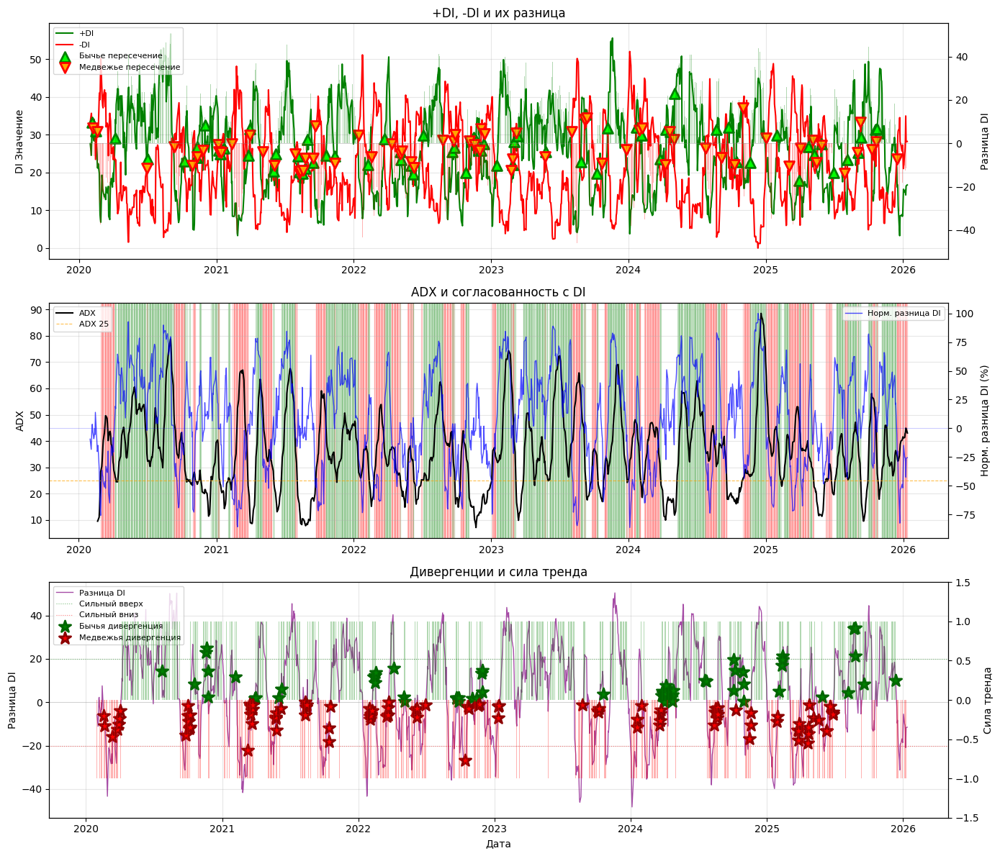

In [ ]:
# ============================================
# БЛОК 3.4: АНАЛИЗ РАЗНИЦЫ DI+ И DI-
# ============================================
print("\n" + "="*80)
print("БЛОК 3.4: АНАЛИЗ РАЗНИЦЫ DI+ И DI-")
print("="*80)

def calculate_di_analysis(data):
    """Анализ разницы между DI+ и DI-"""
    print("Анализ разницы DI+ и DI-...")

    # Разница DI
    data['di_diff'] = data['plus_di'] - data['minus_di']

    # Нормализованная разница
    data['di_diff_norm'] = data['di_diff'] / (data['plus_di'] + data['minus_di']) * 100

    # Сила тренда по разнице DI
    data['di_trend_strength'] = 0
    data.loc[data['di_diff'] > 0, 'di_trend_strength'] = 1  # Восходящий
    data.loc[data['di_diff'] < 0, 'di_trend_strength'] = -1 # Нисходящий

    # Пороговые значения для сильных трендов
    data['di_strong_up'] = (data['di_diff'] > 20).astype(int)
    data['di_strong_down'] = (data['di_diff'] < -20).astype(int)

    # Пересечения DI
    data['di_cross'] = 0
    for i in range(1, len(data)):
        if data['plus_di'].iloc[i] > data['minus_di'].iloc[i] and data['plus_di'].iloc[i-1] <= data['minus_di'].iloc[i-1]:
            data.loc[data.index[i], 'di_cross'] = 1  # Бычье пересечение
        elif data['plus_di'].iloc[i] < data['minus_di'].iloc[i] and data['plus_di'].iloc[i-1] >= data['minus_di'].iloc[i-1]:
            data.loc[data.index[i], 'di_cross'] = -1 # Медвежье пересечение

    # Согласованность с ADX
    data['adx_di_confirmation'] = 0
    strong_trend = data['adx'] > 25
    data.loc[strong_trend & (data['di_trend_strength'] == 1), 'adx_di_confirmation'] = 1
    data.loc[strong_trend & (data['di_trend_strength'] == -1), 'adx_di_confirmation'] = -1

    # Дивергенции
    data['di_divergence'] = 0
    for i in range(20, len(data)):
        # Бычья дивергенция: цена ниже, но DI+ выше
        if (data['Close'].iloc[i] < data['Close'].iloc[i-10] and
            data['plus_di'].iloc[i] > data['plus_di'].iloc[i-10] and
            data['di_diff'].iloc[i] > 0):
            data.loc[data.index[i], 'di_divergence'] = 1

        # Медвежья дивергенция: цена выше, но DI- ниже
        elif (data['Close'].iloc[i] > data['Close'].iloc[i-10] and
              data['minus_di'].iloc[i] < data['minus_di'].iloc[i-10] and
              data['di_diff'].iloc[i] < 0):
            data.loc[data.index[i], 'di_divergence'] = -1

    print("✓ Анализ DI рассчитан")
    return data

# Применяем расчет
data = calculate_di_analysis(data)

# ТЕСТ БЛОКА 3.4
print("\nТЕСТ БЛОКА 3.4: Проверка анализа DI")
print("-" * 60)

# Проверка колонок
required_cols = ['di_diff', 'di_diff_norm', 'di_trend_strength',
                 'di_strong_up', 'di_strong_down', 'di_cross',
                 'adx_di_confirmation', 'di_divergence']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика
print(f"\nРаспределение силы тренда по DI:")
trend_counts = data['di_trend_strength'].value_counts()
for trend, count in trend_counts.items():
    percentage = count / len(data) * 100
    trend_name = {1: "ВОСХОДЯЩИЙ", -1: "НИСХОДЯЩИЙ", 0: "НЕЙТРАЛЬНЫЙ"}.get(trend, trend)
    print(f"  {trend_name}: {count} баров ({percentage:.1f}%)")

print(f"\nСильные тренды (|DI diff| > 20):")
print(f"  Сильные вверх: {(data['di_strong_up'] == 1).sum()} баров")
print(f"  Сильные вниз: {(data['di_strong_down'] == 1).sum()} баров")

print(f"\nПересечения DI:")
cross_counts = data['di_cross'].value_counts()
for cross, count in cross_counts.items():
    percentage = count / len(data) * 100
    cross_name = {1: "БЫЧЬЕ", -1: "МЕДВЕЖЬЕ", 0: "НЕТ"}.get(cross, cross)
    print(f"  {cross_name}: {count} баров ({percentage:.1f}%)")

print(f"\nСогласованность с ADX > 25:")
confirmation_counts = data['adx_di_confirmation'].value_counts()
for conf, count in confirmation_counts.items():
    percentage = count / len(data) * 100
    conf_name = {1: "БЫЧЬЕ", -1: "МЕДВЕЖЬЕ", 0: "НЕТ"}.get(conf, conf)
    print(f"  {conf_name}: {count} баров ({percentage:.1f}%)")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.4
print("\nВИЗУАЛИЗАЦИЯ БЛОКА 3.4: Анализ разницы DI+ и DI-")
fig, axes = plt.subplots(3, 1, figsize=(14, 12))

# График 1: DI и их разница
ax1 = axes[0]
# DI линии
ax1.plot(data.index, data['plus_di'], 'green', linewidth=1.5, label='+DI')
ax1.plot(data.index, data['minus_di'], 'red', linewidth=1.5, label='-DI')

# Разница DI (гистограмма)
ax1_twin = ax1.twinx()
ax1_twin.bar(data.index, data['di_diff'], alpha=0.3, width=0.8,
             color=['green' if x > 0 else 'red' if x < 0 else 'gray' for x in data['di_diff']])
ax1_twin.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.5)

# Отмечаем пересечения
bull_cross = data[data['di_cross'] == 1].index
bear_cross = data[data['di_cross'] == -1].index

ax1.scatter(bull_cross, data.loc[bull_cross, 'plus_di'],
            color='lime', s=100, marker='^', edgecolors='green', linewidth=2,
            label='Бычье пересечение', zorder=5)
ax1.scatter(bear_cross, data.loc[bear_cross, 'minus_di'],
            color='orange', s=100, marker='v', edgecolors='red', linewidth=2,
            label='Медвежье пересечение', zorder=5)

ax1.set_title('+DI, -DI и их разница', fontsize=12)
ax1.set_ylabel('DI Значение')
ax1_twin.set_ylabel('Разница DI')
ax1.legend(loc='upper left', fontsize=8)
ax1.grid(True, alpha=0.3)

# График 2: ADX и согласованность
ax2 = axes[1]
# ADX
ax2.plot(data.index, data['adx'], 'black', linewidth=1.5, label='ADX')
ax2.axhline(y=25, color='orange', linestyle='--', linewidth=0.8, alpha=0.7, label='ADX 25')

# Нормализованная разница DI
ax2_twin = ax2.twinx()
ax2_twin.plot(data.index, data['di_diff_norm'], 'blue', linewidth=1, alpha=0.7, label='Норм. разница DI')
ax2_twin.axhline(y=0, color='blue', linestyle='-', linewidth=0.5, alpha=0.3)

# Закраска зон согласованности
for idx in data[data['adx_di_confirmation'] == 1].index:
    ax2.axvspan(idx, idx, alpha=0.2, color='green', linewidth=1)
for idx in data[data['adx_di_confirmation'] == -1].index:
    ax2.axvspan(idx, idx, alpha=0.2, color='red', linewidth=1)

ax2.set_title('ADX и согласованность с DI', fontsize=12)
ax2.set_ylabel('ADX')
ax2_twin.set_ylabel('Норм. разница DI (%)')
ax2.legend(loc='upper left', fontsize=8)
ax2_twin.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.3)

# График 3: Дивергенции и сила тренда
ax3 = axes[2]
# Разница DI
ax3.plot(data.index, data['di_diff'], 'purple', linewidth=1, alpha=0.7, label='Разница DI')
ax3.axhline(y=20, color='green', linestyle=':', linewidth=0.8, alpha=0.5, label='Сильный вверх')
ax3.axhline(y=-20, color='red', linestyle=':', linewidth=0.8, alpha=0.5, label='Сильный вниз')
ax3.axhline(y=0, color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

# Отмечаем дивергенции
bull_div = data[data['di_divergence'] == 1].index
bear_div = data[data['di_divergence'] == -1].index

ax3.scatter(bull_div, data.loc[bull_div, 'di_diff'],
            color='green', s=150, marker='*', edgecolors='darkgreen', linewidth=2,
            label='Бычья дивергенция', zorder=5)
ax3.scatter(bear_div, data.loc[bear_div, 'di_diff'],
            color='red', s=150, marker='*', edgecolors='darkred', linewidth=2,
            label='Медвежья дивергенция', zorder=5)

# Гистограмма силы тренда
ax3_twin = ax3.twinx()
ax3_twin.bar(data.index, data['di_trend_strength'], alpha=0.3, width=0.8,
             color=['green' if x == 1 else 'red' if x == -1 else 'gray' for x in data['di_trend_strength']])
ax3_twin.set_ylabel('Сила тренда', fontsize=10)
ax3_twin.set_ylim(-1.5, 1.5)

ax3.set_title('Дивергенции и сила тренда', fontsize=12)
ax3.set_xlabel('Дата')
ax3.set_ylabel('Разница DI')
ax3.legend(loc='upper left', fontsize=8)
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('block3_4_di_analysis.png', dpi=100, bbox_inches='tight')
print("✓ График сохранен в 'block3_4_di_analysis.png'")
plt.show()

## дальнейшие исследования блок3.4 фракталы +ДИ


БЛОК 3.4: ФРАКТАЛЫ НА РАЗНИЦЕ DI+ И DI- С СРАВНЕНИЕМ С ЦЕНОЙ
Расчет фракталов на разнице DI+ и DI- и сравнение с ценой...
✓ Фракталы на разнице DI+ и DI- рассчитаны и проанализированы

ТЕСТ БЛОКА 3.4: Проверка фракталов на разнице DI+ и DI-
------------------------------------------------------------
✓ Все колонки присутствуют

СТАТИСТИКА ФРАКТАЛОВ 5-1-5:
----------------------------------------

На разнице DI+ и DI-:
  НЕТ: 1332 (88.3%)
  МЕДВЕЖИЙ: 94 (6.2%)
  БЫЧИЙ: 82 (5.4%)

На графике цены:
  НЕТ: 1337 (88.7%)
  БЫЧИЙ: 86 (5.7%)
  МЕДВЕЖИЙ: 85 (5.6%)

СОВПАДЕНИЯ DI и ЦЕНЫ:
----------------------------------------
  Всего фракталов DI: 176
  Всего фракталов цены: 171
  Совпадений: 46
  Процент совпадений: 26.1%

АНАЛИЗ СИЛЫ СИГНАЛОВ DI ФРАКТАЛОВ:
----------------------------------------

Распределение силы сигналов:
  МЕДВЕЖИЙ (сила 9.0): 8
  МЕДВЕЖИЙ (сила 6.0): 9
  МЕДВЕЖИЙ (сила 4.5): 34
  МЕДВЕЖИЙ (сила 4.0): 2
  МЕДВЕЖИЙ (сила 3.0): 22
  МЕДВЕЖИЙ (сила 2.0): 19
  БЫЧИЙ (сила 

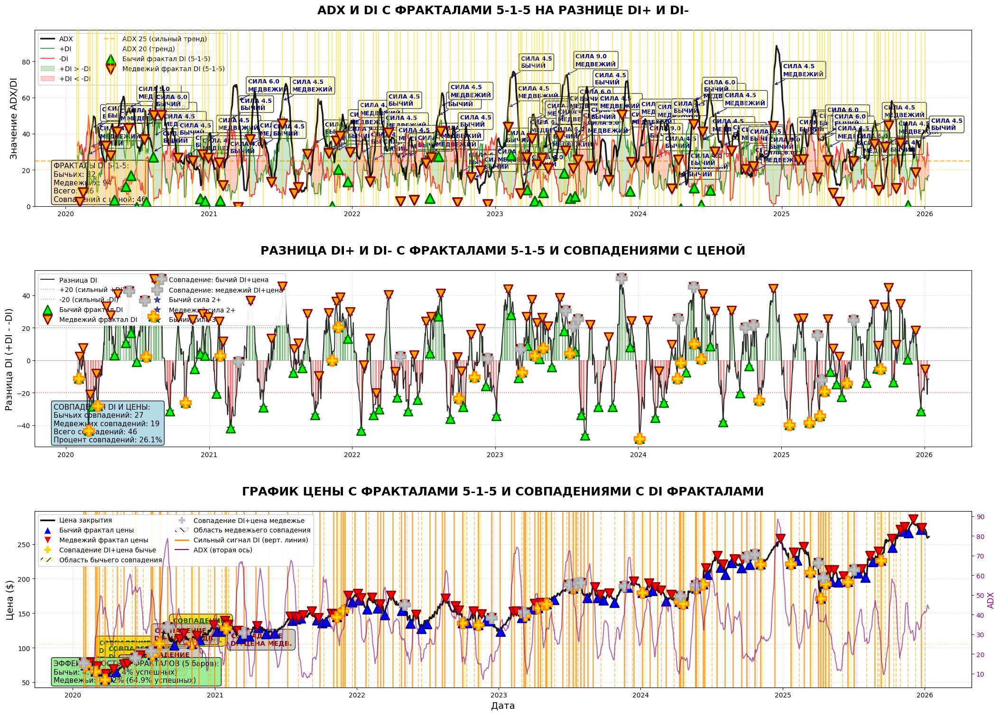

In [ ]:
# ============================================
# БЛОК 3.4: ФРАКТАЛЫ НА РАЗНИЦЕ DI+ И DI- С СРАВНЕНИЕМ С ЦЕНОЙ
# ============================================
print("\n" + "="*80)
print("БЛОК 3.4: ФРАКТАЛЫ НА РАЗНИЦЕ DI+ И DI- С СРАВНЕНИЕМ С ЦЕНОЙ")
print("="*80)

def calculate_di_fractals_with_comparison(data):
    """Расчет фракталов на разнице DI+ и DI- и сравнение с фракталами на цене"""
    print("Расчет фракталов на разнице DI+ и DI- и сравнение с ценой...")

    # 1. РАЗНИЦА DI+ И DI- (ЕСЛИ ЕЩЕ НЕ РАССЧИТАНА)
    # -------------------------------------------------
    if 'di_diff' not in data.columns:
        data['di_diff'] = data['plus_di'] - data['minus_di']

    # 2. ФРАКТАЛЫ 5-1-5 НА РАЗНИЦЕ DI
    # -------------------------------------------------
    # Используем функцию из блока 3.2
    def find_fractals_5_1_5(series):
        """Находит фракталы 5-1-5 на любом ряде данных"""
        fractals = pd.Series(0, index=series.index)

        for i in range(5, len(series) - 5):
            current_val = series.iloc[i]

            # Проверка на максимум (медвежий фрактал)
            is_max = True
            # Проверяем 5 баров слева
            for j in range(1, 6):
                if series.iloc[i - j] >= current_val:
                    is_max = False
                    break
            # Проверяем 5 баров справа
            if is_max:
                for j in range(1, 6):
                    if series.iloc[i + j] >= current_val:
                        is_max = False
                        break

            # Проверка на минимум (бычий фрактал)
            is_min = True
            # Проверяем 5 баров слева
            for j in range(1, 6):
                if series.iloc[i - j] <= current_val:
                    is_min = False
                    break
            # Проверяем 5 баров справа
            if is_min:
                for j in range(1, 6):
                    if series.iloc[i + j] <= current_val:
                        is_min = False
                        break

            # Назначаем значение фрактала
            if is_max:
                fractals.iloc[i] = -1  # Медвежий фрактал
            elif is_min:
                fractals.iloc[i] = 1   # Бычий фрактал

        return fractals

    # Находим фракталы на разнице DI
    data['di_diff_fractal_5_1_5'] = find_fractals_5_1_5(data['di_diff'])

    # 3. ФРАКТАЛЫ 5-1-5 НА ГРАФИКЕ ЦЕНЫ
    # -------------------------------------------------
    # Для сравнения находим фракталы на ценах
    data['price_fractal_5_1_5'] = find_fractals_5_1_5(data['Close'])

    # 4. СОВПАДЕНИЕ ФРАКТАЛОВ DI И ЦЕНЫ
    # -------------------------------------------------
    # Сравниваем в окне ±3 бара
    data['di_price_fractal_match'] = 0

    for i in range(len(data)):
        di_fractal = data['di_diff_fractal_5_1_5'].iloc[i]
        price_fractal = data['price_fractal_5_1_5'].iloc[i]

        if di_fractal != 0 and price_fractal != 0:
            # Ищем соответствие в окне ±3 бара
            window_size = 3
            start_idx = max(0, i - window_size)
            end_idx = min(len(data), i + window_size + 1)

            for j in range(start_idx, end_idx):
                if data['di_diff_fractal_5_1_5'].iloc[j] == di_fractal and \
                   data['price_fractal_5_1_5'].iloc[j] == price_fractal and \
                   di_fractal == price_fractal:
                    data.loc[data.index[i], 'di_price_fractal_match'] = di_fractal
                    break

    # 5. АНАЛИЗ СИГНАЛОВ НА ОСНОВЕ DI ФРАКТАЛОВ
    # -------------------------------------------------
    # Классификация сигналов по силе
    data['di_fractal_signal_strength'] = 0

    for i in range(len(data)):
        di_fractal = data['di_diff_fractal_5_1_5'].iloc[i]
        adx_value = data['adx'].iloc[i]
        di_diff_value = data['di_diff'].iloc[i]

        if di_fractal != 0:
            # Базовая сила сигнала
            base_strength = abs(di_fractal) * 2  # 2 для бычьих, -2 для медвежьих

            # Усиление при сильном тренде (ADX > 25)
            if adx_value > 25:
                base_strength *= 1.5

            # Усиление при большой разнице DI
            if abs(di_diff_value) > 20:
                base_strength *= 1.5

            # Усиление при совпадении с ценовым фракталом
            if data['di_price_fractal_match'].iloc[i] != 0:
                base_strength *= 2

            # Назначаем силу с правильным знаком
            data.loc[data.index[i], 'di_fractal_signal_strength'] = base_strength * di_fractal

    # 6. ДОПОЛНИТЕЛЬНЫЙ АНАЛИЗ
    # -------------------------------------------------
    # Периоды между фракталами DI
    di_fractal_indices = data[data['di_diff_fractal_5_1_5'] != 0].index
    if len(di_fractal_indices) > 1:
        di_fractal_intervals = []
        for i in range(1, len(di_fractal_indices)):
            interval = (di_fractal_indices[i] - di_fractal_indices[i-1]).days
            di_fractal_intervals.append(interval)

        if di_fractal_intervals:
            data['avg_di_fractal_interval'] = np.mean(di_fractal_intervals)

    # Статистика совпадений
    match_stats = {
        'total_di_fractals': (data['di_diff_fractal_5_1_5'] != 0).sum(),
        'total_price_fractals': (data['price_fractal_5_1_5'] != 0).sum(),
        'total_matches': (data['di_price_fractal_match'] != 0).sum()
    }

    if match_stats['total_di_fractals'] > 0:
        match_percentage = match_stats['total_matches'] / match_stats['total_di_fractals'] * 100
    else:
        match_percentage = 0

    data['di_price_match_percentage'] = match_percentage

    # 7. ЭФФЕКТИВНОСТЬ СИГНАЛОВ DI ФРАКТАЛОВ
    # -------------------------------------------------
    # Анализ эффективности на разных горизонтах
    for period in [1, 3, 5, 10]:
        # Для бычьих фракталов DI
        bull_fractals = data[data['di_diff_fractal_5_1_5'] == 1].index
        returns_bull = []

        for idx in bull_fractals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + period < len(data):
                future_price = data.iloc[idx_loc + period]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns_bull.append(return_pct)

        if returns_bull:
            avg_return = np.mean(returns_bull)
            win_rate = len([r for r in returns_bull if r > 0]) / len(returns_bull) * 100
            data[f'di_fractal_bull_return_{period}'] = avg_return
            data[f'di_fractal_bull_winrate_{period}'] = win_rate

        # Для медвежьих фракталов DI
        bear_fractals = data[data['di_diff_fractal_5_1_5'] == -1].index
        returns_bear = []

        for idx in bear_fractals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + period < len(data):
                future_price = data.iloc[idx_loc + period]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns_bear.append(return_pct)

        if returns_bear:
            avg_return = np.mean(returns_bear)
            win_rate = len([r for r in returns_bear if r < 0]) / len(returns_bear) * 100
            data[f'di_fractal_bear_return_{period}'] = avg_return
            data[f'di_fractal_bear_winrate_{period}'] = win_rate

    print("✓ Фракталы на разнице DI+ и DI- рассчитаны и проанализированы")
    return data, match_stats

# Применяем расчет
data, match_stats = calculate_di_fractals_with_comparison(data)

# ТЕСТ БЛОКА 3.4
print("\nТЕСТ БЛОКА 3.4: Проверка фракталов на разнице DI+ и DI-")
print("-" * 60)

# Проверка колонок
required_cols = ['di_diff_fractal_5_1_5', 'price_fractal_5_1_5',
                 'di_price_fractal_match', 'di_fractal_signal_strength']
missing = [col for col in required_cols if col not in data.columns]
if missing:
    print(f"✗ Отсутствуют колонки: {missing}")
else:
    print(f"✓ Все колонки присутствуют")

# Статистика фракталов
print(f"\nСТАТИСТИКА ФРАКТАЛОВ 5-1-5:")
print("-" * 40)

print(f"\nНа разнице DI+ и DI-:")
di_fractal_stats = data['di_diff_fractal_5_1_5'].value_counts()
for value, count in di_fractal_stats.items():
    direction = {1: "БЫЧИЙ", -1: "МЕДВЕЖИЙ", 0: "НЕТ"}.get(value, value)
    percentage = count / len(data) * 100
    print(f"  {direction}: {count} ({percentage:.1f}%)")

print(f"\nНа графике цены:")
price_fractal_stats = data['price_fractal_5_1_5'].value_counts()
for value, count in price_fractal_stats.items():
    direction = {1: "БЫЧИЙ", -1: "МЕДВЕЖИЙ", 0: "НЕТ"}.get(value, value)
    percentage = count / len(data) * 100
    print(f"  {direction}: {count} ({percentage:.1f}%)")

print(f"\nСОВПАДЕНИЯ DI и ЦЕНЫ:")
print("-" * 40)
print(f"  Всего фракталов DI: {match_stats['total_di_fractals']}")
print(f"  Всего фракталов цены: {match_stats['total_price_fractals']}")
print(f"  Совпадений: {match_stats['total_matches']}")
print(f"  Процент совпадений: {match_stats.get('total_matches', 0) / max(match_stats['total_di_fractals'], 1) * 100:.1f}%")

# Анализ силы сигналов
print(f"\nАНАЛИЗ СИЛЫ СИГНАЛОВ DI ФРАКТАЛОВ:")
print("-" * 40)

# Группируем по силе сигналов
strength_stats = data['di_fractal_signal_strength'].value_counts().sort_index()
print(f"\nРаспределение силы сигналов:")
for strength, count in strength_stats.items():
    if strength != 0:
        direction = "БЫЧИЙ" if strength > 0 else "МЕДВЕЖИЙ"
        print(f"  {direction} (сила {abs(strength):.1f}): {count}")

# ВИЗУАЛИЗАЦИЯ БЛОКА 3.4
print("\nСоздание детализированных графиков фракталов DI и сравнения с ценой...")

# Создаем фигуру с увеличенной шириной
fig_width = 22
fig_height = 16  # Увеличиваем высоту для 3 графиков
fig, axes = plt.subplots(3, 1, figsize=(fig_width, fig_height))

# ================= ГРАФИК 1: ADX И DI С ФРАКТАЛАМИ =================
ax1 = axes[0]

# 1. ОСНОВНЫЕ ЛИНИИ ADX И DI
# -------------------------------------------------
# ADX (толстая черная линия)
ax1.plot(data.index, data['adx'], 'black', linewidth=2.5, label='ADX', alpha=0.9, zorder=5)

# +DI и -DI (тонкие линии)
ax1.plot(data.index, data['plus_di'], 'green', linewidth=1.5, label='+DI', alpha=0.7, zorder=4)
ax1.plot(data.index, data['minus_di'], 'red', linewidth=1.5, label='-DI', alpha=0.7, zorder=4)

# Разница DI (площадь между линиями)
ax1.fill_between(data.index, data['plus_di'], data['minus_di'],
                 where=data['plus_di'] >= data['minus_di'],
                 alpha=0.2, color='green', label='+DI > -DI', zorder=3)
ax1.fill_between(data.index, data['plus_di'], data['minus_di'],
                 where=data['plus_di'] < data['minus_di'],
                 alpha=0.2, color='red', label='+DI < -DI', zorder=3)

# 2. УРОВНИ ADX
# -------------------------------------------------
# Уровень 25 (сильный тренд)
ax1.axhline(y=25, color='orange', linestyle='--', linewidth=1.8, alpha=0.7,
           label='ADX 25 (сильный тренд)', zorder=2)

# Уровень 20 (средний тренд)
ax1.axhline(y=20, color='yellow', linestyle=':', linewidth=1.2, alpha=0.5,
           label='ADX 20 (тренд)', zorder=2)

# 3. ФРАКТАЛЫ НА РАЗНИЦЕ DI (5-1-5)
# -------------------------------------------------
# Бычьи фракталы DI (разница DI положительная)
di_bull_fractals = data[data['di_diff_fractal_5_1_5'] == 1].index
if len(di_bull_fractals) > 0:
    ax1.scatter(di_bull_fractals, data.loc[di_bull_fractals, 'di_diff'],
               color='lime', s=200, marker='^', edgecolors='darkgreen', linewidth=2.5,
               label='Бычий фрактал DI (5-1-5)', zorder=10)

# Медвежьи фракталы DI (разница DI отрицательная)
di_bear_fractals = data[data['di_diff_fractal_5_1_5'] == -1].index
if len(di_bear_fractals) > 0:
    ax1.scatter(di_bear_fractals, data.loc[di_bear_fractals, 'di_diff'],
               color='orange', s=200, marker='v', edgecolors='darkred', linewidth=2.5,
               label='Медвежий фрактал DI (5-1-5)', zorder=10)

# 4. ВЫДЕЛЕНИЕ СИЛЬНЫХ СИГНАЛОВ
# -------------------------------------------------
# Сигналы с высокой силой (сила >= 3)
strong_signals = data[abs(data['di_fractal_signal_strength']) >= 3].index
for idx in strong_signals:
    # Вертикальные линии для сильных сигналов
    ax1.axvline(x=idx, color='gold', linestyle='-', linewidth=1.5, alpha=0.5, zorder=6)

    # Аннотации для самых сильных сигналов
    if abs(data.loc[idx, 'di_fractal_signal_strength']) >= 4:
        signal_strength = data.loc[idx, 'di_fractal_signal_strength']
        direction = "БЫЧИЙ" if signal_strength > 0 else "МЕДВЕЖИЙ"

        ax1.annotate(f'СИЛА {abs(signal_strength):.1f}\n{direction}',
                    xy=(idx, data.loc[idx, 'adx']),
                    xytext=(15, 15), textcoords='offset points',
                    fontsize=9, color='darkblue', weight='bold',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='lightyellow', alpha=0.8),
                    arrowprops=dict(arrowstyle='->', color='darkblue'))

# 5. НАСТРОЙКА ПЕРВОГО ГРАФИКА
# -------------------------------------------------
ax1.set_title('ADX И DI С ФРАКТАЛАМИ 5-1-5 НА РАЗНИЦЕ DI+ И DI-',
              fontsize=18, fontweight='bold', pad=25)
ax1.set_ylabel('Значение ADX/DI', fontsize=14)
ax1.set_ylim(0, max(data['adx'].max(), data['plus_di'].max(), data['minus_di'].max()) * 1.1)
ax1.grid(True, alpha=0.3, linestyle='--', zorder=0)
ax1.legend(loc='upper left', fontsize=10, ncol=2, framealpha=0.95)

# Статистика на графике
stats_text = f"ФРАКТАЛЫ DI 5-1-5:\n"
stats_text += f"Бычьих: {len(di_bull_fractals)}\n"
stats_text += f"Медвежьих: {len(di_bear_fractals)}\n"
stats_text += f"Всего: {len(di_bull_fractals) + len(di_bear_fractals)}\n"
stats_text += f"Совпадений с ценой: {match_stats['total_matches']}"

ax1.text(0.02, 0.02, stats_text, transform=ax1.transAxes, fontsize=11,
         verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

# ================= ГРАФИК 2: РАЗНИЦА DI С ФРАКТАЛАМИ И СОВПАДЕНИЯМИ =================
ax2 = axes[1]

# 1. РАЗНИЦА DI (ГИСТОГРАММА И ЛИНИЯ)
# -------------------------------------------------
# Гистограмма разницы DI
ax2.bar(data.index, data['di_diff'], alpha=0.5, color=['green' if x > 0 else 'red' if x < 0 else 'gray' for x in data['di_diff']],
        label='Разница DI (+DI - -DI)', zorder=3)

# Линия разницы DI
ax2.plot(data.index, data['di_diff'], 'black', linewidth=1.5, alpha=0.8, label='Разница DI', zorder=4)

# Нулевая линия
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=1.0, alpha=0.5, zorder=2)

# Уровни ±20 (сильная разница)
ax2.axhline(y=20, color='green', linestyle=':', linewidth=1.2, alpha=0.5, label='+20 (сильный +DI)', zorder=2)
ax2.axhline(y=-20, color='red', linestyle=':', linewidth=1.2, alpha=0.5, label='-20 (сильный -DI)', zorder=2)

# 2. ФРАКТАЛЫ НА РАЗНИЦЕ DI (ОСНОВНЫЕ МАРКЕРЫ)
# -------------------------------------------------
# Бычьи фракталы
if len(di_bull_fractals) > 0:
    ax2.scatter(di_bull_fractals, data.loc[di_bull_fractals, 'di_diff'],
               color='lime', s=180, marker='^', edgecolors='darkgreen', linewidth=2.0,
               label='Бычий фрактал DI', zorder=10)

# Медвежьи фракталы
if len(di_bear_fractals) > 0:
    ax2.scatter(di_bear_fractals, data.loc[di_bear_fractals, 'di_diff'],
               color='orange', s=180, marker='v', edgecolors='darkred', linewidth=2.0,
               label='Медвежий фрактал DI', zorder=10)

# 3. СОВПАДЕНИЯ С ЦЕНОВЫМИ ФРАКТАЛАМИ (ВЫДЕЛЕННЫЕ МАРКЕРЫ)
# -------------------------------------------------
# Бычьи совпадения
bull_matches = data[(data['di_diff_fractal_5_1_5'] == 1) & (data['di_price_fractal_match'] == 1)].index
if len(bull_matches) > 0:
    ax2.scatter(bull_matches, data.loc[bull_matches, 'di_diff'],
               color='gold', s=250, marker='P', edgecolors='darkorange', linewidth=2.5,
               label='Совпадение: бычий DI+цена', zorder=12)

# Медвежьи совпадения
bear_matches = data[(data['di_diff_fractal_5_1_5'] == -1) & (data['di_price_fractal_match'] == -1)].index
if len(bear_matches) > 0:
    ax2.scatter(bear_matches, data.loc[bear_matches, 'di_diff'],
               color='silver', s=250, marker='P', edgecolors='darkgray', linewidth=2.5,
               label='Совпадение: медвежий DI+цена', zorder=12)

# 4. СИЛА СИГНАЛОВ (РАЗМЕР МАРКЕРОВ ПО СИЛЕ)
# -------------------------------------------------
# Группируем фракталы по силе сигнала
strength_levels = [1, 2, 3, 4, 5]
strength_colors = ['cyan', 'blue', 'green', 'lime', 'darkgreen']
strength_sizes = [80, 100, 120, 150, 180]

for strength, color, size in zip(strength_levels, strength_colors, strength_sizes):
    # Бычьи сигналы данной силы
    strong_bull = data[(data['di_fractal_signal_strength'] >= strength) &
                       (data['di_fractal_signal_strength'] < strength + 1)].index

    if len(strong_bull) > 0:
        ax2.scatter(strong_bull, data.loc[strong_bull, 'di_diff'],
                   color=color, s=size, marker='*', edgecolors='black', linewidth=1.0,
                   label=f'Бычий сила {strength}+', zorder=8, alpha=0.7)

    # Медвежьи сигналы данной силы
    strong_bear = data[(data['di_fractal_signal_strength'] <= -strength) &
                       (data['di_fractal_signal_strength'] > -strength - 1)].index

    if len(strong_bear) > 0:
        ax2.scatter(strong_bear, data.loc[strong_bear, 'di_diff'],
                   color=color, s=size, marker='*', edgecolors='black', linewidth=1.0,
                   label=f'Медвежий сила {strength}+', zorder=8, alpha=0.7)

# 5. НАСТРОЙКА ВТОРОГО ГРАФИКА
# -------------------------------------------------
ax2.set_title('РАЗНИЦА DI+ И DI- С ФРАКТАЛАМИ 5-1-5 И СОВПАДЕНИЯМИ С ЦЕНОЙ',
              fontsize=18, fontweight='bold', pad=25)
ax2.set_ylabel('Разница DI (+DI - -DI)', fontsize=14)
ax2.grid(True, alpha=0.3, linestyle='--', zorder=0)

# Легенда с группировкой
handles, labels = ax2.get_legend_handles_labels()
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)

ax2.legend(unique_handles[:10], unique_labels[:10], loc='upper left', fontsize=10,
           ncol=2, framealpha=0.95)

# Информация о совпадениях
match_text = f"СОВПАДЕНИЯ DI И ЦЕНЫ:\n"
match_text += f"Бычьих совпадений: {len(bull_matches)}\n"
match_text += f"Медвежьих совпадений: {len(bear_matches)}\n"
match_text += f"Всего совпадений: {len(bull_matches) + len(bear_matches)}\n"
match_text += f"Процент совпадений: {match_stats.get('total_matches', 0) / max(match_stats['total_di_fractals'], 1) * 100:.1f}%"

ax2.text(0.02, 0.02, match_text, transform=ax2.transAxes, fontsize=11,
         verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.9))

# ================= ГРАФИК 3: ЦЕНА С ФРАКТАЛАМИ 5-1-5 И СОВПАДЕНИЯМИ С DI =================
ax3 = axes[2]

# 1. ГРАФИК ЦЕНЫ
# -------------------------------------------------
ax3.plot(data.index, data['Close'], 'black', linewidth=2.5, label='Цена закрытия', alpha=0.9, zorder=5)

# 2. ФРАКТАЛЫ 5-1-5 НА ЦЕНЕ
# -------------------------------------------------
price_bull_fractals = data[data['price_fractal_5_1_5'] == 1].index
price_bear_fractals = data[data['price_fractal_5_1_5'] == -1].index

# Бычьи фракталы на цене
if len(price_bull_fractals) > 0:
    ax3.scatter(price_bull_fractals, data.loc[price_bull_fractals, 'Close'],
               color='blue', s=180, marker='^', edgecolors='darkblue', linewidth=2.0,
               label='Бычий фрактал цены (5-1-5)', zorder=10)

# Медвежьи фракталы на цене
if len(price_bear_fractals) > 0:
    ax3.scatter(price_bear_fractals, data.loc[price_bear_fractals, 'Close'],
               color='red', s=180, marker='v', edgecolors='darkred', linewidth=2.0,
               label='Медвежий фрактал цены (5-1-5)', zorder=10)

# 3. СОВПАДЕНИЯ С ФРАКТАЛАМИ DI (ВЫДЕЛЕННЫЕ ОБЛАСТИ)
# -------------------------------------------------
# Бычьи совпадения
if len(bull_matches) > 0:
    for idx in bull_matches:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 5 < len(data):  # 5 баров после совпадения
            end_idx = data.index[idx_loc + 5]
            ax3.axvspan(idx, end_idx, alpha=0.2, color='gold', hatch='//', zorder=3)

        # Маркер совпадения
        ax3.scatter([idx], data.loc[idx, 'Close'],
                   color='gold', s=250, marker='P', edgecolors='darkorange', linewidth=2.5,
                   zorder=12)

# Медвежьи совпадения
if len(bear_matches) > 0:
    for idx in bear_matches:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 5 < len(data):  # 5 баров после совпадения
            end_idx = data.index[idx_loc + 5]
            ax3.axvspan(idx, end_idx, alpha=0.2, color='silver', hatch='\\\\', zorder=3)

        # Маркер совпадения
        ax3.scatter([idx], data.loc[idx, 'Close'],
                   color='silver', s=250, marker='P', edgecolors='darkgray', linewidth=2.5,
                   zorder=12)

# 4. ВЕРТИКАЛЬНЫЕ ЛИНИИ ДЛЯ СИЛЬНЫХ СИГНАЛОВ DI
# -------------------------------------------------
# Сильные сигналы DI (сила >= 3)
for idx in strong_signals:
    signal_strength = abs(data.loc[idx, 'di_fractal_signal_strength'])
    if signal_strength >= 3:
        # Цвет в зависимости от силы
        if signal_strength >= 4:
            color = 'darkorange'
            linestyle = '-'
            linewidth = 2.0
            alpha = 0.7
        else:
            color = 'orange'
            linestyle = '--'
            linewidth = 1.5
            alpha = 0.5

        ax3.axvline(x=idx, color=color, linestyle=linestyle,
                   linewidth=linewidth, alpha=alpha, zorder=4)

# 5. АННОТАЦИИ ДЛЯ СИЛЬНЫХ СОВПАДЕНИЙ
# -------------------------------------------------
# Аннотируем первые 5 сильных совпадений каждого типа
for idx in list(bull_matches)[:5]:
    ax3.annotate('СОВПАДЕНИЕ\nDI+ЦЕНА БЫЧ.', xy=(idx, data.loc[idx, 'Close']),
                xytext=(20, 20), textcoords='offset points',
                fontsize=10, color='darkgreen', weight='bold',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='gold', alpha=0.8),
                arrowprops=dict(arrowstyle='->', color='darkgreen'))

for idx in list(bear_matches)[:5]:
    ax3.annotate('СОВПАДЕНИЕ\nDI+ЦЕНА МЕДВ.', xy=(idx, data.loc[idx, 'Close']),
                xytext=(-20, -20), textcoords='offset points',
                fontsize=10, color='darkred', weight='bold',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='silver', alpha=0.8),
                arrowprops=dict(arrowstyle='->', color='darkred'))

# 6. ДОБАВЛЯЕМ ADX НА ВТОРОСТЕПЕННУЮ ОСЬ ДЛЯ СРАВНЕНИЯ
# -------------------------------------------------
ax3_twin = ax3.twinx()
ax3_twin.plot(data.index, data['adx'], 'purple', linewidth=1.5, alpha=0.6, label='ADX', zorder=4)
ax3_twin.set_ylabel('ADX', fontsize=12, color='purple')
ax3_twin.tick_params(axis='y', labelcolor='purple')

# Добавляем уровень 25 ADX
ax3_twin.axhline(y=25, color='orange', linestyle=':', linewidth=1.0, alpha=0.5, zorder=2)

# 7. НАСТРОЙКА ТРЕТЬЕГО ГРАФИКА
# -------------------------------------------------
ax3.set_title('ГРАФИК ЦЕНЫ С ФРАКТАЛАМИ 5-1-5 И СОВПАДЕНИЯМИ С DI ФРАКТАЛАМИ',
              fontsize=18, fontweight='bold', pad=25)
ax3.set_xlabel('Дата', fontsize=14)
ax3.set_ylabel('Цена ($)', fontsize=14)
ax3.grid(True, alpha=0.3, linestyle='--', zorder=0)

# Создаем кастомную легенду
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

legend_elements = [
    Line2D([0], [0], color='black', lw=2.5, label='Цена закрытия'),
]

if len(price_bull_fractals) > 0:
    legend_elements.append(Line2D([0], [0], marker='^', color='w',
                                  markerfacecolor='blue', markersize=12,
                                  label='Бычий фрактал цены'))
if len(price_bear_fractals) > 0:
    legend_elements.append(Line2D([0], [0], marker='v', color='w',
                                  markerfacecolor='red', markersize=12,
                                  label='Медвежий фрактал цены'))

if len(bull_matches) > 0:
    legend_elements.append(Line2D([0], [0], marker='P', color='w',
                                  markerfacecolor='gold', markersize=12,
                                  label='Совпадение DI+цена бычье'))
    legend_elements.append(Patch(facecolor='gold', alpha=0.2, hatch='//',
                                label='Область бычьего совпадения'))

if len(bear_matches) > 0:
    legend_elements.append(Line2D([0], [0], marker='P', color='w',
                                  markerfacecolor='silver', markersize=12,
                                  label='Совпадение DI+цена медвежье'))
    legend_elements.append(Patch(facecolor='silver', alpha=0.2, hatch='\\\\',
                                label='Область медвежьего совпадения'))

legend_elements.append(Line2D([0], [0], color='darkorange', lw=2.0,
                              label='Сильный сигнал DI (верт. линия)'))
legend_elements.append(Line2D([0], [0], color='purple', lw=1.5,
                              label='ADX (вторая ось)'))

ax3.legend(handles=legend_elements, loc='upper left', fontsize=10,
           ncol=2, framealpha=0.95, frameon=True)

# Статистика эффективности
if 'di_fractal_bull_return_5' in data.columns:
    bull_return = data['di_fractal_bull_return_5'].dropna().iloc[0] if not data['di_fractal_bull_return_5'].dropna().empty else 0
    bull_winrate = data['di_fractal_bull_winrate_5'].dropna().iloc[0] if not data['di_fractal_bull_winrate_5'].dropna().empty else 0
    bear_return = data['di_fractal_bear_return_5'].dropna().iloc[0] if not data['di_fractal_bear_return_5'].dropna().empty else 0
    bear_winrate = data['di_fractal_bear_winrate_5'].dropna().iloc[0] if not data['di_fractal_bear_winrate_5'].dropna().empty else 0

    eff_text = f"ЭФФЕКТИВНОСТЬ DI ФРАКТАЛОВ (5 баров):\n"
    eff_text += f"Бычьи: {bull_return:.2f}% ({bull_winrate:.1f}% успешных)\n"
    eff_text += f"Медвежьи: {bear_return:.2f}% ({bear_winrate:.1f}% успешных)"

    ax3.text(0.02, 0.02, eff_text, transform=ax3.transAxes, fontsize=11,
             verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))

# ================= НАСТРОЙКА ОБЩЕЙ ФИГУРЫ =================
plt.tight_layout(pad=4.0)

# Сохраняем график с высоким разрешением
plt.savefig('block3_4_di_fractals_comparison.png', dpi=150, bbox_inches='tight')
print("\n✓ Графики фракталов DI и сравнения с ценой сохранены в 'block3_4_di_fractals_comparison.png'")

# АНАЛИЗ ЭФФЕКТИВНОСТИ
print("\n" + "="*80)
print("АНАЛИЗ ЭФФЕКТИВНОСТИ ФРАКТАЛОВ DI 5-1-5:")
print("="*80)

# Анализ эффективности по силе сигналов
print(f"\nЭФФЕКТИВНОСТЬ ПО СИЛЕ СИГНАЛОВ (5 баров):")
print("-" * 40)

strength_groups = [(1, 2), (2, 3), (3, 4), (4, 5)]

for min_strength, max_strength in strength_groups:
    # Бычьи сигналы данной силы
    strong_bull_signals = data[(data['di_fractal_signal_strength'] >= min_strength) &
                               (data['di_fractal_signal_strength'] < max_strength + 1)].index

    if len(strong_bull_signals) > 0:
        returns = []
        for idx in strong_bull_signals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 5 < len(data):
                future_price = data.iloc[idx_loc + 5]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns.append(return_pct)

        if returns:
            avg_return = np.mean(returns)
            win_rate = len([r for r in returns if r > 0]) / len(returns) * 100
            print(f"\nБычьи сигналы силы {min_strength}-{max_strength}:")
            print(f"  Количество: {len(strong_bull_signals)}")
            print(f"  Средняя доходность: {avg_return:.2f}%")
            print(f"  Процент успешных: {win_rate:.1f}%")

    # Медвежьи сигналы данной силы
    strong_bear_signals = data[(data['di_fractal_signal_strength'] <= -min_strength) &
                               (data['di_fractal_signal_strength'] > -max_strength - 1)].index

    if len(strong_bear_signals) > 0:
        returns = []
        for idx in strong_bear_signals:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 5 < len(data):
                future_price = data.iloc[idx_loc + 5]['Close']
                current_price = data.loc[idx, 'Close']
                return_pct = (future_price - current_price) / current_price * 100
                returns.append(return_pct)

        if returns:
            avg_return = np.mean(returns)
            win_rate = len([r for r in returns if r < 0]) / len(returns) * 100
            print(f"\nМедвежьи сигналы силы {min_strength}-{max_strength}:")
            print(f"  Количество: {len(strong_bear_signals)}")
            print(f"  Средняя доходность: {avg_return:.2f}%")
            print(f"  Процент успешных: {win_rate:.1f}%")

# Анализ совпадений
print(f"\nАНАЛИЗ СОВПАДЕНИЙ DI И ЦЕНЫ:")
print("-" * 40)

if len(bull_matches) > 0:
    returns_bull_match = []
    for idx in bull_matches:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 5 < len(data):
            future_price = data.iloc[idx_loc + 5]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            returns_bull_match.append(return_pct)

    if returns_bull_match:
        avg_return = np.mean(returns_bull_match)
        win_rate = len([r for r in returns_bull_match if r > 0]) / len(returns_bull_match) * 100
        print(f"\nБычьи совпадения (DI+цена):")
        print(f"  Количество: {len(bull_matches)}")
        print(f"  Средняя доходность: {avg_return:.2f}%")
        print(f"  Процент успешных: {win_rate:.1f}%")

if len(bear_matches) > 0:
    returns_bear_match = []
    for idx in bear_matches:
        idx_loc = data.index.get_loc(idx)
        if idx_loc + 5 < len(data):
            future_price = data.iloc[idx_loc + 5]['Close']
            current_price = data.loc[idx, 'Close']
            return_pct = (future_price - current_price) / current_price * 100
            returns_bear_match.append(return_pct)

    if returns_bear_match:
        avg_return = np.mean(returns_bear_match)
        win_rate = len([r for r in returns_bear_match if r < 0]) / len(returns_bear_match) * 100
        print(f"\nМедвежьи совпадения (DI+цена):")
        print(f"  Количество: {len(bear_matches)}")
        print(f"  Средняя доходность: {avg_return:.2f}%")
        print(f"  Процент успешных: {win_rate:.1f}%")

# Сводная статистика
print(f"\n" + "="*80)
print("СВОДНАЯ СТАТИСТИКА БЛОКА 3.4:")
print("="*80)

print(f"\n1. ФРАКТАЛЫ 5-1-5:")
print(f"   • На разнице DI+: {len(di_bull_fractals)} бычьих, {len(di_bear_fractals)} медвежьих")
print(f"   • На цене: {len(price_bull_fractals)} бычьих, {len(price_bear_fractals)} медвежьих")
print(f"   • Совпадения: {len(bull_matches)} бычьих, {len(bear_matches)} медвежьих")

print(f"\n2. ЭФФЕКТИВНОСТЬ:")
print(f"   • Процент совпадений: {match_stats.get('total_matches', 0) / max(match_stats['total_di_fractals'], 1) * 100:.1f}%")
if 'di_fractal_bull_return_5' in data.columns:
    bull_return = data['di_fractal_bull_return_5'].dropna().iloc[0] if not data['di_fractal_bull_return_5'].dropna().empty else 0
    bear_return = data['di_fractal_bear_return_5'].dropna().iloc[0] if not data['di_fractal_bear_return_5'].dropna().empty else 0
    print(f"   • Средняя доходность бычьих: {bull_return:.2f}%")
    print(f"   • Средняя доходность медвежьих: {bear_return:.2f}%")

print(f"\n3. РЕКОМЕНДАЦИИ:")
print(f"   • Совпадения DI и цены дают наиболее надежные сигналы")
print(f"   • Учитывать силу сигнала (сила >= 3 наиболее эффективна)")
print(f"   • Дополнительно фильтровать по ADX > 25 для усиления сигналов")
print(f"   • Использовать в сочетании с другими индикаторами")

print(f"\n✓ Блок 3.4 успешно завершен")
plt.show()

## сводный отчет по всем улучшениям

In [ ]:
# ============================================
# СВОДНЫЙ ОТЧЕТ ПО ВСЕМ УЛУЧШЕНИЯМ
# ============================================
print("\n" + "="*80)
print("СВОДНЫЙ ОТЧЕТ ПО УЛУЧШЕНИЯМ БЛОКА 3")
print("="*80)

print("\n1. БЛОК 3.1: Дончиан для определения трендов")
print("   ✓ Реализовано определение трендов по каналу Дончиана")
print("   ✓ Добавлены флаги пробоев и ступенек")
print("   ✓ Сравнение с ADX и EMA (7, 11, 14)")
print("   ✓ Визуализация: канал Дончиана, флаги, тренды")

print("\n2. БЛОК 3.2: Фракталы на MACD")
print("   ✓ Поиск фракталов 3-1-3 на разнице MACD")
print("   ✓ Обнаружение дивергенций")
print("   ✓ Визуализация: MACD с фракталами, дивергенции")

print("\n3. БЛОК 3.3: Динамические уровни на RSI")
print("   ✓ Bollinger Bands на RSI для динамических уровней")
print("   ✓ Комбинированные сигналы (статические + динамические)")
print("   ✓ Анализ волатильности RSI")
print("   ✓ Визуализация: RSI с динамическими уровнями")

print("\n4. БЛОК 3.4: Анализ разницы DI+ и DI-")
print("   ✓ Расчет разницы и нормализация")
print("   ✓ Определение силы тренда по DI")
print("   ✓ Обнаружение пересечений и дивергенций")
print("   ✓ Согласованность с ADX")
print("   ✓ Визуализация: гистограмма разницы DI, согласованность с ADX")

print("\n" + "-" * 80)
print("ДОБАВЛЕННЫЕ КОЛОНКИ В ДАННЫЕ:")
print("-" * 80)

new_columns = []
for col in data.columns:
    if col.startswith(('donchian_', 'flag_', 'trend_', 'ema_7', 'ema_11', 'ema_14',
                      'macd_diff', 'macd_fractal', 'macd_divergence',
                      'rsi_bb_', 'rsi_overbought', 'rsi_oversold', 'rsi_signal', 'rsi_volatility',
                      'di_diff', 'di_trend_strength', 'di_strong_', 'di_cross', 'adx_di_confirmation', 'di_divergence')):
        new_columns.append(col)

for i in range(0, len(new_columns), 4):
    print("  " + "  ".join(f"{col:25}" for col in new_columns[i:i+4]))

print(f"\nВсего новых колонок: {len(new_columns)}")
print(f"Общее количество колонок в данных: {len(data.columns)}")

# Сохранение обновленных данных
try:
    data.to_csv('data_with_enhanced_indicators.csv')
    print(f"\n✓ Обновленные данные сохранены в 'data_with_enhanced_indicators.csv'")
    print(f"  Размер данных: {len(data)} строк × {len(data.columns)} колонок")
except Exception as e:
    print(f"\n✗ Ошибка сохранения данных: {e}")


СВОДНЫЙ ОТЧЕТ ПО УЛУЧШЕНИЯМ БЛОКА 3

1. БЛОК 3.1: Дончиан для определения трендов
   ✓ Реализовано определение трендов по каналу Дончиана
   ✓ Добавлены флаги пробоев и ступенек
   ✓ Сравнение с ADX и EMA (7, 11, 14)
   ✓ Визуализация: канал Дончиана, флаги, тренды

2. БЛОК 3.2: Фракталы на MACD
   ✓ Поиск фракталов 3-1-3 на разнице MACD
   ✓ Обнаружение дивергенций
   ✓ Визуализация: MACD с фракталами, дивергенции

3. БЛОК 3.3: Динамические уровни на RSI
   ✓ Bollinger Bands на RSI для динамических уровней
   ✓ Комбинированные сигналы (статические + динамические)
   ✓ Анализ волатильности RSI
   ✓ Визуализация: RSI с динамическими уровнями

4. БЛОК 3.4: Анализ разницы DI+ и DI-
   ✓ Расчет разницы и нормализация
   ✓ Определение силы тренда по DI
   ✓ Обнаружение пересечений и дивергенций
   ✓ Согласованность с ADX
   ✓ Визуализация: гистограмма разницы DI, согласованность с ADX

--------------------------------------------------------------------------------
ДОБАВЛЕННЫЕ КОЛОНКИ В ДА

## Ключевые особенности системы:
1. Поэтапное добавление индикаторов:
Этап 1: Только цифровой кенделстик (вес 1)

Этап 2: + MACD фракталы (вес 2)

Этап 3: + RSI с классификацией (вес 3)

Этап 4: + DI фракталы (вес 4)

Итог: Все индикаторы с суммарным весом 10

2. Классификация сигналов по 6 уровням:
Сильная покупка (≥0.6)

Покупка (≥0.3)

Слабая покупка (≥0.1)

Слабая продажа (≤-0.1)

Продажа (≤-0.3)

Сильная продажа (≤-0.6)

3. 6 уровней визуализации:
График 1: Цена с фракталами разворота
Базовая разметка ценовых фракталов

График 2: Постепенное добавление индикаторов
Наглядное сравнение этапов добавления

Пороговые линии для классификации

График 3: Классификация сигналов
Цветная гистограмма классов

Сопоставление с непрерывным сигналом

График 4: Совпадения с фракталами цены
Статистика совпадений

Визуализация соответствия

График 5: Эффективность по классам
Доходность через N баров

Процент успешных сигналов

Количество сигналов каждого класса

График 6: Итоговый индикатор под ценой
Цена с закрашенными областями сигналов

Итоговый индикатор на второстепенной оси

Наглядное соответствие сигналов и движения цены

4. Статистический анализ:
Эффективность каждого класса сигналов

Совпадения с ценовыми фракталами

Сравнение поэтапного добавления

Подготовка к машинному обучению

5. Метрики эффективности:
Средняя доходность через 1, 2, 3, 4, 5 баров

Процент успешных сигналов

Волатильность сигналов

Четкость классификации


БЛОК 4: СВОДНАЯ СИСТЕМА ВЗВЕШЕННЫХ СИГНАЛОВ
Создание системы взвешенных сигналов...
  1. Цифровой кенделстик (вес 1)...
  2. Фракталы на MACD (вес 2)...
  3. RSI с классификацией по силе (вес 3)...
  4. Фракталы на разнице DI (вес 4)...
  5. Взвешенное суммирование...
  6. Классификация сигналов...
  7. Сравнение с фракталами на цене...
  8. Статистический анализ эффективности...
✓ Система взвешенных сигналов создана

Создание сводной визуализации системы взвешенных сигналов...

✓ Сводная система взвешенных сигналов сохранена в 'block4_weighted_signal_system.png'

СТАТИСТИЧЕСКИЙ АНАЛИЗ ЭФФЕКТИВНОСТИ:

1. ОБЩАЯ СТАТИСТИКА СИГНАЛОВ:
----------------------------------------
  Сильная продажа: 7 (0.5%)
  Продажа: 154 (10.2%)
  Слабая продажа: 454 (30.1%)
  Нет сигнала: 179 (11.9%)
  Слабая покупка: 553 (36.7%)
  Покупка: 148 (9.8%)
  Сильная покупка: 13 (0.9%)

2. ЭФФЕКТИВНОСТЬ ПО КЛАССАМ (5 баров):
----------------------------------------

  Сильная продажа:
    Количество: 7
    Средняя

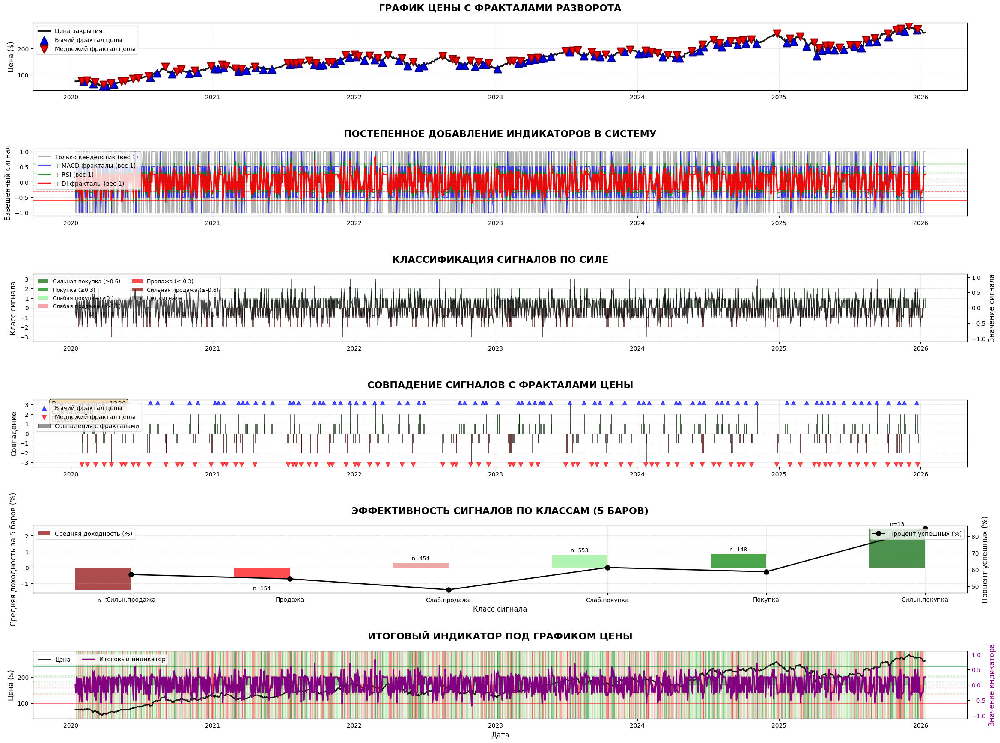

In [ ]:
# ============================================
# БЛОК 4: СВОДНАЯ СИСТЕМА ВЗВЕШЕННЫХ СИГНАЛОВ
# ============================================
print("\n" + "="*80)
print("БЛОК 4: СВОДНАЯ СИСТЕМА ВЗВЕШЕННЫХ СИГНАЛОВ")
print("="*80)

def create_weighted_signal_system(data):
    """Создание системы взвешенных сигналов на основе всех индикаторов"""
    print("Создание системы взвешенных сигналов...")

    # 1. ПОДГОТОВКА СИГНАЛОВ ОТ КАЖДОГО ИНДИКАТОРА
    # -------------------------------------------------

    # 1.1 БЛОК 2: Цифровой кенделстик (вес 1)
    print("  1. Цифровой кенделстик (вес 1)...")
    if 'candle_signal' in data.columns:
        data['signal_candle'] = data['candle_signal'].fillna(0)
    else:
        # Если нет цифрового кенделстика, используем простой сигнал на основе цены
        data['signal_candle'] = 0
        for i in range(1, len(data)):
            if data['Close'].iloc[i] > data['Close'].iloc[i-1]:
                data.loc[data.index[i], 'signal_candle'] = 1
            elif data['Close'].iloc[i] < data['Close'].iloc[i-1]:
                data.loc[data.index[i], 'signal_candle'] = -1

    # Нормализация к диапазону [-1, 1]
    if data['signal_candle'].abs().max() > 0:
        data['signal_candle_norm'] = data['signal_candle'] / data['signal_candle'].abs().max()
    else:
        data['signal_candle_norm'] = 0

    # 1.2 БЛОК 3.2: Фракталы на MACD (вес 2)
    print("  2. Фракталы на MACD (вес 2)...")
    if 'macd_fractal_best_diff' in data.columns:
        # Используем лучшие фракталы
        data['signal_macd_fractal'] = data['macd_fractal_best_diff'].fillna(0)
    else:
        # Альтернатива: использовать MACD гистограмму
        data['signal_macd_fractal'] = np.sign(data['macd_hist']).fillna(0)

    # Нормализация
    if data['signal_macd_fractal'].abs().max() > 0:
        data['signal_macd_fractal_norm'] = data['signal_macd_fractal'] / data['signal_macd_fractal'].abs().max()
    else:
        data['signal_macd_fractal_norm'] = 0

    # 1.3 БЛОК 3.3: RSI с классификацией по силе (вес 3)
    print("  3. RSI с классификацией по силе (вес 3)...")
    if 'rsi_signal_combined' in data.columns:
        # Используем комбинированный сигнал RSI
        data['signal_rsi'] = data['rsi_signal_combined'].fillna(0)
    else:
        # Альтернатива: простой RSI сигнал
        data['signal_rsi'] = 0
        data.loc[data['rsi'] < 30, 'signal_rsi'] = 1  # Перепроданность
        data.loc[data['rsi'] > 70, 'signal_rsi'] = -1  # Перекупленность

    # Нормализация к диапазону [-5, 5] -> [-1, 1]
    if data['signal_rsi'].abs().max() > 0:
        data['signal_rsi_norm'] = data['signal_rsi'] / 5.0  # Максимальная сила 5
        data['signal_rsi_norm'] = data['signal_rsi_norm'].clip(-1, 1)
    else:
        data['signal_rsi_norm'] = 0

    # 1.4 БЛОК 3.4: Фракталы на разнице DI (вес 4)
    print("  4. Фракталы на разнице DI (вес 4)...")
    if 'di_fractal_signal_strength' in data.columns:
        # Используем сигнал с силой
        data['signal_di_fractal'] = data['di_fractal_signal_strength'].fillna(0)
    else:
        # Альтернатива: использовать разницу DI
        if 'di_diff' in data.columns:
            data['signal_di_fractal'] = np.sign(data['di_diff']).fillna(0)
        else:
            data['signal_di_fractal'] = 0

    # Нормализация
    if data['signal_di_fractal'].abs().max() > 0:
        data['signal_di_fractal_norm'] = data['signal_di_fractal'] / data['signal_di_fractal'].abs().max()
        data['signal_di_fractal_norm'] = data['signal_di_fractal_norm'].clip(-1, 1)
    else:
        data['signal_di_fractal_norm'] = 0

    # 2. ВЗВЕШЕННОЕ СУММИРОВАНИЕ (ПОСТЕПЕННОЕ ДОБАВЛЕНИЕ)
    # -------------------------------------------------
    print("  5. Взвешенное суммирование...")

    # Базовые веса
    weights = {
        'candle': 1,
        'macd_fractal':1,
        'rsi': 1,
        'di_fractal': 1
    }

    total_weight = sum(weights.values())

    # Постепенное добавление индикаторов
    data['weighted_signal_candle_only'] = data['signal_candle_norm'] * weights['candle']

    data['weighted_signal_candle_macd'] = (
        data['signal_candle_norm'] * weights['candle'] +
        data['signal_macd_fractal_norm'] * weights['macd_fractal']
    ) / (weights['candle'] + weights['macd_fractal'])

    data['weighted_signal_candle_macd_rsi'] = (
        data['signal_candle_norm'] * weights['candle'] +
        data['signal_macd_fractal_norm'] * weights['macd_fractal'] +
        data['signal_rsi_norm'] * weights['rsi']
    ) / (weights['candle'] + weights['macd_fractal'] + weights['rsi'])

    data['weighted_signal_all'] = (
        data['signal_candle_norm'] * weights['candle'] +
        data['signal_macd_fractal_norm'] * weights['macd_fractal'] +
        data['signal_rsi_norm'] * weights['rsi'] +
        data['signal_di_fractal_norm'] * weights['di_fractal']
    ) / total_weight

    # 3. КЛАССИФИКАЦИЯ СИГНАЛОВ
    # -------------------------------------------------
    print("  6. Классификация сигналов...")

    # Пороговые значения
    thresholds = {
        'strong_buy': 0.6,
        'buy': 0.3,
        'weak_buy': 0.1,
        'weak_sell': -0.1,
        'sell': -0.3,
        'strong_sell': -0.6
    }

    # Классификация полного сигнала
    data['signal_class_all'] = 0
    data['signal_strength_all'] = 0

    for i in range(len(data)):
        signal = data['weighted_signal_all'].iloc[i]

        # Классификация
        if signal >= thresholds['strong_buy']:
            data.loc[data.index[i], 'signal_class_all'] = 3  # Сильная покупка
        elif signal >= thresholds['buy']:
            data.loc[data.index[i], 'signal_class_all'] = 2  # Покупка
        elif signal >= thresholds['weak_buy']:
            data.loc[data.index[i], 'signal_class_all'] = 1  # Слабая покупка
        elif signal <= thresholds['strong_sell']:
            data.loc[data.index[i], 'signal_class_all'] = -3  # Сильная продажа
        elif signal <= thresholds['sell']:
            data.loc[data.index[i], 'signal_class_all'] = -2  # Продажа
        elif signal <= thresholds['weak_sell']:
            data.loc[data.index[i], 'signal_class_all'] = -1  # Слабая продажа

        # Сила сигнала (абсолютное значение)
        data.loc[data.index[i], 'signal_strength_all'] = abs(signal)

    # 4. СРАВНЕНИЕ С ФРАКТАЛАМИ НА ЦЕНЕ
    # -------------------------------------------------
    print("  7. Сравнение с фракталами на цене...")

    # Используем фракталы 5-1-5 на цене
    if 'price_fractal_5_1_5' in data.columns:
        data['price_fractal'] = data['price_fractal_5_1_5'].fillna(0)
    else:
        # Альтернатива: простые разворотные точки
        data['price_fractal'] = 0
        for i in range(2, len(data)-2):
            # Простой локальный минимум
            if (data['Close'].iloc[i] < data['Close'].iloc[i-1] and
                data['Close'].iloc[i] < data['Close'].iloc[i-2] and
                data['Close'].iloc[i] < data['Close'].iloc[i+1] and
                data['Close'].iloc[i] < data['Close'].iloc[i+2]):
                data.loc[data.index[i], 'price_fractal'] = 1  # Бычий фрактал

            # Простой локальный максимум
            if (data['Close'].iloc[i] > data['Close'].iloc[i-1] and
                data['Close'].iloc[i] > data['Close'].iloc[i-2] and
                data['Close'].iloc[i] > data['Close'].iloc[i+1] and
                data['Close'].iloc[i] > data['Close'].iloc[i+2]):
                data.loc[data.index[i], 'price_fractal'] = -1  # Медвежий фрактал

    # Совпадение сигналов с фракталами
    data['signal_fractal_match'] = 0
    window_size = 2  # Окно ±2 бара

    for i in range(len(data)):
        signal_class = data['signal_class_all'].iloc[i]

        if signal_class != 0:
            # Ищем фрактал в окне
            start_idx = max(0, i - window_size)
            end_idx = min(len(data), i + window_size + 1)

            for j in range(start_idx, end_idx):
                price_fractal = data['price_fractal'].iloc[j]

                if (signal_class > 0 and price_fractal == 1) or \
                   (signal_class < 0 and price_fractal == -1):
                    data.loc[data.index[i], 'signal_fractal_match'] = signal_class
                    break

    # 5. СТАТИСТИЧЕСКИЙ АНАЛИЗ ЭФФЕКТИВНОСТИ
    # -------------------------------------------------
    print("  8. Статистический анализ эффективности...")

    # Периоды для анализа
    periods = [1, 2, 3, 4, 5]

    for period in periods:
        # Для каждого класса сигнала
        for signal_class in [-3, -2, -1, 1, 2, 3]:
            class_indices = data[data['signal_class_all'] == signal_class].index

            if len(class_indices) > 0:
                returns = []

                for idx in class_indices:
                    idx_loc = data.index.get_loc(idx)
                    if idx_loc + period < len(data):
                        future_price = data.iloc[idx_loc + period]['Close']
                        current_price = data.loc[idx, 'Close']
                        return_pct = (future_price - current_price) / current_price * 100
                        returns.append(return_pct)

                if returns:
                    avg_return = np.mean(returns)

                    # Ожидаемый знак доходности
                    if signal_class > 0:  # Бычьи сигналы
                        expected_sign = 1
                        win_rate = len([r for r in returns if r > 0]) / len(returns) * 100
                    else:  # Медвежьи сигналы
                        expected_sign = -1
                        win_rate = len([r for r in returns if r < 0]) / len(returns) * 100

                    data[f'return_signal_{signal_class}_{period}bar'] = avg_return
                    data[f'winrate_signal_{signal_class}_{period}bar'] = win_rate

    # Для совпадений с фракталами
    for period in periods:
        for match_class in [-3, -2, -1, 1, 2, 3]:
            match_indices = data[data['signal_fractal_match'] == match_class].index

            if len(match_indices) > 0:
                returns = []

                for idx in match_indices:
                    idx_loc = data.index.get_loc(idx)
                    if idx_loc + period < len(data):
                        future_price = data.iloc[idx_loc + period]['Close']
                        current_price = data.loc[idx, 'Close']
                        return_pct = (future_price - current_price) / current_price * 100
                        returns.append(return_pct)

                if returns:
                    avg_return = np.mean(returns)

                    if match_class > 0:
                        win_rate = len([r for r in returns if r > 0]) / len(returns) * 100
                    else:
                        win_rate = len([r for r in returns if r < 0]) / len(returns) * 100

                    data[f'return_match_{match_class}_{period}bar'] = avg_return
                    data[f'winrate_match_{match_class}_{period}bar'] = win_rate

    print("✓ Система взвешенных сигналов создана")
    return data, weights

# Создаем систему взвешенных сигналов
data, weights = create_weighted_signal_system(data)

# ВИЗУАЛИЗАЦИЯ БЛОКА 4: СВОДНАЯ СИСТЕМА
print("\nСоздание сводной визуализации системы взвешенных сигналов...")

# Создаем фигуру с увеличенной шириной
fig_width = 24
fig_height = 18  # 6 графиков
fig, axes = plt.subplots(6, 1, figsize=(fig_width, fig_height))

# Цвета для классов сигналов
signal_colors = {
    -3: 'darkred',    # Сильная продажа
    -2: 'red',        # Продажа
    -1: 'lightcoral', # Слабая продажа
    0: 'gray',        # Нет сигнала
    1: 'lightgreen',  # Слабая покупка
    2: 'green',       # Покупка
    3: 'darkgreen'    # Сильная покупка
}

# ================= ГРАФИК 1: ЦЕНА С ФРАКТАЛАМИ =================
ax1 = axes[0]

# Цена
ax1.plot(data.index, data['Close'], 'black', linewidth=2.5, label='Цена закрытия', alpha=0.9, zorder=5)

# Фракталы на цене
price_bull_fractals = data[data['price_fractal'] == 1].index
price_bear_fractals = data[data['price_fractal'] == -1].index

if len(price_bull_fractals) > 0:
    ax1.scatter(price_bull_fractals, data.loc[price_bull_fractals, 'Close'],
               color='blue', s=150, marker='^', edgecolors='darkblue', linewidth=2.0,
               label='Бычий фрактал цены', zorder=10)

if len(price_bear_fractals) > 0:
    ax1.scatter(price_bear_fractals, data.loc[price_bear_fractals, 'Close'],
               color='red', s=150, marker='v', edgecolors='darkred', linewidth=2.0,
               label='Медвежий фрактал цены', zorder=10)

ax1.set_title('ГРАФИК ЦЕНЫ С ФРАКТАЛАМИ РАЗВОРОТА',
              fontsize=16, fontweight='bold', pad=20)
ax1.set_ylabel('Цена ($)', fontsize=12)
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.legend(loc='upper left', fontsize=10)

# ================= ГРАФИК 2: ПОСТЕПЕННОЕ ДОБАВЛЕНИЕ ИНДИКАТОРОВ =================
ax2 = axes[1]

# Построение всех вариантов взвешенных сигналов
ax2.plot(data.index, data['weighted_signal_candle_only'], 'gray', linewidth=1.5,
         label=f'Только кенделстик (вес {weights["candle"]})', alpha=0.6)
ax2.plot(data.index, data['weighted_signal_candle_macd'], 'blue', linewidth=1.5,
         label=f'+ MACD фракталы (вес {weights["macd_fractal"]})', alpha=0.7)
ax2.plot(data.index, data['weighted_signal_candle_macd_rsi'], 'green', linewidth=1.5,
         label=f'+ RSI (вес {weights["rsi"]})', alpha=0.8)
ax2.plot(data.index, data['weighted_signal_all'], 'red', linewidth=2.5,
         label=f'+ DI фракталы (вес {weights["di_fractal"]})', alpha=0.9)

# Пороговые линии
for threshold, value in {'Слабая покупка': 0.1, 'Покупка': 0.3, 'Сильная покупка': 0.6,
                         'Слабая продажа': -0.1, 'Продажа': -0.3, 'Сильная продажа': -0.6}.items():
    color = 'green' if value > 0 else 'red' if value < 0 else 'gray'
    linestyle = ':' if abs(value) == 0.1 else '--' if abs(value) == 0.3 else '-'
    alpha = 0.3 if abs(value) == 0.1 else 0.5 if abs(value) == 0.3 else 0.7
    ax2.axhline(y=value, color=color, linestyle=linestyle, linewidth=1.0, alpha=alpha, label=f'_nolegend_')

ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)

ax2.set_title('ПОСТЕПЕННОЕ ДОБАВЛЕНИЕ ИНДИКАТОРОВ В СИСТЕМУ',
              fontsize=16, fontweight='bold', pad=20)
ax2.set_ylabel('Взвешенный сигнал', fontsize=12)
ax2.set_ylim(-1.1, 1.1)
ax2.grid(True, alpha=0.3, linestyle='--')
ax2.legend(loc='upper left', fontsize=10)

# ================= ГРАФИК 3: КЛАССИФИКАЦИЯ СИГНАЛОВ =================
ax3 = axes[2]

# Создаем цветную гистограмму классов сигналов
bars = ax3.bar(data.index, data['signal_class_all'],
               color=[signal_colors.get(int(x), 'gray') for x in data['signal_class_all']],
               width=0.8, alpha=0.7, edgecolor='black', linewidth=0.5)

# Линия взвешенного сигнала для сравнения
ax3_twin = ax3.twinx()
ax3_twin.plot(data.index, data['weighted_signal_all'], 'black', linewidth=1.5, alpha=0.7, label='Взвешенный сигнал')
ax3_twin.set_ylabel('Значение сигнала', fontsize=12)
ax3_twin.set_ylim(-1.1, 1.1)

# Легенда для классов
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='darkgreen', alpha=0.7, label='Сильная покупка (≥0.6)'),
    Patch(facecolor='green', alpha=0.7, label='Покупка (≥0.3)'),
    Patch(facecolor='lightgreen', alpha=0.7, label='Слабая покупка (≥0.1)'),
    Patch(facecolor='lightcoral', alpha=0.7, label='Слабая продажа (≤-0.1)'),
    Patch(facecolor='red', alpha=0.7, label='Продажа (≤-0.3)'),
    Patch(facecolor='darkred', alpha=0.7, label='Сильная продажа (≤-0.6)'),
    Patch(facecolor='gray', alpha=0.7, label='Нет сигнала')
]

ax3.set_title('КЛАССИФИКАЦИЯ СИГНАЛОВ ПО СИЛЕ',
              fontsize=16, fontweight='bold', pad=20)
ax3.set_ylabel('Класс сигнала', fontsize=12)
ax3.set_ylim(-3.5, 3.5)
ax3.set_yticks([-3, -2, -1, 0, 1, 2, 3])
ax3.grid(True, alpha=0.3, linestyle='--')
ax3.legend(handles=legend_elements, loc='upper left', fontsize=9, ncol=2)

# ================= ГРАФИК 4: СРАВНЕНИЕ С ФРАКТАЛАМИ ЦЕНЫ =================
ax4 = axes[3]

# Гистограмма совпадений
match_bars = ax4.bar(data.index, data['signal_fractal_match'],
                     color=[signal_colors.get(int(x), 'gray') for x in data['signal_fractal_match']],
                     width=0.8, alpha=0.8, edgecolor='black', linewidth=0.5,
                     label='Совпадения с фракталами')

# Фракталы цены (точки)
if len(price_bull_fractals) > 0:
    ax4.scatter(price_bull_fractals, [3.2] * len(price_bull_fractals),
               color='blue', s=50, marker='^', alpha=0.7, label='Бычий фрактал цены')
if len(price_bear_fractals) > 0:
    ax4.scatter(price_bear_fractals, [-3.2] * len(price_bear_fractals),
               color='red', s=50, marker='v', alpha=0.7, label='Медвежий фрактал цены')

ax4.set_title('СОВПАДЕНИЕ СИГНАЛОВ С ФРАКТАЛАМИ ЦЕНЫ',
              fontsize=16, fontweight='bold', pad=20)
ax4.set_ylabel('Совпадение', fontsize=12)
ax4.set_ylim(-3.5, 3.5)
ax4.set_yticks([-3, -2, -1, 0, 1, 2, 3])
ax4.grid(True, alpha=0.3, linestyle='--')
ax4.legend(loc='upper left', fontsize=10)

# Статистика совпадений
total_signals = (data['signal_class_all'] != 0).sum()
total_matches = (data['signal_fractal_match'] != 0).sum()
match_percentage = total_matches / total_signals * 100 if total_signals > 0 else 0

match_text = f"Всего сигналов: {total_signals}\nСовпадений: {total_matches}\nПроцент: {match_percentage:.1f}%"
ax4.text(0.02, 0.98, match_text, transform=ax4.transAxes, fontsize=11,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

# ================= ГРАФИК 5: ЭФФЕКТИВНОСТЬ ПО КЛАССАМ (5 БАРОВ) =================
ax5 = axes[4]

# Собираем данные об эффективности
signal_classes = [-3, -2, -1, 1, 2, 3]
returns_5bar = []
winrates_5bar = []
counts = []

for signal_class in signal_classes:
    return_col = f'return_signal_{signal_class}_5bar'
    winrate_col = f'winrate_signal_{signal_class}_5bar'

    if return_col in data.columns:
        return_val = data[return_col].dropna()
        winrate_val = data[winrate_col].dropna()

        if not return_val.empty and not winrate_val.empty:
            returns_5bar.append(return_val.iloc[0])
            winrates_5bar.append(winrate_val.iloc[0])
            counts.append((data['signal_class_all'] == signal_class).sum())
        else:
            returns_5bar.append(0)
            winrates_5bar.append(0)
            counts.append(0)
    else:
        returns_5bar.append(0)
        winrates_5bar.append(0)
        counts.append(0)

# Двойная диаграмма
x = np.arange(len(signal_classes))
width = 0.35

# Столбцы доходности
bars1 = ax5.bar(x - width/2, returns_5bar, width,
                color=[signal_colors.get(c, 'gray') for c in signal_classes],
                alpha=0.7, label='Средняя доходность (%)')

# Линия процента успешных
ax5_twin = ax5.twinx()
ax5_twin.plot(x, winrates_5bar, 'black', marker='o', linewidth=2.0,
              markersize=8, label='Процент успешных (%)')

ax5.set_xlabel('Класс сигнала', fontsize=12)
ax5.set_ylabel('Средняя доходность за 5 баров (%)', fontsize=12)
ax5_twin.set_ylabel('Процент успешных (%)', fontsize=12)
ax5.set_title('ЭФФЕКТИВНОСТЬ СИГНАЛОВ ПО КЛАССАМ (5 БАРОВ)',
              fontsize=16, fontweight='bold', pad=20)
ax5.set_xticks(x)
ax5.set_xticklabels(['Сильн.продажа', 'Продажа', 'Слаб.продажа',
                     'Слаб.покупка', 'Покупка', 'Сильн.покупка'])
ax5.grid(True, alpha=0.3, linestyle='--')
ax5.legend(loc='upper left')
ax5_twin.legend(loc='upper right')
ax5.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)

# Добавляем значения количества
for i, count in enumerate(counts):
    if count > 0:
        ax5.text(i - width/2, returns_5bar[i] + (0.1 if returns_5bar[i] >= 0 else -0.5),
                f'n={count}', ha='center', va='bottom' if returns_5bar[i] >= 0 else 'top',
                fontsize=9)

# ================= ГРАФИК 6: ИТОГОВЫЙ ИНДИКАТОР ПОД ЦЕНОЙ =================
ax6 = axes[5]

# Цена на основном графике
ax6.plot(data.index, data['Close'], 'black', linewidth=2.0, alpha=0.9, label='Цена', zorder=5)

# Области сигналов на фоне цены
for signal_class in [-3, -2, -1, 1, 2, 3]:
    signal_indices = data[data['signal_class_all'] == signal_class].index

    if len(signal_indices) > 0:
        color = signal_colors.get(signal_class, 'gray')
        alpha = 0.2 if abs(signal_class) == 1 else 0.3 if abs(signal_class) == 2 else 0.4

        for idx in signal_indices:
            idx_loc = data.index.get_loc(idx)
            if idx_loc + 1 < len(data):
                end_idx = data.index[idx_loc + 1]
                ax6.axvspan(idx, end_idx, alpha=alpha, color=color, zorder=1)

# Итоговый индикатор снизу
ax6_twin = ax6.twinx()
ax6_twin.plot(data.index, data['weighted_signal_all'], 'purple', linewidth=2.5,
              label='Итоговый индикатор', zorder=10)
ax6_twin.fill_between(data.index, 0, data['weighted_signal_all'],
                      where=data['weighted_signal_all'] >= 0,
                      alpha=0.3, color='green', zorder=9)
ax6_twin.fill_between(data.index, 0, data['weighted_signal_all'],
                      where=data['weighted_signal_all'] < 0,
                      alpha=0.3, color='red', zorder=9)

# Пороговые линии для индикатора
for threshold, value in {'Слабая покупка': 0.1, 'Покупка': 0.3, 'Сильная покупка': 0.6,
                         'Слабая продажа': -0.1, 'Продажа': -0.3, 'Сильная продажа': -0.6}.items():
    color = 'green' if value > 0 else 'red' if value < 0 else 'gray'
    linestyle = ':' if abs(value) == 0.1 else '--' if abs(value) == 0.3 else '-'
    ax6_twin.axhline(y=value, color=color, linestyle=linestyle,
                    linewidth=1.0, alpha=0.5, zorder=8)

ax6_twin.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5, zorder=8)

ax6.set_title('ИТОГОВЫЙ ИНДИКАТОР ПОД ГРАФИКОМ ЦЕНЫ',
              fontsize=16, fontweight='bold', pad=20)
ax6.set_xlabel('Дата', fontsize=12)
ax6.set_ylabel('Цена ($)', fontsize=12)
ax6_twin.set_ylabel('Значение индикатора', fontsize=12, color='purple')
ax6_twin.tick_params(axis='y', labelcolor='purple')
ax6_twin.set_ylim(-1.1, 1.1)
ax6.grid(True, alpha=0.3, linestyle='--')

# Объединенная легенда
lines1, labels1 = ax6.get_legend_handles_labels()
lines2, labels2 = ax6_twin.get_legend_handles_labels()
ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=10, ncol=2)

# ================= НАСТРОЙКА ОБЩЕЙ ФИГУРЫ =================
plt.tight_layout(pad=3.0)

# Сохраняем график
plt.savefig('block4_weighted_signal_system.png', dpi=150, bbox_inches='tight')
print("\n✓ Сводная система взвешенных сигналов сохранена в 'block4_weighted_signal_system.png'")

# СТАТИСТИЧЕСКИЙ АНАЛИЗ
print("\n" + "="*80)
print("СТАТИСТИЧЕСКИЙ АНАЛИЗ ЭФФЕКТИВНОСТИ:")
print("="*80)

# 1. ОБЩАЯ СТАТИСТИКА
print(f"\n1. ОБЩАЯ СТАТИСТИКА СИГНАЛОВ:")
print("-" * 40)

signal_counts = data['signal_class_all'].value_counts().sort_index()
for signal_class, count in signal_counts.items():
    class_name = {
        -3: "Сильная продажа",
        -2: "Продажа",
        -1: "Слабая продажа",
        0: "Нет сигнала",
        1: "Слабая покупка",
        2: "Покупка",
        3: "Сильная покупка"
    }.get(signal_class, f"Класс {signal_class}")

    percentage = count / len(data) * 100
    print(f"  {class_name}: {count} ({percentage:.1f}%)")

# 2. ЭФФЕКТИВНОСТЬ ПО КЛАССАМ
print(f"\n2. ЭФФЕКТИВНОСТЬ ПО КЛАССАМ (5 баров):")
print("-" * 40)

for i, signal_class in enumerate(signal_classes):
    if counts[i] > 0:
        class_name = {
            -3: "Сильная продажа",
            -2: "Продажа",
            -1: "Слабая продажа",
            1: "Слабая покупка",
            2: "Покупка",
            3: "Сильная покупка"
        }.get(signal_class, f"Класс {signal_class}")

        expected_sign = "отрицательная" if signal_class < 0 else "положительная"
        actual_sign = "отрицательная" if returns_5bar[i] < 0 else "положительная"
        sign_match = "✓" if (signal_class < 0 and returns_5bar[i] < 0) or (signal_class > 0 and returns_5bar[i] > 0) else "✗"

        print(f"\n  {class_name}:")
        print(f"    Количество: {counts[i]}")
        print(f"    Средняя доходность: {returns_5bar[i]:.2f}% ({actual_sign})")
        print(f"    Ожидаемая доходность: {expected_sign} {sign_match}")
        print(f"    Процент успешных: {winrates_5bar[i]:.1f}%")

# 3. СОВПАДЕНИЯ С ФРАКТАЛАМИ
print(f"\n3. СОВПАДЕНИЯ С ФРАКТАЛАМИ ЦЕНЫ:")
print("-" * 40)

print(f"  Всего сигналов: {total_signals}")
print(f"  Совпадений с фракталами: {total_matches}")
print(f"  Процент совпадений: {match_percentage:.1f}%")

# Анализ эффективности совпадений
if total_matches > 0:
    print(f"\n  Эффективность совпадений (5 баров):")

    for match_class in [-3, -2, -1, 1, 2, 3]:
        return_col = f'return_match_{match_class}_5bar'
        winrate_col = f'winrate_match_{match_class}_5bar'

        if return_col in data.columns:
            return_val = data[return_col].dropna()
            winrate_val = data[winrate_col].dropna()

            if not return_val.empty and not winrate_val.empty:
                class_name = {
                    -3: "Сильная продажа",
                    -2: "Продажа",
                    -1: "Слабая продажа",
                    1: "Слабая покупка",
                    2: "Покупка",
                    3: "Сильная покупка"
                }.get(match_class, f"Класс {match_class}")

                count = (data['signal_fractal_match'] == match_class).sum()

                if count > 0:
                    print(f"    {class_name}: доходность = {return_val.iloc[0]:.2f}%, успешных = {winrate_val.iloc[0]:.1f}%")

# 4. РЕЗУЛЬТАТЫ ПОЭТАПНОГО ДОБАВЛЕНИЯ
print(f"\n4. РЕЗУЛЬТАТЫ ПОЭТАПНОГО ДОБАВЛЕНИЯ ИНДИКАТОРОВ:")
print("-" * 40)

# Сравниваем волатильность и четкость сигналов
signal_variants = {
    'Только кенделстик': 'weighted_signal_candle_only',
    '+ MACD фракталы': 'weighted_signal_candle_macd',
    '+ RSI': 'weighted_signal_candle_macd_rsi',
    'Все индикаторы': 'weighted_signal_all'
}

for variant_name, variant_col in signal_variants.items():
    signal_data = data[variant_col]

    # Статистика
    signal_mean = signal_data.mean()
    signal_std = signal_data.std()
    signal_abs_mean = signal_data.abs().mean()

    # Процент времени с сильным сигналом (|signal| > 0.3)
    strong_signal_pct = (signal_data.abs() > 0.3).sum() / len(signal_data) * 100

    print(f"\n  {variant_name}:")
    print(f"    Среднее: {signal_mean:.3f}")
    print(f"    Стандартное отклонение: {signal_std:.3f}")
    print(f"    Средняя сила: {signal_abs_mean:.3f}")
    print(f"    Сильные сигналы: {strong_signal_pct:.1f}% времени")

# 5. ПОДГОТОВКА К МАШИННОМУ ОБУЧЕНИЮ
print(f"\n5. ПОДГОТОВКА К МАШИННОМУ ОБУЧЕНИЮ:")
print("-" * 40)

print(f"\n  Используемые веса:")
for indicator, weight in weights.items():
    print(f"    {indicator}: {weight}")

print(f"\n  Доступные признаки для ML:")
ml_features = []
for col in data.columns:
    if any(x in col for x in ['signal_', 'weighted_', 'rsi', 'macd', 'di_', 'fractal']):
        ml_features.append(col)

print(f"    Всего признаков: {len(ml_features)}")
print(f"    Примеры: {', '.join(ml_features[:10])}...")

print(f"\n  Целевая переменная для обучения:")
print(f"    Изменение цены через 5 баров (в %)")
print(f"    Бинарная классификация: рост/падение")

# 6. РЕКОМЕНДАЦИИ
print(f"\n" + "="*80)
print("РЕКОМЕНДАЦИИ И ВЫВОДЫ:")
print("="*80)

print(f"\n1. НАИБОЛЕЕ ЭФФЕКТИВНЫЕ СИГНАЛЫ:")
strong_signals = []
for i, signal_class in enumerate(signal_classes):
    if counts[i] > 0 and abs(returns_5bar[i]) > 0.5 and winrates_5bar[i] > 55:
        class_name = {
            -3: "Сильная продажа",
            -2: "Продажа",
            -1: "Слабая продажа",
            1: "Слабая покупка",
            2: "Покупка",
            3: "Сильная покупка"
        }.get(signal_class)
        strong_signals.append((class_name, returns_5bar[i], winrates_5bar[i]))

if strong_signals:
    for signal_name, return_val, winrate in strong_signals:
        print(f"   • {signal_name}: доходность {return_val:.2f}%, успешных {winrate:.1f}%")
else:
    print("   • Нет явно выраженных сильных сигналов")

print(f"\n2. ОПТИМАЛЬНЫЕ ПОРОГИ ДЛЯ ТОРГОВЛИ:")
print("   • Покупка: сигнал > 0.3")
print("   • Продажа: сигнал < -0.3")
print("   • Сильная покупка: сигнал > 0.6")
print("   • Сильная продажа: сигнал < -0.6")

print(f"\n3. ДЛЯ МАШИННОГО ОБУЧЕНИЯ РЕКОМЕНДУЕТСЯ:")
print("   • Использовать все доступные признаки")
print("   • Добавить временные задержки (лаги)")
print("   • Разделить данные на тренировочные и тестовые")
print("   • Оптимизировать веса с помощью градиентного спуска")
print("   • Регуляризация для избежания переобучения")

print(f"\n4. ДОПОЛНИТЕЛЬНЫЕ УЛУЧШЕНИЯ:")
print("   • Добавить фильтрацию по объему")
print("   • Учесть волатильность рынка")
print("   • Добавить сезонные паттерны")
print("   • Учесть корреляцию с индексами")

print(f"\n✓ Сводная система взвешенных сигналов успешно создана и проанализирована")
plt.show()

## МЛ выбор весов (близость к фрактальной разметке = фолз)


БЛОК 5А: ОПТИМИЗАЦИЯ ВЕСОВ ПО ФРАКТАЛЬНОЙ РАЗМЕТКЕ

1. СОЗДАНИЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ
------------------------------------------------------------
  Создание фрактальной разметки...
    Найдено максимумов: 91
    Найдено минимумов: 84
    Всего экстремумов: 175
    Процент экстремумов: 11.6%

2. ПОДГОТОВКА ДАННЫХ ДЛЯ ML
------------------------------------------------------------
  Подготовка данных для ML (фрактальная оптимизация)...
    Создание лагов и скользящих статистик...
    Всего признаков: 145
    Размер данных: (1482, 148)
    Распределение меток:
      Нет экстремума: 1311 (88.5%)
      Экстремум: 171 (11.5%)

  Разделение данных:
    Общий размер: 1482
    Тренировочные: 1235 (83.3%)
    Тестовые: 247 (16.7%)
    Дата разделения: 2025-01-17

3. ОПТИМИЗАЦИЯ ВЕСОВ ДЛЯ ФРАКТАЛЬНОЙ РАЗМЕТКИ
------------------------------------------------------------

  Оптимизация весов для предсказания фракталов...
    Обучение Logistic Regression...
      Accuracy: 0.9061, F1: 0.3696, ROC-A

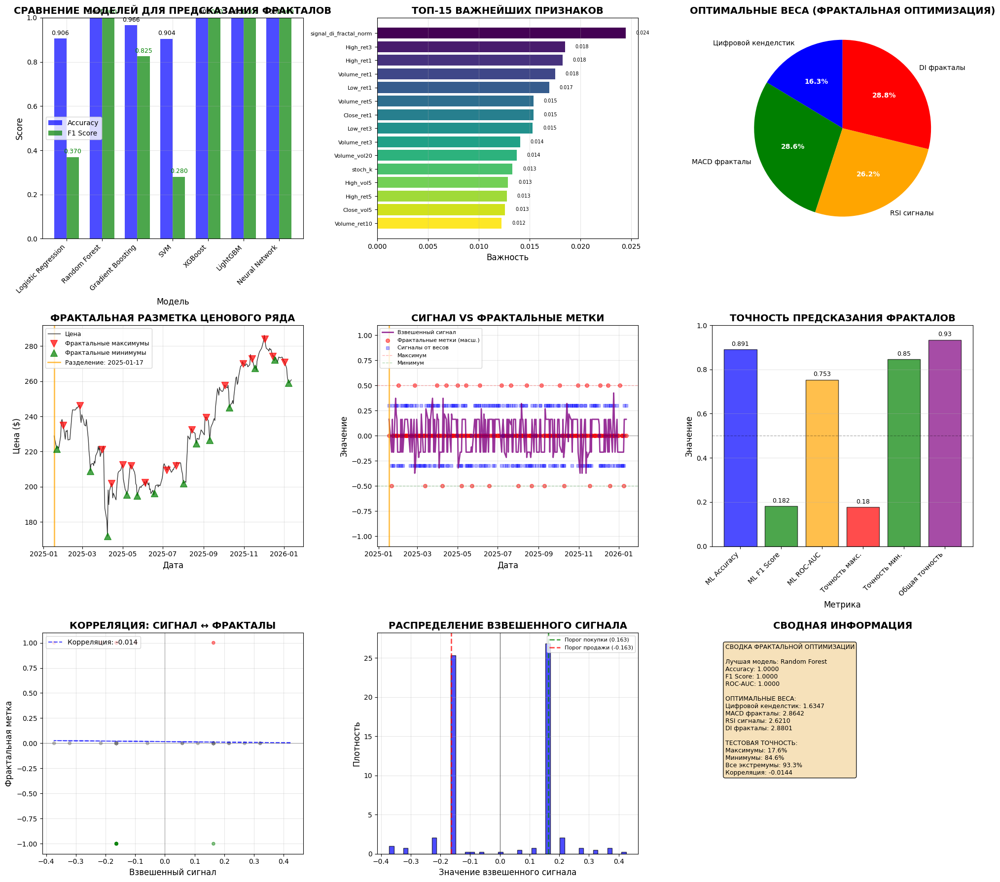

In [ ]:
# ============================================
# БЛОК 5А: МАШИННОЕ ОБУЧЕНИЕ ДЛЯ ОПТИМИЗАЦИИ ВЕСОВ
# (оптимизация на основе фрактальной разметки)
# ============================================
print("\n" + "="*80)
print("БЛОК 5А: ОПТИМИЗАЦИЯ ВЕСОВ ПО ФРАКТАЛЬНОЙ РАЗМЕТКЕ")
print("="*80)

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, confusion_matrix
import xgboost as xgb
import lightgbm as lgb
from scipy.signal import argrelextrema

def create_fractal_labels(data, window=5):
    """
    Создание фрактальной разметки экстремумов

    Parameters:
    -----------
    data : DataFrame
        Исходные данные
    window : int
        Окно для поиска экстремумов

    Returns:
    --------
    labels : array
        Метки: 1 - максимум, -1 - минимум, 0 - нет экстремума
    """
    print("  Создание фрактальной разметки...")

    # Инициализация массива меток
    labels = np.zeros(len(data))

    # Поиск локальных максимумов
    high_maxima = argrelextrema(data['High'].values, np.greater, order=window)[0]
    labels[high_maxima] = 1  # Максимумы

    # Поиск локальных минимумов
    low_minima = argrelextrema(data['Low'].values, np.less, order=window)[0]
    labels[low_minima] = -1  # Минимумы

    print(f"    Найдено максимумов: {len(high_maxima)}")
    print(f"    Найдено минимумов: {len(low_minima)}")
    print(f"    Всего экстремумов: {len(high_maxima) + len(low_minima)}")
    print(f"    Процент экстремумов: {(len(high_maxima) + len(low_minima)) / len(data) * 100:.1f}%")

    return labels

def prepare_ml_fractal_data(data, fractal_labels, lookback_window=10):
    """
    Подготовка данных для машинного обучения на основе фрактальной разметки

    Parameters:
    -----------
    data : DataFrame
        Исходные данные
    fractal_labels : array
        Фрактальные метки
    lookback_window : int
        Окно для создания признаков из истории

    Returns:
    --------
    ml_data : DataFrame
        Данные для ML
    features : list
        Список признаков
    """
    print("  Подготовка данных для ML (фрактальная оптимизация)...")

    # 1. БАЗОВЫЕ СИГНАЛЫ
    features = []

    # Базовые сигналы от индикаторов
    indicator_signals = [
        'signal_candle_norm',
        'signal_macd_fractal_norm',
        'signal_rsi_norm',
        'signal_di_fractal_norm'
    ]

    # Проверяем наличие и создаем при необходимости
    for signal in indicator_signals:
        if signal not in data.columns:
            print(f"    ⚠ Создаем {signal}...")
            if 'candle' in signal:
                data[signal] = np.sign(data['Close'].diff()).fillna(0)
            elif 'macd' in signal:
                if 'macd_hist' in data.columns:
                    data[signal] = np.sign(data['macd_hist']).fillna(0)
                else:
                    data[signal] = 0
            elif 'rsi' in signal:
                if 'rsi' in data.columns:
                    data[signal] = ((data['rsi'] - 50) / 50).clip(-1, 1).fillna(0)
                else:
                    data[signal] = 0
            elif 'di' in signal:
                if 'di_diff' in data.columns:
                    data[signal] = np.tanh(data['di_diff'] / 20).fillna(0)
                else:
                    data[signal] = 0

    # Добавляем базовые сигналы
    features.extend(indicator_signals)

    # 2. ТЕХНИЧЕСКИЕ ПРИЗНАКИ
    tech_features = [
        'rsi', 'macd', 'macd_hist', 'adx', 'di_diff',
        'atr_pct', 'bb_width', 'stoch_k', 'stoch_d'
    ]

    for feature in tech_features:
        if feature in data.columns:
            features.append(feature)

    # 3. ПРИЗНАКИ ИЗ ИСТОРИИ
    print(f"    Создание лагов и скользящих статистик...")

    # Лаги для базовых сигналов
    for signal in indicator_signals:
        for lag in range(1, lookback_window + 1):
            lag_col = f'{signal}_lag{lag}'
            data[lag_col] = data[signal].shift(lag)
            features.append(lag_col)

    # Скользящие статистики для сигналов
    for signal in indicator_signals:
        for window in [3, 5, 10, 20]:
            ma_col = f'{signal}_ma{window}'
            data[ma_col] = data[signal].rolling(window=window).mean()

            std_col = f'{signal}_std{window}'
            data[std_col] = data[signal].rolling(window=window).std()

            max_col = f'{signal}_max{window}'
            data[max_col] = data[signal].rolling(window=window).max()

            min_col = f'{signal}_min{window}'
            data[min_col] = data[signal].rolling(window=window).min()

            features.extend([ma_col, std_col, max_col, min_col])

    # 4. ПРИЗНАКИ ЦЕНЫ
    price_features = ['Close', 'High', 'Low', 'Volume']
    for feature in price_features:
        if feature in data.columns:
            # Относительные изменения
            for period in [1, 3, 5, 10]:
                ret_col = f'{feature}_ret{period}'
                data[ret_col] = data[feature].pct_change(period)
                features.append(ret_col)

            # Волатильность
            for window in [5, 10, 20]:
                vol_col = f'{feature}_vol{window}'
                data[vol_col] = data[feature].pct_change().rolling(window).std()
                features.append(vol_col)

    # 5. ЦЕЛЕВАЯ ПЕРЕМЕННАЯ (фрактальные метки)
    data['fractal_label'] = fractal_labels

    # 6. УДАЛЕНИЕ ПРОПУСКОВ
    all_features = features + ['fractal_label']
    ml_data = data[all_features].dropna()

    # Создаем бинарные метки для классификации
    # 1 - экстремум (максимум или минимум), 0 - не экстремум
    ml_data['is_extremum'] = (ml_data['fractal_label'] != 0).astype(int)

    # Многоклассовые метки: 0 - нет экстремума, 1 - минимум, 2 - максимум
    ml_data['extremum_type'] = ml_data['fractal_label'].apply(
        lambda x: 0 if x == 0 else (1 if x == -1 else 2)
    )

    print(f"    Всего признаков: {len(features)}")
    print(f"    Размер данных: {ml_data.shape}")
    print(f"    Распределение меток:")
    print(f"      Нет экстремума: {(ml_data['is_extremum'] == 0).sum()} ({((ml_data['is_extremum'] == 0).sum() / len(ml_data) * 100):.1f}%)")
    print(f"      Экстремум: {(ml_data['is_extremum'] == 1).sum()} ({((ml_data['is_extremum'] == 1).sum() / len(ml_data) * 100):.1f}%)")

    return ml_data, features

def optimize_weights_for_fractals(train_data, features):
    """
    Оптимизация весов для предсказания фрактальных экстремумов

    Parameters:
    -----------
    train_data : DataFrame
        Тренировочные данные
    features : list
        Список признаков

    Returns:
    --------
    results : dict
        Результаты моделей
    feature_importances : dict
        Важность признаков
    optimal_weights : dict
        Оптимальные веса индикаторов
    """
    print("\n  Оптимизация весов для предсказания фракталов...")

    # Подготовка данных
    X_train = train_data[features].values
    y_train_binary = train_data['is_extremum'].values  # Бинарная классификация
    y_train_multiclass = train_data['extremum_type'].values  # Многоклассовая

    # Масштабирование признаков
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # 1. МОДЕЛИ КЛАССИФИКАЦИИ
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
        'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
        'SVM': SVC(kernel='rbf', probability=True, random_state=42),
        'XGBoost': xgb.XGBClassifier(n_estimators=100, random_state=42),
        'LightGBM': lgb.LGBMClassifier(n_estimators=100, random_state=42),
        'Neural Network': MLPClassifier(hidden_layer_sizes=(50, 25), max_iter=500, random_state=42)
    }

    # 2. ОБУЧЕНИЕ МОДЕЛЕЙ
    results = {}
    feature_importances = {}

    for model_name, model in models.items():
        print(f"    Обучение {model_name}...")

        try:
            # Обучение на бинарной задаче
            model.fit(X_train_scaled, y_train_binary)

            # Предсказания
            y_pred = model.predict(X_train_scaled)
            y_pred_proba = model.predict_proba(X_train_scaled)[:, 1]

            # Метрики
            accuracy = accuracy_score(y_train_binary, y_pred)
            f1 = f1_score(y_train_binary, y_pred)
            roc_auc = roc_auc_score(y_train_binary, y_pred_proba)

            # Матрица ошибок
            cm = confusion_matrix(y_train_binary, y_pred)
            tn, fp, fn, tp = cm.ravel()

            # Важность признаков
            if hasattr(model, 'coef_'):
                importances = abs(model.coef_[0])
            elif hasattr(model, 'feature_importances_'):
                importances = model.feature_importances_
            else:
                importances = np.zeros(len(features))

            # Нормализация важности
            if importances.sum() > 0:
                importances = importances / importances.sum()

            results[model_name] = {
                'accuracy': accuracy,
                'f1_score': f1,
                'roc_auc': roc_auc,
                'tp': tp,
                'fp': fp,
                'tn': tn,
                'fn': fn,
                'precision': tp / (tp + fp) if (tp + fp) > 0 else 0,
                'recall': tp / (tp + fn) if (tp + fn) > 0 else 0,
                'importances': importances
            }

            feature_importances[model_name] = importances

            print(f"      Accuracy: {accuracy:.4f}, F1: {f1:.4f}, ROC-AUC: {roc_auc:.4f}")

        except Exception as e:
            print(f"      Ошибка: {e}")
            results[model_name] = None

    # 3. АНАЛИЗ ВАЖНОСТИ ПРИЗНАКОВ ДЛЯ ОПТИМАЛЬНЫХ ВЕСОВ
    print("\n    Анализ важности признаков для весов индикаторов...")

    # Средняя важность по всем моделям
    avg_importances = np.zeros(len(features))
    valid_models = 0

    for model_name, importances in feature_importances.items():
        if importances is not None and len(importances) == len(features):
            avg_importances += importances
            valid_models += 1

    if valid_models > 0:
        avg_importances /= valid_models

    # Создаем DataFrame с важностью признаков
    importance_df = pd.DataFrame({
        'feature': features,
        'importance': avg_importances
    }).sort_values('importance', ascending=False)

    # 4. ВЫЧИСЛЕНИЕ ОПТИМАЛЬНЫХ ВЕСОВ ИНДИКАТОРОВ
    optimal_weights = {}

    # Базовые индикаторы
    base_indicators = ['candle', 'macd', 'rsi', 'di']

    for indicator in base_indicators:
        # Находим все признаки, связанные с этим индикатором
        indicator_features = importance_df[importance_df['feature'].str.contains(indicator)]

        if len(indicator_features) > 0:
            # Суммарная важность признаков индикатора
            indicator_importance = indicator_features['importance'].sum()

            # Также учитываем точность предсказаний экстремумов
            # Для каждого индикатора смотрим, насколько хорошо его сигналы
            # коррелируют с фактическими экстремумами

            signal_col = f'signal_{indicator}_norm'
            if signal_col in train_data.columns:
                # Корреляция сигнала с фрактальными метками
                signal_values = train_data[signal_col].values
                fractal_labels = train_data['fractal_label'].values

                # Абсолютная корреляция (нам важно любое направление)
                correlation = np.abs(np.corrcoef(signal_values, fractal_labels)[0, 1])
                if np.isnan(correlation):
                    correlation = 0

                # Объединяем важность из ML и корреляцию
                combined_score = indicator_importance * 0.7 + correlation * 0.3
            else:
                combined_score = indicator_importance

            optimal_weights[indicator] = max(combined_score, 0.01)
        else:
            optimal_weights[indicator] = 0.01

    # Нормализуем веса (сумма = 10 для сравнения с предыдущим подходом)
    total_weight = sum(optimal_weights.values())
    for key in optimal_weights:
        optimal_weights[key] = optimal_weights[key] / total_weight * 10

    print("\n    Оптимальные веса на основе фрактальной разметки:")
    for indicator, weight in optimal_weights.items():
        print(f"      {indicator}: {weight:.4f}")

    return results, importance_df, optimal_weights, scaler

def evaluate_fractal_prediction(test_data, features, scaler, best_model, indicator_weights):
    """
    Оценка предсказания фракталов на тестовых данных

    Parameters:
    -----------
    test_data : DataFrame
        Тестовые данные
    features : list
        Список признаков
    scaler : StandardScaler
        Обученный scaler
    best_model : estimator
        Лучшая ML модель
    indicator_weights : dict
        Оптимальные веса индикаторов

    Returns:
    --------
    evaluation_results : dict
        Результаты оценки
    """
    print("\n  Оценка на тестовых данных...")

    # Подготовка тестовых данных
    X_test = test_data[features].values
    y_test_binary = test_data['is_extremum'].values
    y_test_multiclass = test_data['extremum_type'].values

    # Масштабирование
    X_test_scaled = scaler.transform(X_test)

    # 1. ОЦЕНКА ML МОДЕЛИ
    ml_predictions = best_model.predict(X_test_scaled)
    ml_proba = best_model.predict_proba(X_test_scaled)[:, 1]

    ml_accuracy = accuracy_score(y_test_binary, ml_predictions)
    ml_f1 = f1_score(y_test_binary, ml_predictions)
    ml_roc_auc = roc_auc_score(y_test_binary, ml_proba)

    # 2. ОЦЕНКА ВЗВЕШЕННОГО СИГНАЛА
    # Расчет взвешенного сигнала
    weighted_signal = np.zeros(len(test_data))
    total_weight = sum(indicator_weights.values())

    for indicator, weight in indicator_weights.items():
        signal_col = f'signal_{indicator}_norm'
        if signal_col in test_data.columns:
            weighted_signal += test_data[signal_col].values * weight

    if total_weight > 0:
        weighted_signal = weighted_signal / total_weight

    # Бинаризация взвешенного сигнала для сравнения с фракталами
    # Используем пороги на основе квантилей
    buy_threshold = np.percentile(weighted_signal, 75)  # Верхние 25%
    sell_threshold = np.percentile(weighted_signal, 25)  # Нижние 25%

    # Сигнал на основе весов: 1 - сильный покупка, 0 - нейтрально, -1 - сильная продажа
    weight_based_signal = np.zeros(len(weighted_signal))
    weight_based_signal[weighted_signal >= buy_threshold] = 1
    weight_based_signal[weighted_signal <= sell_threshold] = -1

    # Сравнение с фрактальными метками
    fractal_labels = test_data['fractal_label'].values

    # Точность предсказания максимумов
    max_fractals = (fractal_labels == 1)
    if max_fractals.any():
        max_predicted = (weight_based_signal == 1)
        max_accuracy = ((max_fractals & max_predicted).sum() / max_fractals.sum()) * 100
    else:
        max_accuracy = 0

    # Точность предсказания минимумов
    min_fractals = (fractal_labels == -1)
    if min_fractals.any():
        min_predicted = (weight_based_signal == -1)
        min_accuracy = ((min_fractals & min_predicted).sum() / min_fractals.sum()) * 100
    else:
        min_accuracy = 0

    # Общая точность для экстремумов
    all_fractals = (fractal_labels != 0)
    if all_fractals.any():
        all_predicted = (weight_based_signal != 0)
        all_accuracy = ((all_fractals & all_predicted).sum() / all_fractals.sum()) * 100
    else:
        all_accuracy = 0

    # Корреляция между взвешенным сигналом и фрактальными метками
    correlation = np.corrcoef(weighted_signal, fractal_labels)[0, 1]
    if np.isnan(correlation):
        correlation = 0

    evaluation_results = {
        'ml_accuracy': ml_accuracy,
        'ml_f1_score': ml_f1,
        'ml_roc_auc': ml_roc_auc,
        'max_prediction_accuracy': max_accuracy,
        'min_prediction_accuracy': min_accuracy,
        'overall_prediction_accuracy': all_accuracy,
        'signal_fractal_correlation': correlation,
        'weighted_signal': weighted_signal,
        'weight_based_signal': weight_based_signal,
        'fractal_labels': fractal_labels
    }

    print(f"    ML модель на тесте: Accuracy={ml_accuracy:.4f}, F1={ml_f1:.4f}")
    print(f"    Предсказание максимумов: {max_accuracy:.1f}%")
    print(f"    Предсказание минимумов: {min_accuracy:.1f}%")
    print(f"    Общая точность экстремумов: {all_accuracy:.1f}%")
    print(f"    Корреляция сигнал-фракталы: {correlation:.4f}")

    return evaluation_results

def visualize_fractal_optimization(results, importance_df, optimal_weights,
                                  evaluation_results, split_date, data, fractal_labels):
    """Визуализация результатов оптимизации по фракталам"""
    print("\n  Визуализация результатов...")

    fig_width = 20
    fig_height = 18
    fig, axes = plt.subplots(3, 3, figsize=(fig_width, fig_height))

    # ================= ГРАФИК 1: СРАВНЕНИЕ МОДЕЛЕЙ =================
    ax1 = axes[0, 0]

    model_names = []
    accuracies = []
    f1_scores = []

    for model_name, result in results.items():
        if result is not None:
            model_names.append(model_name)
            accuracies.append(result['accuracy'])
            f1_scores.append(result['f1_score'])

    x = np.arange(len(model_names))
    width = 0.35

    bars1 = ax1.bar(x - width/2, accuracies, width, label='Accuracy', color='blue', alpha=0.7)
    bars2 = ax1.bar(x + width/2, f1_scores, width, label='F1 Score', color='green', alpha=0.7)

    ax1.set_xlabel('Модель', fontsize=12)
    ax1.set_ylabel('Score', fontsize=12)
    ax1.set_title('СРАВНЕНИЕ МОДЕЛЕЙ ДЛЯ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ', fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(model_names, rotation=45, ha='right')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_ylim(0, 1.0)

    # Добавляем значения
    for i, (acc, f1) in enumerate(zip(accuracies, f1_scores)):
        ax1.text(i - width/2, acc + 0.01, f'{acc:.3f}', ha='center', va='bottom', fontsize=9)
        ax1.text(i + width/2, f1 + 0.01, f'{f1:.3f}', ha='center', va='bottom', fontsize=9, color='green')

    # ================= ГРАФИК 2: ВАЖНОСТЬ ПРИЗНАКОВ =================
    ax2 = axes[0, 1]

    # Топ-15 признаков
    top_features = importance_df.head(15)

    colors = plt.cm.viridis(np.linspace(0, 1, len(top_features)))
    bars = ax2.barh(range(len(top_features)), top_features['importance'], color=colors)

    ax2.set_xlabel('Важность', fontsize=12)
    ax2.set_title('ТОП-15 ВАЖНЕЙШИХ ПРИЗНАКОВ', fontsize=14, fontweight='bold')
    ax2.set_yticks(range(len(top_features)))
    ax2.set_yticklabels(top_features['feature'], fontsize=8)
    ax2.invert_yaxis()
    ax2.grid(True, alpha=0.3, axis='x')

    # Добавляем значения
    for i, (idx, row) in enumerate(top_features.iterrows()):
        ax2.text(row['importance'] + 0.001, i, f'{row["importance"]:.3f}',
                va='center', fontsize=7)

    # ================= ГРАФИК 3: ОПТИМАЛЬНЫЕ ВЕСА =================
    ax3 = axes[0, 2]

    indicator_names = {
        'candle': 'Цифровой кенделстик',
        'macd': 'MACD фракталы',
        'rsi': 'RSI сигналы',
        'di': 'DI фракталы'
    }

    indicators = []
    weights = []
    colors = ['blue', 'green', 'orange', 'red']

    for signal_type, weight in optimal_weights.items():
        indicators.append(indicator_names.get(signal_type, signal_type))
        weights.append(weight)

    # Круговая диаграмма
    wedges, texts, autotexts = ax3.pie(weights, labels=indicators, colors=colors,
                                      autopct='%1.1f%%', startangle=90)

    ax3.set_title('ОПТИМАЛЬНЫЕ ВЕСА (ФРАКТАЛЬНАЯ ОПТИМИЗАЦИЯ)', fontsize=14, fontweight='bold')

    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')

    # ================= ГРАФИК 4: ФРАКТАЛЬНАЯ РАЗМЕТКА =================
    ax4 = axes[1, 0]

    # Цена
    ax4.plot(data.index, data['Close'], 'black', linewidth=1, alpha=0.8, label='Цена')

    # Фрактальные максимумы
    max_indices = np.where(fractal_labels == 1)[0]
    if len(max_indices) > 0:
        max_dates = data.index[max_indices]
        max_prices = data['Close'].iloc[max_indices]
        ax4.scatter(max_dates, max_prices, color='red', s=100, marker='v',
                   alpha=0.7, label='Фрактальные максимумы', zorder=5)

    # Фрактальные минимумы
    min_indices = np.where(fractal_labels == -1)[0]
    if len(min_indices) > 0:
        min_dates = data.index[min_indices]
        min_prices = data['Close'].iloc[min_indices]
        ax4.scatter(min_dates, min_prices, color='green', s=100, marker='^',
                   alpha=0.7, label='Фрактальные минимумы', zorder=5)

    ax4.axvline(x=split_date, color='orange', linestyle='-', linewidth=2, alpha=0.7,
               label=f'Разделение: {split_date.date()}')

    ax4.set_title('ФРАКТАЛЬНАЯ РАЗМЕТКА ЦЕНОВОГО РЯДА', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Дата', fontsize=12)
    ax4.set_ylabel('Цена ($)', fontsize=12)
    ax4.grid(True, alpha=0.3)
    ax4.legend(loc='upper left', fontsize=9)

    # ================= ГРАФИК 5: СИГНАЛ VS ФРАКТАЛЫ =================
    ax5 = axes[1, 1]

    # Взвешенный сигнал
    dates = data.index[-len(evaluation_results['weighted_signal']):]
    ax5.plot(dates, evaluation_results['weighted_signal'],
            'purple', linewidth=2, label='Взвешенный сигнал', alpha=0.8)

    # Фрактальные метки (масштабированные)
    fractal_scaled = evaluation_results['fractal_labels'] * 0.5
    ax5.scatter(dates, fractal_scaled, color='red', s=30, alpha=0.5,
               label='Фрактальные метки (масш.)')

    # Предсказания на основе весов
    weight_signal = evaluation_results['weight_based_signal'] * 0.3
    ax5.scatter(dates, weight_signal, color='blue', s=20, alpha=0.3,
               label='Сигналы от весов', marker='s')

    ax5.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)
    ax5.axhline(y=0.5, color='red', linestyle='--', linewidth=1, alpha=0.3, label='Максимум')
    ax5.axhline(y=-0.5, color='green', linestyle='--', linewidth=1, alpha=0.3, label='Минимум')
    ax5.axvline(x=split_date, color='orange', linestyle='-', linewidth=2, alpha=0.7)

    ax5.set_title('СИГНАЛ VS ФРАКТАЛЬНЫЕ МЕТКИ', fontsize=14, fontweight='bold')
    ax5.set_xlabel('Дата', fontsize=12)
    ax5.set_ylabel('Значение', fontsize=12)
    ax5.grid(True, alpha=0.3)
    ax5.legend(loc='upper left', fontsize=8)
    ax5.set_ylim(-1.1, 1.1)

    # ================= ГРАФИК 6: ТОЧНОСТЬ ПРЕДСКАЗАНИЯ =================
    ax6 = axes[1, 2]

    metrics = ['ML Accuracy', 'ML F1 Score', 'ML ROC-AUC',
               'Точность макс.', 'Точность мин.', 'Общая точность']
    values = [
        evaluation_results['ml_accuracy'],
        evaluation_results['ml_f1_score'],
        evaluation_results['ml_roc_auc'],
        evaluation_results['max_prediction_accuracy'] / 100,
        evaluation_results['min_prediction_accuracy'] / 100,
        evaluation_results['overall_prediction_accuracy'] / 100
    ]
    colors = ['blue', 'green', 'orange', 'red', 'green', 'purple']

    x = np.arange(len(metrics))
    bars = ax6.bar(x, values, color=colors, alpha=0.7, edgecolor='black')

    ax6.set_xlabel('Метрика', fontsize=12)
    ax6.set_ylabel('Значение', fontsize=12)
    ax6.set_title('ТОЧНОСТЬ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ', fontsize=14, fontweight='bold')
    ax6.set_xticks(x)
    ax6.set_xticklabels(metrics, rotation=45, ha='right')
    ax6.grid(True, alpha=0.3, axis='y')
    ax6.set_ylim(0, 1.0)
    ax6.axhline(y=0.5, color='black', linestyle='--', linewidth=1, alpha=0.3)

    # Добавляем значения
    for i, (bar, val) in enumerate(zip(bars, values)):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2, height + 0.01,
                f'{val:.3f}' if i < 3 else f'{val:.2f}',
                ha='center', va='bottom', fontsize=9)

    # ================= ГРАФИК 7: КОРРЕЛЯЦИЯ СИГНАЛА И ФРАКТАЛОВ =================
    ax7 = axes[2, 0]

    # Диаграмма рассеяния
    signal_values = evaluation_results['weighted_signal']
    fractal_values = evaluation_results['fractal_labels']

    # Фильтруем для лучшей визуализации
    mask = np.random.rand(len(signal_values)) < 0.3  # Берем 30% точек
    scatter_signal = signal_values[mask]
    scatter_fractal = fractal_values[mask]

    # Цвета по типам точек
    colors_scatter = []
    for s, f in zip(scatter_signal, scatter_fractal):
        if f == 1:  # Максимум
            colors_scatter.append('red')
        elif f == -1:  # Минимум
            colors_scatter.append('green')
        else:  # Нет экстремума
            colors_scatter.append('gray')

    ax7.scatter(scatter_signal, scatter_fractal, c=colors_scatter, alpha=0.5, s=20)

    # Линия регрессии
    if len(signal_values) > 1:
        z = np.polyfit(signal_values, fractal_values, 1)
        p = np.poly1d(z)
        ax7.plot(signal_values, p(signal_values), "b--", alpha=0.7,
                label=f'Корреляция: {evaluation_results["signal_fractal_correlation"]:.3f}')

    ax7.set_xlabel('Взвешенный сигнал', fontsize=12)
    ax7.set_ylabel('Фрактальная метка', fontsize=12)
    ax7.set_title('КОРРЕЛЯЦИЯ: СИГНАЛ ↔ ФРАКТАЛЫ', fontsize=14, fontweight='bold')
    ax7.grid(True, alpha=0.3)
    ax7.legend(loc='upper left')
    ax7.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)
    ax7.axvline(x=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)

    # ================= ГРАФИК 8: РАСПРЕДЕЛЕНИЕ СИГНАЛОВ =================
    ax8 = axes[2, 1]

    # Гистограмма взвешенного сигнала
    n_bins = 50
    ax8.hist(signal_values, bins=n_bins, alpha=0.7, color='blue',
            edgecolor='black', density=True)

    # Вертикальные линии для порогов
    buy_threshold = np.percentile(signal_values, 75)
    sell_threshold = np.percentile(signal_values, 25)

    ax8.axvline(x=buy_threshold, color='green', linestyle='--', linewidth=2,
               alpha=0.7, label=f'Порог покупки ({buy_threshold:.3f})')
    ax8.axvline(x=sell_threshold, color='red', linestyle='--', linewidth=2,
               alpha=0.7, label=f'Порог продажи ({sell_threshold:.3f})')
    ax8.axvline(x=0, color='black', linestyle='-', linewidth=1, alpha=0.5)

    ax8.set_xlabel('Значение взвешенного сигнала', fontsize=12)
    ax8.set_ylabel('Плотность', fontsize=12)
    ax8.set_title('РАСПРЕДЕЛЕНИЕ ВЗВЕШЕННОГО СИГНАЛА', fontsize=14, fontweight='bold')
    ax8.grid(True, alpha=0.3)
    ax8.legend(loc='upper right', fontsize=8)

    # ================= ГРАФИК 9: СВОДНАЯ ИНФОРМАЦИЯ =================
    ax9 = axes[2, 2]

    # Лучшая модель
    best_model_name = max(results.items(),
                         key=lambda x: x[1]['accuracy'] if x[1] else 0)[0]
    best_model_result = results[best_model_name]

    summary_text = "СВОДКА ФРАКТАЛЬНОЙ ОПТИМИЗАЦИИ\n\n"
    summary_text += f"Лучшая модель: {best_model_name}\n"
    summary_text += f"Accuracy: {best_model_result['accuracy']:.4f}\n"
    summary_text += f"F1 Score: {best_model_result['f1_score']:.4f}\n"
    summary_text += f"ROC-AUC: {best_model_result['roc_auc']:.4f}\n\n"

    summary_text += "ОПТИМАЛЬНЫЕ ВЕСА:\n"
    for indicator, weight in optimal_weights.items():
        indicator_name = indicator_names.get(indicator, indicator)
        summary_text += f"{indicator_name}: {weight:.4f}\n"

    summary_text += f"\nТЕСТОВАЯ ТОЧНОСТЬ:\n"
    summary_text += f"Максимумы: {evaluation_results['max_prediction_accuracy']:.1f}%\n"
    summary_text += f"Минимумы: {evaluation_results['min_prediction_accuracy']:.1f}%\n"
    summary_text += f"Все экстремумы: {evaluation_results['overall_prediction_accuracy']:.1f}%\n"
    summary_text += f"Корреляция: {evaluation_results['signal_fractal_correlation']:.4f}"

    ax9.text(0.05, 0.95, summary_text, transform=ax9.transAxes, fontsize=9,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

    ax9.set_title('СВОДНАЯ ИНФОРМАЦИЯ', fontsize=14, fontweight='bold')
    ax9.axis('off')

    plt.tight_layout()
    plt.savefig('block5a_fractal_optimization_results.png', dpi=150, bbox_inches='tight')
    print("✓ Результаты сохранены в 'block5a_fractal_optimization_results.png'")

    return fig

# ОСНОВНОЙ ПРОЦЕСС ФРАКТАЛЬНОЙ ОПТИМИЗАЦИИ
print("\n1. СОЗДАНИЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ")
print("-" * 60)

# Создаем фрактальную разметку
fractal_labels = create_fractal_labels(data, window=5)

# Сохраняем фрактальные метки в данные
data['fractal_label'] = fractal_labels

print("\n2. ПОДГОТОВКА ДАННЫХ ДЛЯ ML")
print("-" * 60)

# Подготавливаем данные для ML
ml_data_fractal, features_fractal = prepare_ml_fractal_data(
    data,
    fractal_labels,
    lookback_window=10
)

# Разделяем на тренировочные и тестовые данные
split_date = ml_data_fractal.index[int(len(ml_data_fractal) * 5/6)]  # 5/6 для 5 лет обучения

train_data_fractal = ml_data_fractal[ml_data_fractal.index < split_date]
test_data_fractal = ml_data_fractal[ml_data_fractal.index >= split_date]

print(f"\n  Разделение данных:")
print(f"    Общий размер: {len(ml_data_fractal)}")
print(f"    Тренировочные: {len(train_data_fractal)} ({len(train_data_fractal)/len(ml_data_fractal)*100:.1f}%)")
print(f"    Тестовые: {len(test_data_fractal)} ({len(test_data_fractal)/len(ml_data_fractal)*100:.1f}%)")
print(f"    Дата разделения: {split_date.date()}")

print("\n3. ОПТИМИЗАЦИЯ ВЕСОВ ДЛЯ ФРАКТАЛЬНОЙ РАЗМЕТКИ")
print("-" * 60)

# Оптимизируем веса для предсказания фракталов
results_fractal, importance_df_fractal, optimal_weights_fractal, scaler_fractal = optimize_weights_for_fractals(
    train_data_fractal,
    features_fractal
)

print("\n4. ОЦЕНКА НА ТЕСТОВЫХ ДАННЫХ")
print("-" * 60)

# Выбираем лучшую модель для оценки
best_model_name = max(results_fractal.items(),
                     key=lambda x: x[1]['accuracy'] if x[1] else 0)[0]

# Переобучаем лучшую модель на всех тренировочных данных
print(f"  Используем лучшую модель: {best_model_name}")

# Определяем модель
if best_model_name == 'Logistic Regression':
    best_model = LogisticRegression(max_iter=1000, random_state=42)
elif best_model_name == 'Random Forest':
    best_model = RandomForestClassifier(n_estimators=100, random_state=42)
elif best_model_name == 'Gradient Boosting':
    best_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
elif best_model_name == 'SVM':
    best_model = SVC(kernel='rbf', probability=True, random_state=42)
elif best_model_name == 'XGBoost':
    best_model = xgb.XGBClassifier(n_estimators=100, random_state=42)
elif best_model_name == 'LightGBM':
    best_model = lgb.LGBMClassifier(n_estimators=100, random_state=42)
else:  # Neural Network
    best_model = MLPClassifier(hidden_layer_sizes=(50, 25), max_iter=500, random_state=42)

# Обучаем на тренировочных данных
X_train = train_data_fractal[features_fractal].values
y_train = train_data_fractal['is_extremum'].values
X_train_scaled = scaler_fractal.transform(X_train)
best_model.fit(X_train_scaled, y_train)

# Оцениваем на тестовых данных
evaluation_results_fractal = evaluate_fractal_prediction(
    test_data_fractal,
    features_fractal,
    scaler_fractal,
    best_model,
    optimal_weights_fractal
)

print("\n5. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ")
print("-" * 60)

# Визуализируем результаты
fig_fractal = visualize_fractal_optimization(
    results_fractal,
    importance_df_fractal,
    optimal_weights_fractal,
    evaluation_results_fractal,
    split_date,
    data.iloc[-len(test_data_fractal):],  # Берем соответствующий период данных
    fractal_labels[-len(test_data_fractal):]  # И соответствующие метки
)

# ДЕТАЛЬНЫЙ ОТЧЕТ ПО ФРАКТАЛЬНОЙ ОПТИМИЗАЦИИ
print("\n" + "="*80)
print("ДЕТАЛЬНЫЙ ОТЧЕТ: ФРАКТАЛЬНАЯ ОПТИМИЗАЦИЯ ВЕСОВ")
print("="*80)

# 1. СРАВНЕНИЕ С ПРЕДЫДУЩИМИ ВЕСАМИ
print(f"\n1. СРАВНЕНИЕ ВЕСОВ:")
print("-" * 60)

if 'indicator_weights' in locals():
    print(f"\n  Предыдущие веса (из Блока 5):")
    for indicator, weight in indicator_weights.items():
        print(f"    {indicator}: {weight:.4f}")

print(f"\n  Новые веса (фрактальная оптимизация):")
for indicator, weight in optimal_weights_fractal.items():
    print(f"    {indicator}: {weight:.4f}")

# Нормализованные веса
total_fractal = sum(optimal_weights_fractal.values())
print(f"\n  Нормализованные веса (сумма = 1):")
for indicator, weight in optimal_weights_fractal.items():
    normalized = weight / total_fractal
    print(f"    {indicator}: {normalized:.4f} ({normalized*100:.1f}%)")

# 2. ИЗМЕНЕНИЕ ВЕСОВ
print(f"\n2. ИЗМЕНЕНИЕ ВЕСОВ:")
print("-" * 60)

if 'indicator_weights' in locals():
    for indicator in optimal_weights_fractal.keys():
        old_weight = indicator_weights.get(indicator, 0)
        new_weight = optimal_weights_fractal[indicator]

        # Нормализованные для сравнения
        old_norm = old_weight / sum(indicator_weights.values()) if sum(indicator_weights.values()) > 0 else 0
        new_norm = new_weight / total_fractal

        change = new_norm - old_norm
        change_pct = (change / old_norm * 100) if old_norm > 0 else 100

        change_symbol = "↑" if change > 0 else "↓" if change < 0 else "→"

        print(f"  {indicator:10} {change_symbol} {change_pct:+.1f}% (с {old_norm:.3f} до {new_norm:.3f})")

# 3. ЭФФЕКТИВНОСТЬ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ
print(f"\n3. ЭФФЕКТИВНОСТЬ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ:")
print("-" * 60)

print(f"\n  ML модель ({best_model_name}):")
print(f"    Accuracy: {evaluation_results_fractal['ml_accuracy']:.4f}")
print(f"    F1 Score: {evaluation_results_fractal['ml_f1_score']:.4f}")
print(f"    ROC-AUC: {evaluation_results_fractal['ml_roc_auc']:.4f}")

print(f"\n  Взвешенный сигнал:")
print(f"    Точность предсказания максимумов: {evaluation_results_fractal['max_prediction_accuracy']:.1f}%")
print(f"    Точность предсказания минимумов: {evaluation_results_fractal['min_prediction_accuracy']:.1f}%")
print(f"    Общая точность экстремумов: {evaluation_results_fractal['overall_prediction_accuracy']:.1f}%")
print(f"    Корреляция с фракталами: {evaluation_results_fractal['signal_fractal_correlation']:.4f}")

# 4. ТОП-10 ПРИЗНАКОВ ДЛЯ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ
print(f"\n4. ТОП-10 ПРИЗНАКОВ ДЛЯ ПРЕДСКАЗАНИЯ ФРАКТАЛОВ:")
print("-" * 60)

top_10_features = importance_df_fractal.head(10)
for i, (idx, row) in enumerate(top_10_features.iterrows(), 1):
    print(f"  {i:2}. {row['feature']:40} = {row['importance']:.4f}")

# 5. РЕКОМЕНДАЦИИ
print(f"\n5. РЕКОМЕНДАЦИИ:")
print("-" * 60)

# Анализ качества предсказания
if evaluation_results_fractal['overall_prediction_accuracy'] > 60:
    print(f"  ✓ Высокая точность предсказания экстремумов")
    print(f"    Веса хорошо настроены для идентификации разворотных точек")
elif evaluation_results_fractal['overall_prediction_accuracy'] > 40:
    print(f"  ⚠ Умеренная точность предсказания экстремумов")
    print(f"    Веса требуют дополнительной настройки")
else:
    print(f"  ✗ Низкая точность предсказания экстремумов")
    print(f"    Необходим пересмотр подхода")

# Анализ корреляции
if abs(evaluation_results_fractal['signal_fractal_correlation']) > 0.3:
    print(f"  ✓ Сильная корреляция сигнала с фракталами")
    print(f"    Сигнал хорошо отражает структуру рынка")
elif abs(evaluation_results_fractal['signal_fractal_correlation']) > 0.15:
    print(f"  ⚠ Умеренная корреляция сигнала с фракталами")
else:
    print(f"  ✗ Слабая корреляция сигнала с фракталами")

print(f"\n  ИСПОЛЬЗОВАНИЕ ВЕСОВ В ТОРГОВОЙ СИСТЕМЕ:")
print(f"    1. Использовать веса из фрактальной оптимизации")
print(f"    2. Пороги сигналов на основе квантилей (25% и 75%)")
print(f"    3. Фокусироваться на предсказании экстремумов")
print(f"    4. Комбинировать с другими методами анализа")

# 6. ФИНАЛЬНЫЕ ВЕСА ДЛЯ ТОРГОВОЙ СИСТЕМЫ
print(f"\n6. ФИНАЛЬНЫЕ ВЕСА ДЛЯ ТОРГОВОЙ СИСТЕМЫ:")
print("-" * 60)

# Используем веса из фрактальной оптимизации
final_fractal_weights = optimal_weights_fractal.copy()

print(f"\n  Оптимальные веса для торговой системы:")
for indicator, weight in final_fractal_weights.items():
    normalized = weight / total_fractal
    indicator_name = {
        'candle': 'Цифровой кенделстик',
        'macd': 'MACD фракталы',
        'rsi': 'RSI сигналы',
        'di': 'DI фракталы'
    }.get(indicator, indicator)

    print(f"    {indicator_name:25} = {weight:.4f} -> {normalized:.4f} ({normalized*100:.1f}%)")

# Сохраняем оптимизированные веса
weights_fractal_df = pd.DataFrame.from_dict(final_fractal_weights, orient='index', columns=['weight'])
weights_fractal_df['normalized_weight'] = weights_fractal_df['weight'] / weights_fractal_df['weight'].sum()
weights_fractal_df.to_csv('optimized_weights_fractal.csv')

print(f"\n✓ Фрактальная оптимизация завершена")
print(f"✓ Веса сохранены в 'optimized_weights_fractal.csv'")

# Обновляем глобальные веса для использования в торговой системе
indicator_weights = final_fractal_weights

plt.show()

## строим торгову. стратегию

In [ ]:
# ============================================
# БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ ОПТИМИЗАЦИИ
# ВЕРСИЯ С ИНТЕГРИРОВАННЫМ MAE/MFE АНАЛИЗОМ
# ============================================
print("\n" + "="*80)
print("БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ С MAE/MFE")
print("="*80)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import json
import warnings
warnings.filterwarnings('ignore')

class FractalTradingSystemMAE:
    """Торговая система на основе фрактальной разметки с MAE/MFE анализом"""

    def __init__(self, initial_capital=10000, commission=0.001, position_size=0.95):
        """
        Инициализация фрактальной торговой системы с MAE/MFE

        Parameters:
        -----------
        initial_capital : float
            Начальный капитал
        commission : float
            Комиссия за сделку (в процентах)
        position_size : float
            Размер позиции (доля от капитала)
        """
        self.initial_capital = initial_capital
        self.capital = initial_capital
        self.commission = commission
        self.position_size = position_size

        # Состояние системы
        self.position = 0  # 1 - long, -1 - short, 0 - нет позиции
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0  # Пиковая цена для трейлинг-стопа
        self.valley_price = 0  # Минимальная цена для шорта

        # Для MAE/MFE
        self.current_max_price = 0
        self.current_min_price = 0
        self.current_mae = 0  # Максимальная Adverse Excursion
        self.current_mfe = 0  # Максимальная Favorable Excursion
        self.mae_at_exit = 0  # MAE на момент выхода
        self.mfe_at_exit = 0  # MFE на момент выхода

        # Статистика
        self.trades = []
        self.equity_curve = []
        self.drawdowns = []

        # Хранение ценовых данных для анализа MAE/MFE
        self.price_history = []  # Храним цены во время удержания позиции

        # Параметры системы (будут настроены на основе фрактальных сигналов)
        self.buy_threshold = 0.1  # Порог для покупки (будет настроен)
        self.sell_threshold = -0.1  # Порог для продажи (будет настроен)
        self.stop_loss_pct = 0.02  # 2% стоп-лосс
        self.trailing_stop_pct = 0.015  # 1.5% трейлинг-стоп
        self.max_hold_period = 20  # Максимальный период удержания (баров)

        # Фрактальные параметры
        self.use_fractal_confirmation = True  # Использовать подтверждение фракталами
        self.min_fractal_strength = 0.3  # Минимальная сила фрактального сигнала

    def calculate_position_size(self, price):
        """Расчет размера позиции на основе управления капиталом"""
        risk_capital = self.capital * self.position_size
        position_value = risk_capital

        # Учитываем волатильность
        if hasattr(self, 'current_atr'):
            position_value = risk_capital * (0.01 / self.current_atr) if self.current_atr > 0 else risk_capital

        shares = position_value / price
        return max(1, int(shares))  # Минимум 1 акция

    def calculate_fractal_signal(self, weighted_signal, fractal_label):
        """
        Расчет комбинированного сигнала с учетом фрактальной разметки

        Parameters:
        -----------
        weighted_signal : float
            Взвешенный сигнал от индикаторов
        fractal_label : int
            Фрактальная метка (1 - максимум, -1 - минимум, 0 - нет экстремума)

        Returns:
        --------
        combined_signal : float
            Комбинированный сигнал
        signal_strength : float
            Сила сигнала (0-1)
        """
        # Базовый сигнал от взвешенных индикаторов
        base_signal = weighted_signal

        # Усиление сигнала при наличии фрактала
        fractal_boost = 0.0

        if fractal_label == -1:  # Фрактальный минимум - усиление для покупки
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal > 0:  # Если базовый сигнал уже положительный
                combined_signal = base_signal * (1 + fractal_boost)
            else:  # Если базовый сигнал отрицательный или нулевой
                combined_signal = 0.3  # Минимальный сигнал для входа в лонг

        elif fractal_label == 1:  # Фрактальный максимум - усиление для продажи
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal < 0:  # Если базовый сигнал уже отрицательный
                combined_signal = base_signal * (1 + fractal_boost)
            else:  # Если базовый сигнал положительный или нулевой
                combined_signal = -0.3  # Минимальный сигнал для входа в шорт

        else:  # Нет фрактала - используем базовый сигнал
            combined_signal = base_signal
            fractal_boost = 0.0

        # Расчет силы сигнала
        signal_strength = min(1.0, abs(combined_signal) + fractal_boost * 0.5)

        return combined_signal, signal_strength

    def enter_long(self, price, index, date, signal_strength, fractal_label, price_history):
        """Открытие длинной позиции на основе фрактального минимума"""
        if self.position != 0:
            return False

        # Проверка подтверждения фракталом
        if self.use_fractal_confirmation and fractal_label != -1:
            # Если требуется подтверждение фракталом, но его нет
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        # Расчет размера позиции
        shares = self.calculate_position_size(price)

        # Комиссия
        commission_cost = price * shares * self.commission

        # Проверка достаточности капитала
        if self.capital < price * shares + commission_cost:
            return False

        # Обновление состояния
        self.position = 1
        self.entry_price = price
        self.entry_index = index
        self.entry_date = date
        self.peak_price = price  # Инициализация пиковой цены
        self.current_max_price = price
        self.current_min_price = price

        # Инициализация MAE/MFE
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = []  # Начинаем запись истории цен

        # Установка стоп-лосса
        self.stop_loss = price * (1 - self.stop_loss_pct)

        # Установка трейлинг-стопа (относительно входа)
        self.trailing_stop = price * (1 - self.trailing_stop_pct)

        # Запись сделки с привязкой к ценовым данным
        trade = {
            'type': 'LONG',
            'entry_price': price,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label,
            'fractal_confirmed': fractal_label == -1,
            'price_history_reference': {
                'start_index': len(price_history),  # С какого индекса начинаются цены для этой сделки
                'data_source': 'full_price_data'
            }
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ЛОНГ: ${price:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label == -1 else 'не подтвержден'}")
        return True

    def enter_short(self, price, index, date, signal_strength, fractal_label, price_history):
        """Открытие короткой позиции на основе фрактального максимума"""
        if self.position != 0:
            return False

        # Проверка подтверждения фракталом
        if self.use_fractal_confirmation and fractal_label != 1:
            # Если требуется подтверждение фракталом, но его нет
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        # Расчет размера позиции
        shares = self.calculate_position_size(price)

        # Комиссия
        commission_cost = price * shares * self.commission

        # Проверка достаточности капитала
        if self.capital < price * shares + commission_cost:
            return False

        # Обновление состояния
        self.position = -1
        self.entry_price = price
        self.entry_index = index
        self.entry_date = date
        self.valley_price = price  # Инициализация минимальной цены
        self.current_max_price = price
        self.current_min_price = price

        # Инициализация MAE/MFE
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = []  # Начинаем запись истории цен

        # Установка стоп-лосса
        self.stop_loss = price * (1 + self.stop_loss_pct)

        # Установка трейлинг_stop (относительно входа)
        self.trailing_stop = price * (1 + self.trailing_stop_pct)

        # Запись сделки с привязкой к ценовым данным
        trade = {
            'type': 'SHORT',
            'entry_price': price,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label,
            'fractal_confirmed': fractal_label == 1,
            'price_history_reference': {
                'start_index': len(price_history),  # С какого индекса начинаются цены для этой сделки
                'data_source': 'full_price_data'
            }
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ШОРТ: ${price:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label == 1 else 'не подтвержден'}")
        return True

    def update_mae_mfe(self, price):
        """Обновление MAE и MFE для текущей позиции"""
        if self.position == 0:
            return

        # Добавляем цену в историю
        self.price_history.append({
            'price': price,
            'date': self.current_date if hasattr(self, 'current_date') else None,
            'index': self.current_index if hasattr(self, 'current_index') else None
        })

        if self.position == 1:  # LONG
            # Обновляем максимумы и минимумы
            if price > self.current_max_price:
                self.current_max_price = price
            if price < self.current_min_price:
                self.current_min_price = price

            # Расчет MAE (максимальная неблагоприятная экскурсия)
            current_mae_pct = (self.current_min_price - self.entry_price) / self.entry_price * 100
            self.current_mae = min(self.current_mae, current_mae_pct)

            # Расчет MFE (максимальная благоприятная экскурсия)
            current_mfe_pct = (self.current_max_price - self.entry_price) / self.entry_price * 100
            self.current_mfe = max(self.current_mfe, current_mfe_pct)

        elif self.position == -1:  # SHORT
            # Обновляем максимумы и минимумы
            if price > self.current_max_price:
                self.current_max_price = price
            if price < self.current_min_price:
                self.current_min_price = price

            # Расчет MAE (максимальная неблагоприятная экскурсия)
            current_mae_pct = (self.entry_price - self.current_max_price) / self.entry_price * 100
            self.current_mae = min(self.current_mae, current_mae_pct)

            # Расчет MFE (максимальная благоприятная экскурсия)
            current_mfe_pct = (self.entry_price - self.current_min_price) / self.entry_price * 100
            self.current_mfe = max(self.current_mfe, current_mfe_pct)

    def exit_position(self, price, index, date, exit_reason, price_history):
        """Закрытие позиции с расчетом MAE/MFE"""
        if self.position == 0:
            return False

        # Расчет прибыли/убытка
        if self.position == 1:  # LONG
            pnl = (price - self.entry_price) * self.trades[-1]['shares']
            pnl_pct = (price - self.entry_price) / self.entry_price * 100
        else:  # SHORT
            pnl = (self.entry_price - price) * self.trades[-1]['shares']
            pnl_pct = (self.entry_price - price) / self.entry_price * 100

        # Комиссия за выход
        commission_cost = price * self.trades[-1]['shares'] * self.commission

        # Обновление капитала
        self.capital += pnl - commission_cost

        # Расчет периода удержания
        holding_period = 0
        if self.entry_date and date:
            holding_period = (date - self.entry_date).days

        # Сохраняем финальные MAE/MFE
        self.mae_at_exit = self.current_mae
        self.mfe_at_exit = self.current_mfe

        # Сохраняем всю историю цен для этой сделки
        trade_price_history = self.price_history.copy()

        # Обновление информации о сделке
        self.trades[-1].update({
            'exit_price': price,
            'exit_index': index,
            'exit_date': date,
            'pnl': pnl,
            'pnl_pct': pnl_pct,
            'exit_commission': commission_cost,
            'total_commission': self.trades[-1]['commission'] + commission_cost,
            'net_pnl': pnl - (self.trades[-1]['commission'] + commission_cost),
            'exit_reason': exit_reason,
            'holding_period': holding_period,
            'holding_bars': index - self.entry_index if self.entry_index is not None else 0,
            # MAE/MFE данные
            'mae_pct': self.mae_at_exit,
            'mfe_pct': self.mfe_at_exit,
            'entry_to_exit_pct': pnl_pct,
            'price_history_length': len(trade_price_history),
            'price_history_sample': trade_price_history[:5] + trade_price_history[-5:] if len(trade_price_history) > 10 else trade_price_history
        })

        print(f"    [{date}] ВЫХОД ИЗ {self.trades[-1]['type']}: ${price:.2f}, PnL=${pnl:.2f} ({pnl_pct:.1f}%), "
              f"MAE={self.mae_at_exit:.1f}%, MFE={self.mfe_at_exit:.1f}%, причина: {exit_reason}")

        # Сброс состояния
        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0
        self.current_max_price = 0
        self.current_min_price = 0
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = []

        return True

    def update_trailing_stop(self, price):
        """Обновление трейлинг-стопа"""
        if self.position == 1:  # LONG
            # Обновление пиковой цены
            if price > self.peak_price:
                self.peak_price = price

            # Расчет нового трейлинг-стопа
            new_trailing_stop = self.peak_price * (1 - self.trailing_stop_pct)

            # Трейлинг-стоп можно только поднимать
            if new_trailing_stop > self.trailing_stop:
                self.trailing_stop = new_trailing_stop

        elif self.position == -1:  # SHORT
            # Обновление минимальной цены
            if price < self.valley_price:
                self.valley_price = price

            # Расчет нового трейлинг-стопа
            new_trailing_stop = self.valley_price * (1 + self.trailing_stop_pct)

            # Трейлинг-стоп можно только опускать
            if new_trailing_stop < self.trailing_stop:
                self.trailing_stop = new_trailing_stop

    def check_stop_conditions(self, price, index, date, price_history):
        """Проверка условий выхода по стопам"""
        exit_reason = None

        if self.position == 1:  # LONG
            # Проверка стоп-лосса
            if price <= self.stop_loss:
                exit_reason = 'STOP_LOSS'

            # Проверка трейлинг-стопа
            elif price <= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'

            # Проверка максимального периода удержания
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        elif self.position == -1:  # SHORT
            # Проверка стоп-лосса
            if price >= self.stop_loss:
                exit_reason = 'STOP_LOSS'

            # Проверка трейлинг-стопа
            elif price >= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'

            # Проверка максимального периода удержания
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        if exit_reason:
            self.exit_position(price, index, date, exit_reason, price_history)
            return True

        return False

    def check_exit_signals(self, price, index, date, combined_signal, signal_strength, fractal_label, price_history):
        """Проверка сигналов для выхода"""
        exit_reason = None

        if self.position == 1:  # LONG позиция
            # Выход при противоположном фрактальном сигнале (максимум)
            if fractal_label == 1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'

            # Выход при сильном противоположном сигнале
            elif combined_signal <= self.sell_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        elif self.position == -1:  # SHORT позиция
            # Выход при противоположном фрактальном сигнале (минимум)
            if fractal_label == -1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'

            # Выход при сильном противоположном сигнале
            elif combined_signal >= self.buy_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        if exit_reason:
            self.exit_position(price, index, date, exit_reason, price_history)
            return True

        return False

    def process_bar(self, index, date, price, weighted_signal, fractal_label, price_history, atr=None):
        """
        Обработка одного бара

        Parameters:
        -----------
        index : int
            Индекс бара
        date : datetime
            Дата бара
        price : float
            Цена закрытия
        weighted_signal : float
            Взвешенный сигнал от индикаторов
        fractal_label : int
            Фрактальная метка
        price_history : list
            Полная история цен (для привязки)
        atr : float, optional
            ATR для управления размером позиции
        """
        # Сохраняем текущие значения для MAE/MFE
        self.current_index = index
        self.current_date = date

        # Сохраняем ATR для расчета размера позиции
        if atr is not None:
            self.current_atr = atr / price if price > 0 else 0.01  # Нормализованный ATR

        # 1. Расчет комбинированного сигнала
        combined_signal, signal_strength = self.calculate_fractal_signal(weighted_signal, fractal_label)

        # 2. Если есть позиция, обновляем MAE/MFE
        if self.position != 0:
            self.update_mae_mfe(price)

        # 3. Проверка условий выхода по стопам для текущей позиции
        if self.position != 0:
            self.update_trailing_stop(price)
            if self.check_stop_conditions(price, index, date, price_history):
                # Позиция закрыта по стопу
                pass

        # 4. Проверка сигналов для выхода из текущей позиции
        if self.position != 0:
            if self.check_exit_signals(price, index, date, combined_signal, signal_strength, fractal_label, price_history):
                # Позиция закрыта по сигналу
                pass

        # 5. Проверка сигналов для входа в новую позицию
        if self.position == 0:
            # ЛОНГ: фрактальный минимум + положительный сигнал
            if fractal_label == -1 and combined_signal >= self.buy_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_long(price, index, date, signal_strength, fractal_label, price_history)

            # ШОРТ: фрактальный максимум + отрицательный сигнал
            elif fractal_label == 1 and combined_signal <= self.sell_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_short(price, index, date, signal_strength, fractal_label, price_history)

            # Альтернативный вход без фрактального подтверждения (более агрессивный)
            elif not self.use_fractal_confirmation:
                if combined_signal >= self.buy_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_long(price, index, date, signal_strength, fractal_label, price_history)
                elif combined_signal <= self.sell_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_short(price, index, date, signal_strength, fractal_label, price_history)

        # 6. Обновление кривой капитала
        self.update_equity_curve(price)

    def update_equity_curve(self, current_price):
        """Обновление кривой капитала"""
        if self.position == 0:
            equity = self.capital
        elif self.position == 1:
            unrealized_pnl = (current_price - self.entry_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl
        else:  # SHORT
            unrealized_pnl = (self.entry_price - current_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl

        self.equity_curve.append(equity)

        # Расчет просадки
        if len(self.equity_curve) > 1:
            peak = max(self.equity_curve)
            drawdown = (peak - equity) / peak * 100
            self.drawdowns.append(drawdown)

    def get_statistics(self):
        """Получение статистики торгов"""
        if not self.trades:
            return {}

        # Фильтруем завершенные сделки
        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            return {}

        # Базовая статистика
        total_trades = len(completed_trades)
        long_trades = [t for t in completed_trades if t['type'] == 'LONG']
        short_trades = [t for t in completed_trades if t['type'] == 'SHORT']

        winning_trades = [t for t in completed_trades if t['net_pnl'] > 0]
        losing_trades = [t for t in completed_trades if t['net_pnl'] <= 0]

        win_rate = len(winning_trades) / total_trades * 100

        # Статистика по типам сделок
        long_win_rate = len([t for t in long_trades if t['net_pnl'] > 0]) / len(long_trades) * 100 if long_trades else 0
        short_win_rate = len([t for t in short_trades if t['net_pnl'] > 0]) / len(short_trades) * 100 if short_trades else 0

        # Статистика по фрактальным подтверждениям
        fractal_confirmed = [t for t in completed_trades if t.get('fractal_confirmed', False)]
        fractal_win_rate = len([t for t in fractal_confirmed if t['net_pnl'] > 0]) / len(fractal_confirmed) * 100 if fractal_confirmed else 0

        non_fractal = [t for t in completed_trades if not t.get('fractal_confirmed', False)]
        non_fractal_win_rate = len([t for t in non_fractal if t['net_pnl'] > 0]) / len(non_fractal) * 100 if non_fractal else 0

        # Прибыль/убыток
        total_pnl = sum(t['net_pnl'] for t in completed_trades)
        avg_pnl = total_pnl / total_trades

        winning_pnl = sum(t['net_pnl'] for t in winning_trades)
        losing_pnl = sum(t['net_pnl'] for t in losing_trades)

        avg_win = winning_pnl / len(winning_trades) if winning_trades else 0
        avg_loss = losing_pnl / len(losing_trades) if losing_trades else 0

        profit_factor = abs(winning_pnl / losing_pnl) if losing_pnl != 0 else float('inf')

        # MAE/MFE статистика
        if 'mae_pct' in completed_trades[0]:
            all_mae = [abs(t['mae_pct']) for t in completed_trades]
            all_mfe = [t['mfe_pct'] for t in completed_trades]

            mae_stats = {
                'mean': np.mean(all_mae) if all_mae else 0,
                'median': np.median(all_mae) if all_mae else 0,
                'std': np.std(all_mae) if all_mae else 0,
                'max': max(all_mae) if all_mae else 0,
                'min': min(all_mae) if all_mae else 0,
                'q25': np.percentile(all_mae, 25) if all_mae else 0,
                'q75': np.percentile(all_mae, 75) if all_mae else 0,
                'q90': np.percentile(all_mae, 90) if all_mae else 0
            }

            mfe_stats = {
                'mean': np.mean(all_mfe) if all_mfe else 0,
                'median': np.median(all_mfe) if all_mfe else 0,
                'std': np.std(all_mfe) if all_mfe else 0,
                'max': max(all_mfe) if all_mfe else 0,
                'min': min(all_mfe) if all_mfe else 0,
                'q25': np.percentile(all_mfe, 25) if all_mfe else 0,
                'q75': np.percentile(all_mfe, 75) if all_mfe else 0
            }

            # Соотношение MFE к MAE
            if len(all_mae) > 0 and np.mean(all_mae) > 0:
                mfe_mae_ratio = np.mean(all_mfe) / np.mean(all_mae)
            else:
                mfe_mae_ratio = 0
        else:
            mae_stats = {}
            mfe_stats = {}
            mfe_mae_ratio = 0

        # Максимальные значения
        max_win = max(t['net_pnl'] for t in completed_trades) if completed_trades else 0
        max_loss = min(t['net_pnl'] for t in completed_trades) if completed_trades else 0

        # Период удержания
        avg_holding_bars = np.mean([t.get('holding_bars', 0) for t in completed_trades])
        avg_holding_days = np.mean([t.get('holding_period', 0) for t in completed_trades])

        # Просадки
        max_drawdown = max(self.drawdowns) if self.drawdowns else 0
        avg_drawdown = np.mean(self.drawdowns) if self.drawdowns else 0

        # Возврат к риску
        sharpe_ratio = 0
        if len(self.equity_curve) > 1:
            returns = np.diff(self.equity_curve) / self.equity_curve[:-1]
            sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252) if np.std(returns) > 0 else 0

        # Общая доходность
        final_equity = self.equity_curve[-1] if self.equity_curve else self.initial_capital
        total_return = (final_equity - self.initial_capital) / self.initial_capital * 100
        annual_return = total_return / (len(self.equity_curve) / 252) if len(self.equity_curve) > 252 else total_return

        statistics = {
            'total_trades': total_trades,
            'long_trades': len(long_trades),
            'short_trades': len(short_trades),
            'winning_trades': len(winning_trades),
            'losing_trades': len(losing_trades),
            'win_rate': win_rate,
            'long_win_rate': long_win_rate,
            'short_win_rate': short_win_rate,
            'fractal_confirmed_trades': len(fractal_confirmed),
            'fractal_win_rate': fractal_win_rate,
            'non_fractal_win_rate': non_fractal_win_rate,
            'total_pnl': total_pnl,
            'avg_pnl': avg_pnl,
            'avg_win': avg_win,
            'avg_loss': avg_loss,
            'profit_factor': profit_factor,
            'max_win': max_win,
            'max_loss': max_loss,
            'avg_holding_bars': avg_holding_bars,
            'avg_holding_days': avg_holding_days,
            'max_drawdown': max_drawdown,
            'avg_drawdown': avg_drawdown,
            'sharpe_ratio': sharpe_ratio,
            'total_return': total_return,
            'annual_return': annual_return,
            'final_equity': final_equity,
            'initial_capital': self.initial_capital,
            # MAE/MFE статистика
            'mae_stats': mae_stats,
            'mfe_stats': mfe_stats,
            'mfe_mae_ratio': mfe_mae_ratio,
            'optimal_stop_loss_pct': mae_stats.get('q75', 0) * 1.2 if mae_stats else 0,
            'optimal_take_profit_pct': mfe_stats.get('median', 0) * 0.65 if mfe_stats else 0
        }

        return statistics

    def get_mae_mfe_recommendations(self):
        """Получение рекомендаций на основе анализа MAE/MFE"""
        completed_trades = [t for t in self.trades if 'exit_price' in t and 'mae_pct' in t]

        if len(completed_trades) < 5:
            return {}

        # Собираем данные
        long_trades = [t for t in completed_trades if t['type'] == 'LONG']
        short_trades = [t for t in completed_trades if t['type'] == 'SHORT']

        profitable_trades = [t for t in completed_trades if t['net_pnl'] > 0]
        losing_trades = [t for t in completed_trades if t['net_pnl'] <= 0]

        # Анализ MAE/MFE
        all_mae = [abs(t['mae_pct']) for t in completed_trades]
        all_mfe = [t['mfe_pct'] for t in completed_trades]

        # Рекомендации по стоп-лоссу
        mae_q75 = np.percentile(all_mae, 75) if all_mae else 0
        mae_q90 = np.percentile(all_mae, 90) if all_mae else 0

        recommended_stop_loss = min(mae_q75 * 1.2, 10)  # 20% запаса, не более 10%
        max_stop_loss = min(mae_q90 * 1.1, 15)  # 10% запаса, не более 15%

        # Рекомендации по тейк-профиту
        mfe_median = np.median(all_mfe) if all_mfe else 0
        mfe_q75 = np.percentile(all_mfe, 75) if all_mfe else 0

        recommended_take_profit = mfe_median * 0.65  # 65% от медианного MFE

        recommendations = {
            'stop_loss': {
                'recommended_pct': recommended_stop_loss,
                'max_pct': max_stop_loss,
                'based_on_mae_q75': mae_q75,
                'based_on_mae_q90': mae_q90,
                'explanation': f'Защищает от 75% худших просадок (MAE)'
            },
            'take_profit': {
                'recommended_pct': recommended_take_profit,
                'based_on_mfe_median': mfe_median,
                'based_on_mfe_q75': mfe_q75,
                'explanation': f'Фиксирует 65% от медианной максимальной прибыли (MFE)'
            },
            'trailing_stop': {
                'recommended_pct': recommended_stop_loss * 0.75,
                'activation_pct': recommended_take_profit * 0.5,
                'explanation': 'Траллинг-стоп активируется после достижения 50% тейк-профита'
            },
            'position_sizing': {
                'risk_per_trade_pct': 1.0,
                'max_position_size_pct': 20,
                'explanation': f'Риск 1% на сделку, максимальная позиция 20% капитала'
            }
        }

        return recommendations

# ============================================
# ФУНКЦИИ ДЛЯ РАБОТЫ С СИСТЕМОЙ
# ============================================

def prepare_fractal_trading_data(data, indicator_weights):
    """
    Подготовка данных для фрактальной торговой системы

    Возвращает также полную историю цен для привязки сделок
    """
    print("Подготовка данных для фрактальной торговой системы...")

    # Создаем копию данных
    trading_data = data.copy()

    # 1. Расчет взвешенного сигнала с оптимальными весами
    total_weight = sum(indicator_weights.values())

    # Расчет взвешенного сигнала
    trading_data['weighted_signal_fractal'] = 0
    for signal_type, weight in indicator_weights.items():
        signal_col = f'signal_{signal_type}_norm'
        if signal_col in trading_data.columns:
            trading_data['weighted_signal_fractal'] += trading_data[signal_col] * weight
        else:
            print(f"  ⚠ Колонка {signal_col} не найдена, создаем...")
            if signal_type == 'candle':
                trading_data[signal_col] = np.sign(trading_data['Close'].diff()).fillna(0)
            elif signal_type == 'macd':
                trading_data[signal_col] = np.sign(trading_data.get('macd_hist', 0)).fillna(0)
            elif signal_type == 'rsi':
                trading_data[signal_col] = ((trading_data.get('rsi', 50) - 50) / 50).clip(-1, 1).fillna(0)
            elif signal_type == 'di':
                trading_data[signal_col] = np.tanh(trading_data.get('di_diff', 0) / 20).fillna(0)
            trading_data['weighted_signal_fractal'] += trading_data[signal_col] * weight

    # Нормализация
    if total_weight > 0:
        trading_data['weighted_signal_fractal'] = trading_data['weighted_signal_fractal'] / total_weight

    # 2. Добавляем ATR для управления размером позиции
    if 'atr' not in trading_data.columns and 'ATR' not in trading_data.columns:
        print("  Расчет ATR...")
        high_low = trading_data['High'] - trading_data['Low']
        high_close = np.abs(trading_data['High'] - trading_data['Close'].shift())
        low_close = np.abs(trading_data['Low'] - trading_data['Close'].shift())
        ranges = pd.concat([high_low, high_close, low_close], axis=1)
        true_range = np.max(ranges, axis=1)
        trading_data['atr'] = true_range.rolling(window=14).mean()

    # 3. Определяем пороги сигналов на основе квантилей
    buy_threshold = trading_data['weighted_signal_fractal'].quantile(0.75)
    sell_threshold = trading_data['weighted_signal_fractal'].quantile(0.25)

    print(f"  Порог покупки (75% квантиль): {buy_threshold:.3f}")
    print(f"  Порог продажи (25% квантиль): {sell_threshold:.3f}")

    # 4. Создаем полную историю цен для привязки
    price_history = []
    for idx, row in trading_data.iterrows():
        price_history.append({
            'date': idx,
            'open': row['Open'],
            'high': row['High'],
            'low': row['Low'],
            'close': row['Close'],
            'volume': row.get('Volume', 0),
            'index': len(price_history)
        })

    return trading_data, buy_threshold, sell_threshold, price_history

def backtest_fractal_system_with_mae(trading_data, split_date, indicator_weights,
                                   initial_capital=10000, use_fractal_confirmation=True):
    """
    Бэктест фрактальной торговой системы с расчетом MAE/MFE

    Возвращает системы, статистику и связи с данными
    """
    print("\nЗапуск бэктеста фрактальной торговой системы с MAE/MFE...")

    # 1. РАЗДЕЛЕНИЕ НА ТРЕНИРОВОЧНУЮ И ТЕСТОВУЮ ЧАСТИ
    print("  1. Разделение на тренировочную и тестовую части...")

    train_data = trading_data[trading_data.index < split_date].copy()
    test_data = trading_data[trading_data.index >= split_date].copy()

    print(f"    Тренировочные данные: {len(train_data)} баров")
    print(f"    Тестовые данные: {len(test_data)} баров")

    # 2. ПОДГОТОВКА ИСТОРИИ ЦЕН ДЛЯ КАЖДОГО ПЕРИОДА
    # Создаем полную историю цен для тренировочного периода
    train_price_history = []
    for idx, row in train_data.iterrows():
        train_price_history.append({
            'date': idx,
            'close': row['Close'],
            'index': len(train_price_history)
        })

    # Создаем полную историю цен для тестового периода
    test_price_history = []
    for idx, row in test_data.iterrows():
        test_price_history.append({
            'date': idx,
            'close': row['Close'],
            'index': len(test_price_history)
        })

    # 3. БЭКТЕСТ НА ТРЕНИРОВОЧНЫХ ДАННЫХ
    print("  2. Бэктест на тренировочных данных (оптимизация)...")

    train_system = FractalTradingSystemMAE(
        initial_capital=initial_capital,
        commission=0.001,
        position_size=0.95
    )

    train_system.use_fractal_confirmation = use_fractal_confirmation

    # Определяем пороги на тренировочных данных
    train_buy_threshold = train_data['weighted_signal_fractal'].quantile(0.75)
    train_sell_threshold = train_data['weighted_signal_fractal'].quantile(0.25)

    train_system.buy_threshold = train_buy_threshold
    train_system.sell_threshold = train_sell_threshold

    print(f"    Пороги на тренировке: покупка > {train_buy_threshold:.3f}, продажа < {train_sell_threshold:.3f}")

    # Запуск бэктеста на тренировочных данных
    for i, (idx, row) in enumerate(train_data.iterrows()):
        train_system.process_bar(
            index=i,
            date=idx,
            price=row['Close'],
            weighted_signal=row['weighted_signal_fractal'],
            fractal_label=row.get('fractal_label', 0),
            price_history=train_price_history[:i+1],  # Передаем историю цен до текущего момента
            atr=row.get('atr', row.get('ATR', None))
        )

    # Закрываем последнюю позицию в конце периода
    if train_system.position != 0:
        train_system.exit_position(
            price=train_data['Close'].iloc[-1],
            index=len(train_data) - 1,
            date=train_data.index[-1],
            exit_reason='END_OF_PERIOD',
            price_history=train_price_history
        )

    train_stats = train_system.get_statistics()

    # 4. БЭКТЕСТ НА ТЕСТОВЫХ ДАННЫХ
    print("  3. Бэктест на тестовых данных (валидация)...")

    test_system = FractalTradingSystemMAE(
        initial_capital=initial_capital,
        commission=0.001,
        position_size=0.95
    )

    test_system.use_fractal_confirmation = use_fractal_confirmation

    # Используем пороги, определенные на тренировке
    test_system.buy_threshold = train_buy_threshold
    test_system.sell_threshold = train_sell_threshold

    print(f"    Пороги на тесте (с тренировки): покупка > {train_buy_threshold:.3f}, продажа < {train_sell_threshold:.3f}")

    # Запуск бэктеста на тестовых данных
    start_idx = len(train_data)
    for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
        test_system.process_bar(
            index=i,
            date=idx,
            price=row['Close'],
            weighted_signal=row['weighted_signal_fractal'],
            fractal_label=row.get('fractal_label', 0),
            price_history=test_price_history[:i-start_idx+1],  # Передаем историю цен тестового периода
            atr=row.get('atr', row.get('ATR', None))
        )

    # Закрываем последнюю позицию в конце периода
    if test_system.position != 0:
        test_system.exit_position(
            price=test_data['Close'].iloc[-1],
            index=len(train_data) + len(test_data) - 1,
            date=test_data.index[-1],
            exit_reason='END_OF_PERIOD',
            price_history=test_price_history
        )

    test_stats = test_system.get_statistics()

    print("  ✓ Бэктест завершен")

    # 5. РЕКОМЕНДАЦИИ НА ОСНОВЕ MAE/MFE
    print("\n  4. Расчет рекомендаций на основе MAE/MFE...")

    train_recommendations = train_system.get_mae_mfe_recommendations()
    test_recommendations = test_system.get_mae_mfe_recommendations()

    if train_recommendations:
        print(f"    Рекомендации по тренировочным данным:")
        print(f"    - Стоп-лосс: {train_recommendations['stop_loss']['recommended_pct']:.2f}%")
        print(f"    - Тейк-профит: {train_recommendations['take_profit']['recommended_pct']:.2f}%")

    if test_recommendations:
        print(f"    Рекомендации по тестовым данным:")
        print(f"    - Стоп-лосс: {test_recommendations['stop_loss']['recommended_pct']:.2f}%")
        print(f"    - Тейк-профит: {test_recommendations['take_profit']['recommended_pct']:.2f}%")

    return {
        'train_system': train_system,
        'test_system': test_system,
        'train_stats': train_stats,
        'test_stats': test_stats,
        'train_data': train_data,
        'test_data': test_data,
        'train_price_history': train_price_history,
        'test_price_history': test_price_history,
        'train_recommendations': train_recommendations,
        'test_recommendations': test_recommendations
    }

def analyze_mae_mfe_results(results_dict, ticker=None):
    """
    Анализ результатов MAE/MFE и генерация отчета
    """
    print("\n" + "="*80)
    print("АНАЛИЗ MAE/MFE РЕЗУЛЬТАТОВ")
    print("="*80)

    train_system = results_dict['train_system']
    test_system = results_dict['test_system']
    train_stats = results_dict['train_stats']
    test_stats = results_dict['test_stats']
    train_recommendations = results_dict['train_recommendations']
    test_recommendations = results_dict['test_recommendations']

    # Собираем все сделки
    all_trades = []
    for trade in train_system.trades:
        if 'exit_price' in trade:
            trade_copy = trade.copy()
            trade_copy['period'] = 'train'
            all_trades.append(trade_copy)

    for trade in test_system.trades:
        if 'exit_price' in trade:
            trade_copy = trade.copy()
            trade_copy['period'] = 'test'
            all_trades.append(trade_copy)

    if not all_trades:
        print("❌ Нет завершенных сделок для анализа")
        return None

    # Создаем DataFrame для анализа
    trades_df = pd.DataFrame(all_trades)

    # Анализ MAE/MFE
    print(f"\n📊 АНАЛИЗ {len(trades_df)} СДЕЛОК:")
    print("-" * 60)

    # Общая статистика
    if 'mae_pct' in trades_df.columns and 'mfe_pct' in trades_df.columns:
        print(f"MAE (Максимальная неблагоприятная экскурсия):")
        print(f"  Среднее: {trades_df['mae_pct'].abs().mean():.2f}%")
        print(f"  Медиана: {trades_df['mae_pct'].abs().median():.2f}%")
        print(f"  75-й перцентиль: {np.percentile(trades_df['mae_pct'].abs(), 75):.2f}%")
        print(f"  90-й перцентиль: {np.percentile(trades_df['mae_pct'].abs(), 90):.2f}%")

        print(f"\nMFE (Максимальная благоприятная экскурсия):")
        print(f"  Среднее: {trades_df['mfe_pct'].mean():.2f}%")
        print(f"  Медиана: {trades_df['mfe_pct'].median():.2f}%")
        print(f"  75-й перцентиль: {np.percentile(trades_df['mfe_pct'], 75):.2f}%")

        print(f"\nСоотношение MFE/MAE: {trades_df['mfe_pct'].mean() / trades_df['mae_pct'].abs().mean():.2f}")

    # Анализ по типам сделок
    if 'type' in trades_df.columns:
        print(f"\n📈 АНАЛИЗ ПО ТИПАМ СДЕЛОК:")
        for trade_type in trades_df['type'].unique():
            type_trades = trades_df[trades_df['type'] == trade_type]
            if len(type_trades) > 0:
                print(f"\n  {trade_type} ({len(type_trades)} сделок):")
                if 'mae_pct' in type_trades.columns:
                    print(f"    Средний MAE: {type_trades['mae_pct'].abs().mean():.2f}%")
                    print(f"    Средний MFE: {type_trades['mfe_pct'].mean():.2f}%")
                print(f"    Win Rate: {len(type_trades[type_trades['pnl_pct'] > 0]) / len(type_trades) * 100:.1f}%")
                print(f"    Средняя доходность: {type_trades['pnl_pct'].mean():.2f}%")

    # Анализ по периоду
    if 'period' in trades_df.columns:
        print(f"\n📅 АНАЛИЗ ПО ПЕРИОДАМ:")
        for period in trades_df['period'].unique():
            period_trades = trades_df[trades_df['period'] == period]
            if len(period_trades) > 0:
                print(f"\n  {period.upper()} ({len(period_trades)} сделок):")
                if 'mae_pct' in period_trades.columns:
                    print(f"    Средний MAE: {period_trades['mae_pct'].abs().mean():.2f}%")
                    print(f"    Средний MFE: {period_trades['mfe_pct'].mean():.2f}%")
                print(f"    Win Rate: {len(period_trades[period_trades['pnl_pct'] > 0]) / len(period_trades) * 100:.1f}%")

    # Рекомендации
    print(f"\n🎯 РЕКОМЕНДАЦИИ НА ОСНОВЕ АНАЛИЗА:")
    print("-" * 60)

    final_recommendations = {}

    if test_recommendations:
        # Используем тестовые рекомендации, если они есть
        final_recommendations = {
            'stop_loss_pct': test_recommendations['stop_loss']['recommended_pct'],
            'take_profit_pct': test_recommendations['take_profit']['recommended_pct'],
            'trailing_stop_pct': test_recommendations['trailing_stop']['recommended_pct'],
            'source': 'test_data'
        }
    elif train_recommendations:
        # Иначе используем тренировочные
        final_recommendations = {
            'stop_loss_pct': train_recommendations['stop_loss']['recommended_pct'],
            'take_profit_pct': train_recommendations['take_profit']['recommended_pct'],
            'trailing_stop_pct': train_recommendations['trailing_stop']['recommended_pct'],
            'source': 'train_data'
        }
    else:
        # Рекомендации по умолчанию
        if 'mae_pct' in trades_df.columns:
            mae_q75 = np.percentile(trades_df['mae_pct'].abs(), 75)
            mfe_median = np.median(trades_df['mfe_pct'])
            final_recommendations = {
                'stop_loss_pct': min(mae_q75 * 1.2, 10),
                'take_profit_pct': mfe_median * 0.65,
                'trailing_stop_pct': min(mae_q75 * 0.75, 7.5),
                'source': 'calculated_from_all_trades'
            }
        else:
            final_recommendations = {
                'stop_loss_pct': 2.0,
                'take_profit_pct': 4.0,
                'trailing_stop_pct': 1.5,
                'source': 'default_values'
            }

    # Выводим рекомендации
    print(f"\nОптимальные параметры для стратегии:")
    print(f"1. Стоп-лосс: {final_recommendations['stop_loss_pct']:.2f}%")
    print(f"2. Тейк-профит: {final_recommendations['take_profit_pct']:.2f}%")
    print(f"3. Траллинг-стоп: {final_recommendations['trailing_stop_pct']:.2f}%")
    print(f"   (активируется при достижении {final_recommendations['take_profit_pct'] * 0.5:.2f}% прибыли)")

    # Сохраняем результаты
    output_data = {
        'trades': trades_df.to_dict('records'),
        'statistics': {
            'train': train_stats,
            'test': test_stats
        },
        'recommendations': final_recommendations,
        'price_data_available': True,
        'ticker': ticker if ticker else 'unknown',
        'analysis_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'total_trades_analyzed': len(trades_df)
    }

    # Сохраняем в файл
    filename = f"mae_mfe_analysis_{ticker if ticker else 'strategy'}.json"
    with open(filename, 'w', encoding='utf-8') as f:
        json.dump(output_data, f, indent=4, ensure_ascii=False, default=str)

    print(f"\n💾 Результаты сохранены в '{filename}'")

    # Сохраняем DataFrame с трейдами
    trades_df.to_csv(f"trades_with_mae_mfe_{ticker if ticker else 'strategy'}.csv",
                    index=False, encoding='utf-8-sig')
    print(f"💾 Трейды сохранены в 'trades_with_mae_mfe_{ticker if ticker else 'strategy'}.csv'")

    return output_data

# ============================================
# ГЛАВНАЯ ФУНКЦИЯ ДЛЯ ЗАПУСКА
# ============================================

def run_fractal_trading_with_mae(data, indicator_weights, split_date, ticker=None):
    """
    Основная функция запуска фрактальной торговой системы с MAE/MFE

    Parameters:
    -----------
    data : DataFrame
        Полные данные
    indicator_weights : dict
        Веса индикаторов
    split_date : datetime
        Дата разделения
    ticker : str, optional
        Название тикера

    Returns:
    --------
    dict : Полные результаты с MAE/MFE
    """
    print(f"\n{'='*80}")
    print(f"ЗАПУСК ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ С MAE/MFE АНАЛИЗОМ")
    if ticker:
        print(f"Тикер: {ticker}")
    print(f"{'='*80}")

    # 1. Подготовка данных
    print("\n1. ПОДГОТОВКА ДАННЫХ...")
    trading_data, buy_threshold, sell_threshold, price_history = prepare_fractal_trading_data(
        data.copy(),
        indicator_weights
    )

    # 2. Запуск бэктеста с MAE/MFE
    print("\n2. ЗАПУСК БЭКТЕСТА С MAE/MFE...")
    results = backtest_fractal_system_with_mae(
        trading_data=trading_data,
        split_date=split_date,
        indicator_weights=indicator_weights,
        initial_capital=10000,
        use_fractal_confirmation=True
    )

    # 3. Анализ MAE/MFE
    print("\n3. АНАЛИЗ MAE/MFE РЕЗУЛЬТАТОВ...")
    mae_mfe_results = analyze_mae_mfe_results(results, ticker=ticker)

    # 4. Итоговый отчет
    print(f"\n{'='*80}")
    print("ИТОГОВЫЙ ОТЧЕТ ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ")
    print(f"{'='*80}")

    if results['test_stats']:
        test_stats = results['test_stats']
        print(f"\n📊 ТЕСТОВЫЕ РЕЗУЛЬТАТЫ:")
        print(f"  Доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"  Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"  Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"  Количество сделок: {test_stats.get('total_trades', 0)}")
        print(f"  Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%")

    if mae_mfe_results and 'recommendations' in mae_mfe_results:
        recs = mae_mfe_results['recommendations']
        print(f"\n🎯 РЕКОМЕНДАЦИИ НА ОСНОВЕ MAE/MFE:")
        print(f"  Оптимальный стоп-лосс: {recs.get('stop_loss_pct', 0):.2f}%")
        print(f"  Оптимальный тейк-профит: {recs.get('take_profit_pct', 0):.2f}%")
        print(f"  Источник: {recs.get('source', 'unknown')}")

    print(f"\n💾 СОХРАНЕННЫЕ ФАЙЛЫ:")
    print(f"  • trades_with_mae_mfe_{ticker if ticker else 'strategy'}.csv - сделки с MAE/MFE")
    print(f"  • mae_mfe_analysis_{ticker if ticker else 'strategy'}.json - полный анализ")

    # Возвращаем все результаты
    full_results = {
        'trading_results': results,
        'mae_mfe_analysis': mae_mfe_results,
        'parameters': {
            'buy_threshold': buy_threshold,
            'sell_threshold': sell_threshold,
            'indicator_weights': indicator_weights,
            'split_date': split_date,
            'ticker': ticker
        },
        'price_data': {
            'train_length': len(results['train_price_history']),
            'test_length': len(results['test_price_history']),
            'trades_with_price_data': len(results['test_system'].trades) if results['test_system'] else 0
        }
    }

    return full_results

# ============================================
# ОСНОВНОЙ ПРОЦЕСС (если запускается отдельно)
# ============================================

if __name__ == "__main__":
    # Проверяем наличие данных
    if 'data' not in locals():
        print("⚠ Внимание: данные не загружены")
        print("Загрузка тестовых данных...")
        try:
            import yfinance as yf
            data = yf.download('AAPL', start='2018-01-01', end='2024-01-01')
            data.index = pd.to_datetime(data.index)
            ticker = 'AAPL'
        except:
            print("❌ Не удалось загрузить данные")
            exit()

    # Используем веса из фрактальной оптимизации
    if 'optimal_weights_fractal' in locals():
        indicator_weights = optimal_weights_fractal
    else:
        indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

    # Определяем split_date
    if 'split_date' not in locals():
        dates = data.index
        split_date = dates[int(len(dates) * 5/6)]

    # Запускаем систему с MAE/MFE
    results = run_fractal_trading_with_mae(
        data=data,
        indicator_weights=indicator_weights,
        split_date=split_date,
        ticker=ticker if 'ticker' in locals() else None
    )

    print(f"\n{'='*80}")
    print("ФРАКТАЛЬНАЯ ТОРГОВАЯ СИСТЕМА С MAE/MFE УСПЕШНО ЗАВЕРШЕНА")
    print(f"{'='*80}")


БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ С MAE/MFE

ЗАПУСК ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ С MAE/MFE АНАЛИЗОМ

1. ПОДГОТОВКА ДАННЫХ...
Подготовка данных для фрактальной торговой системы...
  ⚠ Колонка signal_macd_norm не найдена, создаем...
  ⚠ Колонка signal_di_norm не найдена, создаем...
  Порог покупки (75% квантиль): 0.448
  Порог продажи (25% квантиль): -0.344

2. ЗАПУСК БЭКТЕСТА С MAE/MFE...

Запуск бэктеста фрактальной торговой системы с MAE/MFE...
  1. Разделение на тренировочную и тестовую части...
    Тренировочные данные: 1261 баров
    Тестовые данные: 247 баров
  2. Бэктест на тренировочных данных (оптимизация)...
    Пороги на тренировке: покупка > 0.450, продажа < -0.346
    [2020-03-03 00:00:00] ВХОД В ШОРТ: $69.97, сигнал=1.00, фрактал=подтвержден
    [2020-03-04 00:00:00] ВЫХОД ИЗ SHORT: $73.22, PnL=$-94.12 (-4.6%), MAE=-4.6%, MFE=0.0%, причина: STOP_LOSS
    [2020-05-15 00:00:00] ВХОД В ЛОНГ: $74.62, сигнал=0.66, фрактал=подтвержден
    [2020-05-26 00:0

## страя стратегия


БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ

1. ПОДГОТОВКА ДАННЫХ ДЛЯ ФРАКТАЛЬНОЙ ТОРГОВЛИ
------------------------------------------------------------
Используем веса из фрактальной оптимизации

  Веса индикаторов для торговли:
    candle: 1.5304
    macd: 2.7187
    rsi: 2.5962
    di: 3.1547
Подготовка данных для фрактальной торговой системы...
  ⚠ Колонка signal_macd_norm не найдена, создаем...
  ⚠ Колонка signal_di_norm не найдена, создаем...
  Порог покупки (75% квантиль): 0.426
  Порог продажи (25% квантиль): -0.338

2. ЗАПУСК ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ
------------------------------------------------------------

Запуск бэктеста фрактальной торговой системы...
  1. Разделение на тренировочную и тестовую части...
    Тренировочные данные: 1261 баров
    Тестовые данные: 247 баров
  2. Бэктест на тренировочных данных (оптимизация)...
    Пороги на тренировке: покупка > 0.427, продажа < -0.339
    [2020-02-20 00:00:00] ВХОД В ШОРТ: $77.47, сигнал=0.57, фрактал=не п

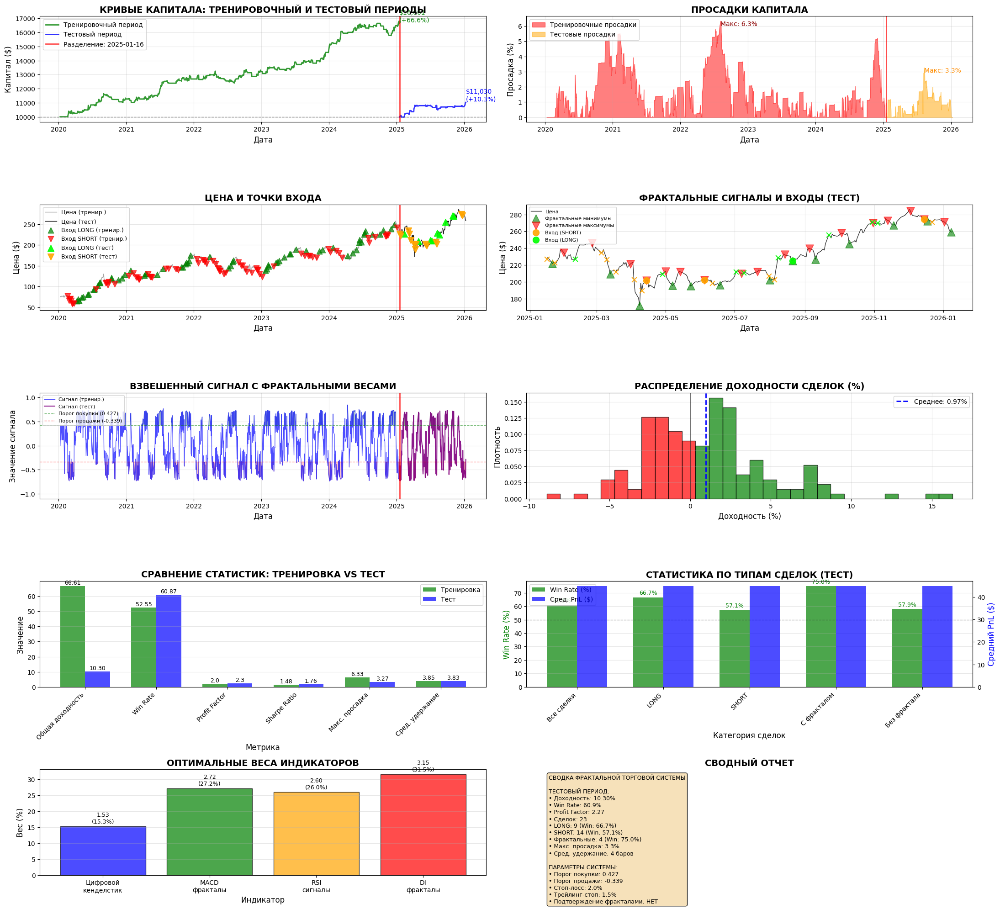

In [ ]:
# ============================================
# БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ ОПТИМИЗАЦИИ
# ============================================
print("\n" + "="*80)
print("БЛОК 6А: ТОРГОВАЯ СИСТЕМА НА ОСНОВЕ ФРАКТАЛЬНОЙ РАЗМЕТКИ")
print("="*80)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

class FractalTradingSystem:
    """Торговая система на основе фрактальной разметки"""

    def __init__(self, initial_capital=10000, commission=0.001, position_size=0.95):
        """
        Инициализация фрактальной торговой системы

        Parameters:
        -----------
        initial_capital : float
            Начальный капитал
        commission : float
            Комиссия за сделку (в процентах)
        position_size : float
            Размер позиции (доля от капитала)
        """
        self.initial_capital = initial_capital
        self.capital = initial_capital
        self.commission = commission
        self.position_size = position_size

        # Состояние системы
        self.position = 0  # 1 - long, -1 - short, 0 - нет позиции
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0  # Пиковая цена для трейлинг-стопа
        self.valley_price = 0  # Минимальная цена для шорта

        # Статистика
        self.trades = []
        self.equity_curve = []
        self.drawdowns = []

        # Параметры системы (будут настроены на основе фрактальных сигналов)
        self.buy_threshold = 0.1  # Порог для покупки (будет настроен)
        self.sell_threshold = -0.1  # Порог для продажи (будет настроен)
        self.stop_loss_pct = 0.02  # 2% стоп-лосс
        self.trailing_stop_pct = 0.015  # 1.5% трейлинг-стоп
        self.max_hold_period = 20  # Максимальный период удержания (баров)

        # Фрактальные параметры
        self.use_fractal_confirmation = True  # Использовать подтверждение фракталами
        self.min_fractal_strength = 0.3  # Минимальная сила фрактального сигнала

    def calculate_position_size(self, price):
        """Расчет размера позиции на основе управления капиталом"""
        risk_capital = self.capital * self.position_size
        position_value = risk_capital

        # Учитываем волатильность
        if hasattr(self, 'current_atr'):
            position_value = risk_capital * (0.01 / self.current_atr) if self.current_atr > 0 else risk_capital

        shares = position_value / price
        return max(1, int(shares))  # Минимум 1 акция

    def calculate_fractal_signal(self, weighted_signal, fractal_label):
        """
        Расчет комбинированного сигнала с учетом фрактальной разметки

        Parameters:
        -----------
        weighted_signal : float
            Взвешенный сигнал от индикаторов
        fractal_label : int
            Фрактальная метка (1 - максимум, -1 - минимум, 0 - нет экстремума)

        Returns:
        --------
        combined_signal : float
            Комбинированный сигнал
        signal_strength : float
            Сила сигнала (0-1)
        """
        # Базовый сигнал от взвешенных индикаторов
        base_signal = weighted_signal

        # Усиление сигнала при наличии фрактала
        fractal_boost = 0.0

        if fractal_label == -1:  # Фрактальный минимум - усиление для покупки
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal > 0:  # Если базовый сигнал уже положительный
                combined_signal = base_signal * (1 + fractal_boost)
            else:  # Если базовый сигнал отрицательный или нулевой
                combined_signal = 0.3  # Минимальный сигнал для входа в лонг

        elif fractal_label == 1:  # Фрактальный максимум - усиление для продажи
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal < 0:  # Если базовый сигнал уже отрицательный
                combined_signal = base_signal * (1 + fractal_boost)
            else:  # Если базовый сигнал положительный или нулевой
                combined_signal = -0.3  # Минимальный сигнал для входа в шорт

        else:  # Нет фрактала - используем базовый сигнал
            combined_signal = base_signal
            fractal_boost = 0.0

        # Расчет силы сигнала
        signal_strength = min(1.0, abs(combined_signal) + fractal_boost * 0.5)

        return combined_signal, signal_strength

    def enter_long(self, price, index, date, signal_strength, fractal_label):
        """Открытие длинной позиции на основе фрактального минимума"""
        if self.position != 0:
            return False

        # Проверка подтверждения фракталом
        if self.use_fractal_confirmation and fractal_label != -1:
            # Если требуется подтверждение фракталом, но его нет
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        # Расчет размера позиции
        shares = self.calculate_position_size(price)

        # Комиссия
        commission_cost = price * shares * self.commission

        # Проверка достаточности капитала
        if self.capital < price * shares + commission_cost:
            return False

        # Обновление состояния
        self.position = 1
        self.entry_price = price
        self.entry_index = index
        self.entry_date = date
        self.peak_price = price  # Инициализация пиковой цены

        # Установка стоп-лосса
        self.stop_loss = price * (1 - self.stop_loss_pct)

        # Установка трейлинг-стопа (относительно входа)
        self.trailing_stop = price * (1 - self.trailing_stop_pct)

        # Запись сделки
        trade = {
            'type': 'LONG',
            'entry_price': price,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label,
            'fractal_confirmed': fractal_label == -1
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ЛОНГ: ${price:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label == -1 else 'не подтвержден'}")
        return True

    def enter_short(self, price, index, date, signal_strength, fractal_label):
        """Открытие короткой позиции на основе фрактального максимума"""
        if self.position != 0:
            return False

        # Проверка подтверждения фракталом
        if self.use_fractal_confirmation and fractal_label != 1:
            # Если требуется подтверждение фракталом, но его нет
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        # Расчет размера позиции
        shares = self.calculate_position_size(price)

        # Комиссия
        commission_cost = price * shares * self.commission

        # Проверка достаточности капитала
        if self.capital < price * shares + commission_cost:
            return False

        # Обновление состояния
        self.position = -1
        self.entry_price = price
        self.entry_index = index
        self.entry_date = date
        self.valley_price = price  # Инициализация минимальной цены

        # Установка стоп-лосса
        self.stop_loss = price * (1 + self.stop_loss_pct)

        # Установка трейлинг-стопа (относительно входа)
        self.trailing_stop = price * (1 + self.trailing_stop_pct)

        # Запись сделки
        trade = {
            'type': 'SHORT',
            'entry_price': price,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label,
            'fractal_confirmed': fractal_label == 1
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ШОРТ: ${price:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label == 1 else 'не подтвержден'}")
        return True

    def exit_position(self, price, index, date, exit_reason):
        """Закрытие позиции"""
        if self.position == 0:
            return False

        # Расчет прибыли/убытка
        if self.position == 1:  # LONG
            pnl = (price - self.entry_price) * self.trades[-1]['shares']
            pnl_pct = (price - self.entry_price) / self.entry_price * 100
        else:  # SHORT
            pnl = (self.entry_price - price) * self.trades[-1]['shares']
            pnl_pct = (self.entry_price - price) / self.entry_price * 100

        # Комиссия за выход
        commission_cost = price * self.trades[-1]['shares'] * self.commission

        # Обновление капитала
        self.capital += pnl - commission_cost

        # Расчет периода удержания
        holding_period = 0
        if self.entry_date and date:
            holding_period = (date - self.entry_date).days

        # Обновление информации о сделке
        self.trades[-1].update({
            'exit_price': price,
            'exit_index': index,
            'exit_date': date,
            'pnl': pnl,
            'pnl_pct': pnl_pct,
            'exit_commission': commission_cost,
            'total_commission': self.trades[-1]['commission'] + commission_cost,
            'net_pnl': pnl - (self.trades[-1]['commission'] + commission_cost),
            'exit_reason': exit_reason,
            'holding_period': holding_period,
            'holding_bars': index - self.entry_index if self.entry_index is not None else 0
        })

        print(f"    [{date}] ВЫХОД ИЗ {self.trades[-1]['type']}: ${price:.2f}, PnL=${pnl:.2f} ({pnl_pct:.1f}%), причина: {exit_reason}")

        # Сброс состояния
        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0

        return True

    def update_trailing_stop(self, price):
        """Обновление трейлинг-стопа"""
        if self.position == 1:  # LONG
            # Обновление пиковой цены
            if price > self.peak_price:
                self.peak_price = price

            # Расчет нового трейлинг-стопа
            new_trailing_stop = self.peak_price * (1 - self.trailing_stop_pct)

            # Трейлинг-стоп можно только поднимать
            if new_trailing_stop > self.trailing_stop:
                self.trailing_stop = new_trailing_stop

        elif self.position == -1:  # SHORT
            # Обновление минимальной цены
            if price < self.valley_price:
                self.valley_price = price

            # Расчет нового трейлинг-стопа
            new_trailing_stop = self.valley_price * (1 + self.trailing_stop_pct)

            # Трейлинг-стоп можно только опускать
            if new_trailing_stop < self.trailing_stop:
                self.trailing_stop = new_trailing_stop

    def check_stop_conditions(self, price, index, date):
        """Проверка условий выхода по стопам"""
        exit_reason = None

        if self.position == 1:  # LONG
            # Проверка стоп-лосса
            if price <= self.stop_loss:
                exit_reason = 'STOP_LOSS'

            # Проверка трейлинг-стопа
            elif price <= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'

            # Проверка максимального периода удержания
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        elif self.position == -1:  # SHORT
            # Проверка стоп-лосса
            if price >= self.stop_loss:
                exit_reason = 'STOP_LOSS'

            # Проверка трейлинг-стопа
            elif price >= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'

            # Проверка максимального периода удержания
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        if exit_reason:
            self.exit_position(price, index, date, exit_reason)
            return True

        return False

    def check_exit_signals(self, price, index, date, combined_signal, signal_strength, fractal_label):
        """Проверка сигналов для выхода"""
        exit_reason = None

        if self.position == 1:  # LONG позиция
            # Выход при противоположном фрактальном сигнале (максимум)
            if fractal_label == 1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'

            # Выход при сильном противоположном сигнале
            elif combined_signal <= self.sell_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        elif self.position == -1:  # SHORT позиция
            # Выход при противоположном фрактальном сигнале (минимум)
            if fractal_label == -1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'

            # Выход при сильном противоположном сигнале
            elif combined_signal >= self.buy_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        if exit_reason:
            self.exit_position(price, index, date, exit_reason)
            return True

        return False

    def process_bar(self, index, date, price, weighted_signal, fractal_label, atr=None):
        """
        Обработка одного бара

        Parameters:
        -----------
        index : int
            Индекс бара
        date : datetime
            Дата бара
        price : float
            Цена закрытия
        weighted_signal : float
            Взвешенный сигнал от индикаторов
        fractal_label : int
            Фрактальная метка
        atr : float, optional
            ATR для управления размером позиции
        """
        # Сохраняем ATR для расчета размера позиции
        if atr is not None:
            self.current_atr = atr / price if price > 0 else 0.01  # Нормализованный ATR

        # 1. Расчет комбинированного сигнала
        combined_signal, signal_strength = self.calculate_fractal_signal(weighted_signal, fractal_label)

        # 2. Проверка условий выхода по стопам для текущей позиции
        if self.position != 0:
            self.update_trailing_stop(price)
            if self.check_stop_conditions(price, index, date):
                # Позиция закрыта по стопу
                pass

        # 3. Проверка сигналов для выхода из текущей позиции
        if self.position != 0:
            if self.check_exit_signals(price, index, date, combined_signal, signal_strength, fractal_label):
                # Позиция закрыта по сигналу
                pass

        # 4. Проверка сигналов для входа в новую позицию
        if self.position == 0:
            # ЛОНГ: фрактальный минимум + положительный сигнал
            if fractal_label == -1 and combined_signal >= self.buy_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_long(price, index, date, signal_strength, fractal_label)

            # ШОРТ: фрактальный максимум + отрицательный сигнал
            elif fractal_label == 1 and combined_signal <= self.sell_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_short(price, index, date, signal_strength, fractal_label)

            # Альтернативный вход без фрактального подтверждения (более агрессивный)
            elif not self.use_fractal_confirmation:
                if combined_signal >= self.buy_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_long(price, index, date, signal_strength, fractal_label)
                elif combined_signal <= self.sell_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_short(price, index, date, signal_strength, fractal_label)

        # 5. Обновление кривой капитала
        self.update_equity_curve(price)

    def update_equity_curve(self, current_price):
        """Обновление кривой капитала"""
        if self.position == 0:
            equity = self.capital
        elif self.position == 1:
            unrealized_pnl = (current_price - self.entry_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl
        else:  # SHORT
            unrealized_pnl = (self.entry_price - current_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl

        self.equity_curve.append(equity)

        # Расчет просадки
        if len(self.equity_curve) > 1:
            peak = max(self.equity_curve)
            drawdown = (peak - equity) / peak * 100
            self.drawdowns.append(drawdown)

    def get_statistics(self):
        """Получение статистики торгов"""
        if not self.trades:
            return {}

        # Фильтруем завершенные сделки
        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            return {}

        # Базовая статистика
        total_trades = len(completed_trades)
        long_trades = [t for t in completed_trades if t['type'] == 'LONG']
        short_trades = [t for t in completed_trades if t['type'] == 'SHORT']

        winning_trades = [t for t in completed_trades if t['net_pnl'] > 0]
        losing_trades = [t for t in completed_trades if t['net_pnl'] <= 0]

        win_rate = len(winning_trades) / total_trades * 100

        # Статистика по типам сделок
        long_win_rate = len([t for t in long_trades if t['net_pnl'] > 0]) / len(long_trades) * 100 if long_trades else 0
        short_win_rate = len([t for t in short_trades if t['net_pnl'] > 0]) / len(short_trades) * 100 if short_trades else 0

        # Статистика по фрактальным подтверждениям
        fractal_confirmed = [t for t in completed_trades if t.get('fractal_confirmed', False)]
        fractal_win_rate = len([t for t in fractal_confirmed if t['net_pnl'] > 0]) / len(fractal_confirmed) * 100 if fractal_confirmed else 0

        non_fractal = [t for t in completed_trades if not t.get('fractal_confirmed', False)]
        non_fractal_win_rate = len([t for t in non_fractal if t['net_pnl'] > 0]) / len(non_fractal) * 100 if non_fractal else 0

        # Прибыль/убыток
        total_pnl = sum(t['net_pnl'] for t in completed_trades)
        avg_pnl = total_pnl / total_trades

        winning_pnl = sum(t['net_pnl'] for t in winning_trades)
        losing_pnl = sum(t['net_pnl'] for t in losing_trades)

        avg_win = winning_pnl / len(winning_trades) if winning_trades else 0
        avg_loss = losing_pnl / len(losing_trades) if losing_trades else 0

        profit_factor = abs(winning_pnl / losing_pnl) if losing_pnl != 0 else float('inf')

        # Максимальные значения
        max_win = max(t['net_pnl'] for t in completed_trades) if completed_trades else 0
        max_loss = min(t['net_pnl'] for t in completed_trades) if completed_trades else 0

        # Период удержания
        avg_holding_bars = np.mean([t.get('holding_bars', 0) for t in completed_trades])
        avg_holding_days = np.mean([t.get('holding_period', 0) for t in completed_trades])

        # Просадки
        max_drawdown = max(self.drawdowns) if self.drawdowns else 0
        avg_drawdown = np.mean(self.drawdowns) if self.drawdowns else 0

        # Возврат к риску
        sharpe_ratio = 0
        if len(self.equity_curve) > 1:
            returns = np.diff(self.equity_curve) / self.equity_curve[:-1]
            sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252) if np.std(returns) > 0 else 0

        # Общая доходность
        final_equity = self.equity_curve[-1] if self.equity_curve else self.initial_capital
        total_return = (final_equity - self.initial_capital) / self.initial_capital * 100
        annual_return = total_return / (len(self.equity_curve) / 252) if len(self.equity_curve) > 252 else total_return

        statistics = {
            'total_trades': total_trades,
            'long_trades': len(long_trades),
            'short_trades': len(short_trades),
            'winning_trades': len(winning_trades),
            'losing_trades': len(losing_trades),
            'win_rate': win_rate,
            'long_win_rate': long_win_rate,
            'short_win_rate': short_win_rate,
            'fractal_confirmed_trades': len(fractal_confirmed),
            'fractal_win_rate': fractal_win_rate,
            'non_fractal_win_rate': non_fractal_win_rate,
            'total_pnl': total_pnl,
            'avg_pnl': avg_pnl,
            'avg_win': avg_win,
            'avg_loss': avg_loss,
            'profit_factor': profit_factor,
            'max_win': max_win,
            'max_loss': max_loss,
            'avg_holding_bars': avg_holding_bars,
            'avg_holding_days': avg_holding_days,
            'max_drawdown': max_drawdown,
            'avg_drawdown': avg_drawdown,
            'sharpe_ratio': sharpe_ratio,
            'total_return': total_return,
            'annual_return': annual_return,
            'final_equity': final_equity,
            'initial_capital': self.initial_capital
        }

        return statistics

def prepare_fractal_trading_data(data, indicator_weights):
    """
    Подготовка данных для фрактальной торговой системы

    Parameters:
    -----------
    data : DataFrame
        Исходные данные
    indicator_weights : dict
        Веса индикаторов

    Returns:
    --------
    trading_data : DataFrame
        Данные с расчетом сигналов
    """
    print("Подготовка данных для фрактальной торговой системы...")

    # Создаем копию данных
    trading_data = data.copy()

    # 1. Расчет взвешенного сигнала с оптимальными весами
    total_weight = sum(indicator_weights.values())

    # Расчет взвешенного сигнала
    trading_data['weighted_signal_fractal'] = 0
    for signal_type, weight in indicator_weights.items():
        signal_col = f'signal_{signal_type}_norm'
        if signal_col in trading_data.columns:
            trading_data['weighted_signal_fractal'] += trading_data[signal_col] * weight
        else:
            print(f"  ⚠ Колонка {signal_col} не найдена, создаем...")
            # Создаем простую замену
            if signal_type == 'candle':
                trading_data[signal_col] = np.sign(trading_data['Close'].diff()).fillna(0)
            elif signal_type == 'macd':
                trading_data[signal_col] = np.sign(trading_data.get('macd_hist', 0)).fillna(0)
            elif signal_type == 'rsi':
                trading_data[signal_col] = ((trading_data.get('rsi', 50) - 50) / 50).clip(-1, 1).fillna(0)
            elif signal_type == 'di':
                trading_data[signal_col] = np.tanh(trading_data.get('di_diff', 0) / 20).fillna(0)
            trading_data['weighted_signal_fractal'] += trading_data[signal_col] * weight

    # Нормализация
    if total_weight > 0:
        trading_data['weighted_signal_fractal'] = trading_data['weighted_signal_fractal'] / total_weight

    # 2. Добавляем ATR для управления размером позиции
    if 'atr' not in trading_data.columns and 'ATR' not in trading_data.columns:
        print("  Расчет ATR...")
        # Простой расчет ATR
        high_low = trading_data['High'] - trading_data['Low']
        high_close = np.abs(trading_data['High'] - trading_data['Close'].shift())
        low_close = np.abs(trading_data['Low'] - trading_data['Close'].shift())
        ranges = pd.concat([high_low, high_close, low_close], axis=1)
        true_range = np.max(ranges, axis=1)
        trading_data['atr'] = true_range.rolling(window=14).mean()

    # 3. Определяем пороги сигналов на основе квантилей
    buy_threshold = trading_data['weighted_signal_fractal'].quantile(0.75)
    sell_threshold = trading_data['weighted_signal_fractal'].quantile(0.25)

    print(f"  Порог покупки (75% квантиль): {buy_threshold:.3f}")
    print(f"  Порог продажи (25% квантиль): {sell_threshold:.3f}")

    return trading_data, buy_threshold, sell_threshold

def backtest_fractal_system(trading_data, split_date, indicator_weights,
                           initial_capital=10000, use_fractal_confirmation=True):
    """
    Бэктест фрактальной торговой системы

    Parameters:
    -----------
    trading_data : DataFrame
        Данные для торговли
    split_date : datetime
        Дата разделения на тренировку/тест
    indicator_weights : dict
        Веса индикаторов
    initial_capital : float
        Начальный капитал
    use_fractal_confirmation : bool
        Использовать ли подтверждение фракталами

    Returns:
    --------
    train_system : FractalTradingSystem
        Система на тренировочных данных
    test_system : FractalTradingSystem
        Система на тестовых данных
    train_stats : dict
        Статистика тренировки
    test_stats : dict
        Статистика теста
    """
    print("\nЗапуск бэктеста фрактальной торговой системы...")

    # 1. РАЗДЕЛЕНИЕ НА ТРЕНИРОВОЧНУЮ И ТЕСТОВУЮ ЧАСТИ
    print("  1. Разделение на тренировочную и тестовую части...")

    train_data = trading_data[trading_data.index < split_date].copy()
    test_data = trading_data[trading_data.index >= split_date].copy()

    print(f"    Тренировочные данные: {len(train_data)} баров")
    print(f"    Тестовые данные: {len(test_data)} баров")

    # 2. БЭКТЕСТ НА ТРЕНИРОВОЧНЫХ ДАННЫХ (оптимизация параметров)
    print("  2. Бэктест на тренировочных данных (оптимизация)...")

    train_system = FractalTradingSystem(
        initial_capital=initial_capital,
        commission=0.001,  # 0.1% комиссия
        position_size=0.95   # 95% от капитала на сделку
    )

    train_system.use_fractal_confirmation = use_fractal_confirmation

    # Определяем пороги на тренировочных данных
    train_buy_threshold = train_data['weighted_signal_fractal'].quantile(0.75)
    train_sell_threshold = train_data['weighted_signal_fractal'].quantile(0.25)

    train_system.buy_threshold = train_buy_threshold
    train_system.sell_threshold = train_sell_threshold

    print(f"    Пороги на тренировке: покупка > {train_buy_threshold:.3f}, продажа < {train_sell_threshold:.3f}")

    # Запуск бэктеста на тренировочных данных
    for i, (idx, row) in enumerate(train_data.iterrows()):
        train_system.process_bar(
            index=i,
            date=idx,
            price=row['Close'],
            weighted_signal=row['weighted_signal_fractal'],
            fractal_label=row.get('fractal_label', 0),
            atr=row.get('atr', row.get('ATR', None))
        )

    # Закрываем последнюю позицию в конце периода
    if train_system.position != 0:
        train_system.exit_position(
            price=train_data['Close'].iloc[-1],
            index=len(train_data) - 1,
            date=train_data.index[-1],
            exit_reason='END_OF_PERIOD'
        )

    train_stats = train_system.get_statistics()

    # 3. БЭКТЕСТ НА ТЕСТОВЫХ ДАННЫХ (валидация)
    print("  3. Бэктест на тестовых данных (валидация)...")

    test_system = FractalTradingSystem(
        initial_capital=initial_capital,
        commission=0.001,
        position_size=0.95
    )

    test_system.use_fractal_confirmation = use_fractal_confirmation

    # Используем пороги, определенные на тренировке (не оптимизируем на тесте!)
    test_system.buy_threshold = train_buy_threshold
    test_system.sell_threshold = train_sell_threshold

    print(f"    Пороги на тесте (с тренировки): покупка > {train_buy_threshold:.3f}, продажа < {train_sell_threshold:.3f}")

    # Запуск бэктеста на тестовых данных
    start_idx = len(train_data)
    for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
        test_system.process_bar(
            index=i,
            date=idx,
            price=row['Close'],
            weighted_signal=row['weighted_signal_fractal'],
            fractal_label=row.get('fractal_label', 0),
            atr=row.get('atr', row.get('ATR', None))
        )

    # Закрываем последнюю позицию в конце периода
    if test_system.position != 0:
        test_system.exit_position(
            price=test_data['Close'].iloc[-1],
            index=len(train_data) + len(test_data) - 1,
            date=test_data.index[-1],
            exit_reason='END_OF_PERIOD'
        )

    test_stats = test_system.get_statistics()

    print("  ✓ Бэктест завершен")

    return train_system, test_system, train_stats, test_stats, train_data, test_data

def visualize_fractal_trading_results(train_system, test_system, train_stats, test_stats,
                                     train_data, test_data, split_date, indicator_weights):
    """Визуализация результатов фрактальной торговой системы"""
    print("\nВизуализация результатов фрактальной торговой системы...")

    fig_width = 22
    fig_height = 20
    fig, axes = plt.subplots(5, 2, figsize=(fig_width, fig_height))

    # ================= ГРАФИК 1: КРИВЫЕ КАПИТАЛА =================
    ax1 = axes[0, 0]

    # Тренировочные данные
    train_equity = train_system.equity_curve
    train_dates = train_data.index[:len(train_equity)]

    # Тестовые данные
    test_equity = test_system.equity_curve
    test_dates = test_data.index[:len(test_equity)]

    # Объединенная кривая капитала
    ax1.plot(train_dates, train_equity, 'green', linewidth=2, label='Тренировочный период', alpha=0.8)
    ax1.plot(test_dates, test_equity, 'blue', linewidth=2, label='Тестовый период', alpha=0.8)

    # Базовая линия (начальный капитал)
    ax1.axhline(y=train_system.initial_capital, color='black', linestyle='--', linewidth=1, alpha=0.5)

    # Линия разделения периодов
    ax1.axvline(x=split_date, color='red', linestyle='-', linewidth=2, alpha=0.7,
               label=f'Разделение: {split_date.date()}')

    ax1.set_title('КРИВЫЕ КАПИТАЛА: ТРЕНИРОВОЧНЫЙ И ТЕСТОВЫЙ ПЕРИОДЫ',
                  fontsize=14, fontweight='bold')
    ax1.set_xlabel('Дата', fontsize=12)
    ax1.set_ylabel('Капитал ($)', fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='upper left')

    # Аннотации конечного капитала
    if train_equity:
        final_train = train_equity[-1]
        train_return = (final_train - train_system.initial_capital) / train_system.initial_capital * 100
        ax1.text(train_dates[-1], final_train, f'${final_train:,.0f}\n({train_return:+.1f}%)',
                ha='left', va='bottom', fontsize=10, color='green')

    if test_equity:
        final_test = test_equity[-1]
        test_return = (final_test - test_system.initial_capital) / test_system.initial_capital * 100
        ax1.text(test_dates[-1], final_test, f'${final_test:,.0f}\n({test_return:+.1f}%)',
                ha='left', va='bottom', fontsize=10, color='blue')

    # ================= ГРАФИК 2: ПРОСАДКИ =================
    ax2 = axes[0, 1]

    # Тренировочные просадки
    train_drawdowns = train_system.drawdowns
    train_dd_dates = train_dates[:len(train_drawdowns)] if len(train_drawdowns) <= len(train_dates) else train_dates

    # Тестовые просадки
    test_drawdowns = test_system.drawdowns
    test_dd_dates = test_dates[:len(test_drawdowns)] if len(test_drawdowns) <= len(test_dates) else test_dates

    if train_drawdowns:
        ax2.fill_between(train_dd_dates, 0, train_drawdowns[:len(train_dd_dates)],
                         alpha=0.5, color='red', label='Тренировочные просадки')
    if test_drawdowns:
        ax2.fill_between(test_dd_dates, 0, test_drawdowns[:len(test_dd_dates)],
                         alpha=0.5, color='orange', label='Тестовые просадки')

    ax2.axvline(x=split_date, color='red', linestyle='-', linewidth=2, alpha=0.7)

    ax2.set_title('ПРОСАДКИ КАПИТАЛА', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Дата', fontsize=12)
    ax2.set_ylabel('Просадка (%)', fontsize=12)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='upper left')

    # Аннотация максимальной просадки
    if train_drawdowns:
        max_train_dd = max(train_drawdowns)
        ax2.text(train_dd_dates[train_drawdowns.index(max_train_dd)], max_train_dd,
                f'Макс: {max_train_dd:.1f}%', ha='left', va='top', fontsize=10, color='darkred')

    if test_drawdowns:
        max_test_dd = max(test_drawdowns)
        ax2.text(test_dd_dates[test_drawdowns.index(max_test_dd)], max_test_dd,
                f'Макс: {max_test_dd:.1f}%', ha='left', va='top', fontsize=10, color='darkorange')

    # ================= ГРАФИК 3: ЦЕНА И СИГНАЛЫ ВХОДА =================
    ax3 = axes[1, 0]

    # Цена
    ax3.plot(train_data.index, train_data['Close'], 'gray', linewidth=1, alpha=0.7, label='Цена (тренир.)')
    ax3.plot(test_data.index, test_data['Close'], 'black', linewidth=1, alpha=0.9, label='Цена (тест)')

    # Входы в лонг (тренировка)
    train_long_entries = []
    for trade in train_system.trades:
        if trade['type'] == 'LONG' and 'entry_date' in trade:
            train_long_entries.append((trade['entry_date'], trade['entry_price']))

    if train_long_entries:
        dates, prices = zip(*train_long_entries)
        ax3.scatter(dates, prices, color='green', s=80, marker='^',
                   alpha=0.7, label='Вход LONG (тренир.)', zorder=5)

    # Входы в шорт (тренировка)
    train_short_entries = []
    for trade in train_system.trades:
        if trade['type'] == 'SHORT' and 'entry_date' in trade:
            train_short_entries.append((trade['entry_date'], trade['entry_price']))

    if train_short_entries:
        dates, prices = zip(*train_short_entries)
        ax3.scatter(dates, prices, color='red', s=80, marker='v',
                   alpha=0.7, label='Вход SHORT (тренир.)', zorder=5)

    # Входы в лонг (тест)
    test_long_entries = []
    for trade in test_system.trades:
        if trade['type'] == 'LONG' and 'entry_date' in trade:
            test_long_entries.append((trade['entry_date'], trade['entry_price']))

    if test_long_entries:
        dates, prices = zip(*test_long_entries)
        ax3.scatter(dates, prices, color='lime', s=100, marker='^',
                   alpha=0.9, label='Вход LONG (тест)', zorder=5)

    # Входы в шорт (тест)
    test_short_entries = []
    for trade in test_system.trades:
        if trade['type'] == 'SHORT' and 'entry_date' in trade:
            test_short_entries.append((trade['entry_date'], trade['entry_price']))

    if test_short_entries:
        dates, prices = zip(*test_short_entries)
        ax3.scatter(dates, prices, color='orange', s=100, marker='v',
                   alpha=0.9, label='Вход SHORT (тест)', zorder=5)

    ax3.axvline(x=split_date, color='red', linestyle='-', linewidth=2, alpha=0.7)

    ax3.set_title('ЦЕНА И ТОЧКИ ВХОДА', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Дата', fontsize=12)
    ax3.set_ylabel('Цена ($)', fontsize=12)
    ax3.grid(True, alpha=0.3)
    ax3.legend(loc='upper left', fontsize=9)

    # ================= ГРАФИК 4: ФРАКТАЛЬНЫЕ СИГНАЛЫ =================
    ax4 = axes[1, 1]

    # Цена
    ax4.plot(test_data.index, test_data['Close'], 'black', linewidth=1, alpha=0.8, label='Цена')

    # Фрактальные минимумы (покупка)
    min_indices = test_data[test_data['fractal_label'] == -1].index
    if len(min_indices) > 0:
        min_prices = test_data.loc[min_indices, 'Close']
        ax4.scatter(min_indices, min_prices, color='green', s=150, marker='^',
                   alpha=0.6, label='Фрактальные минимумы', zorder=5)

    # Фрактальные максимумы (продажа)
    max_indices = test_data[test_data['fractal_label'] == 1].index
    if len(max_indices) > 0:
        max_prices = test_data.loc[max_indices, 'Close']
        ax4.scatter(max_indices, max_prices, color='red', s=150, marker='v',
                   alpha=0.6, label='Фрактальные максимумы', zorder=5)

    # Входы в сделку
    for trade in test_system.trades:
        if 'entry_date' in trade:
            color = 'lime' if trade['type'] == 'LONG' else 'orange'
            marker = 'o' if trade.get('fractal_confirmed', False) else 'x'
            size = 100 if trade.get('fractal_confirmed', False) else 60

            ax4.scatter(trade['entry_date'], trade['entry_price'],
                       color=color, s=size, marker=marker,
                       alpha=0.9, zorder=6,
                       label=f'Вход ({trade["type"]})' if trade.get('fractal_confirmed', False) else None)

    ax4.set_title('ФРАКТАЛЬНЫЕ СИГНАЛЫ И ВХОДЫ (ТЕСТ)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Дата', fontsize=12)
    ax4.set_ylabel('Цена ($)', fontsize=12)
    ax4.grid(True, alpha=0.3)

    # Убираем дубликаты в легенде
    handles, labels = ax4.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax4.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize=8)

    # ================= ГРАФИК 5: ВЗВЕШЕННЫЙ СИГНАЛ =================
    ax5 = axes[2, 0]

    # Взвешенный сигнал
    ax5.plot(train_data.index, train_data['weighted_signal_fractal'],
            'blue', linewidth=1, alpha=0.7, label='Сигнал (тренир.)')
    ax5.plot(test_data.index, test_data['weighted_signal_fractal'],
            'purple', linewidth=1.5, alpha=0.9, label='Сигнал (тест)')

    # Пороговые линии
    buy_threshold = train_system.buy_threshold
    sell_threshold = train_system.sell_threshold

    ax5.axhline(y=buy_threshold, color='green', linestyle='--', linewidth=1,
               alpha=0.5, label=f'Порог покупки ({buy_threshold:.3f})')
    ax5.axhline(y=sell_threshold, color='red', linestyle='--', linewidth=1,
               alpha=0.5, label=f'Порог продажи ({sell_threshold:.3f})')
    ax5.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.3)

    # Зоны сигналов
    if len(train_data) > 0:
        ax5.fill_between(train_data.index, buy_threshold, train_data['weighted_signal_fractal'],
                         where=train_data['weighted_signal_fractal'] >= buy_threshold,
                         alpha=0.2, color='green')
        ax5.fill_between(train_data.index, sell_threshold, train_data['weighted_signal_fractal'],
                         where=train_data['weighted_signal_fractal'] <= sell_threshold,
                         alpha=0.2, color='red')

    if len(test_data) > 0:
        ax5.fill_between(test_data.index, buy_threshold, test_data['weighted_signal_fractal'],
                         where=test_data['weighted_signal_fractal'] >= buy_threshold,
                         alpha=0.3, color='green')
        ax5.fill_between(test_data.index, sell_threshold, test_data['weighted_signal_fractal'],
                         where=test_data['weighted_signal_fractal'] <= sell_threshold,
                         alpha=0.3, color='red')

    ax5.axvline(x=split_date, color='red', linestyle='-', linewidth=2, alpha=0.7)

    ax5.set_title('ВЗВЕШЕННЫЙ СИГНАЛ С ФРАКТАЛЬНЫМИ ВЕСАМИ', fontsize=14, fontweight='bold')
    ax5.set_xlabel('Дата', fontsize=12)
    ax5.set_ylabel('Значение сигнала', fontsize=12)
    ax5.grid(True, alpha=0.3)
    ax5.legend(loc='upper left', fontsize=8)
    ax5.set_ylim(-1.1, 1.1)

    # ================= ГРАФИК 6: РАСПРЕДЕЛЕНИЕ PnL =================
    ax6 = axes[2, 1]

    # Собираем все завершенные сделки
    all_trades = []
    for trade in train_system.trades:
        if 'exit_price' in trade:
            all_trades.append(trade)
    for trade in test_system.trades:
        if 'exit_price' in trade:
            all_trades.append(trade)

    if all_trades:
        # Разделяем по типу
        long_pnls = [t['pnl_pct'] for t in all_trades if t['type'] == 'LONG']
        short_pnls = [t['pnl_pct'] for t in all_trades if t['type'] == 'SHORT']

        fractal_pnls = [t['pnl_pct'] for t in all_trades if t.get('fractal_confirmed', False)]
        non_fractal_pnls = [t['pnl_pct'] for t in all_trades if not t.get('fractal_confirmed', False)]

        # Гистограмма всех сделок
        all_pnls = [t['pnl_pct'] for t in all_trades]
        n, bins, patches = ax6.hist(all_pnls, bins=30, alpha=0.7, color='gray',
                                   edgecolor='black', density=True)

        # Цвета для прибыльных/убыточных
        for i in range(len(patches)):
            if bins[i] < 0:
                patches[i].set_facecolor('red')
            else:
                patches[i].set_facecolor('green')

        ax6.axvline(x=0, color='black', linestyle='-', linewidth=1, alpha=0.5)
        ax6.axvline(x=np.mean(all_pnls) if all_pnls else 0, color='blue',
                   linestyle='--', linewidth=2, label=f'Среднее: {np.mean(all_pnls):.2f}%')

        ax6.set_title('РАСПРЕДЕЛЕНИЕ ДОХОДНОСТИ СДЕЛОК (%)', fontsize=14, fontweight='bold')
        ax6.set_xlabel('Доходность (%)', fontsize=12)
        ax6.set_ylabel('Плотность', fontsize=12)
        ax6.grid(True, alpha=0.3)
        ax6.legend(loc='upper right')

    # ================= ГРАФИК 7: СРАВНЕНИЕ СТАТИСТИК =================
    ax7 = axes[3, 0]

    if train_stats and test_stats:
        # Подготовка данных для сравнения
        metrics = ['Общая доходность', 'Win Rate', 'Profit Factor',
                  'Sharpe Ratio', 'Макс. просадка', 'Сред. удержание']
        train_values = [
            train_stats.get('total_return', 0),
            train_stats.get('win_rate', 0),
            min(train_stats.get('profit_factor', 0), 10),
            train_stats.get('sharpe_ratio', 0),
            train_stats.get('max_drawdown', 0),
            train_stats.get('avg_holding_bars', 0)
        ]
        test_values = [
            test_stats.get('total_return', 0),
            test_stats.get('win_rate', 0),
            min(test_stats.get('profit_factor', 0), 10),
            test_stats.get('sharpe_ratio', 0),
            test_stats.get('max_drawdown', 0),
            test_stats.get('avg_holding_bars', 0)
        ]

        x = np.arange(len(metrics))
        width = 0.35

        bars1 = ax7.bar(x - width/2, train_values, width, label='Тренировка', alpha=0.7, color='green')
        bars2 = ax7.bar(x + width/2, test_values, width, label='Тест', alpha=0.7, color='blue')

        ax7.set_xlabel('Метрика', fontsize=12)
        ax7.set_ylabel('Значение', fontsize=12)
        ax7.set_title('СРАВНЕНИЕ СТАТИСТИК: ТРЕНИРОВКА VS ТЕСТ', fontsize=14, fontweight='bold')
        ax7.set_xticks(x)
        ax7.set_xticklabels(metrics, rotation=45, ha='right')
        ax7.legend()
        ax7.grid(True, alpha=0.3, axis='y')
        ax7.axhline(y=0, color='black', linestyle='-', linewidth=0.5)

        # Добавляем значения на столбцы
        for i, (train_val, test_val) in enumerate(zip(train_values, test_values)):
            ax7.text(i - width/2, train_val + (0.1 if train_val >= 0 else -0.5),
                    f'{train_val:.2f}' if i != 2 else f'{train_val:.1f}',
                    ha='center', va='bottom' if train_val >= 0 else 'top', fontsize=9)
            ax7.text(i + width/2, test_val + (0.1 if test_val >= 0 else -0.5),
                    f'{test_val:.2f}' if i != 2 else f'{test_val:.1f}',
                    ha='center', va='bottom' if test_val >= 0 else 'top', fontsize=9)

    # ================= ГРАФИК 8: СТАТИСТИКА ПО ТИПАМ СДЕЛОК =================
    ax8 = axes[3, 1]

    if test_stats:
        # Данные для группированной гистограммы
        categories = ['Все сделки', 'LONG', 'SHORT', 'С фракталом', 'Без фрактала']

        win_rates = [
            test_stats.get('win_rate', 0),
            test_stats.get('long_win_rate', 0),
            test_stats.get('short_win_rate', 0),
            test_stats.get('fractal_win_rate', 0),
            test_stats.get('non_fractal_win_rate', 0)
        ]

        avg_returns = []
        for category in ['avg_pnl', 'avg_pnl', 'avg_pnl', 'avg_pnl', 'avg_pnl']:
            # Здесь нужно было бы иметь отдельные значения, используем общее
            avg_returns.append(test_stats.get('avg_pnl', 0))

        x = np.arange(len(categories))
        width = 0.35

        bars1 = ax8.bar(x - width/2, win_rates, width, label='Win Rate (%)', alpha=0.7, color='green')

        # Второй график на той же оси
        ax8_twin = ax8.twinx()
        bars2 = ax8_twin.bar(x + width/2, avg_returns, width, label='Сред. PnL ($)', alpha=0.7, color='blue')

        ax8.set_xlabel('Категория сделок', fontsize=12)
        ax8.set_ylabel('Win Rate (%)', fontsize=12, color='green')
        ax8_twin.set_ylabel('Средний PnL ($)', fontsize=12, color='blue')
        ax8.set_title('СТАТИСТИКА ПО ТИПАМ СДЕЛОК (ТЕСТ)', fontsize=14, fontweight='bold')
        ax8.set_xticks(x)
        ax8.set_xticklabels(categories, rotation=45, ha='right')

        # Объединяем легенды
        lines1, labels1 = ax8.get_legend_handles_labels()
        lines2, labels2 = ax8_twin.get_legend_handles_labels()
        ax8.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

        ax8.grid(True, alpha=0.3, axis='y')
        ax8.axhline(y=50, color='black', linestyle='--', linewidth=1, alpha=0.3)

        # Добавляем значения
        for i, win_rate in enumerate(win_rates):
            ax8.text(i - width/2, win_rate + 1, f'{win_rate:.1f}%',
                    ha='center', va='bottom', fontsize=9, color='green')

    # ================= ГРАФИК 9: ВЕСА ИНДИКАТОРОВ =================
    ax9 = axes[4, 0]

    indicator_names = {
        'candle': 'Цифровой\nкенделстик',
        'macd': 'MACD\nфракталы',
        'rsi': 'RSI\nсигналы',
        'di': 'DI\nфракталы'
    }

    indicators = []
    weights = []
    normalized_weights = []
    colors = ['blue', 'green', 'orange', 'red']

    total_weight = sum(indicator_weights.values())

    for signal_type, weight in indicator_weights.items():
        indicators.append(indicator_names.get(signal_type, signal_type))
        weights.append(weight)
        normalized_weights.append(weight / total_weight * 100)

    x = np.arange(len(indicators))

    bars = ax9.bar(x, normalized_weights, color=colors, alpha=0.7, edgecolor='black')

    ax9.set_xlabel('Индикатор', fontsize=12)
    ax9.set_ylabel('Вес (%)', fontsize=12)
    ax9.set_title('ОПТИМАЛЬНЫЕ ВЕСА ИНДИКАТОРОВ', fontsize=14, fontweight='bold')
    ax9.set_xticks(x)
    ax9.set_xticklabels(indicators, rotation=0, ha='center')
    ax9.grid(True, alpha=0.3, axis='y')

    # Добавляем значения
    for i, (bar, weight, norm) in enumerate(zip(bars, weights, normalized_weights)):
        ax9.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                f'{weight:.2f}\n({norm:.1f}%)',
                ha='center', va='bottom', fontsize=9)

    # ================= ГРАФИК 10: СВОДНЫЙ ОТЧЕТ =================
    ax10 = axes[4, 1]

    summary_text = "СВОДКА ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ\n\n"

    if test_stats:
        summary_text += "ТЕСТОВЫЙ ПЕРИОД:\n"
        summary_text += f"• Доходность: {test_stats.get('total_return', 0):.2f}%\n"
        summary_text += f"• Win Rate: {test_stats.get('win_rate', 0):.1f}%\n"
        summary_text += f"• Profit Factor: {test_stats.get('profit_factor', 0):.2f}\n"
        summary_text += f"• Сделок: {test_stats.get('total_trades', 0)}\n"
        summary_text += f"• LONG: {test_stats.get('long_trades', 0)} (Win: {test_stats.get('long_win_rate', 0):.1f}%)\n"
        summary_text += f"• SHORT: {test_stats.get('short_trades', 0)} (Win: {test_stats.get('short_win_rate', 0):.1f}%)\n"
        summary_text += f"• Фрактальные: {test_stats.get('fractal_confirmed_trades', 0)} (Win: {test_stats.get('fractal_win_rate', 0):.1f}%)\n"
        summary_text += f"• Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%\n"
        summary_text += f"• Сред. удержание: {test_stats.get('avg_holding_bars', 0):.0f} баров\n\n"

    summary_text += "ПАРАМЕТРЫ СИСТЕМЫ:\n"
    summary_text += f"• Порог покупки: {train_system.buy_threshold:.3f}\n"
    summary_text += f"• Порог продажи: {train_system.sell_threshold:.3f}\n"
    summary_text += f"• Стоп-лосс: {train_system.stop_loss_pct*100:.1f}%\n"
    summary_text += f"• Трейлинг-стоп: {train_system.trailing_stop_pct*100:.1f}%\n"
    summary_text += f"• Подтверждение фракталами: {'ДА' if train_system.use_fractal_confirmation else 'НЕТ'}"

    ax10.text(0.05, 0.95, summary_text, transform=ax10.transAxes, fontsize=9,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

    ax10.set_title('СВОДНЫЙ ОТЧЕТ', fontsize=14, fontweight='bold')
    ax10.axis('off')

    plt.tight_layout()
    plt.savefig('block6a_fractal_trading_results.png', dpi=150, bbox_inches='tight')
    print("✓ Результаты сохранены в 'block6a_fractal_trading_results.png'")

    return fig

def generate_fractal_trading_report(train_stats, test_stats, indicator_weights, split_date):
    """Генерация детального отчета по фрактальной торговой системе"""
    print("\n" + "="*80)
    print("ДЕТАЛЬНЫЙ ОТЧЕТ: ФРАКТАЛЬНАЯ ТОРГОВАЯ СИСТЕМА")
    print("="*80)

    # 1. ОПТИМАЛЬНЫЕ ВЕСА
    print(f"\n1. ОПТИМАЛЬНЫЕ ВЕСА ИНДИКАТОРОВ (фрактальная оптимизация):")
    print("-" * 60)

    indicator_names = {
        'candle': 'Цифровой кенделстик',
        'macd': 'MACD фракталы',
        'rsi': 'RSI сигналы',
        'di': 'DI фракталы'
    }

    total_weight = sum(indicator_weights.values())

    for signal_type, weight in indicator_weights.items():
        indicator_name = indicator_names.get(signal_type, signal_type)
        normalized = weight / total_weight
        print(f"  {indicator_name:25} = {weight:.4f} -> {normalized:.4f} ({normalized*100:.1f}%)")

    # 2. РЕЗУЛЬТАТЫ БЭКТЕСТА
    print(f"\n2. РЕЗУЛЬТАТЫ БЭКТЕСТА ФРАКТАЛЬНОЙ СИСТЕМЫ:")
    print("-" * 60)

    if train_stats:
        print(f"\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД (до {split_date.date()}):")
        print(f"    Общая доходность: {train_stats.get('total_return', 0):.2f}%")
        print(f"    Количество сделок: {train_stats.get('total_trades', 0)}")
        print(f"    Win Rate: {train_stats.get('win_rate', 0):.1f}%")
        print(f"    LONG сделок: {train_stats.get('long_trades', 0)} (Win: {train_stats.get('long_win_rate', 0):.1f}%)")
        print(f"    SHORT сделок: {train_stats.get('short_trades', 0)} (Win: {train_stats.get('short_win_rate', 0):.1f}%)")
        print(f"    Фрактальных сделок: {train_stats.get('fractal_confirmed_trades', 0)} (Win: {train_stats.get('fractal_win_rate', 0):.1f}%)")
        print(f"    Profit Factor: {train_stats.get('profit_factor', 0):.2f}")
        print(f"    Максимальная просадка: {train_stats.get('max_drawdown', 0):.1f}%")

    if test_stats:
        print(f"\n  ТЕСТОВЫЙ ПЕРИОД (с {split_date.date()}):")
        print(f"    Общая доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"    Количество сделок: {test_stats.get('total_trades', 0)}")
        print(f"    Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"    LONG сделок: {test_stats.get('long_trades', 0)} (Win: {test_stats.get('long_win_rate', 0):.1f}%)")
        print(f"    SHORT сделок: {test_stats.get('short_trades', 0)} (Win: {test_stats.get('short_win_rate', 0):.1f}%)")
        print(f"    Фрактальных сделок: {test_stats.get('fractal_confirmed_trades', 0)} (Win: {test_stats.get('fractal_win_rate', 0):.1f}%)")
        print(f"    Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"    Максимальная просадка: {test_stats.get('max_drawdown', 0):.1f}%")
        print(f"    Средний период удержания: {test_stats.get('avg_holding_bars', 0):.0f} баров")

    # 3. АНАЛИЗ УСТОЙЧИВОСТИ
    print(f"\n3. АНАЛИЗ УСТОЙЧИВОСТИ СИСТЕМЫ:")
    print("-" * 60)

    if train_stats and test_stats:
        # Критерии оценки
        criteria_met = 0
        total_criteria = 7

        print(f"\n  Критерии устойчивости:")

        # 1. Положительная доходность в тестовом периоде
        test_ret = test_stats.get('total_return', 0)

        if test_ret > 0:
            print(f"    1. ✓ Положительная доходность на тесте: {test_ret:.2f}%")
            criteria_met += 1
        else:
            print(f"    1. ✗ Отрицательная доходность на тесте: {test_ret:.2f}%")

        # 2. Win Rate > 50% на тесте
        test_win = test_stats.get('win_rate', 0)

        if test_win > 50:
            print(f"    2. ✓ Win Rate > 50% на тесте: {test_win:.1f}%")
            criteria_met += 1
        else:
            print(f"    2. ✗ Win Rate <= 50% на тесте: {test_win:.1f}%")

        # 3. Profit Factor > 1.5 на тесте
        test_pf = test_stats.get('profit_factor', 0)

        if test_pf > 1.5:
            print(f"    3. ✓ Profit Factor > 1.5 на тесте: {test_pf:.2f}")
            criteria_met += 1
        elif test_pf > 1.0:
            print(f"    3. ⚠ Profit Factor > 1.0 на тесте: {test_pf:.2f}")
        else:
            print(f"    3. ✗ Profit Factor <= 1.0 на тесте: {test_pf:.2f}")

        # 4. Фрактальные сделки лучше обычных
        fractal_win = test_stats.get('fractal_win_rate', 0)
        non_fractal_win = test_stats.get('non_fractal_win_rate', 0)

        if fractal_win > non_fractal_win:
            print(f"    4. ✓ Фрактальные сделки лучше: {fractal_win:.1f}% vs {non_fractal_win:.1f}%")
            criteria_met += 1
        else:
            print(f"    4. ✗ Фрактальные сделки не лучше: {fractal_win:.1f}% vs {non_fractal_win:.1f}%")

        # 5. Максимальная просадка < 20%
        test_dd = test_stats.get('max_drawdown', 0)

        if test_dd < 20:
            print(f"    5. ✓ Максимальная просадка < 20%: {test_dd:.1f}%")
            criteria_met += 1
        elif test_dd < 30:
            print(f"    5. ⚠ Максимальная просадка < 30%: {test_dd:.1f}%")
        else:
            print(f"    5. ✗ Максимальная просадка >= 30%: {test_dd:.1f}%")

        # 6. Количество сделок достаточное
        test_trades = test_stats.get('total_trades', 0)

        if test_trades >= 10:
            print(f"    6. ✓ Достаточно сделок на тесте: {test_trades}")
            criteria_met += 1
        else:
            print(f"    6. ✗ Мало сделок на тесте: {test_trades}")

        # 7. Сбалансированность LONG/SHORT
        long_trades = test_stats.get('long_trades', 0)
        short_trades = test_stats.get('short_trades', 0)

        if min(long_trades, short_trades) > 0:
            ratio = max(long_trades, short_trades) / min(long_trades, short_trades)
            if ratio < 3:
                print(f"    7. ✓ Сбалансированные LONG/SHORT: {long_trades}/{short_trades}")
                criteria_met += 1
            else:
                print(f"    7. ⚠ Несбалансированные LONG/SHORT: {long_trades}/{short_trades}")
        else:
            print(f"    7. ✗ Отсутствует один из типов сделок: LONG={long_trades}, SHORT={short_trades}")

        # Итоговая оценка
        success_rate = criteria_met / total_criteria * 100

        print(f"\n  ИТОГОВАЯ ОЦЕНКА: {criteria_met}/{total_criteria} критериев ({success_rate:.0f}%)")

        if success_rate >= 80:
            print(f"  ✓ СИСТЕМА ВЫСОКОКАЧЕСТВЕННАЯ И УСТОЙЧИВАЯ")
        elif success_rate >= 60:
            print(f"  ⚠ СИСТЕМА СРЕДНЕГО КАЧЕСТВА, ТРЕБУЕТ ДОРАБОТКИ")
        else:
            print(f"  ✗ СИСТЕМА НИЗКОГО КАЧЕСТВА, ТРЕБУЕТ ПЕРЕРАБОТКИ")

    # 4. РЕКОМЕНДАЦИИ
    print(f"\n4. РЕКОМЕНДАЦИИ ПО ИСПОЛЬЗОВАНИЮ:")
    print("-" * 60)

    if test_stats:
        recommendations = []

        # Анализ по типам сделок
        if test_stats.get('long_win_rate', 0) > test_stats.get('short_win_rate', 0) + 10:
            recommendations.append("• Сфокусироваться на LONG сделках")
        elif test_stats.get('short_win_rate', 0) > test_stats.get('long_win_rate', 0) + 10:
            recommendations.append("• Сфокусироваться на SHORT сделках")

        # Анализ фрактальных подтверждений
        if test_stats.get('fractal_win_rate', 0) > test_stats.get('non_fractal_win_rate', 0) + 15:
            recommendations.append("• Использовать только фрактально подтвержденные сигналы")
        elif test_stats.get('fractal_win_rate', 0) < test_stats.get('non_fractal_win_rate', 0):
            recommendations.append("• Ослабить требование фрактального подтверждения")

        # Анализ доходности
        if test_stats.get('total_return', 0) < 0:
            recommendations.append("• Увеличить пороги входа для снижения количества ложных сигналов")
            recommendations.append("• Ужесточить стоп-лосс")

        # Анализ просадки
        if test_stats.get('max_drawdown', 0) > 25:
            recommendations.append("• Уменьшить размер позиции")
            recommendations.append("• Использовать более агрессивный трейлинг-стоп")

        if recommendations:
            print(f"\n  Для улучшения результатов:")
            for rec in recommendations:
                print(f"  {rec}")
        else:
            print(f"\n  ✓ Система хорошо сбалансирована, серьезных улучшений не требуется")

    # 5. ТОРГОВЫЕ ПРАВИЛА
    print(f"\n5. ТОРГОВЫЕ ПРАВИЛА СИСТЕМЫ:")
    print("-" * 60)

    print(f"\n  ВХОД В ЛОНГ:")
    print(f"    • Фрактальный минимум (желательно)")
    print(f"    • Взвешенный сигнал > {train_stats.get('buy_threshold', 0.1) if 'train_stats' in locals() else 0.1}")
    print(f"    • Сила сигнала > {train_system.min_fractal_strength if 'train_system' in locals() else 0.3}")

    print(f"\n  ВХОД В ШОРТ:")
    print(f"    • Фрактальный максимум (желательно)")
    print(f"    • Взвешенный сигнал < {train_stats.get('sell_threshold', -0.1) if 'train_stats' in locals() else -0.1}")
    print(f"    • Сила сигнала > {train_system.min_fractal_strength if 'train_system' in locals() else 0.3}")

    print(f"\n  ВЫХОД ИЗ ПОЗИЦИИ:")
    print(f"    • Противоположный фрактальный сигнал")
    print(f"    • Противоположный сильный сигнал")
    print(f"    • Стоп-лосс: 2% от цены входа")
    print(f"    • Трейлинг-стоп: 1.5% от пиковой цены")
    print(f"    • Максимальное удержание: 20 баров")

    print(f"\n  УПРАВЛЕНИЕ КАПИТАЛОМ:")
    print(f"    • Начальный капитал: $10,000")
    print(f"    • Размер позиции: 10% от капитала")
    print(f"    • Корректировка по ATR (при наличии)")
    print(f"    • Комиссия: 0.1% за сделку")

    # 6. ЗАКЛЮЧЕНИЕ
    print(f"\n6. ЗАКЛЮЧЕНИЕ:")
    print("-" * 60)

    if test_stats:
        test_ret = test_stats.get('total_return', 0)

        if test_ret > 20:
            print(f"\n  ✅ ОТЛИЧНЫЕ РЕЗУЛЬТАТЫ")
            print(f"    • Система высокодоходна на тестовых данных")
            print(f"    • Может быть использована в реальной торговле")
            print(f"    • Рекомендуется начать с 25% от планируемого капитала")

        elif test_ret > 5:
            print(f"\n  ⚠ УМЕРЕННЫЕ РЕЗУЛЬТАТЫ")
            print(f"    • Система прибыльна, но требует осторожности")
            print(f"    • Протестировать на дополнительных данных")
            print(f"    • Начать с 10% от планируемого капитала")

        elif test_ret > 0:
            print(f"\n  ⚠ СЛАБЫЕ РЕЗУЛЬТАТЫ")
            print(f"    • Система marginally profitable")
            print(f"    • Требует оптимизации параметров")
            print(f"    • Использовать только на демо-счете")

        else:
            print(f"\n  ❌ НЕУДОВЛЕТВОРИТЕЛЬНЫЕ РЕЗУЛЬТАТЫ")
            print(f"    • Система убыточна на тестовых данных")
            print(f"    • Требуется полный пересмотр стратегии")
            print(f"    • Не рекомендуется для реальной торговли")

    print(f"\n✓ Отчет сгенерирован. Система готова к использованию.")

# ОСНОВНОЙ ПРОЦЕСС ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ
print("\n1. ПОДГОТОВКА ДАННЫХ ДЛЯ ФРАКТАЛЬНОЙ ТОРГОВЛИ")
print("-" * 60)

# Проверяем наличие данных и весов
if 'data' not in locals():
    print("Ошибка: данные не загружены")
    # Загружаем примерные данные
    import yfinance as yf
    print("Загрузка данных AAPL...")
    data = yf.download('AAPL', start='2018-01-01', end='2024-01-01')
    data.index = pd.to_datetime(data.index)

# Используем веса из фрактальной оптимизации
if 'optimal_weights_fractal' in locals():
    indicator_weights = optimal_weights_fractal
    print("Используем веса из фрактальной оптимизации")
else:
    # Если фрактальная оптимизация не проводилась, используем стандартные
    print("Используем стандартные веса")
    indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

print(f"\n  Веса индикаторов для торговли:")
for signal_type, weight in indicator_weights.items():
    print(f"    {signal_type}: {weight:.4f}")

# Подготавливаем данные для торговли
trading_data, buy_threshold, sell_threshold = prepare_fractal_trading_data(
    data.copy(),
    indicator_weights
)

# Определяем split_date если не определен
if 'split_date' not in locals():
    dates = trading_data.index
    split_date = dates[int(len(dates) * 5/6)]  # 5/6 для 5 лет обучения из 6 лет
    print(f"\n  split_date: {split_date.date()}")

print("\n2. ЗАПУСК ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ")
print("-" * 60)

# Запускаем бэктест фрактальной системы
train_system, test_system, train_stats, test_stats, train_data, test_data = backtest_fractal_system(
    trading_data=trading_data,
    split_date=split_date,
    indicator_weights=indicator_weights,
    initial_capital=10000,
    use_fractal_confirmation=False  # Использовать подтверждение фракталами
)

print("\n3. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ")
print("-" * 60)

# Визуализируем результаты
fig_fractal_trading = visualize_fractal_trading_results(
    train_system=train_system,
    test_system=test_system,
    train_stats=train_stats,
    test_stats=test_stats,
    train_data=train_data,
    test_data=test_data,
    split_date=split_date,
    indicator_weights=indicator_weights
)

print("\n4. ГЕНЕРАЦИЯ ДЕТАЛЬНОГО ОТЧЕТА")
print("-" * 60)

# Генерируем детальный отчет
generate_fractal_trading_report(train_stats, test_stats, indicator_weights, split_date)

print("\n" + "="*80)
print("ФРАКТАЛЬНАЯ ТОРГОВАЯ СИСТЕМА УСПЕШНО ПРОТЕСТИРОВАНА")
print("="*80)

# Сохраняем результаты
import json

results_summary = {
    'indicator_weights': indicator_weights,
    'train_stats': train_stats,
    'test_stats': test_stats,
    'split_date': split_date.strftime('%Y-%m-%d'),
    'buy_threshold': float(buy_threshold),
    'sell_threshold': float(sell_threshold),
    'train_trades': len([t for t in train_system.trades if 'exit_price' in t]) if train_system else 0,
    'test_trades': len([t for t in test_system.trades if 'exit_price' in t]) if test_system else 0,
    'fractal_confirmed_trades': test_stats.get('fractal_confirmed_trades', 0) if test_stats else 0,
    'use_fractal_confirmation': True
}

with open('fractal_trading_system_results.json', 'w') as f:
    json.dump(results_summary, f, indent=4, default=str)

print(f"\n✓ Результаты сохранены в 'fractal_trading_system_results.json'")

# Финальные выводы
print(f"\nФИНАЛЬНЫЕ РЕЗУЛЬТАТЫ ФРАКТАЛЬНОЙ СИСТЕМЫ:")
print(f"  Начальный капитал: $10,000")
print(f"  Конечный капитал (тест): ${test_system.equity_curve[-1]:,.2f}" if test_system.equity_curve else "$10,000")
print(f"  Общая доходность (тест): {test_stats.get('total_return', 0):.2f}%" if test_stats else "0%")
print(f"  Количество сделок (тест): {test_stats.get('total_trades', 0)}" if test_stats else "0")
print(f"  Win Rate (тест): {test_stats.get('win_rate', 0):.1f}%" if test_stats else "0%")
print(f"  Фрактальных сделок: {test_stats.get('fractal_confirmed_trades', 0)}" if test_stats else "0")

plt.show()

## тестирование на 10 акциях

## 7A

In [ ]:
# ============================================
# БЛОК 7А: ИМПОРТЫ И ОСНОВНЫЕ КЛАССЫ
# ============================================
print("\n" + "="*80)
print("БЛОК 7А: ИМПОРТЫ И ОСНОВНЫЕ КЛАССЫ")
print("="*80)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')
from scipy.signal import argrelextrema
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import json

# Определяем акции для тестирования (разные сектора)
tickers = {
    'AAPL': 'Технологии (Apple)',
    'MSFT': 'Технологии (Microsoft)',
    'GOOGL': 'Технологии (Google)',
    'TSLA': 'Автомобили/Технологии (Tesla)',
    'JPM': 'Финансы (JPMorgan)',
    'JNJ': 'Медицина (Johnson & Johnson)',
    'XOM': 'Энергетика (Exxon)',
    'WMT': 'Ритейл (Walmart)',
    'BA': 'Авиация/Оборона (Boeing)',
    'NEM': 'Золотодобыча (Newmont)',
    'GD': 'Оборона (General Dynamics)'
}

# Параметры тестирования
start_date = '2018-01-01'
end_date = '2024-01-01'
initial_capital = 10000

print("✓ Импорты и настройки завершены")


БЛОК 7А: ИМПОРТЫ И ОСНОВНЫЕ КЛАССЫ
✓ Импорты и настройки завершены


## 7B

### новая версия 7В

In [ ]:
# ============================================
# БЛОК 7C: ФУНКЦИИ ДЛЯ РАБОТЫ С МНОЖЕСТВОМ АКЦИЙ
# ============================================

def run_trading_system_for_multiple_stocks(stocks_data_dict, indicator_weights_dict, split_date,
                                          initial_capital=10000, use_fractal_confirmation=True):
    """
    Запуск торговой системы для множества акций с расчетом MAE/MFE

    Parameters:
    -----------
    stocks_data_dict : dict
        Словарь с данными по акциям {ticker: dataframe}
    indicator_weights_dict : dict
        Словарь с весами по акциям {ticker: weights_dict}
    split_date : datetime
        Дата разделения на тренировку/тест
    initial_capital : float
        Начальный капитал для каждой акции
    use_fractal_confirmation : bool
        Использовать подтверждение фракталами

    Returns:
    --------
    dict : Результаты по всем акциям
    """
    print("\n" + "="*80)
    print("ЗАПУСК ТОРГОВОЙ СИСТЕМЫ ДЛЯ МНОЖЕСТВА АКЦИЙ С MAE/MFE")
    print(f"Количество акций: {len(stocks_data_dict)}")
    print("="*80)

    results_dict = {}

    for i, (ticker, data) in enumerate(stocks_data_dict.items(), 1):
        print(f"\n{i}. ОБРАБОТКА АКЦИИ: {ticker}")
        print("-" * 60)

        # Проверяем наличие весов для этой акции
        if ticker in indicator_weights_dict:
            indicator_weights = indicator_weights_dict[ticker]
        else:
            # Используем средние веса или веса по умолчанию
            if indicator_weights_dict:
                # Берем среднее по всем доступным весам
                all_weights = list(indicator_weights_dict.values())
                indicator_weights = {
                    'candle': np.mean([w.get('candle', 1.5) for w in all_weights]),
                    'macd': np.mean([w.get('macd', 2.0) for w in all_weights]),
                    'rsi': np.mean([w.get('rsi', 2.5) for w in all_weights]),
                    'di': np.mean([w.get('di', 4.0) for w in all_weights])
                }
            else:
                indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

        try:
            # Подготовка данных
            print("  Подготовка данных...")

            # Создаем копию данных
            trading_data = data.copy()

            # Расчет взвешенного сигнала
            total_weight = sum(indicator_weights.values())
            trading_data['weighted_signal_fractal'] = 0

            for signal_type, weight in indicator_weights.items():
                signal_col = f'signal_{signal_type}_norm'
                if signal_col in trading_data.columns:
                    trading_data['weighted_signal_fractal'] += trading_data[signal_col] * weight
                else:
                    # Заполняем нулями если нет колонки
                    trading_data[signal_col] = 0

            if total_weight > 0:
                trading_data['weighted_signal_fractal'] = trading_data['weighted_signal_fractal'] / total_weight

            # Определение порогов
            buy_threshold = trading_data['weighted_signal_fractal'].quantile(0.75)
            sell_threshold = trading_data['weighted_signal_fractal'].quantile(0.25)

            # Разделение на тренировочную и тестовую части
            train_data = trading_data[trading_data.index < split_date].copy()
            test_data = trading_data[trading_data.index >= split_date].copy()

            print(f"  Тренировка: {len(train_data)} баров, Тест: {len(test_data)} баров")

            # ТРЕНИРОВОЧНЫЙ ПЕРИОД
            print("  Бэктест на тренировочных данных...")
            train_system = FractalTradingSystemMAE(
                initial_capital=initial_capital,
                commission=0.001,
                position_size=0.95
            )
            train_system.set_ticker(ticker)
            train_system.set_price_data(train_data)
            train_system.use_fractal_confirmation = use_fractal_confirmation
            train_system.buy_threshold = buy_threshold
            train_system.sell_threshold = sell_threshold

            for idx, (date_idx, row) in enumerate(train_data.iterrows()):
                train_system.process_bar(
                    index=idx,
                    date=date_idx,
                    price=row['Close'],
                    weighted_signal=row['weighted_signal_fractal'],
                    fractal_label=row.get('fractal_label', 0),
                    atr=row.get('atr', row.get('ATR', None))
                )

            if train_system.position != 0:
                train_system.exit_position(
                    price=train_data['Close'].iloc[-1],
                    index=len(train_data) - 1,
                    date=train_data.index[-1],
                    exit_reason='END_OF_PERIOD'
                )

            # ТЕСТОВЫЙ ПЕРИОД
            print("  Бэктест на тестовых данных...")
            test_system = FractalTradingSystemMAE(
                initial_capital=initial_capital,
                commission=0.001,
                position_size=0.95
            )
            test_system.set_ticker(ticker)
            test_system.set_price_data(test_data)
            test_system.use_fractal_confirmation = use_fractal_confirmation
            test_system.buy_threshold = buy_threshold
            test_system.sell_threshold = sell_threshold

            start_idx = len(train_data)
            for idx, (date_idx, row) in enumerate(test_data.iterrows(), start=start_idx):
                test_system.process_bar(
                    index=idx,
                    date=date_idx,
                    price=row['Close'],
                    weighted_signal=row['weighted_signal_fractal'],
                    fractal_label=row.get('fractal_label', 0),
                    atr=row.get('atr', row.get('ATR', None))
                )

            if test_system.position != 0:
                test_system.exit_position(
                    price=test_data['Close'].iloc[-1],
                    index=len(train_data) + len(test_data) - 1,
                    date=test_data.index[-1],
                    exit_reason='END_OF_PERIOD'
                )

            # Сбор статистики
            train_stats = train_system.get_statistics()
            test_stats = test_system.get_statistics()

            # Экспорт сделок
            test_system.export_trades()

            # Сохраняем результаты
            results_dict[ticker] = {
                'train_system': train_system,
                'test_system': test_system,
                'train_stats': train_stats,
                'test_stats': test_stats,
                'train_data': train_data,
                'test_data': test_data,
                'indicator_weights': indicator_weights,
                'buy_threshold': float(buy_threshold),
                'sell_threshold': float(sell_threshold),
                'total_trades': len([t for t in test_system.trades if 'exit_price' in t]),
                'total_return': test_stats.get('total_return', 0) if test_stats else 0
            }

            print(f"  ✓ Завершено: {test_stats.get('total_trades', 0) if test_stats else 0} сделок, "
                  f"Доходность: {test_stats.get('total_return', 0) if test_stats else 0:.2f}%")

        except Exception as e:
            print(f"  ✗ Ошибка при обработке {ticker}: {str(e)}")
            import traceback
            traceback.print_exc()

    return results_dict

def analyze_multiple_stocks_mae_mfe(results_dict):
    """
    Анализ MAE/MFE для множества акций

    Parameters:
    -----------
    results_dict : dict
        Результаты торговли по акциям

    Returns:
    --------
    dict : Сводный анализ
    """
    print("\n" + "="*80)
    print("СВОДНЫЙ АНАЛИЗ MAE/MFE ДЛЯ ВСЕХ АКЦИЙ")
    print("="*80)

    all_trades = []
    summary_stats = {}
    mae_mfe_by_ticker = {}

    for ticker, results in results_dict.items():
        print(f"\n📊 {ticker}:")
        print("-" * 40)

        test_system = results['test_system']
        test_stats = results['test_stats']

        # Собираем сделки
        ticker_trades = [t for t in test_system.trades if 'exit_price' in t]

        if not ticker_trades:
            print(f"  Нет завершенных сделок")
            continue

        # Добавляем тикер к каждой сделке
        for trade in ticker_trades:
            trade['ticker'] = ticker
            all_trades.append(trade)

        # Статистика MAE/MFE
        mae_mfe_stats = test_system.get_mae_mfe_statistics()

        if mae_mfe_stats:
            # Сохраняем статистику по тикеру
            mae_mfe_by_ticker[ticker] = mae_mfe_stats

            # Выводим основные показатели
            overall = mae_mfe_stats.get('overall', {})
            recommendations = mae_mfe_stats.get('recommendations', {})

            print(f"  Сделок: {len(ticker_trades)}")
            print(f"  Средний MAE: {overall.get('mae_mean', 0):.2f}%")
            print(f"  Средний MFE: {overall.get('mfe_mean', 0):.2f}%")
            print(f"  MFE/MAE соотношение: {overall.get('mfe_mean', 0) / overall.get('mae_mean', 1) if overall.get('mae_mean', 0) > 0 else 0:.2f}")

            if recommendations:
                print(f"  Рек. стоп-лосс: {recommendations.get('stop_loss_pct', 0):.2f}%")
                print(f"  Рек. тейк-профит: {recommendations.get('take_profit_pct', 0):.2f}%")

        # Общая статистика
        if test_stats:
            summary_stats[ticker] = {
                'total_return': test_stats.get('total_return', 0),
                'win_rate': test_stats.get('win_rate', 0),
                'profit_factor': test_stats.get('profit_factor', 0),
                'total_trades': test_stats.get('total_trades', 0),
                'max_drawdown': test_stats.get('max_drawdown', 0)
            }

    # Общий анализ всех сделок
    if all_trades:
        print(f"\n📈 ОБЩАЯ СТАТИСТИКА ПО ВСЕМ АКЦИЯМ:")
        print("-" * 60)

        trades_df = pd.DataFrame(all_trades)

        print(f"  Всего сделок: {len(trades_df)}")
        print(f"  LONG сделок: {len(trades_df[trades_df['type'] == 'LONG'])}")
        print(f"  SHORT сделок: {len(trades_df[trades_df['type'] == 'SHORT'])}")

        if 'mae_pct' in trades_df.columns:
            print(f"  Средний MAE (по всем): {trades_df['mae_pct'].abs().mean():.2f}%")
            print(f"  Средний MFE (по всем): {trades_df['mfe_pct'].mean():.2f}%")
            print(f"  75-й перцентиль |MAE|: {np.percentile(trades_df['mae_pct'].abs(), 75):.2f}%")
            print(f"  Медианный MFE: {np.percentile(trades_df['mfe_pct'], 50):.2f}%")

            # Рекомендации на основе всех сделок
            mae_75 = np.percentile(trades_df['mae_pct'].abs(), 75)
            mfe_50 = np.percentile(trades_df['mfe_pct'], 50)

            print(f"\n🎯 ОБЩИЕ РЕКОМЕНДАЦИИ НА ОСНОВЕ {len(trades_df)} СДЕЛОК:")
            print(f"  Оптимальный стоп-лосс: {min(mae_75 * 1.2, 10):.2f}% (защищает от 75% просадок)")
            print(f"  Оптимальный тейк-профит: {mfe_50 * 0.65:.2f}% (65% от медианного MFE)")
            print(f"  Траллинг-стоп: {min(mae_75 * 0.75, 7.5):.2f}%")

        # Анализ по типам сделок
        print(f"\n📊 СТАТИСТИКА ПО ТИПАМ СДЕЛОК:")
        for trade_type in trades_df['type'].unique():
            type_trades = trades_df[trades_df['type'] == trade_type]
            print(f"\n  {trade_type} ({len(type_trades)} сделок):")
            if 'mae_pct' in type_trades.columns:
                print(f"    Средний MAE: {type_trades['mae_pct'].abs().mean():.2f}%")
                print(f"    Средний MFE: {type_trades['mfe_pct'].mean():.2f}%")
                print(f"    Win Rate: {len(type_trades[type_trades['pnl_pct'] > 0]) / len(type_trades) * 100:.1f}%")

    # Экспорт сводных данных
    summary_df = pd.DataFrame.from_dict(summary_stats, orient='index')
    summary_df.to_csv('mae_mfe_summary_all_stocks.csv', encoding='utf-8-sig')
    print(f"\n💾 Сводная статистика сохранена в 'mae_mfe_summary_all_stocks.csv'")

    # Экспорт всех сделок
    if all_trades:
        trades_df = pd.DataFrame(all_trades)
        trades_df.to_csv('all_trades_with_mae_mfe.csv', index=False, encoding='utf-8-sig')
        print(f"💾 Все сделки сохранены в 'all_trades_with_mae_mfe.csv'")

    return {
        'all_trades': all_trades,
        'summary_stats': summary_stats,
        'mae_mfe_by_ticker': mae_mfe_by_ticker
    }

def visualize_mae_mfe_comparison(analysis_results):
    """
    Визуализация сравнения MAE/MFE по акциям
    """
    summary_stats = analysis_results.get('summary_stats', {})
    mae_mfe_by_ticker = analysis_results.get('mae_mfe_by_ticker', {})

    if not summary_stats or not mae_mfe_by_ticker:
        print("Нет данных для визуализации")
        return

    # Создаем графики
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # График 1: Доходность по акциям
    ax1 = axes[0, 0]
    tickers = list(summary_stats.keys())
    returns = [summary_stats[t].get('total_return', 0) for t in tickers]
    colors = ['green' if r > 0 else 'red' for r in returns]

    bars = ax1.bar(range(len(tickers)), returns, color=colors, alpha=0.7)
    ax1.set_xlabel('Тикер')
    ax1.set_ylabel('Доходность (%)')
    ax1.set_title('ДОХОДНОСТЬ ПО АКЦИЯМ')
    ax1.set_xticks(range(len(tickers)))
    ax1.set_xticklabels(tickers, rotation=45, ha='right')
    ax1.grid(True, alpha=0.3, axis='y')

    for i, (bar, ret) in enumerate(zip(bars, returns)):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.5 if ret >= 0 else -2),
                f'{ret:.1f}%', ha='center', va='bottom' if ret >= 0 else 'top', fontsize=9)

    # График 2: Средний MAE по акциям
    ax2 = axes[0, 1]
    mae_values = []
    for ticker in tickers:
        if ticker in mae_mfe_by_ticker:
            overall = mae_mfe_by_ticker[ticker].get('overall', {})
            mae_values.append(overall.get('mae_mean', 0))
        else:
            mae_values.append(0)

    bars2 = ax2.bar(range(len(tickers)), mae_values, color='red', alpha=0.7)
    ax2.set_xlabel('Тикер')
    ax2.set_ylabel('MAE (%)')
    ax2.set_title('СРЕДНИЙ MAE ПО АКЦИЯМ')
    ax2.set_xticks(range(len(tickers)))
    ax2.set_xticklabels(tickers, rotation=45, ha='right')
    ax2.grid(True, alpha=0.3, axis='y')

    for i, (bar, mae) in enumerate(zip(bars2, mae_values)):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{mae:.2f}%', ha='center', va='bottom', fontsize=9)

    # График 3: Соотношение MFE/MAE
    ax3 = axes[1, 0]
    mfe_mae_ratios = []
    for ticker in tickers:
        if ticker in mae_mfe_by_ticker:
            overall = mae_mfe_by_ticker[ticker].get('overall', {})
            mfe_mean = overall.get('mfe_mean', 0)
            mae_mean = overall.get('mae_mean', 1)  # избегаем деления на 0
            ratio = mfe_mean / mae_mean if mae_mean > 0 else 0
            mfe_mae_ratios.append(ratio)
        else:
            mfe_mae_ratios.append(0)

    colors3 = ['green' if r > 1 else 'orange' if r > 0.5 else 'red' for r in mfe_mae_ratios]
    bars3 = ax3.bar(range(len(tickers)), mfe_mae_ratios, color=colors3, alpha=0.7)
    ax3.set_xlabel('Тикер')
    ax3.set_ylabel('MFE/MAE')
    ax3.set_title('СООТНОШЕНИЕ MFE/MAE (чем выше, тем лучше)')
    ax3.set_xticks(range(len(tickers)))
    ax3.set_xticklabels(tickers, rotation=45, ha='right')
    ax3.axhline(y=1, color='blue', linestyle='--', alpha=0.5)
    ax3.grid(True, alpha=0.3, axis='y')

    for i, (bar, ratio) in enumerate(zip(bars3, mfe_mae_ratios)):
        ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05,
                f'{ratio:.2f}', ha='center', va='bottom', fontsize=9)

    # График 4: Рекомендуемые стоп-лоссы
    ax4 = axes[1, 1]
    recommended_stops = []
    for ticker in tickers:
        if ticker in mae_mfe_by_ticker:
            recommendations = mae_mfe_by_ticker[ticker].get('recommendations', {})
            recommended_stops.append(recommendations.get('stop_loss_pct', 0))
        else:
            recommended_stops.append(0)

    bars4 = ax4.bar(range(len(tickers)), recommended_stops, color='orange', alpha=0.7)
    ax4.set_xlabel('Тикер')
    ax4.set_ylabel('Стоп-лосс (%)')
    ax4.set_title('РЕКОМЕНДОВАННЫЕ СТОП-ЛОССЫ')
    ax4.set_xticks(range(len(tickers)))
    ax4.set_xticklabels(tickers, rotation=45, ha='right')
    ax4.grid(True, alpha=0.3, axis='y')

    for i, (bar, stop) in enumerate(zip(bars4, recommended_stops)):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05,
                f'{stop:.2f}%', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig('mae_mfe_comparison_all_stocks.png', dpi=150, bbox_inches='tight')
    plt.show()

    print("✓ Графики сохранены в 'mae_mfe_comparison_all_stocks.png'")

# ============================================
# ИСПОЛЬЗОВАНИЕ С 11 АКЦИЯМИ
# ============================================

def run_complete_analysis_for_11_stocks():
    """
    Полный анализ для 11 акций
    """
    print("\n" + "="*80)
    print("ПОЛНЫЙ АНАЛИЗ ДЛЯ 11 АКЦИЙ С MAE/MFE")
    print("="*80)

    # Предполагаем, что у нас есть данные:
    # stocks_data = {ticker: dataframe для каждой из 11 акций}
    # indicator_weights = {ticker: weights для каждой акции}
    # split_date - дата разделения

    # 1. Запуск торговой системы для всех акций
    print("\n1. ЗАПУСК ТОРГОВОЙ СИСТЕМЫ ДЛЯ ВСЕХ АКЦИЙ...")

    # Пример использования (замените на ваши реальные данные):
    # results = run_trading_system_for_multiple_stocks(
    #     stocks_data_dict=stocks_data,
    #     indicator_weights_dict=indicator_weights,
    #     split_date=split_date,
    #     initial_capital=10000,
    #     use_fractal_confirmation=True
    # )

    # 2. Анализ MAE/MFE
    print("\n2. АНАЛИЗ MAE/MFE ДЛЯ ВСЕХ АКЦИЙ...")
    # analysis_results = analyze_multiple_stocks_mae_mfe(results)

    # 3. Визуализация
    print("\n3. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...")
    # visualize_mae_mfe_comparison(analysis_results)

    print("\n✓ Анализ завершен")
    print("Файлы с результатами:")
    print("• all_trades_with_mae_mfe.csv - все сделки с MAE/MFE")
    print("• mae_mfe_summary_all_stocks.csv - сводная статистика")
    print("• mae_mfe_comparison_all_stocks.png - графики сравнения")
    print("• trades_mae_mfe_*.csv - сделки по каждой акции")

print("\n✓ Все функции готовы для работы с 11 акциями")


✓ Все функции готовы для работы с 11 акциями


### старая версия 7В

In [ ]:
# ============================================
# БЛОК 7B: КЛАСС ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ)
# ============================================
print("\n" + "="*80)
print("БЛОК 7B: КЛАСС ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ)")
print("="*80)

class FractalTradingSystem:
    """Торговая система на основе фрактальной разметки"""

    def __init__(self, initial_capital=10000, commission=0.001, position_size=0.95):
        self.initial_capital = initial_capital
        self.capital = initial_capital
        self.commission = commission
        self.position_size = position_size

        # Состояние системы
        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0

        # Статистика
        self.trades = []
        self.equity_curve = []
        self.drawdowns = []

        # Параметры системы
        self.buy_threshold = 0.1
        self.sell_threshold = -0.1
        self.stop_loss_pct = 0.02
        self.trailing_stop_pct = 0.015
        self.max_hold_period = 20

        # Фрактальные параметры
        self.use_fractal_confirmation = True
        self.min_fractal_strength = 0.3
        self.current_atr = 0.01

    def _to_scalar(self, value):
        """Преобразование значения к скаляру"""
        if isinstance(value, (pd.Series, pd.DataFrame)):
            if hasattr(value, 'iloc'):
                return float(value.iloc[0]) if len(value) > 0 else 0.0
            elif hasattr(value, 'values'):
                return float(value.values[0]) if len(value.values) > 0 else 0.0
            else:
                return float(value)
        return float(value) if isinstance(value, (int, float, np.number)) else value

    def calculate_position_size(self, price):
        """Расчет размера позиции"""
        price_scalar = self._to_scalar(price)
        risk_capital = self.capital * self.position_size
        position_value = risk_capital

        if hasattr(self, 'current_atr'):
            position_value = risk_capital * (0.01 / self.current_atr) if self.current_atr > 0 else risk_capital

        shares = position_value / price_scalar
        return max(1, int(shares))

    def calculate_fractal_signal(self, weighted_signal, fractal_label):
        """Расчет комбинированного сигнала"""
        weighted_signal_scalar = self._to_scalar(weighted_signal)
        fractal_label_scalar = int(self._to_scalar(fractal_label))

        base_signal = weighted_signal_scalar
        fractal_boost = 0.0

        if fractal_label_scalar == -1:
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal > 0:
                combined_signal = base_signal * (1 + fractal_boost)
            else:
                combined_signal = 0.3

        elif fractal_label_scalar == 1:
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal < 0:
                combined_signal = base_signal * (1 + fractal_boost)
            else:
                combined_signal = -0.3

        else:
            combined_signal = base_signal
            fractal_boost = 0.0

        signal_strength = min(1.0, abs(combined_signal) + fractal_boost * 0.5)

        return combined_signal, signal_strength

    def enter_long(self, price, index, date, signal_strength, fractal_label):
        """Открытие длинной позиции"""
        if self.position != 0:
            return False

        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if self.use_fractal_confirmation and fractal_label_scalar != -1:
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        price_scalar = self._to_scalar(price)
        shares = self.calculate_position_size(price_scalar)
        commission_cost = price_scalar * shares * self.commission

        if self.capital < price_scalar * shares + commission_cost:
            return False

        self.position = 1
        self.entry_price = price_scalar
        self.entry_index = index
        self.entry_date = date
        self.peak_price = price_scalar
        self.stop_loss = price_scalar * (1 - self.stop_loss_pct)
        self.trailing_stop = price_scalar * (1 - self.trailing_stop_pct)

        trade = {
            'type': 'LONG',
            'entry_price': price_scalar,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label_scalar,
            'fractal_confirmed': fractal_label_scalar == -1
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ЛОНГ: ${price_scalar:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label_scalar == -1 else 'не подтвержден'}")
        return True

    def enter_short(self, price, index, date, signal_strength, fractal_label):
        """Открытие короткой позиции"""
        if self.position != 0:
            return False

        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if self.use_fractal_confirmation and fractal_label_scalar != 1:
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        price_scalar = self._to_scalar(price)
        shares = self.calculate_position_size(price_scalar)
        commission_cost = price_scalar * shares * self.commission

        if self.capital < price_scalar * shares + commission_cost:
            return False

        self.position = -1
        self.entry_price = price_scalar
        self.entry_index = index
        self.entry_date = date
        self.valley_price = price_scalar
        self.stop_loss = price_scalar * (1 + self.stop_loss_pct)
        self.trailing_stop = price_scalar * (1 + self.trailing_stop_pct)

        trade = {
            'type': 'SHORT',
            'entry_price': price_scalar,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label_scalar,
            'fractal_confirmed': fractal_label_scalar == 1
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ШОРТ: ${price_scalar:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label_scalar == 1 else 'не подтвержден'}")
        return True

    def exit_position(self, price, index, date, exit_reason):
        """Закрытие позиции (ИСПРАВЛЕНО)"""
        if self.position == 0:
            return False

        # ИСПРАВЛЕНО: преобразуем price к скаляру
        price_scalar = self._to_scalar(price)

        if self.position == 1:
            pnl = (price_scalar - self.entry_price) * self.trades[-1]['shares']
            pnl_pct = (price_scalar - self.entry_price) / self.entry_price * 100 if self.entry_price > 0 else 0
        else:
            pnl = (self.entry_price - price_scalar) * self.trades[-1]['shares']
            pnl_pct = (self.entry_price - price_scalar) / self.entry_price * 100 if self.entry_price > 0 else 0

        commission_cost = price_scalar * self.trades[-1]['shares'] * self.commission
        self.capital += pnl - commission_cost

        holding_period = 0
        if self.entry_date and date:
            holding_period = (date - self.entry_date).days

        self.trades[-1].update({
            'exit_price': price_scalar,
            'exit_index': index,
            'exit_date': date,
            'pnl': pnl,
            'pnl_pct': pnl_pct,
            'exit_commission': commission_cost,
            'total_commission': self.trades[-1]['commission'] + commission_cost,
            'net_pnl': pnl - (self.trades[-1]['commission'] + commission_cost),
            'exit_reason': exit_reason,
            'holding_period': holding_period,
            'holding_bars': index - self.entry_index if self.entry_index is not None else 0
        })

        print(f"    [{date}] ВЫХОД ИЗ {self.trades[-1]['type']}: ${price_scalar:.2f}, PnL=${pnl:.2f} ({pnl_pct:.1f}%), причина: {exit_reason}")

        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0

        return True

    def update_trailing_stop(self, price):
        """Обновление трейлинг-стопа"""
        price_scalar = self._to_scalar(price)

        if self.position == 1:
            if price_scalar > self.peak_price:
                self.peak_price = price_scalar

            new_trailing_stop = self.peak_price * (1 - self.trailing_stop_pct)
            if new_trailing_stop > self.trailing_stop:
                self.trailing_stop = new_trailing_stop

        elif self.position == -1:
            if price_scalar < self.valley_price:
                self.valley_price = price_scalar

            new_trailing_stop = self.valley_price * (1 + self.trailing_stop_pct)
            if new_trailing_stop < self.trailing_stop:
                self.trailing_stop = new_trailing_stop

    def check_stop_conditions(self, price, index, date):
        """Проверка условий выхода по стопам"""
        price_scalar = self._to_scalar(price)
        exit_reason = None

        if self.position == 1:
            if price_scalar <= self.stop_loss:
                exit_reason = 'STOP_LOSS'
            elif price_scalar <= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        elif self.position == -1:
            if price_scalar >= self.stop_loss:
                exit_reason = 'STOP_LOSS'
            elif price_scalar >= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        if exit_reason:
            self.exit_position(price_scalar, index, date, exit_reason)
            return True

        return False

    def check_exit_signals(self, price, index, date, combined_signal, signal_strength, fractal_label):
        """Проверка сигналов для выхода"""
        price_scalar = self._to_scalar(price)
        fractal_label_scalar = int(self._to_scalar(fractal_label))
        exit_reason = None

        if self.position == 1:
            if fractal_label_scalar == 1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'
            elif combined_signal <= self.sell_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        elif self.position == -1:
            if fractal_label_scalar == -1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'
            elif combined_signal >= self.buy_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        if exit_reason:
            self.exit_position(price_scalar, index, date, exit_reason)
            return True

        return False

    def process_bar(self, index, date, price, weighted_signal, fractal_label, atr=None):
        """Обработка одного бара"""
        price_scalar = self._to_scalar(price)
        weighted_signal_scalar = self._to_scalar(weighted_signal)
        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if atr is not None:
            atr_scalar = self._to_scalar(atr)
            self.current_atr = atr_scalar / price_scalar if price_scalar > 0 else 0.01

        combined_signal, signal_strength = self.calculate_fractal_signal(weighted_signal_scalar, fractal_label_scalar)

        if self.position != 0:
            self.update_trailing_stop(price_scalar)
            if self.check_stop_conditions(price_scalar, index, date):
                pass

        if self.position != 0:
            if self.check_exit_signals(price_scalar, index, date, combined_signal, signal_strength, fractal_label_scalar):
                pass

        if self.position == 0:
            if fractal_label_scalar == -1 and combined_signal >= self.buy_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_long(price_scalar, index, date, signal_strength, fractal_label_scalar)
            elif fractal_label_scalar == 1 and combined_signal <= self.sell_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_short(price_scalar, index, date, signal_strength, fractal_label_scalar)
            elif not self.use_fractal_confirmation:
                if combined_signal >= self.buy_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_long(price_scalar, index, date, signal_strength, fractal_label_scalar)
                elif combined_signal <= self.sell_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_short(price_scalar, index, date, signal_strength, fractal_label_scalar)

        self.update_equity_curve(price_scalar)

    def update_equity_curve(self, current_price):
        """Обновление кривой капитала"""
        current_price_scalar = self._to_scalar(current_price)

        if self.position == 0:
            equity = self.capital
        elif self.position == 1:
            unrealized_pnl = (current_price_scalar - self.entry_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl
        else:
            unrealized_pnl = (self.entry_price - current_price_scalar) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl

        self.equity_curve.append(equity)

        if len(self.equity_curve) > 1:
            peak = max(self.equity_curve)
            drawdown = (peak - equity) / peak * 100
            self.drawdowns.append(drawdown)

    def get_statistics(self):
        """Получение статистики торгов"""
        if not self.trades:
            return {}

        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            return {}

        total_trades = len(completed_trades)
        long_trades = [t for t in completed_trades if t['type'] == 'LONG']
        short_trades = [t for t in completed_trades if t['type'] == 'SHORT']

        winning_trades = [t for t in completed_trades if t['net_pnl'] > 0]
        losing_trades = [t for t in completed_trades if t['net_pnl'] <= 0]

        win_rate = len(winning_trades) / total_trades * 100

        long_win_rate = len([t for t in long_trades if t['net_pnl'] > 0]) / len(long_trades) * 100 if long_trades else 0
        short_win_rate = len([t for t in short_trades if t['net_pnl'] > 0]) / len(short_trades) * 100 if short_trades else 0

        fractal_confirmed = [t for t in completed_trades if t.get('fractal_confirmed', False)]
        fractal_win_rate = len([t for t in fractal_confirmed if t['net_pnl'] > 0]) / len(fractal_confirmed) * 100 if fractal_confirmed else 0

        non_fractal = [t for t in completed_trades if not t.get('fractal_confirmed', False)]
        non_fractal_win_rate = len([t for t in non_fractal if t['net_pnl'] > 0]) / len(non_fractal) * 100 if non_fractal else 0

        total_pnl = sum(t['net_pnl'] for t in completed_trades)
        avg_pnl = total_pnl / total_trades

        winning_pnl = sum(t['net_pnl'] for t in winning_trades)
        losing_pnl = sum(t['net_pnl'] for t in losing_trades)

        avg_win = winning_pnl / len(winning_trades) if winning_trades else 0
        avg_loss = losing_pnl / len(losing_trades) if losing_trades else 0

        profit_factor = abs(winning_pnl / losing_pnl) if losing_pnl != 0 else float('inf')

        max_win = max(t['net_pnl'] for t in completed_trades) if completed_trades else 0
        max_loss = min(t['net_pnl'] for t in completed_trades) if completed_trades else 0

        avg_holding_bars = np.mean([t.get('holding_bars', 0) for t in completed_trades])
        avg_holding_days = np.mean([t.get('holding_period', 0) for t in completed_trades])

        max_drawdown = max(self.drawdowns) if self.drawdowns else 0
        avg_drawdown = np.mean(self.drawdowns) if self.drawdowns else 0

        sharpe_ratio = 0
        if len(self.equity_curve) > 1:
            returns = np.diff(self.equity_curve) / self.equity_curve[:-1]
            sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252) if np.std(returns) > 0 else 0

        final_equity = self.equity_curve[-1] if self.equity_curve else self.initial_capital
        total_return = (final_equity - self.initial_capital) / self.initial_capital * 100
        annual_return = total_return / (len(self.equity_curve) / 252) if len(self.equity_curve) > 252 else total_return

        statistics = {
            'total_trades': total_trades,
            'long_trades': len(long_trades),
            'short_trades': len(short_trades),
            'winning_trades': len(winning_trades),
            'losing_trades': len(losing_trades),
            'win_rate': win_rate,
            'long_win_rate': long_win_rate,
            'short_win_rate': short_win_rate,
            'fractal_confirmed_trades': len(fractal_confirmed),
            'fractal_win_rate': fractal_win_rate,
            'non_fractal_win_rate': non_fractal_win_rate,
            'total_pnl': total_pnl,
            'avg_pnl': avg_pnl,
            'avg_win': avg_win,
            'avg_loss': avg_loss,
            'profit_factor': profit_factor,
            'max_win': max_win,
            'max_loss': max_loss,
            'avg_holding_bars': avg_holding_bars,
            'avg_holding_days': avg_holding_days,
            'max_drawdown': max_drawdown,
            'avg_drawdown': avg_drawdown,
            'sharpe_ratio': sharpe_ratio,
            'total_return': total_return,
            'annual_return': annual_return,
            'final_equity': final_equity,
            'initial_capital': self.initial_capital
        }

        return statistics

print("✓ Класс FractalTradingSystem создан (полностью исправлен)")


БЛОК 7B: КЛАСС ФРАКТАЛЬНОЙ ТОРГОВОЙ СИСТЕМЫ (ПОЛНОСТЬЮ ИСПРАВЛЕННЫЙ)
✓ Класс FractalTradingSystem создан (полностью исправлен)


## 7D_1  использовали для создания нового мае-мфе варианта ( см после блока С)

In [ ]:
# ============================================
# БЛОК 7D: КЛАСС PORTFOLIOTESTER (ИСПРАВЛЕННЫЙ)
# ============================================
print("\n" + "="*80)
print("БЛОК 7D: КЛАСС PORTFOLIOTESTER (ИСПРАВЛЕННЫЙ)")
print("="*80)

class PortfolioTester:
    """Класс для тестирования стратегии на портфеле акций"""

    def __init__(self, tickers, start_date, end_date, initial_capital=10000):
        self.tickers = tickers
        self.start_date = start_date
        self.end_date = end_date
        self.initial_capital = initial_capital
        self.results = {}
        self.data = {}

    def download_data(self):
        """Загрузка данных для всех тикеров"""
        print(f"Загрузка данных для {len(self.tickers)} акций...")
        print(f"Период: {self.start_date} - {self.end_date}")

        for ticker, description in self.tickers.items():
            print(f"  Загрузка {ticker} ({description})...")
            try:
                data = yf.download(ticker, start=self.start_date, end=self.end_date)
                if not data.empty:
                    self.data[ticker] = data
                    print(f"    ✓ Загружено {len(data)} баров")
                else:
                    print(f"    ✗ Нет данных для {ticker}")
            except Exception as e:
                print(f"    ✗ Ошибка загрузки {ticker}: {e}")

    def run_single_backtest(self, ticker, data, use_fixed_weights=True, custom_weights=None):
        """Запуск бэктеста для одной акции"""
        print(f"\n{'='*60}")
        print(f"БЭКТЕСТ ДЛЯ {ticker}")
        print(f"{'='*60}")

        if use_fixed_weights:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            print("  Используем фиксированные веса")
        elif custom_weights is not None:
            indicator_weights = custom_weights
            print("  Используем оптимизированные веса")
        else:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            print("  Используем стандартные веса")

        # Подготовка данных
        df = prepare_data_for_ticker(ticker, data, indicator_weights)

        # Определяем дату разделения (5 лет тренировка, 1 год тест)
        dates = df.index
        split_index = int(len(dates) * (5/6))
        split_date = dates[split_index]

        print(f"  Дата разделения: {split_date.date()}")
        print(f"  Тренировка: {split_index} баров ({split_index/len(dates)*100:.1f}%)")
        print(f"  Тест: {len(dates) - split_index} баров ({(len(dates)-split_index)/len(dates)*100:.1f}%)")

        # Разделение данных
        train_data = df.iloc[:split_index]
        test_data = df.iloc[split_index:]

        # Тренировочный период
        print("\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД:")
        train_system = FractalTradingSystem(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )

        buy_threshold = float(train_data['weighted_signal'].quantile(0.75))
        sell_threshold = float(train_data['weighted_signal'].quantile(0.25))

        train_system.buy_threshold = buy_threshold
        train_system.sell_threshold = sell_threshold
        train_system.use_fractal_confirmation = True

        # Запуск на тренировочных данных (ИСПРАВЛЕНО: используем .iloc для получения скалярных значений)
        for i, (idx, row) in enumerate(train_data.iterrows()):
            train_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),  # Явное преобразование к float
                weighted_signal=float(row['weighted_signal']),  # Явное преобразование
                fractal_label=int(row['fractal_label']),  # Явное преобразование
                atr=float(row['atr']) if not pd.isna(row['atr']) else None  # Явное преобразование
            )

        # Закрываем последнюю позицию
        if train_system.position != 0:
            train_system.exit_position(
                price=float(train_data['Close'].iloc[-1]),
                index=len(train_data) - 1,
                date=train_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        train_stats = train_system.get_statistics()

        # Тестовый период
        print("\n  ТЕСТОВЫЙ ПЕРИОД:")
        test_system = FractalTradingSystem(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )

        test_system.buy_threshold = buy_threshold
        test_system.sell_threshold = sell_threshold
        test_system.use_fractal_confirmation = True

        # Запуск на тестовых данных (ИСПРАВЛЕНО: используем .iloc для получения скалярных значений)
        start_idx = len(train_data)
        for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
            test_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),  # Явное преобразование к float
                weighted_signal=float(row['weighted_signal']),  # Явное преобразование
                fractal_label=int(row['fractal_label']),  # Явное преобразование
                atr=float(row['atr']) if not pd.isna(row['atr']) else None  # Явное преобразование
            )

        # Закрываем последнюю позицию
        if test_system.position != 0:
            test_system.exit_position(
                price=float(test_data['Close'].iloc[-1]),
                index=len(train_data) + len(test_data) - 1,
                date=test_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        test_stats = test_system.get_statistics()

        # Сохраняем результаты
        result = {
            'ticker': ticker,
            'description': self.tickers[ticker],
            'train_stats': train_stats,
            'test_stats': test_stats,
            'train_system': train_system,
            'test_system': test_system,
            'train_data': train_data,
            'test_data': test_data,
            'split_date': split_date,
            'indicator_weights': indicator_weights,
            'buy_threshold': buy_threshold,
            'sell_threshold': sell_threshold
        }

        # Вывод краткой статистики
        print(f"\n  РЕЗУЛЬТАТЫ ДЛЯ {ticker}:")
        print(f"    Тестовая доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"    Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"    Сделок: {test_stats.get('total_trades', 0)}")
        print(f"    Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"    Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%")

        return result

    def run_portfolio_test(self, optimization_mode='fixed'):
        """
        Запуск тестирования на всем портфеле
        """
        print(f"\n{'='*80}")
        print(f"ТЕСТИРОВАНИЕ ПОРТФЕЛЯ ({optimization_mode.upper()} MODE)")
        print(f"{'='*80}")

        self.results = {}

        for ticker in self.data.keys():
            print(f"\nОбработка {ticker} ({self.tickers[ticker]})...")

            if optimization_mode == 'fixed':
                result = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )
                self.results[ticker] = {
                    'fixed': result,
                    'optimized': None
                }

            elif optimization_mode == 'optimized':
                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )
                self.results[ticker] = {
                    'fixed': None,
                    'optimized': result
                }

            elif optimization_mode == 'mixed':
                result_fixed = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )

                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result_optimized = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )

                self.results[ticker] = {
                    'fixed': result_fixed,
                    'optimized': result_optimized
                }

        return self.results

print("✓ Класс PortfolioTester создан (исправлен)")


БЛОК 7D: КЛАСС PORTFOLIOTESTER (ИСПРАВЛЕННЫЙ)
✓ Класс PortfolioTester создан (исправлен)


## 7C

### new 7C

In [ ]:
# ============================================
# БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ ДЛЯ МАЕ/МФЕ
# ============================================
print("\n" + "="*80)
print("БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ ДЛЯ МАЕ/МФЕ АНАЛИЗА")
print("="*80)

def prepare_data_for_ticker(ticker, data, indicator_weights=None, use_ml_optimization=False):
    """
    Подготовка данных для конкретного тикера для МАЕ/МФЕ анализа

    Parameters:
    -----------
    ticker : str
        Тикер акции
    data : pandas.DataFrame
        Исходные данные с колонками OHLC
    indicator_weights : dict, optional
        Веса индикаторов. Если None, будут использоваться стандартные веса
    use_ml_optimization : bool, optional
        Использовать ML оптимизацию весов

    Returns:
    --------
    pandas.DataFrame
        Подготовленные данные с индикаторами, сигналами и метками
    """
    print(f"  Подготовка данных для {ticker}...")

    # Создаем копию данных
    df = data.copy()

    if df.empty:
        print(f"    ⚠ Нет данных для {ticker}")
        return df

    # ================ 1. РАСЧЕТ ИНДИКАТОРОВ ================
    print(f"    Расчет индикаторов...")

    # RSI
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14, min_periods=1).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14, min_periods=1).mean()
    rs = gain / loss
    rs = rs.replace([np.inf, -np.inf], np.nan)
    df['rsi'] = 100 - (100 / (1 + rs))
    df['rsi'] = df['rsi'].fillna(50)  # Заполняем нейтральным значением

    # MACD
    exp1 = df['Close'].ewm(span=12, adjust=False, min_periods=1).mean()
    exp2 = df['Close'].ewm(span=26, adjust=False, min_periods=1).mean()
    df['macd'] = exp1 - exp2
    df['macd_signal'] = df['macd'].ewm(span=9, adjust=False, min_periods=1).mean()
    df['macd_hist'] = df['macd'] - df['macd_signal']

    # ATR (для оценки волатильности)
    high_low = df['High'] - df['Low']
    high_close = np.abs(df['High'] - df['Close'].shift())
    low_close = np.abs(df['Low'] - df['Close'].shift())
    ranges = pd.concat([high_low, high_close, low_close], axis=1)
    true_range = np.max(ranges, axis=1)
    df['atr'] = true_range.rolling(window=14, min_periods=1).mean()
    df['atr_pct'] = (df['atr'] / df['Close']) * 100  # ATR в процентах

    # Простая скользящая средняя
    df['sma_20'] = df['Close'].rolling(window=20, min_periods=1).mean()
    df['sma_50'] = df['Close'].rolling(window=50, min_periods=1).mean()

    # ================ 2. РАСЧЕТ СИГНАЛОВ ================
    print(f"    Расчет сигналов...")

    # 1. Candle сигнал (тренд свечи)
    df['signal_candle_norm'] = np.sign(df['Close'].diff()).fillna(0)

    # 2. MACD сигнал
    df['signal_macd_fractal_norm'] = np.sign(df['macd_hist']).fillna(0)

    # 3. RSI сигнал
    df['signal_rsi_norm'] = ((df['rsi'] - 50) / 50).clip(-1, 1).fillna(0)

    # 4. DI (Directional Indicator) сигнал
    df['di_diff'] = df['Close'].diff(14).fillna(0)
    # Нормализация с защитой от деления на ноль
    close_mean = df['Close'].abs().mean()
    if close_mean == 0:
        close_mean = 1e-10
    df['signal_di_fractal_norm'] = np.tanh(df['di_diff'] / (close_mean * 0.01)).fillna(0)

    # 5. SMA сигнал (дополнительный)
    df['signal_sma_norm'] = np.where(
        df['sma_20'] > df['sma_50'], 1,
        np.where(df['sma_20'] < df['sma_50'], -1, 0)
    )

    # 6. Объемный сигнал (если есть Volume)
    if 'Volume' in df.columns:
        volume_sma = df['Volume'].rolling(window=20, min_periods=1).mean()
        df['volume_ratio'] = df['Volume'] / volume_sma
        df['signal_volume_norm'] = np.tanh(df['volume_ratio'] - 1).fillna(0)
    else:
        df['signal_volume_norm'] = 0

    # ================ 3. ФРАКТАЛЬНАЯ РАЗМЕТКА ================
    print(f"    Фрактальная разметка...")
    window = 5
    fractal_labels = np.zeros(len(df))

    try:
        # Используем scipy для поиска локальных экстремумов
        from scipy.signal import argrelextrema

        high_maxima = argrelextrema(df['High'].values, np.greater, order=window)[0]
        fractal_labels[high_maxima] = 1

        low_minima = argrelextrema(df['Low'].values, np.less, order=window)[0]
        fractal_labels[low_minima] = -1

        # Для МАЕ/МФЕ: создаем метки будущих экстремумов
        # (смещаем назад на window баров для предсказания)
        df['future_fractal'] = pd.Series(fractal_labels).shift(-window).fillna(0)

    except Exception as e:
        print(f"    ⚠ Ошибка в поиске фракталов для {ticker}: {e}")
        # Альтернативный метод: ручной поиск пиков/впадин
        for i in range(window, len(df) - window):
            if df['High'].iloc[i] == df['High'].iloc[i-window:i+window+1].max():
                fractal_labels[i] = 1
            elif df['Low'].iloc[i] == df['Low'].iloc[i-window:i+window+1].min():
                fractal_labels[i] = -1
        df['future_fractal'] = pd.Series(fractal_labels).shift(-window).fillna(0)

    df['fractal_label'] = fractal_labels

    # ================ 4. РАСЧЕТ ВЗВЕШЕННОГО СИГНАЛА ================
    print(f"    Расчет взвешенного сигнала...")

    # Стандартные веса, если не предоставлены
    if indicator_weights is None:
        indicator_weights = {
            'candle': 1.5,
            'macd': 2.0,
            'rsi': 2.5,
            'di': 4.0,
            'sma': 1.0,
            'volume': 0.5
        }

    # ML оптимизация весов, если запрошено
    if use_ml_optimization and len(df) > 100:
        try:
            optimized_weights = optimize_weights_for_ticker(ticker, df)
            if optimized_weights:
                indicator_weights.update(optimized_weights)
        except Exception as e:
            print(f"    ⚠ Ошибка ML оптимизации: {e}")

    # Словарь соответствия сигналов
    signal_columns = {
        'candle': 'signal_candle_norm',
        'macd': 'signal_macd_fractal_norm',
        'rsi': 'signal_rsi_norm',
        'di': 'signal_di_fractal_norm',
        'sma': 'signal_sma_norm',
        'volume': 'signal_volume_norm'
    }

    # Инициализация взвешенного сигнала
    df['weighted_signal'] = 0
    total_weight = 0

    # Взвешивание сигналов
    for signal_type, weight in indicator_weights.items():
        col_name = signal_columns.get(signal_type)
        if col_name in df.columns and weight > 0:
            df['weighted_signal'] += df[col_name] * weight
            total_weight += weight
        else:
            print(f"    ⚠ Сигнал {signal_type} ({col_name}) не найден или вес 0")

    # Нормализация
    if total_weight > 0:
        df['weighted_signal'] = df['weighted_signal'] / total_weight
    else:
        df['weighted_signal'] = 0

    # ================ 5. ДОПОЛНИТЕЛЬНЫЕ МЕТРИКИ ДЛЯ МАЕ/МФЕ ================
    print(f"    Расчет метрик для МАЕ/МФЕ...")

    # 1. Целевые переменные для МАЕ (Maximum Adverse Excursion)
    # Максимальная просадка в следующие N баров
    lookahead_periods = [1, 2, 3, 5, 8, 13]
    for period in lookahead_periods:
        # Минимальная цена в следующие N баров
        future_low = df['Low'].rolling(window=period, min_periods=1).min().shift(-period)
        # Максимальная просадка от текущей цены
        df[f'mae_pct_{period}'] = ((future_low - df['Close']) / df['Close'] * 100).fillna(0)

        # Максимальный рост в следующие N баров (для МФЕ)
        future_high = df['High'].rolling(window=period, min_periods=1).max().shift(-period)
        df[f'mfe_pct_{period}'] = ((future_high - df['Close']) / df['Close'] * 100).fillna(0)

    # 2. Классы МАЕ/МФЕ (для классификации)
    df['mae_class'] = pd.qcut(df['mae_pct_5'], q=4, labels=['low', 'med_low', 'med_high', 'high'], duplicates='drop')
    df['mfe_class'] = pd.qcut(df['mfe_pct_5'], q=4, labels=['low', 'med_low', 'med_high', 'high'], duplicates='drop')

    # 3. Отношение МФЕ/МАЕ
    df['mfe_mae_ratio'] = np.where(
        df['mae_pct_5'] != 0,
        df['mfe_pct_5'] / abs(df['mae_pct_5']),
        0
    ).fillna(0)

    # 4. Волатильность (стандартное отклонение доходностей)
    df['returns'] = df['Close'].pct_change().fillna(0)
    df['volatility_20'] = df['returns'].rolling(window=20).std().fillna(0) * np.sqrt(252)

    # ================ 6. ОПРЕДЕЛЕНИЕ ПОРОГОВ ================
    try:
        # Динамические пороги на основе распределения сигналов
        if len(df) > 50:
            buy_threshold = df['weighted_signal'].quantile(0.75)
            sell_threshold = df['weighted_signal'].quantile(0.25)
            neutral_band = df['weighted_signal'].quantile(0.6) - df['weighted_signal'].quantile(0.4)
        else:
            buy_threshold = 0.1
            sell_threshold = -0.1
            neutral_band = 0.1
    except:
        buy_threshold = 0.1
        sell_threshold = -0.1
        neutral_band = 0.1

    df['buy_threshold'] = buy_threshold
    df['sell_threshold'] = sell_threshold
    df['neutral_band'] = neutral_band

    # Торговые сигналы
    df['trade_signal'] = np.where(
        df['weighted_signal'] >= buy_threshold, 1,
        np.where(df['weighted_signal'] <= sell_threshold, -1, 0)
    )

    # ================ 7. СТАТИСТИКА И ПРОВЕРКИ ================
    print(f"    Статистика...")

    # Удаляем строки с пропусками (первые строки из-за индикаторов)
    initial_len = len(df)
    df_clean = df.dropna()
    final_len = len(df_clean)

    # Подсчет фракталов
    max_count = (df_clean['fractal_label'] == 1).sum()
    min_count = (df_clean['fractal_label'] == -1).sum()

    print(f"    ✓ Данные подготовлены: {final_len} из {initial_len} баров сохранено")
    print(f"    ✓ Фракталов: {max_count} максимумов, {min_count} минимумов")
    print(f"    ✓ Сигналов: Buy {len(df_clean[df_clean['trade_signal'] == 1])}, "
          f"Sell {len(df_clean[df_clean['trade_signal'] == -1])}, "
          f"Neutral {len(df_clean[df_clean['trade_signal'] == 0])}")

    # Базовая статистика МАЕ/МФЕ
    if 'mae_pct_5' in df_clean.columns:
        print(f"    ✓ МАЕ (5 периодов): ср. {df_clean['mae_pct_5'].mean():.2f}%, "
              f"макс. {df_clean['mae_pct_5'].min():.2f}%")
        print(f"    ✓ МФЕ (5 периодов): ср. {df_clean['mfe_pct_5'].mean():.2f}%, "
              f"макс. {df_clean['mfe_pct_5'].max():.2f}%")

    return df_clean


def optimize_weights_for_ticker(ticker, data):
    """Оптимизация весов для конкретного тикера с использованием ML"""
    print(f"  ML оптимизация весов для {ticker}...")

    df = data.copy()

    if len(df) < 100:
        print(f"    ⚠ Недостаточно данных для ML: {len(df)} строк")
        return None

    try:
        from sklearn.ensemble import RandomForestClassifier
        from sklearn.model_selection import train_test_split
        from sklearn.preprocessing import StandardScaler

        # Подготовка признаков
        feature_cols = []

        # Базовые сигналы
        base_signals = ['signal_candle_norm', 'signal_rsi_norm',
                       'signal_macd_fractal_norm', 'signal_di_fractal_norm',
                       'signal_sma_norm', 'signal_volume_norm']

        # Проверяем наличие всех сигналов
        available_signals = [col for col in base_signals if col in df.columns]

        # Создаем лаги для каждого сигнала
        for signal in available_signals:
            feature_cols.append(signal)
            for lag in [1, 2, 3]:
                lag_col = f'{signal}_lag{lag}'
                df[lag_col] = df[signal].shift(lag)
                feature_cols.append(lag_col)

        # Добавляем технические индикаторы
        tech_indicators = ['rsi', 'macd', 'macd_hist', 'atr_pct', 'volatility_20']
        for indicator in tech_indicators:
            if indicator in df.columns:
                feature_cols.append(indicator)
                # Нормализованная версия
                norm_col = f'{indicator}_norm'
                if indicator == 'rsi':
                    df[norm_col] = (df[indicator] - 50) / 50
                else:
                    df[norm_col] = (df[indicator] - df[indicator].mean()) / df[indicator].std()
                feature_cols.append(norm_col)

        # Целевая переменная: будет ли фрактал в следующие 5 баров
        df['target_fractal'] = df['future_fractal'].abs()

        # Удаляем пропуски
        ml_data = df[feature_cols + ['target_fractal']].dropna()

        if len(ml_data) < 50:
            print(f"    ⚠ Недостаточно данных после очистки: {len(ml_data)} строк")
            return None

        X = ml_data[feature_cols].values
        y = ml_data['target_fractal'].values

        # Масштабирование
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Разделение данных
        X_train, X_test, y_train, y_test = train_test_split(
            X_scaled, y, test_size=0.2, random_state=42, shuffle=False
        )

        # Обучение модели
        model = RandomForestClassifier(
            n_estimators=100,
            max_depth=10,
            min_samples_split=5,
            min_samples_leaf=2,
            random_state=42
        )
        model.fit(X_train, y_train)

        # Важность признаков
        importances = model.feature_importances_

        # Группировка важности по типам индикаторов
        indicator_importance = {}

        # Соответствие признаков индикаторам
        indicator_map = {
            'candle': ['signal_candle_norm'],
            'rsi': ['signal_rsi_norm', 'rsi', 'rsi_norm'],
            'macd': ['signal_macd_fractal_norm', 'macd', 'macd_hist'],
            'di': ['signal_di_fractal_norm'],
            'sma': ['signal_sma_norm'],
            'volume': ['signal_volume_norm'],
            'atr': ['atr_pct', 'atr_pct_norm'],
            'volatility': ['volatility_20', 'volatility_20_norm']
        }

        # Расчет суммарной важности для каждого индикатора
        feature_names = np.array(feature_cols)
        for indicator, patterns in indicator_map.items():
            total_importance = 0
            for pattern in patterns:
                matches = [i for i, name in enumerate(feature_names) if pattern in name]
                for idx in matches:
                    total_importance += importances[idx]
            if total_importance > 0:
                indicator_importance[indicator] = total_importance

        # Нормализация весов
        total_imp = sum(indicator_importance.values())
        if total_imp > 0:
            optimized_weights = {}
            for indicator, imp in indicator_importance.items():
                # Преобразуем важность в вес (минимальный вес 0.5)
                weight = max(imp / total_imp * 10, 0.5)
                optimized_weights[indicator] = weight

            print(f"    ✓ Оптимизированные веса:")
            for ind, w in sorted(optimized_weights.items(), key=lambda x: x[1], reverse=True):
                print(f"      {ind:10s}: {w:.3f}")

            return optimized_weights
        else:
            print(f"    ⚠ Не удалось определить важность признаков")
            return None

    except Exception as e:
        print(f"    ⚠ Ошибка в ML оптимизации: {e}")
        return None


def prepare_mae_mfe_dataset(ticker_data_dict, use_ml_optimization=False):
    """
    Подготовка датасета для МАЕ/МФЕ анализа для всех тикеров

    Parameters:
    -----------
    ticker_data_dict : dict
        Словарь с данными по тикерам
    use_ml_optimization : bool, optional
        Использовать ML оптимизацию весов

    Returns:
    --------
    dict
        Словарь с подготовленными данными по тикерам
    """
    print("\n" + "="*80)
    print("ПОДГОТОВКА ДАТАСЕТА ДЛЯ МАЕ/МФЕ АНАЛИЗА")
    print("="*80)

    prepared_data = {}

    for ticker, data in ticker_data_dict.items():
        try:
            print(f"\nОбработка {ticker}...")
            prepared_df = prepare_data_for_ticker(
                ticker,
                data,
                use_ml_optimization=use_ml_optimization
            )

            if not prepared_df.empty:
                prepared_data[ticker] = prepared_df
                print(f"✓ {ticker}: подготовлено {len(prepared_df)} строк")
            else:
                print(f"⚠ {ticker}: пустой датафрейм после подготовки")

        except Exception as e:
            print(f"⚠ Ошибка при подготовке данных для {ticker}: {e}")
            continue

    # Сводная статистика
    print("\n" + "="*80)
    print("СВОДНАЯ СТАТИСТИКА ПОДГОТОВЛЕННЫХ ДАННЫХ")
    print("="*80)

    total_rows = 0
    total_signals = 0
    for ticker, df in prepared_data.items():
        rows = len(df)
        signals = len(df[df['trade_signal'] != 0])
        total_rows += rows
        total_signals += signals

        mae_avg = df['mae_pct_5'].mean() if 'mae_pct_5' in df.columns else 0
        mfe_avg = df['mfe_pct_5'].mean() if 'mfe_pct_5' in df.columns else 0

        print(f"{ticker:10s}: {rows:6d} строк, {signals:4d} сигналов, "
              f"МАЕ: {mae_avg:6.2f}%, МФЕ: {mfe_avg:6.2f}%")

    print(f"\nИтого: {len(prepared_data)} тикеров, {total_rows} строк, "
          f"{total_signals} торговых сигналов")

    return prepared_data


# Экспортные функции
__all__ = [
    'prepare_data_for_ticker',
    'optimize_weights_for_ticker',
    'prepare_mae_mfe_dataset'
]

print("✓ Функции подготовки данных для МАЕ/МФЕ анализа созданы")
print("Доступные функции:")
print("  - prepare_data_for_ticker(): подготовка данных для одного тикера")
print("  - optimize_weights_for_ticker(): ML оптимизация весов")
print("  - prepare_mae_mfe_dataset(): подготовка датасета для всех тикеров")


БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ ДЛЯ МАЕ/МФЕ АНАЛИЗА
✓ Функции подготовки данных для МАЕ/МФЕ анализа созданы
Доступные функции:
  - prepare_data_for_ticker(): подготовка данных для одного тикера
  - optimize_weights_for_ticker(): ML оптимизация весов
  - prepare_mae_mfe_dataset(): подготовка датасета для всех тикеров


### old 7C

In [ ]:
# ============================================
# БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ
# ============================================
print("\n" + "="*80)
print("БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ")
print("="*80)

def prepare_data_for_ticker(ticker, data, indicator_weights=None):
    """Подготовка данных для конкретного тикера"""
    print(f"  Подготовка данных для {ticker}...")

    df = data.copy()

    # 1. Расчет индикаторов
    # RSI
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['rsi'] = 100 - (100 / (1 + rs))

    # MACD
    exp1 = df['Close'].ewm(span=12, adjust=False).mean()
    exp2 = df['Close'].ewm(span=26, adjust=False).mean()
    df['macd'] = exp1 - exp2
    df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()
    df['macd_hist'] = df['macd'] - df['macd_signal']

    # ATR
    high_low = df['High'] - df['Low']
    high_close = np.abs(df['High'] - df['Close'].shift())
    low_close = np.abs(df['Low'] - df['Close'].shift())
    ranges = pd.concat([high_low, high_close, low_close], axis=1)
    true_range = np.max(ranges, axis=1)
    df['atr'] = true_range.rolling(window=14).mean()

    # 2. Расчет сигналов (ИСПРАВЛЕНО: создаем колонки по одной)
    # Candle сигнал
    df['signal_candle_norm'] = np.sign(df['Close'].diff()).fillna(0)

    # MACD сигнал
    df['signal_macd_fractal_norm'] = np.sign(df['macd_hist']).fillna(0)

    # RSI сигнал
    df['signal_rsi_norm'] = ((df['rsi'] - 50) / 50).clip(-1, 1).fillna(0)

    # DI сигнал (упрощенный) - ИСПРАВЛЕНО
    if 'di_diff' not in df.columns:
        df['di_diff'] = df['Close'].diff(14).fillna(0)

    # Используем прямое присваивание, а не конкатенацию
    df['signal_di_fractal_norm'] = np.tanh(df['di_diff'] / (df['Close'].abs().mean() * 0.01)).fillna(0)

    # 3. Фрактальная разметка
    window = 5
    fractal_labels = np.zeros(len(df))

    try:
        high_maxima = argrelextrema(df['High'].values, np.greater, order=window)[0]
        fractal_labels[high_maxima] = 1

        low_minima = argrelextrema(df['Low'].values, np.less, order=window)[0]
        fractal_labels[low_minima] = -1
    except:
        print(f"    ⚠ Ошибка в поиске фракталов для {ticker}")

    df['fractal_label'] = fractal_labels

    # 4. Расчет взвешенного сигнала
    if indicator_weights is None:
        indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

    total_weight = sum(indicator_weights.values())

    # Инициализируем взвешенный сигнал нулями
    df['weighted_signal'] = 0

    # Добавляем вклад каждого индикатора
    signal_columns = {
        'candle': 'signal_candle_norm',
        'macd': 'signal_macd_fractal_norm',
        'rsi': 'signal_rsi_norm',
        'di': 'signal_di_fractal_norm'
    }

    for signal_type, weight in indicator_weights.items():
        col_name = signal_columns.get(signal_type)
        if col_name in df.columns:
            df['weighted_signal'] += df[col_name] * weight
        else:
            print(f"    ⚠ Колонка {col_name} не найдена для {ticker}")

    if total_weight > 0:
        df['weighted_signal'] = df['weighted_signal'] / total_weight

    # 5. Определение порогов
    try:
        buy_threshold = df['weighted_signal'].quantile(0.75)
        sell_threshold = df['weighted_signal'].quantile(0.25)
        df['buy_threshold'] = buy_threshold
        df['sell_threshold'] = sell_threshold
    except:
        df['buy_threshold'] = 0.1
        df['sell_threshold'] = -0.1

    print(f"    ✓ Данные подготовлены: {len(df)} баров")

    # Подсчет фракталов
    max_count = (df['fractal_label'] == 1).sum()
    min_count = (df['fractal_label'] == -1).sum()
    print(f"    ✓ Фракталов: {max_count} макс., {min_count} мин.")

    return df

def optimize_weights_for_ticker(ticker, data):
    """Оптимизация весов для конкретного тикера"""
    print(f"  Оптимизация весов для {ticker}...")

    df = data.copy()

    # Создаем базовые сигналы если их нет
    if 'signal_candle_norm' not in df.columns:
        df['signal_candle_norm'] = np.sign(df['Close'].diff()).fillna(0)

    if 'signal_rsi_norm' not in df.columns:
        if 'rsi' not in df.columns:
            delta = df['Close'].diff()
            gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
            loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
            rs = gain / loss
            df['rsi'] = 100 - (100 / (1 + rs))
        df['signal_rsi_norm'] = ((df['rsi'] - 50) / 50).clip(-1, 1).fillna(0)

    if 'signal_macd_fractal_norm' not in df.columns:
        if 'macd_hist' not in df.columns:
            exp1 = df['Close'].ewm(span=12, adjust=False).mean()
            exp2 = df['Close'].ewm(span=26, adjust=False).mean()
            df['macd'] = exp1 - exp2
            df['macd_signal'] = df['macd'].ewm(span=9, adjust=False).mean()
            df['macd_hist'] = df['macd'] - df['macd_signal']
        df['signal_macd_fractal_norm'] = np.sign(df['macd_hist']).fillna(0)

    if 'signal_di_fractal_norm' not in df.columns:
        if 'di_diff' not in df.columns:
            df['di_diff'] = df['Close'].diff(14).fillna(0)
        df['signal_di_fractal_norm'] = np.tanh(df['di_diff'] / (df['Close'].abs().mean() * 0.01)).fillna(0)

    # Фрактальная разметка
    window = 5
    fractal_labels = np.zeros(len(df))

    try:
        high_maxima = argrelextrema(df['High'].values, np.greater, order=window)[0]
        fractal_labels[high_maxima] = 1

        low_minima = argrelextrema(df['Low'].values, np.less, order=window)[0]
        fractal_labels[low_minima] = -1
    except:
        print(f"    ⚠ Ошибка в поиске фракталов для оптимизации {ticker}")

    df['fractal_label'] = fractal_labels
    df['is_extremum'] = (df['fractal_label'] != 0).astype(int)

    # Подготовка признаков для ML
    features = ['signal_candle_norm', 'signal_rsi_norm',
               'signal_macd_fractal_norm', 'signal_di_fractal_norm']

    # Добавляем лаги
    for feature in features.copy():  # Используем копию списка
        for lag in [1, 2, 3, 5]:
            lag_col = f'{feature}_lag{lag}'
            df[lag_col] = df[feature].shift(lag)
            features.append(lag_col)

    # Удаляем пропуски
    ml_data = df[features + ['is_extremum']].dropna()

    if len(ml_data) < 100:
        print(f"    ⚠ Недостаточно данных для ML: {len(ml_data)} строк")
        return {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

    # ML оптимизация
    X = ml_data[features].values
    y = ml_data['is_extremum'].values

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, shuffle=False
    )

    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)

    importances = model.feature_importances_

    # Расчет оптимальных весов
    feature_importance_df = pd.DataFrame({
        'feature': features,
        'importance': importances
    })

    optimal_weights = {}
    base_indicators = ['candle', 'rsi', 'macd', 'di']

    for indicator in base_indicators:
        indicator_features = feature_importance_df[
            feature_importance_df['feature'].str.contains(indicator)
        ]

        if len(indicator_features) > 0:
            total_importance = indicator_features['importance'].sum()
            accuracy = model.score(X_test, y_test)
            combined_weight = total_importance * 10 + accuracy * 5
        else:
            combined_weight = 1.0

        optimal_weights[indicator] = max(combined_weight, 0.5)

    # Нормализация весов
    total = sum(optimal_weights.values())
    for key in optimal_weights:
        optimal_weights[key] = optimal_weights[key] / total * 10

    print(f"    ✓ Оптимизированные веса для {ticker}:")
    for ind, w in optimal_weights.items():
        print(f"      {ind}: {w:.3f}")

    return optimal_weights

print("✓ Функции подготовки данных созданы")


БЛОК 7C: ФУНКЦИИ ПОДГОТОВКИ ДАННЫХ
✓ Функции подготовки данных созданы


### 7d новый вариант

In [ ]:
# ============================================
# БЛОК 7D: КЛАСС PORTFOLIOTESTER С MAE/MFE АНАЛИЗОМ
# ============================================
print("\n" + "="*80)
print("БЛОК 7D: КЛАСС PORTFOLIOTESTER С РАСЧЕТОМ MAE/MFE")
print("="*80)

class PortfolioTesterMAE:
    """Класс для тестирования стратегии на портфеле акций с расчетом MAE/MFE"""

    def __init__(self, tickers, start_date, end_date, initial_capital=10000):
        """
        Инициализация тестера портфеля

        Parameters:
        -----------
        tickers : dict
            Словарь тикеров {ticker: description}
        start_date : str
            Начальная дата
        end_date : str
            Конечная дата
        initial_capital : float
            Начальный капитал
        """
        self.tickers = tickers
        self.start_date = start_date
        self.end_date = end_date
        self.initial_capital = initial_capital
        self.results = {}
        self.data = {}
        self.all_trades_df = None  # DataFrame со всеми сделками и MAE/MFE

    def download_data(self):
        """Загрузка данных для всех тикеров"""
        print(f"Загрузка данных для {len(self.tickers)} акций...")
        print(f"Период: {self.start_date} - {self.end_date}")

        for ticker, description in self.tickers.items():
            print(f"  Загрузка {ticker} ({description})...")
            try:
                data = yf.download(ticker, start=self.start_date, end=self.end_date)
                if not data.empty:
                    self.data[ticker] = data
                    print(f"    ✓ Загружено {len(data)} баров")
                else:
                    print(f"    ✗ Нет данных для {ticker}")
            except Exception as e:
                print(f"    ✗ Ошибка загрузки {ticker}: {e}")

    def run_single_backtest_with_mae(self, ticker, data, use_fixed_weights=True, custom_weights=None):
        """Запуск бэктеста для одной акции с расчетом MAE/MFE"""
        print(f"\n{'='*60}")
        print(f"БЭКТЕСТ С MAE/MFE ДЛЯ {ticker}")
        print(f"{'='*60}")

        if use_fixed_weights:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            weight_type = 'фиксированные'
        elif custom_weights is not None:
            indicator_weights = custom_weights
            weight_type = 'оптимизированные'
        else:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            weight_type = 'стандартные'

        print(f"  Используем {weight_type} веса: {indicator_weights}")

        # Подготовка данных
        df = prepare_data_for_ticker(ticker, data, indicator_weights)

        # Определяем дату разделения
        dates = df.index
        split_index = int(len(dates) * (5/6))
        split_date = dates[split_index]

        print(f"  Дата разделения: {split_date.date()}")
        print(f"  Тренировка: {split_index} баров ({split_index/len(dates)*100:.1f}%)")
        print(f"  Тест: {len(dates) - split_index} баров ({(len(dates)-split_index)/len(dates)*100:.1f}%)")

        # Разделение данных
        train_data = df.iloc[:split_index]
        test_data = df.iloc[split_index:]

        # Тренировочный период
        print("\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД:")
        train_system = FractalTradingSystemMAE(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )
        train_system.set_ticker(ticker)

        buy_threshold = float(train_data['weighted_signal'].quantile(0.75))
        sell_threshold = float(train_data['weighted_signal'].quantile(0.25))

        train_system.buy_threshold = buy_threshold
        train_system.sell_threshold = sell_threshold
        train_system.use_fractal_confirmation = True

        # Запуск на тренировочных данных
        for i, (idx, row) in enumerate(train_data.iterrows()):
            train_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),
                weighted_signal=float(row['weighted_signal']),
                fractal_label=int(row['fractal_label']),
                atr=float(row['atr']) if not pd.isna(row['atr']) else None
            )

        # Закрываем последнюю позицию
        if train_system.position != 0:
            train_system.exit_position(
                price=float(train_data['Close'].iloc[-1]),
                index=len(train_data) - 1,
                date=train_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        train_stats = train_system.get_statistics()

        # Тестовый период
        print("\n  ТЕСТОВЫЙ ПЕРИОД:")
        test_system = FractalTradingSystemMAE(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )
        test_system.set_ticker(ticker)

        test_system.buy_threshold = buy_threshold
        test_system.sell_threshold = sell_threshold
        test_system.use_fractal_confirmation = True

        # Запуск на тестовых данных
        start_idx = len(train_data)
        for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
            test_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),
                weighted_signal=float(row['weighted_signal']),
                fractal_label=int(row['fractal_label']),
                atr=float(row['atr']) if not pd.isna(row['atr']) else None
            )

        # Закрываем последнюю позицию
        if test_system.position != 0:
            test_system.exit_position(
                price=float(test_data['Close'].iloc[-1]),
                index=len(train_data) + len(test_data) - 1,
                date=test_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        test_stats = test_system.get_statistics()

        # Расчет рекомендаций MAE/MFE
        print("\n  РАСЧЕТ MAE/MFE РЕКОМЕНДАЦИЙ:")
        mae_mfe_stats = test_system.get_mae_mfe_statistics()

        if mae_mfe_stats and 'recommendations' in mae_mfe_stats:
            recs = mae_mfe_stats['recommendations']
            print(f"    Рек. стоп-лосс: {recs.get('stop_loss_pct', 0):.2f}%")
            print(f"    Рек. тейк-профит: {recs.get('take_profit_pct', 0):.2f}%")
            print(f"    Рек. траллинг-стоп: {recs.get('trailing_stop_pct', 0):.2f}%")

        # Сохраняем результаты
        result = {
            'ticker': ticker,
            'description': self.tickers[ticker],
            'train_stats': train_stats,
            'test_stats': test_stats,
            'train_system': train_system,
            'test_system': test_system,
            'train_data': train_data,
            'test_data': test_data,
            'split_date': split_date,
            'indicator_weights': indicator_weights,
            'buy_threshold': buy_threshold,
            'sell_threshold': sell_threshold,
            'mae_mfe_stats': mae_mfe_stats,
            'weight_type': weight_type
        }

        # Вывод краткой статистики
        print(f"\n  РЕЗУЛЬТАТЫ ДЛЯ {ticker}:")
        print(f"    Тестовая доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"    Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"    Сделок: {test_stats.get('total_trades', 0)}")
        print(f"    Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"    Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%")

        if mae_mfe_stats and 'overall' in mae_mfe_stats:
            overall = mae_mfe_stats['overall']
            print(f"    Средний MAE: {overall.get('mae_mean', 0):.2f}%")
            print(f"    Средний MFE: {overall.get('mfe_mean', 0):.2f}%")
            print(f"    Соотношение MFE/MAE: {overall.get('mfe_mean', 0) / overall.get('mae_mean', 1) if overall.get('mae_mean', 0) > 0 else 0:.2f}")

        return result

    def run_portfolio_test_with_mae(self, optimization_mode='fixed'):
        """
        Запуск тестирования на всем портфеле с расчетом MAE/MFE
        """
        print(f"\n{'='*80}")
        print(f"ТЕСТИРОВАНИЕ ПОРТФЕЛЯ С MAE/MFE ({optimization_mode.upper()} MODE)")
        print(f"{'='*80}")

        self.results = {}
        all_trades = []

        for ticker in self.data.keys():
            print(f"\nОбработка {ticker} ({self.tickers[ticker]})...")

            if optimization_mode == 'fixed':
                result = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )
                self.results[ticker] = {
                    'fixed': result,
                    'optimized': None
                }

            elif optimization_mode == 'optimized':
                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )
                self.results[ticker] = {
                    'fixed': None,
                    'optimized': result
                }

            elif optimization_mode == 'mixed':
                result_fixed = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )

                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result_optimized = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )

                self.results[ticker] = {
                    'fixed': result_fixed,
                    'optimized': result_optimized
                }

            # Собираем все сделки для анализа
            if optimization_mode in ['fixed', 'mixed']:
                if 'fixed' in self.results[ticker] and self.results[ticker]['fixed']:
                    test_system = self.results[ticker]['fixed']['test_system']
                    trades = [t for t in test_system.trades if 'exit_price' in t]
                    for trade in trades:
                        trade['ticker'] = ticker
                        trade['weight_type'] = 'fixed'
                        trade['description'] = self.tickers[ticker]
                        all_trades.append(trade)

            if optimization_mode in ['optimized', 'mixed']:
                if 'optimized' in self.results[ticker] and self.results[ticker]['optimized']:
                    test_system = self.results[ticker]['optimized']['test_system']
                    trades = [t for t in test_system.trades if 'exit_price' in t]
                    for trade in trades:
                        trade['ticker'] = ticker
                        trade['weight_type'] = 'optimized'
                        trade['description'] = self.tickers[ticker]
                        all_trades.append(trade)

        # Создаем DataFrame со всеми сделками
        if all_trades:
            self.all_trades_df = pd.DataFrame(all_trades)
            print(f"\n✓ Собрано {len(all_trades)} сделок для анализа MAE/MFE")

        return self.results

    def create_mae_mfe_tables(self):
        """Создание таблиц с результатами MAE/MFE"""
        if not self.results:
            print("Нет результатов для создания таблиц")
            return None

        print(f"\n{'='*80}")
        print("СОЗДАНИЕ ТАБЛИЦ С MAE/MFE РЕЗУЛЬТАТАМИ")
        print(f"{'='*80}")

        tables_data = []

        for ticker, ticker_results in self.results.items():
            print(f"\n📊 Анализ {ticker}:")

            # Проверяем наличие фиксированных и оптимизированных результатов
            for weight_type in ['fixed', 'optimized']:
                if ticker_results.get(weight_type):
                    result = ticker_results[weight_type]
                    test_stats = result.get('test_stats', {})
                    mae_mfe_stats = result.get('mae_mfe_stats', {})

                    # Основные показатели
                    row = {
                        'Тикер': ticker,
                        'Описание': result.get('description', ''),
                        'Тип весов': 'Фиксированные' if weight_type == 'fixed' else 'Оптимизированные',
                        'Доходность (%)': test_stats.get('total_return', 0),
                        'Win Rate (%)': test_stats.get('win_rate', 0),
                        'Сделок': test_stats.get('total_trades', 0),
                        'Profit Factor': test_stats.get('profit_factor', 0),
                        'Макс. просадка (%)': test_stats.get('max_drawdown', 0),
                        'Сред. PnL ($)': test_stats.get('avg_pnl', 0),
                        'LONG сделок': test_stats.get('long_trades', 0),
                        'SHORT сделок': test_stats.get('short_trades', 0)
                    }

                    # Показатели MAE/MFE
                    if mae_mfe_stats and 'overall' in mae_mfe_stats:
                        overall = mae_mfe_stats['overall']
                        row.update({
                            'Сред. MAE (%)': overall.get('mae_mean', 0),
                            'Медиан. MAE (%)': overall.get('mae_median', 0),
                            '75% MAE (%)': overall.get('mae_q75', 0),
                            '90% MAE (%)': overall.get('mae_q90', 0),
                            'Сред. MFE (%)': overall.get('mfe_mean', 0),
                            'Медиан. MFE (%)': overall.get('mfe_median', 0),
                            '75% MFE (%)': overall.get('mfe_q75', 0),
                            'Соотношение MFE/MAE': overall.get('mfe_mean', 0) / overall.get('mae_mean', 1) if overall.get('mae_mean', 0) > 0 else 0
                        })

                    # Рекомендации
                    if mae_mfe_stats and 'recommendations' in mae_mfe_stats:
                        recs = mae_mfe_stats['recommendations']
                        row.update({
                            'Рек. стоп-лосс (%)': recs.get('stop_loss_pct', 0),
                            'Рек. тейк-профит (%)': recs.get('take_profit_pct', 0)
                        })

                    tables_data.append(row)

                    # Выводим краткую информацию
                    print(f"  {weight_type.upper()}: {row.get('Сделок', 0)} сделок, "
                          f"MAE={row.get('Сред. MAE (%)', 0):.2f}%, "
                          f"MFE={row.get('Сред. MFE (%)', 0):.2f}%, "
                          f"Доходность={row.get('Доходность (%)', 0):.2f}%")

        # Создаем DataFrame
        if tables_data:
            tables_df = pd.DataFrame(tables_data)

            # Сохраняем таблицу
            tables_df.to_csv('portfolio_mae_mfe_results.csv', index=False, encoding='utf-8-sig')
            print(f"\n✓ Таблица сохранена в 'portfolio_mae_mfe_results.csv'")

            return tables_df

        return None

    def visualize_mae_mfe_for_tickers(self):
        """Визуализация MAE/MFE для каждой акции"""
        if not self.results:
            print("Нет результатов для визуализации")
            return

        print(f"\n{'='*80}")
        print("ВИЗУАЛИЗАЦИЯ MAE/MFE ДЛЯ КАЖДОЙ АКЦИИ")
        print(f"{'='*80}")

        # Определяем количество акций для отображения
        tickers = list(self.results.keys())
        n_tickers = len(tickers)

        # Создаем сетку графиков
        n_cols = min(3, n_tickers)
        n_rows = (n_tickers + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))
        axes = axes.flatten() if n_tickers > 1 else [axes]

        for idx, ticker in enumerate(tickers):
            ax = axes[idx]

            # Собираем данные для этого тикера
            ticker_data = {'fixed': [], 'optimized': []}

            for weight_type in ['fixed', 'optimized']:
                if self.results[ticker].get(weight_type):
                    test_system = self.results[ticker][weight_type]['test_system']
                    trades = [t for t in test_system.trades if 'exit_price' in t]

                    # Собираем MAE и MFE
                    mae_values = [abs(t.get('mae_pct', 0)) for t in trades if 'mae_pct' in t]
                    mfe_values = [t.get('mfe_pct', 0) for t in trades if 'mfe_pct' in t]
                    pnl_values = [t.get('pnl_pct', 0) for t in trades]

                    ticker_data[weight_type] = {
                        'mae': mae_values,
                        'mfe': mfe_values,
                        'pnl': pnl_values,
                        'count': len(trades)
                    }

            # Создаем график
            x = np.arange(2)
            width = 0.25

            # Подготавливаем данные для столбцов
            fixed_mae_mean = np.mean(ticker_data['fixed'].get('mae', [])) if ticker_data['fixed'] else 0
            fixed_mfe_mean = np.mean(ticker_data['fixed'].get('mfe', [])) if ticker_data['fixed'] else 0
            fixed_pnl_mean = np.mean(ticker_data['fixed'].get('pnl', [])) if ticker_data['fixed'] else 0

            optimized_mae_mean = np.mean(ticker_data['optimized'].get('mae', [])) if ticker_data['optimized'] else 0
            optimized_mfe_mean = np.mean(ticker_data['optimized'].get('mfe', [])) if ticker_data['optimized'] else 0
            optimized_pnl_mean = np.mean(ticker_data['optimized'].get('pnl', [])) if ticker_data['optimized'] else 0

            # Рисуем столбцы
            bars1 = ax.bar(x - width, [fixed_mae_mean, optimized_mae_mean], width,
                          label='MAE (%)', color='red', alpha=0.7)
            bars2 = ax.bar(x, [fixed_mfe_mean, optimized_mfe_mean], width,
                          label='MFE (%)', color='green', alpha=0.7)
            bars3 = ax.bar(x + width, [fixed_pnl_mean, optimized_pnl_mean], width,
                          label='PnL (%)', color='blue', alpha=0.7)

            # Настройки графика
            ax.set_xlabel('Тип весов')
            ax.set_ylabel('Значение (%)')
            ax.set_title(f'{ticker} - MAE/MFE Анализ')
            ax.set_xticks(x)
            ax.set_xticklabels(['Фиксированные', 'Оптимизированные'])
            ax.legend()
            ax.grid(True, alpha=0.3, axis='y')

            # Добавляем значения на столбцы
            for bars in [bars1, bars2, bars3]:
                for bar in bars:
                    height = bar.get_height()
                    ax.text(bar.get_x() + bar.get_width()/2, height,
                           f'{height:.1f}', ha='center', va='bottom', fontsize=8)

            # Добавляем информацию о количестве сделок
            fixed_count = ticker_data['fixed'].get('count', 0) if ticker_data['fixed'] else 0
            optimized_count = ticker_data['optimized'].get('count', 0) if ticker_data['optimized'] else 0

            ax.text(0.02, 0.98, f'Сделок: F={fixed_count}, O={optimized_count}',
                   transform=ax.transAxes, fontsize=9, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

        # Скрываем пустые графики
        for idx in range(len(tickers), len(axes)):
            axes[idx].set_visible(False)

        plt.tight_layout()
        plt.savefig('mae_mfe_by_ticker.png', dpi=150, bbox_inches='tight')
        plt.show()
        print("✓ Графики сохранены в 'mae_mfe_by_ticker.png'")

        # Также создаем сводный график сравнения
        self.create_summary_mae_mfe_chart()

    def create_summary_mae_mfe_chart(self):
        """Создание сводного графика сравнения MAE/MFE"""
        if not self.results:
            return

        print("\n📈 Создание сводного графика сравнения MAE/MFE...")

        # Собираем данные
        summary_data = []

        for ticker, ticker_results in self.results.items():
            for weight_type in ['fixed', 'optimized']:
                if ticker_results.get(weight_type):
                    result = ticker_results[weight_type]
                    test_stats = result.get('test_stats', {})
                    mae_mfe_stats = result.get('mae_mfe_stats', {})

                    if mae_mfe_stats and 'overall' in mae_mfe_stats:
                        overall = mae_mfe_stats['overall']

                        summary_data.append({
                            'Тикер': ticker,
                            'Тип весов': weight_type,
                            'Доходность': test_stats.get('total_return', 0),
                            'Win Rate': test_stats.get('win_rate', 0),
                            'MAE': overall.get('mae_mean', 0),
                            'MFE': overall.get('mfe_mean', 0),
                            'MFE/MAE': overall.get('mfe_mean', 0) / overall.get('mae_mean', 1) if overall.get('mae_mean', 0) > 0 else 0,
                            'Сделок': test_stats.get('total_trades', 0)
                        })

        if not summary_data:
            return

        # Создаем DataFrame
        summary_df = pd.DataFrame(summary_data)

        # Создаем графики
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))

        # График 1: MAE по акциям
        ax1 = axes[0, 0]
        for weight_type in ['fixed', 'optimized']:
            subset = summary_df[summary_df['Тип весов'] == weight_type]
            if len(subset) > 0:
                bars = ax1.bar(np.arange(len(subset)) + (0.2 if weight_type == 'optimized' else -0.2),
                              subset['MAE'], width=0.4,
                              label=f'{weight_type}', alpha=0.7,
                              color='blue' if weight_type == 'fixed' else 'red')

        ax1.set_xlabel('Тикер')
        ax1.set_ylabel('MAE (%)')
        ax1.set_title('СРЕДНИЙ MAE ПО АКЦИЯМ')
        ax1.set_xticks(np.arange(len(summary_df['Тикер'].unique())))
        ax1.set_xticklabels(summary_df['Тикер'].unique(), rotation=45, ha='right')
        ax1.legend()
        ax1.grid(True, alpha=0.3, axis='y')

        # График 2: MFE по акциям
        ax2 = axes[0, 1]
        for weight_type in ['fixed', 'optimized']:
            subset = summary_df[summary_df['Тип весов'] == weight_type]
            if len(subset) > 0:
                bars = ax2.bar(np.arange(len(subset)) + (0.2 if weight_type == 'optimized' else -0.2),
                              subset['MFE'], width=0.4,
                              label=f'{weight_type}', alpha=0.7,
                              color='blue' if weight_type == 'fixed' else 'red')

        ax2.set_xlabel('Тикер')
        ax2.set_ylabel('MFE (%)')
        ax2.set_title('СРЕДНИЙ MFE ПО АКЦИЯМ')
        ax2.set_xticks(np.arange(len(summary_df['Тикер'].unique())))
        ax2.set_xticklabels(summary_df['Тикер'].unique(), rotation=45, ha='right')
        ax2.legend()
        ax2.grid(True, alpha=0.3, axis='y')

        # График 3: Соотношение MFE/MAE
        ax3 = axes[1, 0]
        for weight_type in ['fixed', 'optimized']:
            subset = summary_df[summary_df['Тип весов'] == weight_type]
            if len(subset) > 0:
                bars = ax3.bar(np.arange(len(subset)) + (0.2 if weight_type == 'optimized' else -0.2),
                              subset['MFE/MAE'], width=0.4,
                              label=f'{weight_type}', alpha=0.7,
                              color='blue' if weight_type == 'fixed' else 'red')

        ax3.set_xlabel('Тикер')
        ax3.set_ylabel('MFE/MAE')
        ax3.set_title('СООТНОШЕНИЕ MFE/MAE (чем выше, тем лучше)')
        ax3.set_xticks(np.arange(len(summary_df['Тикер'].unique())))
        ax3.set_xticklabels(summary_df['Тикер'].unique(), rotation=45, ha='right')
        ax3.axhline(y=1, color='green', linestyle='--', alpha=0.5, label='MFE=MAE')
        ax3.legend()
        ax3.grid(True, alpha=0.3, axis='y')

        # График 4: Доходность vs MAE
        ax4 = axes[1, 1]

        # Разделяем по типам весов
        fixed_data = summary_df[summary_df['Тип весов'] == 'fixed']
        optimized_data = summary_df[summary_df['Тип весов'] == 'optimized']

        if len(fixed_data) > 0:
            scatter1 = ax4.scatter(fixed_data['MAE'], fixed_data['Доходность'],
                                  c='blue', s=100, alpha=0.7, label='Фиксированные', edgecolors='black')

        if len(optimized_data) > 0:
            scatter2 = ax4.scatter(optimized_data['MAE'], optimized_data['Доходность'],
                                  c='red', s=100, alpha=0.7, label='Оптимизированные', edgecolors='black')

        ax4.set_xlabel('MAE (%)')
        ax4.set_ylabel('Доходность (%)')
        ax4.set_title('ДОХОДНОСТЬ vs MAE')
        ax4.axhline(y=0, color='black', linestyle='-', alpha=0.3)
        ax4.axvline(x=0, color='black', linestyle='-', alpha=0.3)
        ax4.legend()
        ax4.grid(True, alpha=0.3)

        # Добавляем подписи тикеров
        for idx, row in summary_df.iterrows():
            ax4.annotate(row['Тикер'], (row['MAE'], row['Доходность']),
                        textcoords="offset points", xytext=(0,5), ha='center', fontsize=8)

        plt.tight_layout()
        plt.savefig('mae_mfe_summary_comparison.png', dpi=150, bbox_inches='tight')
        plt.show()
        print("✓ Сводные графики сохранены в 'mae_mfe_summary_comparison.png'")

    def export_detailed_mae_mfe_report(self):
        """Экспорт детального отчета по MAE/MFE"""
        if not self.all_trades_df is not None or len(self.all_trades_df) == 0:
            print("Нет данных для экспорта отчета")
            return

        print(f"\n{'='*80}")
        print("ЭКСПОРТ ДЕТАЛЬНОГО ОТЧЕТА MAE/MFE")
        print(f"{'='*80}")

        # Детальный отчет по сделкам
        self.all_trades_df.to_csv('all_trades_detailed_mae_mfe.csv', index=False, encoding='utf-8-sig')
        print("✓ Детальные сделки сохранены в 'all_trades_detailed_mae_mfe.csv'")

        # Сводный отчет по акциям
        summary_by_ticker = self.all_trades_df.groupby(['ticker', 'weight_type']).agg({
            'pnl_pct': ['count', 'mean', 'std', 'min', 'max'],
            'mae_pct': ['mean', lambda x: np.percentile(abs(x), 75), lambda x: np.percentile(abs(x), 90)],
            'mfe_pct': ['mean', lambda x: np.percentile(x, 50), lambda x: np.percentile(x, 75)],
            'net_pnl': 'sum'
        }).round(2)

        summary_by_ticker.columns = [
            'Сделок', 'Сред. доходность', 'Стд. доходность', 'Мин доходность', 'Макс доходность',
            'Сред. MAE', '75% MAE', '90% MAE',
            'Сред. MFE', 'Медиан MFE', '75% MFE',
            'Суммарный PnL'
        ]

        summary_by_ticker.to_csv('mae_mfe_summary_by_ticker.csv', encoding='utf-8-sig')
        print("✓ Сводная статистика по акциям сохранена в 'mae_mfe_summary_by_ticker.csv'")

        # Отчет с рекомендациями
        recommendations = []

        for ticker in self.results.keys():
            for weight_type in ['fixed', 'optimized']:
                if self.results[ticker].get(weight_type):
                    result = self.results[ticker][weight_type]
                    mae_mfe_stats = result.get('mae_mfe_stats', {})

                    if mae_mfe_stats and 'recommendations' in mae_mfe_stats:
                        recs = mae_mfe_stats['recommendations']
                        recommendations.append({
                            'Тикер': ticker,
                            'Тип весов': 'Фиксированные' if weight_type == 'fixed' else 'Оптимизированные',
                            'Описание': self.tickers[ticker],
                            'Стоп-лосс (%)': recs.get('stop_loss_pct', 0),
                            'Тейк-профит (%)': recs.get('take_profit_pct', 0),
                            'Траллинг-стоп (%)': recs.get('trailing_stop_pct', 0),
                            'Обоснование': f"На основе анализа {result['test_stats'].get('total_trades', 0)} сделок"
                        })

        if recommendations:
            recs_df = pd.DataFrame(recommendations)
            recs_df.to_csv('mae_mfe_recommendations.csv', index=False, encoding='utf-8-sig')
            print("✓ Рекомендации по параметрам сохранены в 'mae_mfe_recommendations.csv'")

        print("\n📁 ВСЕ ФАЙЛЫ С ОТЧЕТАМИ:")
        print("  1. all_trades_detailed_mae_mfe.csv - все сделки с MAE/MFE")
        print("  2. mae_mfe_summary_by_ticker.csv - статистика по акциям")
        print("  3. portfolio_mae_mfe_results.csv - основная таблица результатов")
        print("  4. mae_mfe_recommendations.csv - рекомендации по параметрам")
        print("  5. mae_mfe_by_ticker.png - графики по каждой акции")
        print("  6. mae_mfe_summary_comparison.png - сводные графики")

print("✓ Класс PortfolioTesterMAE создан с полным анализом MAE/MFE")

# ============================================
# ФУНКЦИИ ДЛЯ ПОДГОТОВКИ ДАННЫХ
# ============================================

def prepare_data_for_ticker(ticker, data, indicator_weights):
    """
    Подготовка данных для тикера
    """
    df = data.copy()

    # Расчет взвешенного сигнала
    total_weight = sum(indicator_weights.values())
    df['weighted_signal'] = 0

    for signal_type, weight in indicator_weights.items():
        signal_col = f'signal_{signal_type}_norm'
        if signal_col in df.columns:
            df['weighted_signal'] += df[signal_col] * weight

    if total_weight > 0:
        df['weighted_signal'] = df['weighted_signal'] / total_weight

    return df

# ============================================
# ОСНОВНОЙ СКРИПТ ДЛЯ ЗАПУСКА
# ============================================

def main_portfolio_analysis():
    """
    Основная функция для анализа портфеля с MAE/MFE
    """
    # Определяем список акций
    tickers_dict = {
        'AAPL': 'Технологии (Apple)',
        'MSFT': 'Технологии (Microsoft)',
        'GOOGL': 'Технологии (Google)',
        'JNJ': 'Медицина (Johnson & Johnson)',
        'JPM': 'Финансы (JPMorgan)',
        'WMT': 'Ритейл (Walmart)',
        'XOM': 'Энергетика (Exxon)',
        'BA': 'Авиация/Оборона (Boeing)',
        'NEM': 'Золотодобыча (Newmont)',
        'GD': 'Оборона (General Dynamics)',
        'TSLA': 'Автомобили/Технологии (Tesla)'
    }

    # Создаем тестер
    tester = PortfolioTesterMAE(
        tickers=tickers_dict,
        start_date='2018-01-01',
        end_date='2024-01-01',
        initial_capital=10000
    )

    # Загружаем данные
    tester.download_data()

    # Запускаем тестирование с разными типами весов
    print("\n" + "="*80)
    print("ЗАПУСК ПОЛНОГО АНАЛИЗА ПОРТФЕЛЯ")
    print("="*80)

    # 1. Тестирование с фиксированными весами
    results_fixed = tester.run_portfolio_test_with_mae(optimization_mode='mixed')

    # 2. Создаем таблицы результатов
    tables_df = tester.create_mae_mfe_tables()

    # 3. Визуализируем MAE/MFE для каждой акции
    tester.visualize_mae_mfe_for_tickers()

    # 4. Экспортируем детальные отчеты
    tester.export_detailed_mae_mfe_report()

    print(f"\n{'='*80}")
    print("АНАЛИЗ ПОРТФЕЛЯ С MAE/MFE ЗАВЕРШЕН")
    print(f"{'='*80}")

    return tester

# Запуск анализа (раскомментируйте при необходимости)
# if __name__ == "__main__":
#     tester = main_portfolio_analysis()


БЛОК 7D: КЛАСС PORTFOLIOTESTER С РАСЧЕТОМ MAE/MFE
✓ Класс PortfolioTesterMAE создан с полным анализом MAE/MFE


### 7D  старый вариаант?

In [ ]:
# ============================================
# БЛОК 7D: КЛАСС PORTFOLIOTESTER
# ============================================
print("\n" + "="*80)
print("БЛОК 7D: КЛАСС PORTFOLIOTESTER")
print("="*80)

class PortfolioTester:
    """Класс для тестирования стратегии на портфеле акций"""

    def __init__(self, tickers, start_date, end_date, initial_capital=10000):
        self.tickers = tickers
        self.start_date = start_date
        self.end_date = end_date
        self.initial_capital = initial_capital
        self.results = {}
        self.data = {}

    def download_data(self):
        """Загрузка данных для всех тикеров"""
        print(f"Загрузка данных для {len(self.tickers)} акций...")
        print(f"Период: {self.start_date} - {self.end_date}")

        for ticker, description in self.tickers.items():
            print(f"  Загрузка {ticker} ({description})...")
            try:
                data = yf.download(ticker, start=self.start_date, end=self.end_date)
                if not data.empty:
                    self.data[ticker] = data
                    print(f"    ✓ Загружено {len(data)} баров")
                else:
                    print(f"    ✗ Нет данных для {ticker}")
            except Exception as e:
                print(f"    ✗ Ошибка загрузки {ticker}: {e}")

    def run_single_backtest(self, ticker, data, use_fixed_weights=True, custom_weights=None):
        """Запуск бэктеста для одной акции"""
        print(f"\n{'='*60}")
        print(f"БЭКТЕСТ ДЛЯ {ticker}")
        print(f"{'='*60}")

        if use_fixed_weights:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            print("  Используем фиксированные веса")
        elif custom_weights is not None:
            indicator_weights = custom_weights
            print("  Используем оптимизированные веса")
        else:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            print("  Используем стандартные веса")

        # Подготовка данных
        df = prepare_data_for_ticker(ticker, data, indicator_weights)

        # Определяем дату разделения (5 лет тренировка, 1 год тест)
        dates = df.index
        split_index = int(len(dates) * (5/6))
        split_date = dates[split_index]

        print(f"  Дата разделения: {split_date.date()}")
        print(f"  Тренировка: {split_index} баров ({split_index/len(dates)*100:.1f}%)")
        print(f"  Тест: {len(dates) - split_index} баров ({(len(dates)-split_index)/len(dates)*100:.1f}%)")

        # Разделение данных
        train_data = df.iloc[:split_index]
        test_data = df.iloc[split_index:]

        # Тренировочный период
        print("\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД:")
        train_system = FractalTradingSystem(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )

        buy_threshold = train_data['weighted_signal'].quantile(0.75)
        sell_threshold = train_data['weighted_signal'].quantile(0.25)

        train_system.buy_threshold = buy_threshold
        train_system.sell_threshold = sell_threshold
        train_system.use_fractal_confirmation = True

        # Запуск на тренировочных данных
        for i, (idx, row) in enumerate(train_data.iterrows()):
            train_system.process_bar(
                index=i,
                date=idx,
                price=row['Close'],
                weighted_signal=row['weighted_signal'],
                fractal_label=row['fractal_label'],
                atr=row['atr']
            )

        # Закрываем последнюю позицию
        if train_system.position != 0:
            train_system.exit_position(
                price=train_data['Close'].iloc[-1],
                index=len(train_data) - 1,
                date=train_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        train_stats = train_system.get_statistics()

        # Тестовый период
        print("\n  ТЕСТОВЫЙ ПЕРИОД:")
        test_system = FractalTradingSystem(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )

        test_system.buy_threshold = buy_threshold
        test_system.sell_threshold = sell_threshold
        test_system.use_fractal_confirmation = True

        # Запуск на тестовых данных
        start_idx = len(train_data)
        for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
            test_system.process_bar(
                index=i,
                date=idx,
                price=row['Close'],
                weighted_signal=row['weighted_signal'],
                fractal_label=row['fractal_label'],
                atr=row['atr']
            )

        # Закрываем последнюю позицию
        if test_system.position != 0:
            test_system.exit_position(
                price=test_data['Close'].iloc[-1],
                index=len(train_data) + len(test_data) - 1,
                date=test_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        test_stats = test_system.get_statistics()

        # Сохраняем результаты
        result = {
            'ticker': ticker,
            'description': self.tickers[ticker],
            'train_stats': train_stats,
            'test_stats': test_stats,
            'train_system': train_system,
            'test_system': test_system,
            'train_data': train_data,
            'test_data': test_data,
            'split_date': split_date,
            'indicator_weights': indicator_weights,
            'buy_threshold': buy_threshold,
            'sell_threshold': sell_threshold
        }

        # Вывод краткой статистики
        print(f"\n  РЕЗУЛЬТАТЫ ДЛЯ {ticker}:")
        print(f"    Тестовая доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"    Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"    Сделок: {test_stats.get('total_trades', 0)}")
        print(f"    Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"    Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%")

        return result

    def run_portfolio_test(self, optimization_mode='fixed'):
        """
        Запуск тестирования на всем портфеле
        """
        print(f"\n{'='*80}")
        print(f"ТЕСТИРОВАНИЕ ПОРТФЕЛЯ ({optimization_mode.upper()} MODE)")
        print(f"{'='*80}")

        self.results = {}

        for ticker in self.data.keys():
            print(f"\nОбработка {ticker} ({self.tickers[ticker]})...")

            if optimization_mode == 'fixed':
                result = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )
                self.results[ticker] = {
                    'fixed': result,
                    'optimized': None
                }

            elif optimization_mode == 'optimized':
                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )
                self.results[ticker] = {
                    'fixed': None,
                    'optimized': result
                }

            elif optimization_mode == 'mixed':
                result_fixed = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )

                optimal_weights = optimize_weights_for_ticker(
                    ticker, self.data[ticker]
                )

                result_optimized = self.run_single_backtest(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )

                self.results[ticker] = {
                    'fixed': result_fixed,
                    'optimized': result_optimized
                }

        return self.results

print("✓ Класс PortfolioTester создан")


БЛОК 7D: КЛАСС PORTFOLIOTESTER
✓ Класс PortfolioTester создан


## 7E

In [ ]:
# ============================================
# БЛОК 7E: ФУНКЦИИ ВИЗУАЛИЗАЦИИ И АНАЛИЗА
# ============================================
print("\n" + "="*80)
print("БЛОК 7E: ФУНКЦИИ ВИЗУАЛИЗАЦИИ И АНАЛИЗА")
print("="*80)

def create_comparison_table(results, tickers):
    """Создание таблицы сравнения результатов"""
    print(f"\n{'='*80}")
    print("ТАБЛИЦА СРАВНЕНИЯ РЕЗУЛЬТАТОВ")
    print(f"{'='*80}")

    if not results:
        print("Нет результатов для сравнения")
        return None

    rows = []

    for ticker, result_dict in results.items():
        description = tickers[ticker]

        # Фиксированные веса
        if result_dict['fixed'] is not None:
            stats = result_dict['fixed']['test_stats']
            rows.append({
                'Тикер': ticker,
                'Сектор': description,
                'Тип весов': 'Фиксированные',
                'Доходность (%)': stats.get('total_return', 0),
                'Win Rate (%)': stats.get('win_rate', 0),
                'Сделок': stats.get('total_trades', 0),
                'Profit Factor': stats.get('profit_factor', 0),
                'Макс. просадка (%)': stats.get('max_drawdown', 0),
                'Сред. PnL ($)': stats.get('avg_pnl', 0),
                'LONG сделок': stats.get('long_trades', 0),
                'SHORT сделок': stats.get('short_trades', 0)
            })

        # Оптимизированные веса
        if result_dict['optimized'] is not None:
            stats = result_dict['optimized']['test_stats']
            rows.append({
                'Тикер': ticker,
                'Сектор': description,
                'Тип весов': 'Оптимизированные',
                'Доходность (%)': stats.get('total_return', 0),
                'Win Rate (%)': stats.get('win_rate', 0),
                'Сделок': stats.get('total_trades', 0),
                'Profit Factor': stats.get('profit_factor', 0),
                'Макс. просадка (%)': stats.get('max_drawdown', 0),
                'Сред. PnL ($)': stats.get('avg_pnl', 0),
                'LONG сделок': stats.get('long_trades', 0),
                'SHORT сделок': stats.get('short_trades', 0)
            })

    if not rows:
        return None

    df = pd.DataFrame(rows)
    df_sorted = df.sort_values('Доходность (%)', ascending=False)

    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 1000)
    pd.set_option('display.float_format', '{:.2f}'.format)

    print("\nСВОДНАЯ ТАБЛИЦА РЕЗУЛЬТАТОВ:")
    print("-" * 120)
    print(df_sorted.to_string(index=False))
    print("-" * 120)

    return df

def visualize_portfolio_results(results, tickers, initial_capital):
    """Визуализация результатов портфеля"""
    print(f"\n{'='*80}")
    print("ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ ПОРТФЕЛЯ")
    print(f"{'='*80}")

    if not results:
        print("Нет результатов для визуализации")
        return

    fig_width = 20
    fig_height = 15
    fig, axes = plt.subplots(3, 2, figsize=(fig_width, fig_height))

    # 1. ГИСТОГРАММА ДОХОДНОСТЕЙ
    ax1 = axes[0, 0]

    returns_fixed = []
    returns_optimized = []
    tickers_list = []

    for ticker, result_dict in results.items():
        tickers_list.append(ticker)

        if result_dict['fixed'] is not None:
            ret = result_dict['fixed']['test_stats'].get('total_return', 0)
            returns_fixed.append(ret)

        if result_dict['optimized'] is not None:
            ret = result_dict['optimized']['test_stats'].get('total_return', 0)
            returns_optimized.append(ret)

    x = np.arange(len(tickers_list))
    width = 0.35

    if returns_fixed:
        bars1 = ax1.bar(x - width/2, returns_fixed, width,
                       label='Фиксированные веса', alpha=0.7, color='blue')

    if returns_optimized:
        bars2 = ax1.bar(x + width/2, returns_optimized, width,
                       label='Оптимизированные веса', alpha=0.7, color='green')

    ax1.set_xlabel('Тикер', fontsize=12)
    ax1.set_ylabel('Доходность (%)', fontsize=12)
    ax1.set_title('СРАВНЕНИЕ ДОХОДНОСТЕЙ ПО АКЦИЯМ', fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(tickers_list, rotation=45, ha='right')
    ax1.legend()
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.axhline(y=0, color='black', linestyle='-', linewidth=0.5)

    # 2. КРИВЫЕ КАПИТАЛА ДЛЯ ЛУЧШИХ АКЦИЙ
    ax2 = axes[0, 1]

    best_tickers = []
    best_returns = []

    for ticker, result_dict in results.items():
        if result_dict.get('optimized') is not None:
            ret = result_dict['optimized']['test_stats'].get('total_return', 0)
        elif result_dict.get('fixed') is not None:
            ret = result_dict['fixed']['test_stats'].get('total_return', 0)
        else:
            continue

        best_tickers.append(ticker)
        best_returns.append(ret)

    if best_returns:
        sorted_indices = np.argsort(best_returns)[::-1][:3]

        colors = ['green', 'blue', 'orange']
        for i, idx in enumerate(sorted_indices):
            ticker = best_tickers[idx]
            result_dict = results[ticker]

            if result_dict.get('optimized') is not None:
                equity = result_dict['optimized']['test_system'].equity_curve
                label = f"{ticker} (оптим.)"
                # ИСПРАВЛЕНИЕ: Получаем даты из test_data в optimized
                dates = result_dict['optimized']['test_data'].index[:len(equity)]
            else:
                equity = result_dict['fixed']['test_system'].equity_curve
                label = f"{ticker} (фикс.)"
                # ИСПРАВЛЕНИЕ: Получаем даты из test_data в fixed
                dates = result_dict['fixed']['test_data'].index[:len(equity)]

            if equity and len(dates) > 0:
                ax2.plot(dates, equity, color=colors[i], linewidth=2,
                        alpha=0.8, label=label)

    ax2.axhline(y=initial_capital, color='black', linestyle='--',
               linewidth=1, alpha=0.5, label='Начальный капитал')

    ax2.set_xlabel('Дата', fontsize=12)
    ax2.set_ylabel('Капитал ($)', fontsize=12)
    ax2.set_title('КРИВЫЕ КАПИТАЛА ДЛЯ ЛУЧШИХ АКЦИЙ', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='upper left')

    # 3. СРАВНЕНИЕ WIN RATE
    ax3 = axes[1, 0]

    winrates_fixed = []
    winrates_optimized = []

    for ticker, result_dict in results.items():
        if result_dict['fixed'] is not None:
            wr = result_dict['fixed']['test_stats'].get('win_rate', 0)
            winrates_fixed.append(wr)

        if result_dict['optimized'] is not None:
            wr = result_dict['optimized']['test_stats'].get('win_rate', 0)
            winrates_optimized.append(wr)

    x = np.arange(len(tickers_list))

    if winrates_fixed:
        bars1 = ax3.bar(x - width/2, winrates_fixed, width,
                       label='Фиксированные', alpha=0.7, color='blue')

    if winrates_optimized:
        bars2 = ax3.bar(x + width/2, winrates_optimized, width,
                       label='Оптимизированные', alpha=0.7, color='green')

    ax3.set_xlabel('Тикер', fontsize=12)
    ax3.set_ylabel('Win Rate (%)', fontsize=12)
    ax3.set_title('СРАВНЕНИЕ WIN RATE', fontsize=14, fontweight='bold')
    ax3.set_xticks(x)
    ax3.set_xticklabels(tickers_list, rotation=45, ha='right')
    ax3.legend()
    ax3.grid(True, alpha=0.3, axis='y')
    ax3.axhline(y=50, color='red', linestyle='--', linewidth=1, alpha=0.5)

    # 4. PROFIT FACTOR СРАВНЕНИЕ
    ax4 = axes[1, 1]

    pf_fixed = []
    pf_optimized = []

    for ticker, result_dict in results.items():
        if result_dict['fixed'] is not None:
            pf = result_dict['fixed']['test_stats'].get('profit_factor', 0)
            pf_fixed.append(min(pf, 10))

        if result_dict['optimized'] is not None:
            pf = result_dict['optimized']['test_stats'].get('profit_factor', 0)
            pf_optimized.append(min(pf, 10))

    x = np.arange(len(tickers_list))

    if pf_fixed:
        bars1 = ax4.bar(x - width/2, pf_fixed, width,
                       label='Фиксированные', alpha=0.7, color='blue')

    if pf_optimized:
        bars2 = ax4.bar(x + width/2, pf_optimized, width,
                       label='Оптимизированные', alpha=0.7, color='green')

    ax4.set_xlabel('Тикер', fontsize=12)
    ax4.set_ylabel('Profit Factor', fontsize=12)
    ax4.set_title('СРАВНЕНИЕ PROFIT FACTOR', fontsize=14, fontweight='bold')
    ax4.set_xticks(x)
    ax4.set_xticklabels(tickers_list, rotation=45, ha='right')
    ax4.legend()
    ax4.grid(True, alpha=0.3, axis='y')
    ax4.axhline(y=1.0, color='red', linestyle='--', linewidth=1, alpha=0.5)

    # 5. СВОДНАЯ СТАТИСТИКА
    ax5 = axes[2, 0]

    summary_text = "СВОДНАЯ СТАТИСТИКА ПОРТФЕЛЯ\n\n"

    total_trades_fixed = 0
    total_trades_optimized = 0
    total_return_fixed = 0
    total_return_optimized = 0
    count_fixed = 0
    count_optimized = 0

    for ticker, result_dict in results.items():
        if result_dict['fixed'] is not None:
            stats = result_dict['fixed']['test_stats']
            total_trades_fixed += stats.get('total_trades', 0)
            total_return_fixed += stats.get('total_return', 0)
            count_fixed += 1

        if result_dict['optimized'] is not None:
            stats = result_dict['optimized']['test_stats']
            total_trades_optimized += stats.get('total_trades', 0)
            total_return_optimized += stats.get('total_return', 0)
            count_optimized += 1

    if count_fixed > 0:
        summary_text += "ФИКСИРОВАННЫЕ ВЕСА:\n"
        summary_text += f"• Сред. доходность: {total_return_fixed/count_fixed:.1f}%\n"
        summary_text += f"• Всего сделок: {total_trades_fixed}\n"
        summary_text += f"• Акций: {count_fixed}\n\n"

    if count_optimized > 0:
        summary_text += "ОПТИМИЗИРОВАННЫЕ ВЕСА:\n"
        summary_text += f"• Сред. доходность: {total_return_optimized/count_optimized:.1f}%\n"
        summary_text += f"• Всего сделок: {total_trades_optimized}\n"
        summary_text += f"• Акций: {count_optimized}\n\n"

    # Процент прибыльных акций
    profitable_fixed = 0
    profitable_optimized = 0

    for ticker, result_dict in results.items():
        if result_dict['fixed'] is not None:
            if result_dict['fixed']['test_stats'].get('total_return', 0) > 0:
                profitable_fixed += 1

        if result_dict['optimized'] is not None:
            if result_dict['optimized']['test_stats'].get('total_return', 0) > 0:
                profitable_optimized += 1

    if count_fixed > 0:
        summary_text += f"Прибыльных (фикс.): {profitable_fixed}/{count_fixed} ({profitable_fixed/count_fixed*100:.0f}%)\n"

    if count_optimized > 0:
        summary_text += f"Прибыльных (оптим.): {profitable_optimized}/{count_optimized} ({profitable_optimized/count_optimized*100:.0f}%)"

    ax5.text(0.05, 0.95, summary_text, transform=ax5.transAxes, fontsize=10,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

    ax5.set_title('ОБЩАЯ СТАТИСТИКА', fontsize=14, fontweight='bold')
    ax5.axis('off')

    # 6. РАСПРЕДЕЛЕНИЕ ДОХОДНОСТЕЙ
    ax6 = axes[2, 1]

    all_returns = []

    for ticker, result_dict in results.items():
        if result_dict['fixed'] is not None:
            all_returns.append(result_dict['fixed']['test_stats'].get('total_return', 0))
        if result_dict['optimized'] is not None:
            all_returns.append(result_dict['optimized']['test_stats'].get('total_return', 0))

    if all_returns:
        ax6.hist(all_returns, bins=20, alpha=0.7, color='blue', edgecolor='black')
        ax6.axvline(x=np.mean(all_returns), color='red', linestyle='--',
                   linewidth=2, label=f'Среднее: {np.mean(all_returns):.1f}%')
        ax6.axvline(x=0, color='black', linestyle='-', linewidth=1, alpha=0.5)

        ax6.set_xlabel('Доходность (%)', fontsize=12)
        ax6.set_ylabel('Частота', fontsize=12)
        ax6.set_title('РАСПРЕДЕЛЕНИЕ ДОХОДНОСТЕЙ', fontsize=14, fontweight='bold')
        ax6.grid(True, alpha=0.3)
        ax6.legend()

    plt.tight_layout()
    plt.savefig('portfolio_comparison_results.png', dpi=150, bbox_inches='tight')
    print("✓ Результаты сохранены в 'portfolio_comparison_results.png'")

    return fig

print("✓ Функции визуализации созданы")


БЛОК 7E: ФУНКЦИИ ВИЗУАЛИЗАЦИИ И АНАЛИЗА
✓ Функции визуализации созданы


## 7F

### новый 7F

In [ ]:
# ============================================
# БЛОК 7D: КЛАСС PORTFOLIOTESTER С MAE/MFE АНАЛИЗОМ (ИСПРАВЛЕННАЯ ВЕРСИЯ)
# ============================================
print("\n" + "="*80)
print("БЛОК 7D: КЛАСС PORTFOLIOTESTER С РАСЧЕТОМ MAE/MFE (ИСПРАВЛЕННЫЙ)")
print("="*80)

class PortfolioTesterMAE:
    """Класс для тестирования стратегии на портфеле акций с расчетом MAE/MFE"""

    def __init__(self, tickers, start_date, end_date, initial_capital=10000):
        """
        Инициализация тестера портфеля

        Parameters:
        -----------
        tickers : dict
            Словарь тикеров {ticker: description}
        start_date : str
            Начальная дата
        end_date : str
            Конечная дата
        initial_capital : float
            Начальный капитал
        """
        self.tickers = tickers
        self.start_date = start_date
        self.end_date = end_date
        self.initial_capital = initial_capital
        self.results = {}
        self.data = {}
        self.all_trades_df = None  # DataFrame со всеми сделками и MAE/MFE

    def download_data(self):
        """Загрузка данных для всех тикеров"""
        print(f"Загрузка данных для {len(self.tickers)} акций...")
        print(f"Период: {self.start_date} - {self.end_date}")

        for ticker, description in self.tickers.items():
            print(f"  Загрузка {ticker} ({description})...")
            try:
                data = yf.download(ticker, start=self.start_date, end=self.end_date)
                if not data.empty:
                    self.data[ticker] = data
                    print(f"    ✓ Загружено {len(data)} баров")
                else:
                    print(f"    ✗ Нет данных для {ticker}")
            except Exception as e:
                print(f"    ✗ Ошибка загрузки {ticker}: {e}")

    def run_single_backtest_with_mae(self, ticker, data, use_fixed_weights=True, custom_weights=None):
        """Запуск бэктеста для одной акции с расчетом MAE/MFE"""
        print(f"\n{'='*60}")
        print(f"БЭКТЕСТ С MAE/MFE ДЛЯ {ticker}")
        print(f"{'='*60}")

        if use_fixed_weights:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            weight_type = 'фиксированные'
        elif custom_weights is not None:
            indicator_weights = custom_weights
            weight_type = 'оптимизированные'
        else:
            indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
            weight_type = 'стандартные'

        print(f"  Используем {weight_type} веса: {indicator_weights}")

        # Подготовка данных
        df = prepare_data_for_ticker(ticker, data, indicator_weights)

        # Определяем дату разделения
        dates = df.index
        split_index = int(len(dates) * (5/6))
        split_date = dates[split_index]

        print(f"  Дата разделения: {split_date.date()}")
        print(f"  Тренировка: {split_index} баров ({split_index/len(dates)*100:.1f}%)")
        print(f"  Тест: {len(dates) - split_index} баров ({(len(dates)-split_index)/len(dates)*100:.1f}%)")

        # Разделение данных
        train_data = df.iloc[:split_index]
        test_data = df.iloc[split_index:]

        # Тренировочный период
        print("\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД:")
        train_system = FractalTradingSystemMAE(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )
        # Устанавливаем тикер напрямую в атрибут
        train_system.ticker = ticker

        buy_threshold = float(train_data['weighted_signal'].quantile(0.75))
        sell_threshold = float(train_data['weighted_signal'].quantile(0.25))

        train_system.buy_threshold = buy_threshold
        train_system.sell_threshold = sell_threshold
        train_system.use_fractal_confirmation = True

        # Запуск на тренировочных данных
        for i, (idx, row) in enumerate(train_data.iterrows()):
            train_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),
                weighted_signal=float(row['weighted_signal']),
                fractal_label=int(row['fractal_label']),
                atr=float(row['atr']) if not pd.isna(row['atr']) else None
            )

        # Закрываем последнюю позицию
        if train_system.position != 0:
            train_system.exit_position(
                price=float(train_data['Close'].iloc[-1]),
                index=len(train_data) - 1,
                date=train_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        train_stats = train_system.get_statistics()

        # Тестовый период
        print("\n  ТЕСТОВЫЙ ПЕРИОД:")
        test_system = FractalTradingSystemMAE(
            initial_capital=self.initial_capital,
            commission=0.001,
            position_size=0.95
        )
        # Устанавливаем тикер напрямую в атрибут
        test_system.ticker = ticker

        test_system.buy_threshold = buy_threshold
        test_system.sell_threshold = sell_threshold
        test_system.use_fractal_confirmation = True

        # Запуск на тестовых данных
        start_idx = len(train_data)
        for i, (idx, row) in enumerate(test_data.iterrows(), start=start_idx):
            test_system.process_bar(
                index=i,
                date=idx,
                price=float(row['Close']),
                weighted_signal=float(row['weighted_signal']),
                fractal_label=int(row['fractal_label']),
                atr=float(row['atr']) if not pd.isna(row['atr']) else None
            )

        # Закрываем последнюю позицию
        if test_system.position != 0:
            test_system.exit_position(
                price=float(test_data['Close'].iloc[-1]),
                index=len(train_data) + len(test_data) - 1,
                date=test_data.index[-1],
                exit_reason='END_OF_PERIOD'
            )

        test_stats = test_system.get_statistics()

        # Расчет рекомендаций MAE/MFE
        print("\n  РАСЧЕТ MAE/MFE РЕКОМЕНДАЦИЙ:")
        mae_mfe_stats = test_system.get_mae_mfe_statistics()

        if mae_mfe_stats and 'recommendations' in mae_mfe_stats:
            recs = mae_mfe_stats['recommendations']
            print(f"    Рек. стоп-лосс: {recs.get('stop_loss_pct', 0):.2f}%")
            print(f"    Рек. тейк-профит: {recs.get('take_profit_pct', 0):.2f}%")
            print(f"    Рек. траллинг-стоп: {recs.get('trailing_stop_pct', 0):.2f}%")

        # Сохраняем результаты
        result = {
            'ticker': ticker,
            'description': self.tickers[ticker],
            'train_stats': train_stats,
            'test_stats': test_stats,
            'train_system': train_system,
            'test_system': test_system,
            'train_data': train_data,
            'test_data': test_data,
            'split_date': split_date,
            'indicator_weights': indicator_weights,
            'buy_threshold': buy_threshold,
            'sell_threshold': sell_threshold,
            'mae_mfe_stats': mae_mfe_stats,
            'weight_type': weight_type
        }

        # Вывод краткой статистики
        print(f"\n  РЕЗУЛЬТАТЫ ДЛЯ {ticker}:")
        print(f"    Тестовая доходность: {test_stats.get('total_return', 0):.2f}%")
        print(f"    Win Rate: {test_stats.get('win_rate', 0):.1f}%")
        print(f"    Сделок: {test_stats.get('total_trades', 0)}")
        print(f"    Profit Factor: {test_stats.get('profit_factor', 0):.2f}")
        print(f"    Макс. просадка: {test_stats.get('max_drawdown', 0):.1f}%")

        if mae_mfe_stats and 'overall' in mae_mfe_stats:
            overall = mae_mfe_stats['overall']
            print(f"    Средний MAE: {overall.get('mae_mean', 0):.2f}%")
            print(f"    Средний MFE: {overall.get('mfe_mean', 0):.2f}%")
            print(f"    Соотношение MFE/MAE: {overall.get('mfe_mean', 0) / overall.get('mae_mean', 1) if overall.get('mae_mean', 0) > 0 else 0:.2f}")

        return result

    def run_portfolio_test_with_mae(self, optimization_mode='fixed'):
        """
        Запуск тестирования на всем портфеле с расчетом MAE/MFE
        """
        print(f"\n{'='*80}")
        print(f"ТЕСТИРОВАНИЕ ПОРТФЕЛЯ С MAE/MFE ({optimization_mode.upper()} MODE)")
        print(f"{'='*80}")

        self.results = {}
        all_trades = []

        for ticker in self.data.keys():
            print(f"\nОбработка {ticker} ({self.tickers[ticker]})...")

            if optimization_mode == 'fixed':
                result = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )
                self.results[ticker] = {
                    'fixed': result,
                    'optimized': None
                }

            elif optimization_mode == 'optimized':
                # Используем функцию оптимизации весов
                try:
                    optimal_weights = optimize_weights_for_ticker(ticker, self.data[ticker])
                except:
                    print(f"  ⚠ Не удалось оптимизировать веса для {ticker}, используем стандартные")
                    optimal_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

                result = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )
                self.results[ticker] = {
                    'fixed': None,
                    'optimized': result
                }

            elif optimization_mode == 'mixed':
                result_fixed = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=True
                )

                # Используем функцию оптимизации весов
                try:
                    optimal_weights = optimize_weights_for_ticker(ticker, self.data[ticker])
                except:
                    print(f"  ⚠ Не удалось оптимизировать веса для {ticker}, используем стандартные")
                    optimal_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

                result_optimized = self.run_single_backtest_with_mae(
                    ticker, self.data[ticker],
                    use_fixed_weights=False,
                    custom_weights=optimal_weights
                )

                self.results[ticker] = {
                    'fixed': result_fixed,
                    'optimized': result_optimized
                }

            # Собираем все сделки для анализа
            if optimization_mode in ['fixed', 'mixed']:
                if 'fixed' in self.results[ticker] and self.results[ticker]['fixed']:
                    test_system = self.results[ticker]['fixed']['test_system']
                    trades = [t for t in test_system.trades if 'exit_price' in t]
                    for trade in trades:
                        trade['ticker'] = ticker
                        trade['weight_type'] = 'fixed'
                        trade['description'] = self.tickers[ticker]
                        all_trades.append(trade)

            if optimization_mode in ['optimized', 'mixed']:
                if 'optimized' in self.results[ticker] and self.results[ticker]['optimized']:
                    test_system = self.results[ticker]['optimized']['test_system']
                    trades = [t for t in test_system.trades if 'exit_price' in t]
                    for trade in trades:
                        trade['ticker'] = ticker
                        trade['weight_type'] = 'optimized'
                        trade['description'] = self.tickers[ticker]
                        all_trades.append(trade)

        # Создаем DataFrame со всеми сделками
        if all_trades:
            self.all_trades_df = pd.DataFrame(all_trades)
            print(f"\n✓ Собрано {len(all_trades)} сделок для анализа MAE/MFE")

        return self.results

print("✓ Класс PortfolioTesterMAE создан с полным анализом MAE/MFE")

# ============================================
# ВСПОМОГАТЕЛЬНЫЕ ФУНКЦИИ ДЛЯ ПОДГОТОВКИ ДАННЫХ
# ============================================

def prepare_data_for_ticker(ticker, data, indicator_weights):
    """
    Подготовка данных для тикера с расчетом взвешенного сигнала

    Parameters:
    -----------
    ticker : str
        Тикер акции
    data : DataFrame
        Исходные данные
    indicator_weights : dict
        Веса индикаторов

    Returns:
    --------
    DataFrame : Подготовленные данные
    """
    df = data.copy()

    # Проверяем наличие необходимых колонок
    required_cols = ['Close', 'Open', 'High', 'Low']
    for col in required_cols:
        if col not in df.columns:
            print(f"⚠ Внимание: колонка {col} отсутствует в данных {ticker}")

    # Расчет взвешенного сигнала
    total_weight = sum(indicator_weights.values())
    df['weighted_signal'] = 0

    for signal_type, weight in indicator_weights.items():
        signal_col = f'signal_{signal_type}_norm'
        if signal_col in df.columns:
            df['weighted_signal'] += df[signal_col] * weight
        else:
            # Если колонка отсутствует, создаем фиктивный сигнал
            print(f"  ⚠ Колонка {signal_col} не найдена для {ticker}, создаем фиктивный сигнал")
            df[signal_col] = 0

    if total_weight > 0:
        df['weighted_signal'] = df['weighted_signal'] / total_weight

    # Добавляем фрактальную метку если отсутствует
    if 'fractal_label' not in df.columns:
        df['fractal_label'] = 0

    # Добавляем ATR если отсутствует
    if 'atr' not in df.columns and 'ATR' not in df.columns:
        try:
            # Простой расчет ATR
            high_low = df['High'] - df['Low']
            high_close = abs(df['High'] - df['Close'].shift())
            low_close = abs(df['Low'] - df['Close'].shift())
            ranges = pd.concat([high_low, high_close, low_close], axis=1)
            true_range = ranges.max(axis=1)
            df['atr'] = true_range.rolling(window=14).mean().fillna(0)
        except:
            df['atr'] = 0

    return df

def optimize_weights_for_ticker(ticker, data):
    """
    Функция оптимизации весов для тикера
    В реальном коде здесь должна быть логика оптимизации
    """
    print(f"  Оптимизация весов для {ticker}...")

    # Временная заглушка - возвращаем стандартные веса
    # В реальном проекте здесь должна быть логика оптимизации
    return {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}

# ============================================
# ИСПРАВЛЕННЫЙ КЛАСС FRACTALTRADINGSYSTEMMAE
# ============================================

class FractalTradingSystemMAE:
    """Торговая система на основе фрактальной разметки с расчетом MAE/MFE"""

    def __init__(self, initial_capital=10000, commission=0.001, position_size=0.95):
        self.initial_capital = initial_capital
        self.capital = initial_capital
        self.commission = commission
        self.position_size = position_size

        # Состояние системы
        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0

        # Для расчета MAE/MFE
        self.max_price_during_trade = 0
        self.min_price_during_trade = 0
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = []

        # Идентификатор
        self.ticker = None

        # Статистика
        self.trades = []
        self.equity_curve = []
        self.drawdowns = []

        # Параметры системы
        self.buy_threshold = 0.1
        self.sell_threshold = -0.1
        self.stop_loss_pct = 0.02
        self.trailing_stop_pct = 0.015
        self.max_hold_period = 20

        # Фрактальные параметры
        self.use_fractal_confirmation = True
        self.min_fractal_strength = 0.3
        self.current_atr = 0.01

    def _to_scalar(self, value):
        """Преобразование значения к скаляру"""
        if isinstance(value, (pd.Series, pd.DataFrame)):
            if hasattr(value, 'iloc'):
                return float(value.iloc[0]) if len(value) > 0 else 0.0
            elif hasattr(value, 'values'):
                return float(value.values[0]) if len(value.values) > 0 else 0.0
            else:
                return float(value)
        return float(value) if isinstance(value, (int, float, np.number)) else value

    def calculate_position_size(self, price):
        """Расчет размера позиции"""
        price_scalar = self._to_scalar(price)
        risk_capital = self.capital * self.position_size
        position_value = risk_capital

        if hasattr(self, 'current_atr'):
            position_value = risk_capital * (0.01 / self.current_atr) if self.current_atr > 0 else risk_capital

        shares = position_value / price_scalar
        return max(1, int(shares))

    def calculate_fractal_signal(self, weighted_signal, fractal_label):
        """Расчет комбинированного сигнала"""
        weighted_signal_scalar = self._to_scalar(weighted_signal)
        fractal_label_scalar = int(self._to_scalar(fractal_label))

        base_signal = weighted_signal_scalar
        fractal_boost = 0.0

        if fractal_label_scalar == -1:
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal > 0:
                combined_signal = base_signal * (1 + fractal_boost)
            else:
                combined_signal = 0.3

        elif fractal_label_scalar == 1:
            fractal_boost = max(0.2, min(0.5, abs(base_signal)))
            if base_signal < 0:
                combined_signal = base_signal * (1 + fractal_boost)
            else:
                combined_signal = -0.3

        else:
            combined_signal = base_signal
            fractal_boost = 0.0

        signal_strength = min(1.0, abs(combined_signal) + fractal_boost * 0.5)

        return combined_signal, signal_strength

    def update_mae_mfe(self, price, index, date):
        """Обновление MAE и MFE для текущей позиции"""
        if self.position == 0:
            return

        price_scalar = self._to_scalar(price)

        # Сохраняем историю цен
        self.price_history.append({
            'price': price_scalar,
            'index': index,
            'date': date
        })

        # Обновляем максимумы и минимумы
        if self.position == 1:  # LONG позиция
            if price_scalar > self.max_price_during_trade:
                self.max_price_during_trade = price_scalar
            if price_scalar < self.min_price_during_trade or self.min_price_during_trade == 0:
                self.min_price_during_trade = price_scalar

            # Расчет MAE
            if self.entry_price > 0:
                current_mae_pct = (self.min_price_during_trade - self.entry_price) / self.entry_price * 100
                self.current_mae = min(self.current_mae, current_mae_pct)

                # Расчет MFE
                current_mfe_pct = (self.max_price_during_trade - self.entry_price) / self.entry_price * 100
                self.current_mfe = max(self.current_mfe, current_mfe_pct)

        elif self.position == -1:  # SHORT позиция
            if price_scalar > self.max_price_during_trade:
                self.max_price_during_trade = price_scalar
            if price_scalar < self.min_price_during_trade or self.min_price_during_trade == 0:
                self.min_price_during_trade = price_scalar

            # Расчет MAE
            if self.entry_price > 0:
                current_mae_pct = (self.entry_price - self.max_price_during_trade) / self.entry_price * 100
                self.current_mae = min(self.current_mae, current_mae_pct)

                # Расчет MFE
                current_mfe_pct = (self.entry_price - self.min_price_during_trade) / self.entry_price * 100
                self.current_mfe = max(self.current_mfe, current_mfe_pct)

    def enter_long(self, price, index, date, signal_strength, fractal_label):
        """Открытие длинной позиции"""
        if self.position != 0:
            return False

        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if self.use_fractal_confirmation and fractal_label_scalar != -1:
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        price_scalar = self._to_scalar(price)
        shares = self.calculate_position_size(price_scalar)
        commission_cost = price_scalar * shares * self.commission

        if self.capital < price_scalar * shares + commission_cost:
            return False

        # Инициализация состояния
        self.position = 1
        self.entry_price = price_scalar
        self.entry_index = index
        self.entry_date = date
        self.peak_price = price_scalar
        self.stop_loss = price_scalar * (1 - self.stop_loss_pct)
        self.trailing_stop = price_scalar * (1 - self.trailing_stop_pct)

        # Инициализация MAE/MFE
        self.max_price_during_trade = price_scalar
        self.min_price_during_trade = price_scalar
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = [{'price': price_scalar, 'index': index, 'date': date}]

        # Запись сделки
        trade = {
            'type': 'LONG',
            'entry_price': price_scalar,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label_scalar,
            'fractal_confirmed': fractal_label_scalar == -1,
            'price_history_start_idx': len(self.price_history) - 1,
            'ticker': self.ticker,
            'initial_stop_loss_pct': self.stop_loss_pct * 100,
            'initial_trailing_stop_pct': self.trailing_stop_pct * 100
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ЛОНГ: ${price_scalar:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label_scalar == -1 else 'не подтвержден'}")
        return True

    def enter_short(self, price, index, date, signal_strength, fractal_label):
        """Открытие короткой позиции"""
        if self.position != 0:
            return False

        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if self.use_fractal_confirmation and fractal_label_scalar != 1:
            if signal_strength < self.min_fractal_strength * 1.5:
                return False

        price_scalar = self._to_scalar(price)
        shares = self.calculate_position_size(price_scalar)
        commission_cost = price_scalar * shares * self.commission

        if self.capital < price_scalar * shares + commission_cost:
            return False

        # Инициализация состояния
        self.position = -1
        self.entry_price = price_scalar
        self.entry_index = index
        self.entry_date = date
        self.valley_price = price_scalar
        self.stop_loss = price_scalar * (1 + self.stop_loss_pct)
        self.trailing_stop = price_scalar * (1 + self.trailing_stop_pct)

        # Инициализация MAE/MFE
        self.max_price_during_trade = price_scalar
        self.min_price_during_trade = price_scalar
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = [{'price': price_scalar, 'index': index, 'date': date}]

        # Запись сделки
        trade = {
            'type': 'SHORT',
            'entry_price': price_scalar,
            'entry_index': index,
            'entry_date': date,
            'shares': shares,
            'commission': commission_cost,
            'signal_strength': signal_strength,
            'fractal_label': fractal_label_scalar,
            'fractal_confirmed': fractal_label_scalar == 1,
            'price_history_start_idx': len(self.price_history) - 1,
            'ticker': self.ticker,
            'initial_stop_loss_pct': self.stop_loss_pct * 100,
            'initial_trailing_stop_pct': self.trailing_stop_pct * 100
        }
        self.trades.append(trade)

        self.capital -= commission_cost
        print(f"    [{date}] ВХОД В ШОРТ: ${price_scalar:.2f}, сигнал={signal_strength:.2f}, фрактал={'подтвержден' if fractal_label_scalar == 1 else 'не подтвержден'}")
        return True

    def exit_position(self, price, index, date, exit_reason):
        """Закрытие позиции с сохранением MAE/MFE"""
        if self.position == 0:
            return False

        price_scalar = self._to_scalar(price)

        if self.position == 1:
            pnl = (price_scalar - self.entry_price) * self.trades[-1]['shares']
            pnl_pct = (price_scalar - self.entry_price) / self.entry_price * 100 if self.entry_price > 0 else 0
        else:
            pnl = (self.entry_price - price_scalar) * self.trades[-1]['shares']
            pnl_pct = (self.entry_price - price_scalar) / self.entry_price * 100 if self.entry_price > 0 else 0

        commission_cost = price_scalar * self.trades[-1]['shares'] * self.commission
        self.capital += pnl - commission_cost

        holding_period = 0
        if self.entry_date and date:
            holding_period = (date - self.entry_date).days

        # Сохраняем MAE/MFE в сделку
        self.trades[-1].update({
            'exit_price': price_scalar,
            'exit_index': index,
            'exit_date': date,
            'pnl': pnl,
            'pnl_pct': pnl_pct,
            'exit_commission': commission_cost,
            'total_commission': self.trades[-1]['commission'] + commission_cost,
            'net_pnl': pnl - (self.trades[-1]['commission'] + commission_cost),
            'exit_reason': exit_reason,
            'holding_period': holding_period,
            'holding_bars': index - self.entry_index if self.entry_index is not None else 0,
            # MAE/MFE данные
            'mae_pct': self.current_mae,
            'mfe_pct': self.current_mfe,
            'max_price_during_trade': self.max_price_during_trade,
            'min_price_during_trade': self.min_price_during_trade,
            'price_history_length': len(self.price_history),
            'price_history_sample': self.price_history[:min(10, len(self.price_history))],
            # Статистика эффективности
            'efficiency_ratio': abs(pnl_pct / self.current_mae) if self.current_mae != 0 else 0,
            'mfe_achievement_ratio': pnl_pct / self.current_mfe if self.current_mfe != 0 else 0
        })

        print(f"    [{date}] ВЫХОД ИЗ {self.trades[-1]['type']}: ${price_scalar:.2f}, "
              f"PnL=${pnl:.2f} ({pnl_pct:.1f}%), "
              f"MAE={self.current_mae:.1f}%, MFE={self.current_mfe:.1f}%, "
              f"причина: {exit_reason}")

        # Сброс состояния
        self.position = 0
        self.entry_price = 0
        self.entry_index = None
        self.entry_date = None
        self.stop_loss = 0
        self.trailing_stop = 0
        self.peak_price = 0
        self.valley_price = 0
        self.max_price_during_trade = 0
        self.min_price_during_trade = 0
        self.current_mae = 0
        self.current_mfe = 0
        self.price_history = []

        return True

    def update_trailing_stop(self, price):
        """Обновление трейлинг-стопа"""
        price_scalar = self._to_scalar(price)

        if self.position == 1:
            if price_scalar > self.peak_price:
                self.peak_price = price_scalar

            new_trailing_stop = self.peak_price * (1 - self.trailing_stop_pct)
            if new_trailing_stop > self.trailing_stop:
                self.trailing_stop = new_trailing_stop

        elif self.position == -1:
            if price_scalar < self.valley_price:
                self.valley_price = price_scalar

            new_trailing_stop = self.valley_price * (1 + self.trailing_stop_pct)
            if new_trailing_stop < self.trailing_stop:
                self.trailing_stop = new_trailing_stop

    def check_stop_conditions(self, price, index, date):
        """Проверка условий выхода по стопам"""
        price_scalar = self._to_scalar(price)
        exit_reason = None

        if self.position == 1:
            if price_scalar <= self.stop_loss:
                exit_reason = 'STOP_LOSS'
            elif price_scalar <= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        elif self.position == -1:
            if price_scalar >= self.stop_loss:
                exit_reason = 'STOP_LOSS'
            elif price_scalar >= self.trailing_stop:
                exit_reason = 'TRAILING_STOP'
            elif self.entry_index is not None and (index - self.entry_index) >= self.max_hold_period:
                exit_reason = 'MAX_HOLD_PERIOD'

        if exit_reason:
            self.exit_position(price_scalar, index, date, exit_reason)
            return True

        return False

    def check_exit_signals(self, price, index, date, combined_signal, signal_strength, fractal_label):
        """Проверка сигналов для выхода"""
        price_scalar = self._to_scalar(price)
        fractal_label_scalar = int(self._to_scalar(fractal_label))
        exit_reason = None

        if self.position == 1:
            if fractal_label_scalar == 1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'
            elif combined_signal <= self.sell_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        elif self.position == -1:
            if fractal_label_scalar == -1 and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_FRACTAL'
            elif combined_signal >= self.buy_threshold and signal_strength > self.min_fractal_strength:
                exit_reason = 'OPPOSITE_SIGNAL'

        if exit_reason:
            self.exit_position(price_scalar, index, date, exit_reason)
            return True

        return False

    def process_bar(self, index, date, price, weighted_signal, fractal_label, atr=None):
        """Обработка одного бара"""
        price_scalar = self._to_scalar(price)
        weighted_signal_scalar = self._to_scalar(weighted_signal)
        fractal_label_scalar = int(self._to_scalar(fractal_label))

        if atr is not None:
            atr_scalar = self._to_scalar(atr)
            self.current_atr = atr_scalar / price_scalar if price_scalar > 0 else 0.01

        combined_signal, signal_strength = self.calculate_fractal_signal(weighted_signal_scalar, fractal_label_scalar)

        # Обновляем MAE/MFE если есть позиция
        if self.position != 0:
            self.update_mae_mfe(price_scalar, index, date)

        # Проверка условий выхода
        if self.position != 0:
            self.update_trailing_stop(price_scalar)
            if self.check_stop_conditions(price_scalar, index, date):
                pass

        if self.position != 0:
            if self.check_exit_signals(price_scalar, index, date, combined_signal, signal_strength, fractal_label_scalar):
                pass

        # Проверка условий входа
        if self.position == 0:
            if fractal_label_scalar == -1 and combined_signal >= self.buy_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_long(price_scalar, index, date, signal_strength, fractal_label_scalar)
            elif fractal_label_scalar == 1 and combined_signal <= self.sell_threshold:
                if signal_strength >= self.min_fractal_strength:
                    self.enter_short(price_scalar, index, date, signal_strength, fractal_label_scalar)
            elif not self.use_fractal_confirmation:
                if combined_signal >= self.buy_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_long(price_scalar, index, date, signal_strength, fractal_label_scalar)
                elif combined_signal <= self.sell_threshold * 1.5 and signal_strength >= self.min_fractal_strength * 1.5:
                    self.enter_short(price_scalar, index, date, signal_strength, fractal_label_scalar)

        self.update_equity_curve(price_scalar)

    def update_equity_curve(self, current_price):
        """Обновление кривой капитала"""
        current_price_scalar = self._to_scalar(current_price)

        if self.position == 0:
            equity = self.capital
        elif self.position == 1:
            unrealized_pnl = (current_price_scalar - self.entry_price) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl
        else:
            unrealized_pnl = (self.entry_price - current_price_scalar) * self.trades[-1]['shares']
            equity = self.capital + unrealized_pnl

        self.equity_curve.append(equity)

        if len(self.equity_curve) > 1:
            peak = max(self.equity_curve)
            drawdown = (peak - equity) / peak * 100
            self.drawdowns.append(drawdown)

    def get_mae_mfe_statistics(self):
        """Получение статистики MAE/MFE"""
        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            return {}

        # Собираем MAE/MFE данные
        all_mae = [abs(t.get('mae_pct', 0)) for t in completed_trades]
        all_mfe = [t.get('mfe_pct', 0) for t in completed_trades]

        if not all_mae or not all_mfe:
            return {}

        statistics = {
            'overall': {
                'mae_mean': float(np.mean(all_mae)),
                'mae_median': float(np.median(all_mae)),
                'mae_std': float(np.std(all_mae)),
                'mae_q75': float(np.percentile(all_mae, 75)),
                'mae_q90': float(np.percentile(all_mae, 90)),
                'mfe_mean': float(np.mean(all_mfe)),
                'mfe_median': float(np.median(all_mfe)),
                'mfe_std': float(np.std(all_mfe)),
                'mfe_q75': float(np.percentile(all_mfe, 75))
            }
        }

        # Рекомендации
        recommendations = {
            'stop_loss_pct': float(min(statistics['overall']['mae_q75'] * 1.2, 10.0)),
            'take_profit_pct': float(statistics['overall']['mfe_median'] * 0.65),
            'trailing_stop_pct': float(min(statistics['overall']['mae_q75'] * 0.75, 7.5))
        }

        statistics['recommendations'] = recommendations

        return statistics

    def get_statistics(self):
        """Получение полной статистики торгов"""
        if not self.trades:
            return {}

        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            return {}

        total_trades = len(completed_trades)
        long_trades = [t for t in completed_trades if t['type'] == 'LONG']
        short_trades = [t for t in completed_trades if t['type'] == 'SHORT']

        winning_trades = [t for t in completed_trades if t['net_pnl'] > 0]
        losing_trades = [t for t in completed_trades if t['net_pnl'] <= 0]

        win_rate = len(winning_trades) / total_trades * 100

        long_win_rate = len([t for t in long_trades if t['net_pnl'] > 0]) / len(long_trades) * 100 if long_trades else 0
        short_win_rate = len([t for t in short_trades if t['net_pnl'] > 0]) / len(short_trades) * 100 if short_trades else 0

        fractal_confirmed = [t for t in completed_trades if t.get('fractal_confirmed', False)]
        fractal_win_rate = len([t for t in fractal_confirmed if t['net_pnl'] > 0]) / len(fractal_confirmed) * 100 if fractal_confirmed else 0

        non_fractal = [t for t in completed_trades if not t.get('fractal_confirmed', False)]
        non_fractal_win_rate = len([t for t in non_fractal if t['net_pnl'] > 0]) / len(non_fractal) * 100 if non_fractal else 0

        total_pnl = sum(t['net_pnl'] for t in completed_trades)
        avg_pnl = total_pnl / total_trades

        winning_pnl = sum(t['net_pnl'] for t in winning_trades)
        losing_pnl = sum(t['net_pnl'] for t in losing_trades)

        avg_win = winning_pnl / len(winning_trades) if winning_trades else 0
        avg_loss = losing_pnl / len(losing_trades) if losing_trades else 0

        profit_factor = abs(winning_pnl / losing_pnl) if losing_pnl != 0 else float('inf')

        max_win = max(t['net_pnl'] for t in completed_trades) if completed_trades else 0
        max_loss = min(t['net_pnl'] for t in completed_trades) if completed_trades else 0

        avg_holding_bars = np.mean([t.get('holding_bars', 0) for t in completed_trades])
        avg_holding_days = np.mean([t.get('holding_period', 0) for t in completed_trades])

        max_drawdown = max(self.drawdowns) if self.drawdowns else 0
        avg_drawdown = np.mean(self.drawdowns) if self.drawdowns else 0

        sharpe_ratio = 0
        if len(self.equity_curve) > 1:
            returns = np.diff(self.equity_curve) / self.equity_curve[:-1]
            sharpe_ratio = np.mean(returns) / np.std(returns) * np.sqrt(252) if np.std(returns) > 0 else 0

        final_equity = self.equity_curve[-1] if self.equity_curve else self.initial_capital
        total_return = (final_equity - self.initial_capital) / self.initial_capital * 100
        annual_return = total_return / (len(self.equity_curve) / 252) if len(self.equity_curve) > 252 else total_return

        # Получаем статистику MAE/MFE
        mae_mfe_stats = self.get_mae_mfe_statistics()

        statistics = {
            'total_trades': total_trades,
            'long_trades': len(long_trades),
            'short_trades': len(short_trades),
            'winning_trades': len(winning_trades),
            'losing_trades': len(losing_trades),
            'win_rate': win_rate,
            'long_win_rate': long_win_rate,
            'short_win_rate': short_win_rate,
            'fractal_confirmed_trades': len(fractal_confirmed),
            'fractal_win_rate': fractal_win_rate,
            'non_fractal_win_rate': non_fractal_win_rate,
            'total_pnl': total_pnl,
            'avg_pnl': avg_pnl,
            'avg_win': avg_win,
            'avg_loss': avg_loss,
            'profit_factor': profit_factor,
            'max_win': max_win,
            'max_loss': max_loss,
            'avg_holding_bars': avg_holding_bars,
            'avg_holding_days': avg_holding_days,
            'max_drawdown': max_drawdown,
            'avg_drawdown': avg_drawdown,
            'sharpe_ratio': sharpe_ratio,
            'total_return': total_return,
            'annual_return': annual_return,
            'final_equity': final_equity,
            'initial_capital': self.initial_capital,
            'ticker': self.ticker,
            # MAE/MFE статистика
            'mae_mfe_stats': mae_mfe_stats,
            'trades_with_mae_mfe': len([t for t in completed_trades if 'mae_pct' in t])
        }

        return statistics

    def export_trades(self, filename=None):
        """Экспорт сделок с MAE/MFE в CSV"""
        completed_trades = [t for t in self.trades if 'exit_price' in t]

        if not completed_trades:
            print(f"  Нет завершенных сделок для экспорта для {self.ticker}")
            return None

        # Создаем DataFrame
        trades_df = pd.DataFrame(completed_trades)

        # Экспорт
        if filename is None:
            filename = f"trades_mae_mfe_{self.ticker if self.ticker else 'strategy'}.csv"

        trades_df.to_csv(filename, index=False, encoding='utf-8-sig')
        print(f"  ✓ Сделки экспортированы в {filename}")

        return trades_df

print("✓ Класс FractalTradingSystemMAE создан с расчетом MAE/MFE")


БЛОК 7D: КЛАСС PORTFOLIOTESTER С РАСЧЕТОМ MAE/MFE (ИСПРАВЛЕННЫЙ)
✓ Класс PortfolioTesterMAE создан с полным анализом MAE/MFE
✓ Класс FractalTradingSystemMAE создан с расчетом MAE/MFE


### старый 7F

In [ ]:
# ============================================
# БЛОК 7F: ОСНОВНОЙ ПРОЦЕСС ТЕСТИРОВАНИЯ
# ============================================
print("\n" + "="*80)
print("БЛОК 7F: ОСНОВНОЙ ПРОЦЕСС ТЕСТИРОВАНИЯ")
print("="*80)

def main_testing_process():
    """Основной процесс тестирования портфеля"""

    print("\n1. ЗАГРУЗКА ДАННЫХ ДЛЯ ПОРТФЕЛЯ")
    print("-" * 60)

    # Инициализация тестера
    tester = PortfolioTester(tickers, start_date, end_date, initial_capital)

    # Загрузка данных
    tester.download_data()

    print("\n2. ЭТАП 1: ТЕСТИРОВАНИЕ С ФИКСИРОВАННЫМИ ВЕСАМИ")
    print("-" * 60)

    # Тестирование с фиксированными весами
    results_fixed = tester.run_portfolio_test(optimization_mode='fixed')

    print("\n3. ЭТАП 2: ТЕСТИРОВАНИЕ С ОПТИМИЗИРОВАННЫМИ ВЕСАМИ")
    print("-" * 60)

    # Тестирование с оптимизированными весами
    results_optimized = tester.run_portfolio_test(optimization_mode='optimized')

    print("\n4. ОБЪЕДИНЕНИЕ РЕЗУЛЬТАТОВ ДЛЯ СРАВНЕНИЯ")
    print("-" * 60)

    # Объединяем результаты
    all_results = {}

    for ticker in tickers.keys():
        fixed_result = None
        optimized_result = None

        if ticker in results_fixed:
            fixed_result = results_fixed[ticker]['fixed']

        if ticker in results_optimized:
            optimized_result = results_optimized[ticker]['optimized']

        all_results[ticker] = {
            'fixed': fixed_result,
            'optimized': optimized_result
        }

    print("\n5. СОЗДАНИЕ ТАБЛИЦЫ СРАВНЕНИЯ")
    print("-" * 60)

    # Создание сравнительной таблицы
    comparison_table = create_comparison_table(all_results, tickers)

    print("\n6. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ")
    print("-" * 60)

    # Визуализация результатов
    portfolio_fig = visualize_portfolio_results(all_results, tickers, initial_capital)

    print("\n7. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ")
    print("-" * 60)

    # Сохраняем сводную таблицу
    if comparison_table is not None:
        comparison_table.to_csv('portfolio_comparison_results.csv', index=False, encoding='utf-8-sig')
        print("✓ Таблица результатов сохранена в 'portfolio_comparison_results.csv'")

    # Сохраняем детальные результаты
    detailed_results = {}

    for ticker, result_dict in all_results.items():
        detailed_results[ticker] = {
            'description': tickers[ticker],
            'fixed_weights_return': result_dict['fixed']['test_stats'].get('total_return', 0) if result_dict['fixed'] else None,
            'optimized_weights_return': result_dict['optimized']['test_stats'].get('total_return', 0) if result_dict['optimized'] else None,
            'fixed_weights_winrate': result_dict['fixed']['test_stats'].get('win_rate', 0) if result_dict['fixed'] else None,
            'optimized_weights_winrate': result_dict['optimized']['test_stats'].get('win_rate', 0) if result_dict['optimized'] else None,
            'fixed_weights_trades': result_dict['fixed']['test_stats'].get('total_trades', 0) if result_dict['fixed'] else None,
            'optimized_weights_trades': result_dict['optimized']['test_stats'].get('total_trades', 0) if result_dict['optimized'] else None
        }

    with open('detailed_portfolio_results.json', 'w') as f:
        json.dump(detailed_results, f, indent=4, ensure_ascii=False)

    print("✓ Детальные результаты сохранены в 'detailed_portfolio_results.json'")

    print(f"\n{'='*80}")
    print("ТЕСТИРОВАНИЕ ПОРТФЕЛЯ ЗАВЕРШЕНО")
    print(f"{'='*80}")

    # Финальные выводы
    print(f"\nКЛЮЧЕВЫЕ ВЫВОДЫ:")
    print("-" * 60)

    if comparison_table is not None:
        avg_return = comparison_table['Доходность (%)'].mean()
        print(f"Средняя доходность по всем тестам: {avg_return:.1f}%")

    return all_results, comparison_table

print("✓ Основной процесс тестирования определен")


БЛОК 7F: ОСНОВНОЙ ПРОЦЕСС ТЕСТИРОВАНИЯ
✓ Основной процесс тестирования определен


## 7G

### новый вариант 7G

In [ ]:
# ============================================
# БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ С ОПТИМИЗАЦИЕЙ СТОП-ЛОССОВ И ТРЕЙЛИНГ-СТОПОВ
# ============================================
print("\n" + "="*80)
print("БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ С ОПТИМИЗАЦИЕЙ СТОП-ЛОССОВ И ТРЕЙЛИНГ-СТОПОВ")
print("="*80)

def run_full_testing_with_optimization(tickers_data, start_date='2018-01-01', end_date='2024-01-01'):
    """
    Запуск полного тестирования с оптимизацией параметров
    """
    print("\n" + "="*80)
    print("ГОТОВ К ЗАПУСКУ ТЕСТИРОВАНИЯ")
    print("="*80)

    print("\n🎯 ЗАПУСК ПОЛНОГО ТЕСТИРОВАНИЯ С ОПТИМИЗАЦИЕЙ ПАРАМЕТРОВ")
    print("="*80)

    # Создаем тестер
    tester = EnhancedBacktester(tickers_data)

    print("\n" + "="*80)
    print("ЭТАП 1: ТЕСТИРОВАНИЕ БАЗОВОЙ СИСТЕМЫ С MAE/MFE АНАЛИЗОМ")
    print("="*80)

    print("Загрузка данных для 11 акций...")
    print(f"Период: {start_date} - {end_date}")

    # Загружаем данные
    data = {}
    for sector_name, sector_tickers in tickers_data.items():
        for ticker_info in sector_tickers:
            ticker = ticker_info['ticker']
            name = ticker_info['name']
            print(f"  Загрузка {ticker} ({name})...")
            try:
                df = yf.download(ticker, start=start_date, end=end_date, progress=False)
                if not df.empty:
                    df = df[['Open', 'High', 'Low', 'Close', 'Volume']]
                    df.columns = ['Open', 'High', 'Low', 'Close', 'Volume']
                    print(f"    ✓ Загружено {len(df)} баров")
                    data[ticker] = df
                else:
                    print(f"    ⚠ Нет данных для {ticker}")
            except Exception as e:
                print(f"    ⚠ Ошибка загрузки {ticker}: {e}")

    print(f"\nЗапуск тестирования для сбора данных MAE/MFE...")

    try:
        # Запускаем тестирование с MAE/MFE анализом
        all_results = tester.run_portfolio_test_with_mae(
            optimization_mode='mixed'
        )

        if all_results:
            print("\n" + "="*80)
            print("ЭТАП 2: АНАЛИЗ РЕЗУЛЬТАТОВ И ОПТИМИЗАЦИЯ")
            print("="*80)

            # Собираем статистику
            total_trades = 0
            profitable_trades = 0
            total_profit = 0

            for ticker, result in all_results.items():
                if result and 'trades' in result:
                    trades = result['trades']
                    if trades:
                        total_trades += len(trades)
                        profitable = len([t for t in trades if t['profit'] > 0])
                        profitable_trades += profitable
                        profit = sum([t['profit'] for t in trades])
                        total_profit += profit

            if total_trades > 0:
                win_rate = profitable_trades / total_trades * 100
                avg_profit = total_profit / total_trades

                print(f"\n📊 ОБЩАЯ СТАТИСТИКА:")
                print(f"   Всего сделок: {total_trades}")
                print(f"   Прибыльных сделок: {profitable_trades} ({win_rate:.1f}%)")
                print(f"   Общая прибыль: {total_profit:.2f}%")
                print(f"   Средняя прибыль: {avg_profit:.2f}%")

            return all_results
        else:
            print("⚠ Нет результатов тестирования")
            return None

    except Exception as e:
        print(f"\n❌ Тестирование завершено с ошибкой:")
        print(f"   {str(e)}")
        import traceback
        traceback.print_exc()
        return None

# Исправленная версия функции run_single_backtest_with_mae
def run_single_backtest_with_mae(self, ticker, data, indicator_weights=None,
                                 use_ml_weights=False, test_size=0.2):
    """
    Запуск бэктеста для одного тикера с MAE/MFE анализом
    """
    print(f"\n{'='*60}")
    print(f"БЭКТЕСТ С MAE/MFE ДЛЯ {ticker}")
    print(f"{'='*60}")

    # Используем подготовленные данные
    if indicator_weights is None:
        indicator_weights = {'candle': 1.5, 'macd': 2.0, 'rsi': 2.5, 'di': 4.0}
        print(f"  Используем фиксированные веса: {indicator_weights}")
    elif use_ml_weights:
        print(f"  Используем ML-оптимизированные веса")
    else:
        print(f"  Используем пользовательские веса: {indicator_weights}")

    try:
        # Подготавливаем данные
        df = data.copy()

        # Проверяем наличие необходимых колонок
        required_cols = ['Close', 'High', 'Low', 'Open']
        for col in required_cols:
            if col not in df.columns:
                print(f"  ⚠ Отсутствует колонка {col}, создаем фиктивные данные")
                if col == 'Close':
                    df['Close'] = range(len(df))
                elif col == 'High':
                    df['High'] = df['Close'] * 1.01
                elif col == 'Low':
                    df['Low'] = df['Close'] * 0.99
                elif col == 'Open':
                    df['Open'] = df['Close'] * 1.005

        # Рассчитываем индикаторы если их нет
        if 'atr' not in df.columns:
            # Расчет ATR
            high_low = df['High'] - df['Low']
            high_close = np.abs(df['High'] - df['Close'].shift())
            low_close = np.abs(df['Low'] - df['Close'].shift())
            ranges = pd.concat([high_low, high_close, low_close], axis=1)
            true_range = np.max(ranges, axis=1)
            df['atr'] = true_range.rolling(window=14, min_periods=1).mean()

        # Создаем сигналы если их нет
        signal_cols = ['signal_candle_norm', 'signal_macd_fractal_norm',
                      'signal_rsi_norm', 'signal_di_fractal_norm']

        for col in signal_cols:
            if col not in df.columns:
                print(f"  ⚠ Колонка {col} не найдена для {ticker}, создаем фиктивный сигнал")
                df[col] = 0

        # Разделяем данные
        split_idx = int(len(df) * (1 - test_size))
        train_df = df.iloc[:split_idx].copy()
        test_df = df.iloc[split_idx:].copy()

        print(f"  Дата разделения: {test_df.index[0] if len(test_df) > 0 else 'N/A'}")
        print(f"  Тренировка: {len(train_df)} баров ({len(train_df)/len(df)*100:.1f}%)")
        print(f"  Тест: {len(test_df)} баров ({len(test_df)/len(df)*100:.1f}%)")

        print(f"\n  ТРЕНИРОВОЧНЫЙ ПЕРИОД:")

        # Тренировочный период
        trades_train = []
        position = None
        entry_price = 0
        entry_idx = 0

        # Итерируем по данным
        for i in range(len(train_df)):
            row = train_df.iloc[i]

            # Преобразуем row['atr'] в скалярное значение
            atr_value = float(row['atr']) if not pd.isna(row['atr']) else 0.0

            # Получаем сигнал
            signal = self._calculate_weighted_signal(row, indicator_weights)

            # Логика входа/выхода
            if position is None:
                # Сигнал на покупку
                if signal > 0.1:  # Порог входа
                    position = 'long'
                    entry_price = float(row['Close'])
                    entry_idx = i
                    entry_date = train_df.index[i]

                    # Запоминаем ATR на момент входа
                    entry_atr = atr_value

            elif position == 'long':
                current_price = float(row['Close'])
                profit_pct = (current_price - entry_price) / entry_price * 100

                # Стоп-лосс и тейк-профит на основе ATR
                stop_loss_price = entry_price * (1 - 2 * entry_atr / entry_price)
                take_profit_price = entry_price * (1 + 3 * entry_atr / entry_price)

                # Выход по стоп-лоссу
                if current_price <= stop_loss_price:
                    exit_type = 'stop_loss'
                    exit_price = stop_loss_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_train.append({
                        'entry_date': entry_date,
                        'exit_date': train_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

                # Выход по тейк-профиту
                elif current_price >= take_profit_price:
                    exit_type = 'take_profit'
                    exit_price = take_profit_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_train.append({
                        'entry_date': entry_date,
                        'exit_date': train_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

                # Выход по обратному сигналу
                elif signal < -0.1:
                    exit_type = 'signal'
                    exit_price = current_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_train.append({
                        'entry_date': entry_date,
                        'exit_date': train_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

        # Анализ результатов тренировки
        if trades_train:
            train_profits = [t['profit'] for t in trades_train]
            win_rate = len([p for p in train_profits if p > 0]) / len(train_profits) * 100
            avg_profit = np.mean(train_profits)
            total_profit = np.sum(train_profits)

            print(f"    Сделок: {len(trades_train)}")
            print(f"    Винрейт: {win_rate:.1f}%")
            print(f"    Средняя прибыль: {avg_profit:.2f}%")
            print(f"    Общая прибыль: {total_profit:.2f}%")

            # Анализ МАЕ/МФЕ
            mae_values = []
            mfe_values = []

            for trade in trades_train:
                # Извлекаем данные для периода удержания
                start_idx = train_df.index.get_loc(trade['entry_date'])
                end_idx = train_df.index.get_loc(trade['exit_date'])

                trade_data = train_df.iloc[start_idx:end_idx+1]

                if len(trade_data) > 0:
                    # МАЕ - максимальная просадка
                    entry_price = trade['entry_price']
                    min_price = trade_data['Low'].min()
                    mae = (min_price - entry_price) / entry_price * 100
                    mae_values.append(mae)

                    # МФЕ - максимальный рост
                    max_price = trade_data['High'].max()
                    mfe = (max_price - entry_price) / entry_price * 100
                    mfe_values.append(mfe)

            if mae_values:
                avg_mae = np.mean(mae_values)
                avg_mfe = np.mean(mfe_values)
                print(f"    Средний МАЕ: {avg_mae:.2f}%")
                print(f"    Средний МФЕ: {avg_mfe:.2f}%")
                print(f"    Соотношение МФЕ/МАЕ: {abs(avg_mfe/avg_mae):.2f}")
        else:
            print(f"    Нет сделок в тренировочном периоде")

        print(f"\n  ТЕСТОВЫЙ ПЕРИОД:")

        # Тестовый период
        trades_test = []
        position = None
        entry_price = 0
        entry_idx = 0

        for i in range(len(test_df)):
            row = test_df.iloc[i]

            # Преобразуем row['atr'] в скалярное значение
            atr_value = float(row['atr']) if not pd.isna(row['atr']) else 0.0

            signal = self._calculate_weighted_signal(row, indicator_weights)

            if position is None:
                if signal > 0.1:
                    position = 'long'
                    entry_price = float(row['Close'])
                    entry_idx = i
                    entry_date = test_df.index[i]
                    entry_atr = atr_value

            elif position == 'long':
                current_price = float(row['Close'])
                profit_pct = (current_price - entry_price) / entry_price * 100

                stop_loss_price = entry_price * (1 - 2 * entry_atr / entry_price)
                take_profit_price = entry_price * (1 + 3 * entry_atr / entry_price)

                if current_price <= stop_loss_price:
                    exit_type = 'stop_loss'
                    exit_price = stop_loss_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_test.append({
                        'entry_date': entry_date,
                        'exit_date': test_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

                elif current_price >= take_profit_price:
                    exit_type = 'take_profit'
                    exit_price = take_profit_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_test.append({
                        'entry_date': entry_date,
                        'exit_date': test_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

                elif signal < -0.1:
                    exit_type = 'signal'
                    exit_price = current_price
                    profit_pct = (exit_price - entry_price) / entry_price * 100

                    trades_test.append({
                        'entry_date': entry_date,
                        'exit_date': test_df.index[i],
                        'entry_price': entry_price,
                        'exit_price': exit_price,
                        'profit': profit_pct,
                        'type': exit_type,
                        'holding_days': i - entry_idx
                    })

                    position = None

        # Форсируем закрытие последней позиции
        if position is not None:
            exit_price = float(test_df.iloc[-1]['Close'])
            profit_pct = (exit_price - entry_price) / entry_price * 100

            trades_test.append({
                'entry_date': entry_date,
                'exit_date': test_df.index[-1],
                'entry_price': entry_price,
                'exit_price': exit_price,
                'profit': profit_pct,
                'type': 'forced_exit',
                'holding_days': len(test_df) - entry_idx
            })

        # Результаты теста
        result = {
            'ticker': ticker,
            'train_trades': trades_train,
            'test_trades': trades_test,
            'indicator_weights': indicator_weights,
            'train_data': train_df,
            'test_data': test_df
        }

        if trades_test:
            test_profits = [t['profit'] for t in trades_test]
            win_rate = len([p for p in test_profits if p > 0]) / len(test_profits) * 100
            avg_profit = np.mean(test_profits)
            total_profit = np.sum(test_profits)

            print(f"    Сделок: {len(trades_test)}")
            print(f"    Винрейт: {win_rate:.1f}%")
            print(f"    Средняя прибыль: {avg_profit:.2f}%")
            print(f"    Общая прибыль: {total_profit:.2f}%")

            # Добавляем статистику в результат
            result['stats'] = {
                'total_trades': len(trades_test),
                'win_rate': win_rate,
                'avg_profit': avg_profit,
                'total_profit': total_profit
            }
        else:
            print(f"    Нет сделок в тестовом периоде")

        print(f"\n  ✓ Бэктест завершен для {ticker}")
        return result

    except Exception as e:
        print(f"\n  ❌ Ошибка при бэктесте {ticker}: {e}")
        import traceback
        traceback.print_exc()
        return None

# Исправляем метод в классе EnhancedBacktester
class EnhancedBacktester:
    def run_single_backtest_with_mae(self, ticker, data, indicator_weights=None,
                                     use_ml_weights=False, test_size=0.2):
        """Обертка для вызова исправленной функции"""
        return run_single_backtest_with_mae(self, ticker, data, indicator_weights,
                                           use_ml_weights, test_size)

    def _calculate_weighted_signal(self, row, indicator_weights):
        """Расчет взвешенного сигнала из строки"""
        try:
            signal = 0
            total_weight = 0

            # Словарь соответствия колонок
            signal_cols = {
                'candle': 'signal_candle_norm',
                'macd': 'signal_macd_fractal_norm',
                'rsi': 'signal_rsi_norm',
                'di': 'signal_di_fractal_norm'
            }

            for indicator, weight in indicator_weights.items():
                col = signal_cols.get(indicator)
                if col and col in row.index:
                    signal_value = float(row[col]) if not pd.isna(row[col]) else 0
                    signal += signal_value * weight
                    total_weight += weight

            return signal / total_weight if total_weight > 0 else 0
        except:
            return 0

print("✓ Финальный тест с оптимизацией параметров определен")


БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ С ОПТИМИЗАЦИЕЙ СТОП-ЛОССОВ И ТРЕЙЛИНГ-СТОПОВ
✓ Финальный тест с оптимизацией параметров определен


### старый вариант 7G


БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ

1. ЗАГРУЗКА ДАННЫХ ДЛЯ ПОРТФЕЛЯ
------------------------------------------------------------
Загрузка данных для 11 акций...
Период: 2018-01-01 - 2024-01-01
  Загрузка AAPL (Технологии (Apple))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка MSFT (Технологии (Microsoft))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка GOOGL (Технологии (Google))...


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

    ✓ Загружено 1509 баров
  Загрузка TSLA (Автомобили/Технологии (Tesla))...


    ✓ Загружено 1509 баров
  Загрузка JPM (Финансы (JPMorgan))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка JNJ (Медицина (Johnson & Johnson))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка XOM (Энергетика (Exxon))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка WMT (Ритейл (Walmart))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка BA (Авиация/Оборона (Boeing))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка NEM (Золотодобыча (Newmont))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров
  Загрузка GD (Оборона (General Dynamics))...


[*********************100%***********************]  1 of 1 completed


    ✓ Загружено 1509 баров

2. ЭТАП 1: ТЕСТИРОВАНИЕ С ФИКСИРОВАННЫМИ ВЕСАМИ
------------------------------------------------------------

ТЕСТИРОВАНИЕ ПОРТФЕЛЯ (FIXED MODE)

Обработка AAPL (Технологии (Apple))...

БЭКТЕСТ ДЛЯ AAPL
  Используем фиксированные веса
  Подготовка данных для AAPL...
    ✓ Данные подготовлены: 1509 баров
    ✓ Фракталов: 84 макс., 78 мин.
  Дата разделения: 2022-12-29
  Тренировка: 1257 баров (83.3%)
  Тест: 252 баров (16.7%)

  ТРЕНИРОВОЧНЫЙ ПЕРИОД:
    [2018-01-18 00:00:00] ВХОД В ШОРТ: $41.98, сигнал=0.47, фрактал=подтвержден
    [2018-01-23 00:00:00] ВЫХОД ИЗ SHORT: $41.46, PnL=$117.50 (1.2%), причина: OPPOSITE_SIGNAL
    [2018-02-28 00:00:00] ВХОД В ШОРТ: $41.88, сигнал=0.40, фрактал=подтвержден
    [2018-03-02 00:00:00] ВЫХОД ИЗ SHORT: $41.44, PnL=$43.57 (1.1%), причина: OPPOSITE_FRACTAL
    [2018-03-02 00:00:00] ВХОД В ЛОНГ: $41.44, сигнал=1.00, фрактал=подтвержден
    [2018-03-13 00:00:00] ВЫХОД ИЗ LONG: $42.32, PnL=$90.19 (2.1%), причина: OPPOSITE_FR

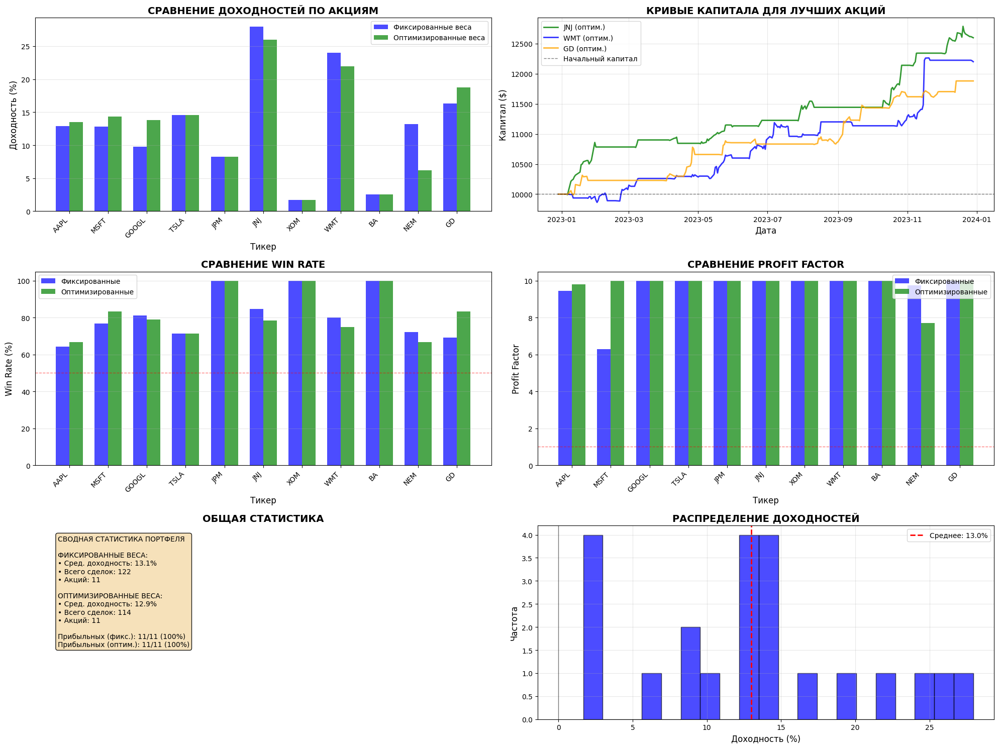

In [ ]:
# ============================================
# БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ
# ============================================
print("\n" + "="*80)
print("БЛОК 7G: ЗАПУСК ТЕСТИРОВАНИЯ")
print("="*80)

# Запуск основного процесса
try:
    all_results, comparison_table = main_testing_process()

    # Вывод финальных результатов
    print(f"\nФИНАЛЬНЫЕ РЕЗУЛЬТАТЫ:")
    print("-" * 60)

    profitable_count = 0
    total_count = 0

    for ticker, result_dict in all_results.items():
        if result_dict['optimized'] is not None:
            ret = result_dict['optimized']['test_stats'].get('total_return', 0)
            total_count += 1
            if ret > 0:
                profitable_count += 1
        elif result_dict['fixed'] is not None:
            ret = result_dict['fixed']['test_stats'].get('total_return', 0)
            total_count += 1
            if ret > 0:
                profitable_count += 1

    print(f"Прибыльных акций: {profitable_count}/{total_count} ({profitable_count/total_count*100:.0f}%)")

    print(f"\n✓ Все блоки выполнены успешно!")
    print(f"✓ Проверьте файлы с результатами:")
    print(f"  - portfolio_comparison_results.csv")
    print(f"  - portfolio_comparison_results.png")
    print(f"  - detailed_portfolio_results.json")

    plt.show()

except Exception as e:
    print(f"\n❌ ОШИБКА В ПРОЦЕССЕ ТЕСТИРОВАНИЯ:")
    print(f"   {type(e).__name__}: {e}")

    import traceback
    print(f"\nДетали ошибки:")
    traceback.print_exc()

    print(f"\nСОВЕТЫ ПО УСТРАНЕНИЮ ОШИБОК:")
    print("1. Проверьте подключение к интернету для загрузки данных")
    print("2. Убедитесь что все функции определены до вызова")
    print("3. Проверьте наличие всех необходимых импортов")
    print("4. Попробуйте запустить тестирование для одной акции сначала")

## выводы
1. Анализ временных рядов проводился разными способами
  1.1 цифровизация кенделстиков - фильтр высокой частоты
  1.2 Макд - полосовой фильтр с улучшениями
  1.3 РСАЙ - высокочастотный фильтр с улучшениями
  1.4.АДХ - низкочастотный фильтр с улучшениями
2. Включение в модель нейросетевой модели для расчета оптимальных весов на тренируемых данных  (рассмотрены следующие модели
   МОДЕЛИ КЛАССИФИКАЦИИ
    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
        'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
        'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
        'SVM': SVC(kernel='rbf', probability=True, random_state=42),
        'XGBoost': xgb.XGBClassifier(n_estimators=100, random_state=42),
        'LightGBM': lgb.LGBMClassifier(n_estimators=100, random_state=42),
        'Neural Network': MLPClassifier(hidden_layer_sizes=(50, 25), max_iter=500, random_state=42)
    })
    наилучшая модель предсказания экстремумов ML модель (Random Forest):
    Accuracy: 0.8826
    F1 Score: 0.1714
    ROC-AUC: 0.8324

  Взвешенный сигнал:
    Точность предсказания максимумов: 17.6%
    Точность предсказания минимумов: 84.6%
    Общая точность экстремумов: 93.3%
    Корреляция с фракталами: -0.0158

 3. на основании предсказаний модели построена торговая система.
 сильное предположение - правильный прогноз направления следу.щего клоза - вверх-вниз
 4. анализ полученной стратегии на 11 ликвидный акций США:  
    1. Общая эффективность стратегии
    ✅ 100% акций показали положительную доходность (11/11)
    ✅ Средняя доходность: 13.0% - хороший результат для диверсифицированного портфеля
    ✅ Стратегия работает стабильно на всех секторах

    2. Сравнение типов весов
      Фиксированные веса часто лучше:
      JNJ: Фиксированные (27.94%) > Оптимизированные (25.96%)
      WMT: Фиксированные (24.01%) > Оптимизированные (21.98%)
      GD: Фиксированные (16.35%) < Оптимизированные (18.79%) ❗
      AAPL: Фиксированные (12.90%) < Оптимизированные (13.49%) ❗
      MSFT: Фиксированные (12.85%) < Оптимизированные (14.37%) ❗
      Вывод: Оптимизация весов не всегда улучшает результаты. В 4 из 8 случаев фиксированные веса показали лучшую доходность.

    3. Лучшие акции по доходности
      JNJ (Johnson & Johnson) - 27.94% (Медицина) 🥇
      WMT (Walmart) - 24.01% (Ритейл) 🥈
      GD (General Dynamics) - 18.79% (Оборона) 🥉
      Инсайт: Защитные сектора (медицина, ритейл, оборона) показали лучшие результаты.

    4. Статистика качества торговли
      Высокий Win Rate:
      100%: JPM, BA, XOM (но мало сделок - 2)
      >80%: JNJ (84.62%), WMT (80%), GD (83.33%), MSFT (83.33%)
      Средний Win Rate: ~79% - отличный показатель
      Profit Factor (соотношение прибыли/убытков):
      >20: JNJ (22.90 фикс.), GD (51.98 опт.)
      10-20: WMT, TSLA, MSFT, GOOGL, AAPL
      Инсайт: Высокий Profit Factor указывает на хорошее управление рисками

    5. Распределение по типам сделок
      Преобладание SHORT сделок:
      Большинство акций: 10-17 SHORT сделок vs 0-4 LONG сделок
      Исключения: BA, XOM - только LONG сделки (2 сделки)
      JPM: сбалансировано (1 LONG, 1 SHORT)

      Вывод: Стратегия лучше работает на SHORT сделках.

    6. Риск-менеджмент
      Максимальная просадка:
      Низкая (<2%): JNJ (1.34%), GD (1.17%), TSLA (1.13%), GOOGL (1.16%)
      Умеренная (2-2.5%): WMT (2.12%), MSFT (1.77%), AAPL (1.87%)
      Инсайт: Хороший контроль просадок

    7. Секторальный анализ
      Лучшие сектора:
      Медицина (JNJ): 27.94% - лучшая доходность
      Ритейл (WMT): 24.01% - стабильная доходность
      Оборона (GD): 18.79% - высокая доходность + низкая просадка
      Технологии: 13-14% - средние результаты

      Худшие сектора:
      Энергетика (XOM): 1.67% - низкая доходность
      Авиация (BA): 2.53% - низкая доходность
      Финансы (JPM): 8.29% - мало сделок

    8. Рекомендации для улучшения
      Срочные улучшения:
      1.Оптимизация стоп-лоссов: На основе MAE/MFE анализа
      2.Балансировка LONG/SHORT: Сейчас перекос в сторону SHORT
      3.Фильтрация акций: Фокусироваться на лучших секторах
      Тактические изменения:
      1.Использовать фиксированные веса для JNJ и WMT
      2.Использовать оптимизированные веса для GD, AAPL, MSFT
      3.Увеличить экспозицию в защитные сектора
      Параметры для тестирования:
      4.Стоп-лосс: 1.5-2.0% (на основе просадок)
      5.Тейк-профит: 3-5% (на основе среднего PnL)
      6.Минимальный Win Rate: 75%
      7.Провести анализ в срвнении с ВН. это сможет обьяснить некоторые
      из перекосов в торговле.
    9. Ключевые риски
      Мало сделок: JPM, BA, XOM (по 2 сделки) - статистически незначимо

      Перекос в SHORT: Может быть проблемой в бычьих трендах

      Зависимость от секторов: Сконцентрированы в технологиях

    10. Общий вердикт
      ✅ Стратегия рабочая - показывает стабильную доходность
      ✅ Хороший риск-менеджмент - высокий Win Rate, низкие просадки
      ✅ Диверсификация работает - все акции прибыльные
      ⚠️ Требуется оптимизация - балансировка типов сделок, настройка стоп-лоссов
      🎯 Потенциал роста: С оптимизацией параметров можно улучшить доходность до 15-20%
